In [1]:
import tensorflow as tf
import pandas as pd
import re
import numpy as np
import matplotlib.pylab as plt
from sklearn.preprocessing import MinMaxScaler

In [2]:
from tensorflow.python.keras.models import Sequential
from tensorflow.python.keras.layers import Input, Dense,LSTM, Embedding
from tensorflow.python.keras.optimizers import RMSprop
from tensorflow.python.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard, ReduceLROnPlateau

In [3]:
path = open('/home/avinash/Winter Project/TrichyWeatherDataWindspeed/2016/csv/20162.csv')
df = pd.read_csv(path, sep=',', header=0  , index_col=False , na_values = '---' )

In [4]:
df.head(1)

,Date,Time,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Dir,Wind Run,...,In Hum,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,Wind Tx,ISS Recept,Arc. Int.
0,01-23-2016,05:01,77.9,77.9,77.9,77,70.1,1.8,WSW,0.11,...,50,67.9,93.5,9.05,1.1316,0.0,24,1,100.0,1


In [5]:
def _date_string(x):
#Convert two integers to a string for the date and time.

    date = x[0]
    date = re.sub('-' , '' , date)
    print(date)
    time = x[1]
    time = re.sub(':' , '' , time)
    print(time)

    return "{0}{1}".format(date , time)

In [6]:
datestr = df[['Date', 'Time']].apply(_date_string, axis=1)
df['DateTime'] = pd.to_datetime(datestr, format='%m%d%Y%H%M')

01232016
0501
01232016
0502
01232016
0503
01232016
0504
01232016
0505
01232016
0506
01232016
0507
01232016
0508
01232016
0509
01232016
0510
01232016
0511
01232016
0512
01232016
0513
01232016
0514
01232016
0515
01232016
0516
01232016
0517
01232016
0518
01232016
0519
01232016
0520
01232016
0521
01232016
0522
01232016
0523
01232016
0524
01232016
0525
01232016
0526
01232016
0527
01232016
0528
01232016
0529
01232016
0530
01232016
0531
01232016
0532
01232016
0533
01232016
0534
01232016
0535
01232016
0536
01232016
0537
01232016
0538
01232016
0539
01232016
0540
01232016
0541
01232016
0542
01232016
0543
01232016
0544
01232016
0545
01232016
0546
01232016
0547
01232016
0548
01232016
0549
01232016
0550
01232016
0551
01232016
0552
01232016
0553
01232016
0554
01232016
0555
01232016
0556
01232016
0557
01232016
0558
01232016
0559
01232016
0600
01232016
0601
01232016
0602
01232016
0603
01232016
0604
01232016
0605
01232016
0606
01232016
0607
01232016
0608
01232016
0609
01232016
0610
01232016
0611
012320

0948
01242016
0949
01242016
0950
01242016
0951
01242016
0952
01242016
0953
01242016
0954
01242016
0955
01242016
0956
01242016
0957
01242016
0958
01242016
0959
01242016
1000
01242016
1001
01242016
1002
01242016
1003
01242016
1004
01242016
1005
01242016
1006
01242016
1007
01242016
1008
01242016
1009
01242016
1010
01242016
1011
01242016
1012
01242016
1013
01242016
1014
01242016
1015
01242016
1016
01242016
1017
01242016
1018
01242016
1019
01242016
1020
01242016
1021
01242016
1022
01242016
1023
01242016
1024
01242016
1025
01242016
1026
01242016
1027
01242016
1028
01242016
1029
01242016
1030
01242016
1031
01242016
1032
01242016
1033
01242016
1034
01242016
1035
01242016
1036
01242016
1037
01242016
1038
01242016
1039
01242016
1040
01242016
1041
01242016
1042
01242016
1043
01242016
1044
01242016
1045
01242016
1046
01242016
1047
01242016
1048
01242016
1049
01242016
1050
01242016
1051
01242016
1052
01242016
1053
01242016
1054
01242016
1055
01242016
1056
01242016
1057
01242016
1058
01242016
1059
0

0645
01252016
0646
01252016
0647
01252016
0648
01252016
0649
01252016
0650
01252016
0651
01252016
0652
01252016
0653
01252016
0654
01252016
0655
01252016
0656
01252016
0657
01252016
0658
01252016
0659
01252016
0700
01252016
0701
01252016
0702
01252016
0703
01252016
0704
01252016
0705
01252016
0706
01252016
0707
01252016
0708
01252016
0709
01252016
0710
01252016
0711
01252016
0712
01252016
0713
01252016
0714
01252016
0715
01252016
0716
01252016
0717
01252016
0718
01252016
0719
01252016
0720
01252016
0721
01252016
0722
01252016
0723
01252016
0724
01252016
0725
01252016
0726
01252016
0727
01252016
0728
01252016
0729
01252016
0730
01252016
0731
01252016
0732
01252016
0733
01252016
0734
01252016
0735
01252016
0736
01252016
0737
01252016
0738
01252016
0739
01252016
0740
01252016
0741
01252016
0742
01252016
0743
01252016
0744
01252016
0745
01252016
0746
01252016
0747
01252016
0748
01252016
0749
01252016
0750
01252016
0751
01252016
0752
01252016
0753
01252016
0754
01252016
0755
01252016
0756
0

01262016
1155
01262016
1156
01262016
1157
01262016
1158
01262016
1159
01262016
1200
01262016
1201
01262016
1202
01262016
1203
01262016
1204
01262016
1205
01262016
1206
01262016
1207
01262016
1208
01262016
1209
01262016
1210
01262016
1211
01262016
1212
01262016
1213
01262016
1214
01262016
1215
01262016
1216
01262016
1217
01262016
1218
01262016
1219
01262016
1220
01262016
1221
01262016
1222
01262016
1223
01262016
1224
01262016
1225
01262016
1226
01262016
1227
01262016
1228
01262016
1229
01262016
1230
01262016
1231
01262016
1232
01262016
1233
01262016
1234
01262016
1235
01262016
1236
01262016
1237
01262016
1238
01262016
1239
01262016
1240
01262016
1241
01262016
1242
01262016
1243
01262016
1244
01262016
1245
01262016
1246
01262016
1247
01262016
1248
01262016
1249
01262016
1250
01262016
1251
01262016
1252
01262016
1253
01262016
1254
01262016
1255
01262016
1256
01262016
1257
01262016
1258
01262016
1259
01262016
1300
01262016
1301
01262016
1302
01262016
1303
01262016
1304
01262016
1305
012620

01272016
1248
01272016
1249
01272016
1250
01272016
1251
01272016
1252
01272016
1253
01272016
1254
01272016
1255
01272016
1256
01272016
1257
01272016
1258
01272016
1259
01272016
1300
01272016
1301
01272016
1302
01272016
1303
01272016
1304
01272016
1305
01272016
1306
01272016
1307
01272016
1308
01272016
1309
01272016
1310
01272016
1311
01272016
1312
01272016
1313
01272016
1314
01272016
1315
01272016
1316
01272016
1317
01272016
1318
01272016
1319
01272016
1320
01272016
1321
01272016
1322
01272016
1323
01272016
1324
01272016
1325
01272016
1326
01272016
1327
01272016
1328
01272016
1329
01272016
1330
01272016
1331
01272016
1332
01272016
1333
01272016
1334
01272016
1335
01272016
1336
01272016
1337
01272016
1338
01272016
1339
01272016
1340
01272016
1341
01272016
1342
01272016
1343
01272016
1344
01272016
1345
01272016
1346
01272016
1347
01272016
1348
01272016
1349
01272016
1350
01272016
1351
01272016
1352
01272016
1353
01272016
1354
01272016
1355
01272016
1356
01272016
1357
01272016
1358
012720

0724
01282016
0725
01282016
0726
01282016
0727
01282016
0728
01282016
0729
01282016
0730
01282016
0731
01282016
0732
01282016
0733
01282016
0734
01282016
0735
01282016
0736
01282016
0737
01282016
0738
01282016
0739
01282016
0740
01282016
0741
01282016
0742
01282016
0743
01282016
0744
01282016
0745
01282016
0746
01282016
0747
01282016
0748
01282016
0749
01282016
0750
01282016
0751
01282016
0752
01282016
0753
01282016
0754
01282016
0755
01282016
0756
01282016
0757
01282016
0758
01282016
0759
01282016
0800
01282016
0801
01282016
0802
01282016
0803
01282016
0804
01282016
0805
01282016
0806
01282016
0807
01282016
0808
01282016
0809
01282016
0810
01282016
0811
01282016
0812
01282016
0813
01282016
0814
01282016
0815
01282016
0816
01282016
0817
01282016
0818
01282016
0819
01282016
0820
01282016
0821
01282016
0822
01282016
0823
01282016
0824
01282016
0825
01282016
0826
01282016
0827
01282016
0828
01282016
0829
01282016
0830
01282016
0831
01282016
0832
01282016
0833
01282016
0834
01282016
0835
0

01292016
0404
01292016
0405
01292016
0406
01292016
0407
01292016
0408
01292016
0409
01292016
0410
01292016
0411
01292016
0412
01292016
0413
01292016
0414
01292016
0415
01292016
0416
01292016
0417
01292016
0418
01292016
0419
01292016
0420
01292016
0421
01292016
0422
01292016
0423
01292016
0424
01292016
0425
01292016
0426
01292016
0427
01292016
0428
01292016
0429
01292016
0430
01292016
0431
01292016
0432
01292016
0433
01292016
0434
01292016
0435
01292016
0436
01292016
0437
01292016
0438
01292016
0439
01292016
0440
01292016
0441
01292016
0442
01292016
0443
01292016
0444
01292016
0445
01292016
0446
01292016
0447
01292016
0448
01292016
0449
01292016
0450
01292016
0451
01292016
0452
01292016
0453
01292016
0454
01292016
0455
01292016
0456
01292016
0457
01292016
0458
01292016
0459
01292016
0500
01292016
0501
01292016
0502
01292016
0503
01292016
0504
01292016
0505
01292016
0506
01292016
0507
01292016
0508
01292016
0509
01292016
0510
01292016
0511
01292016
0512
01292016
0513
01292016
0514
012920

0248
01302016
0249
01302016
0250
01302016
0251
01302016
0252
01302016
0253
01302016
0254
01302016
0255
01302016
0256
01302016
0257
01302016
0258
01302016
0259
01302016
0300
01302016
0301
01302016
0302
01302016
0303
01302016
0304
01302016
0305
01302016
0306
01302016
0307
01302016
0308
01302016
0309
01302016
0310
01302016
0311
01302016
0312
01302016
0313
01302016
0314
01302016
0315
01302016
0316
01302016
0317
01302016
0318
01302016
0319
01302016
0320
01302016
0321
01302016
0322
01302016
0323
01302016
0324
01302016
0325
01302016
0326
01302016
0327
01302016
0328
01302016
0329
01302016
0330
01302016
0331
01302016
0332
01302016
0333
01302016
0334
01302016
0335
01302016
0336
01302016
0337
01302016
0338
01302016
0339
01302016
0340
01302016
0341
01302016
0342
01302016
0343
01302016
0344
01302016
0345
01302016
0346
01302016
0347
01302016
0348
01302016
0349
01302016
0350
01302016
0351
01302016
0352
01302016
0353
01302016
0354
01302016
0355
01302016
0356
01302016
0357
01302016
0358
01302016
0359
0

01312016
0204
01312016
0205
01312016
0206
01312016
0207
01312016
0208
01312016
0209
01312016
0210
01312016
0211
01312016
0212
01312016
0213
01312016
0214
01312016
0215
01312016
0216
01312016
0217
01312016
0218
01312016
0219
01312016
0220
01312016
0221
01312016
0222
01312016
0223
01312016
0224
01312016
0225
01312016
0226
01312016
0227
01312016
0228
01312016
0229
01312016
0230
01312016
0231
01312016
0232
01312016
0233
01312016
0234
01312016
0235
01312016
0236
01312016
0237
01312016
0238
01312016
0239
01312016
0240
01312016
0241
01312016
0242
01312016
0243
01312016
0244
01312016
0245
01312016
0246
01312016
0247
01312016
0248
01312016
0249
01312016
0250
01312016
0251
01312016
0252
01312016
0253
01312016
0254
01312016
0255
01312016
0256
01312016
0257
01312016
0258
01312016
0259
01312016
0300
01312016
0301
01312016
0302
01312016
0303
01312016
0304
01312016
0305
01312016
0306
01312016
0307
01312016
0308
01312016
0309
01312016
0310
01312016
0311
01312016
0312
01312016
0313
01312016
0314
013120

02012016
0114
02012016
0115
02012016
0116
02012016
0117
02012016
0118
02012016
0119
02012016
0120
02012016
0121
02012016
0122
02012016
0123
02012016
0124
02012016
0125
02012016
0126
02012016
0127
02012016
0128
02012016
0129
02012016
0130
02012016
0131
02012016
0132
02012016
0133
02012016
0134
02012016
0135
02012016
0136
02012016
0137
02012016
0138
02012016
0139
02012016
0140
02012016
0141
02012016
0142
02012016
0143
02012016
0144
02012016
0145
02012016
0146
02012016
0147
02012016
0148
02012016
0149
02012016
0150
02012016
0151
02012016
0152
02012016
0153
02012016
0154
02012016
0155
02012016
0156
02012016
0157
02012016
0158
02012016
0159
02012016
0200
02012016
0201
02012016
0202
02012016
0203
02012016
0204
02012016
0205
02012016
0206
02012016
0207
02012016
0208
02012016
0209
02012016
0210
02012016
0211
02012016
0212
02012016
0213
02012016
0214
02012016
0215
02012016
0216
02012016
0217
02012016
0218
02012016
0219
02012016
0220
02012016
0221
02012016
0222
02012016
0223
02012016
0224
020120

0623
02022016
0624
02022016
0625
02022016
0626
02022016
0627
02022016
0628
02022016
0629
02022016
0630
02022016
0631
02022016
0632
02022016
0633
02022016
0634
02022016
0635
02022016
0636
02022016
0637
02022016
0638
02022016
0639
02022016
0640
02022016
0641
02022016
0642
02022016
0643
02022016
0644
02022016
0645
02022016
0646
02022016
0647
02022016
0648
02022016
0649
02022016
0650
02022016
0651
02022016
0652
02022016
0653
02022016
0654
02022016
0655
02022016
0656
02022016
0657
02022016
0658
02022016
0659
02022016
0700
02022016
0701
02022016
0702
02022016
0703
02022016
0704
02022016
0705
02022016
0706
02022016
0707
02022016
0708
02022016
0709
02022016
0710
02022016
0711
02022016
0712
02022016
0713
02022016
0714
02022016
0715
02022016
0716
02022016
0717
02022016
0718
02022016
0719
02022016
0720
02022016
0721
02022016
0722
02022016
0723
02022016
0724
02022016
0725
02022016
0726
02022016
0727
02022016
0728
02022016
0729
02022016
0730
02022016
0731
02022016
0732
02022016
0733
02022016
0734
0

02032016
0926
02032016
0927
02032016
0928
02032016
0929
02032016
0930
02032016
0931
02032016
0932
02032016
0933
02032016
0934
02032016
0935
02032016
0936
02032016
0937
02032016
0938
02032016
0939
02032016
0940
02032016
0941
02032016
0942
02032016
0943
02032016
0944
02032016
0945
02032016
0946
02032016
0947
02032016
0948
02032016
0949
02032016
0950
02032016
0951
02032016
0952
02032016
0953
02032016
0954
02032016
0955
02032016
0956
02032016
0957
02032016
0958
02032016
0959
02032016
1000
02032016
1001
02032016
1002
02032016
1003
02032016
1004
02032016
1005
02032016
1006
02032016
1007
02032016
1008
02032016
1009
02032016
1010
02032016
1011
02032016
1012
02032016
1013
02032016
1014
02032016
1015
02032016
1016
02032016
1017
02032016
1018
02032016
1019
02032016
1020
02032016
1021
02032016
1022
02032016
1023
02032016
1024
02032016
1025
02032016
1026
02032016
1027
02032016
1028
02032016
1029
02032016
1030
02032016
1031
02032016
1032
02032016
1033
02032016
1034
02032016
1035
02032016
1036
020320

02042016
1149
02042016
1150
02042016
1151
02042016
1152
02042016
1153
02042016
1154
02042016
1155
02042016
1156
02042016
1157
02042016
1158
02042016
1159
02042016
1200
02042016
1201
02042016
1202
02042016
1203
02042016
1204
02042016
1205
02042016
1206
02042016
1207
02042016
1208
02042016
1209
02042016
1210
02042016
1211
02042016
1212
02042016
1213
02042016
1214
02042016
1215
02042016
1216
02042016
1217
02042016
1218
02042016
1219
02042016
1220
02042016
1221
02042016
1222
02042016
1223
02042016
1224
02042016
1225
02042016
1226
02042016
1227
02042016
1228
02042016
1229
02042016
1230
02042016
1231
02042016
1232
02042016
1233
02042016
1234
02042016
1235
02042016
1236
02042016
1237
02042016
1238
02042016
1239
02042016
1240
02042016
1241
02042016
1242
02042016
1243
02042016
1244
02042016
1245
02042016
1246
02042016
1247
02042016
1248
02042016
1249
02042016
1250
02042016
1251
02042016
1252
02042016
1253
02042016
1254
02042016
1255
02042016
1256
02042016
1257
02042016
1258
02042016
1259
020420

02052016
0655
02052016
0656
02052016
0657
02052016
0658
02052016
0659
02052016
0700
02052016
0701
02052016
0702
02052016
0703
02052016
0704
02052016
0705
02052016
0706
02052016
0707
02052016
0708
02052016
0709
02052016
0710
02052016
0711
02052016
0712
02052016
0713
02052016
0714
02052016
0715
02052016
0716
02052016
0717
02052016
0718
02052016
0719
02052016
0720
02052016
0721
02052016
0722
02052016
0723
02052016
0724
02052016
0725
02052016
0726
02052016
0727
02052016
0728
02052016
0729
02052016
0730
02052016
0731
02052016
0732
02052016
0733
02052016
0734
02052016
0735
02052016
0736
02052016
0737
02052016
0738
02052016
0739
02052016
0740
02052016
0741
02052016
0742
02052016
0743
02052016
0744
02052016
0745
02052016
0746
02052016
0747
02052016
0748
02052016
0749
02052016
0750
02052016
0751
02052016
0752
02052016
0753
02052016
0754
02052016
0755
02052016
0756
02052016
0757
02052016
0758
02052016
0759
02052016
0800
02052016
0801
02052016
0802
02052016
0803
02052016
0804
02052016
0805
020520

1022
02062016
1023
02062016
1024
02062016
1025
02062016
1026
02062016
1027
02062016
1028
02062016
1029
02062016
1030
02062016
1031
02062016
1032
02062016
1033
02062016
1034
02062016
1035
02062016
1036
02062016
1037
02062016
1038
02062016
1039
02062016
1040
02062016
1041
02062016
1042
02062016
1043
02062016
1044
02062016
1045
02062016
1046
02062016
1047
02062016
1048
02062016
1049
02062016
1050
02062016
1051
02062016
1052
02062016
1053
02062016
1054
02062016
1055
02062016
1056
02062016
1057
02062016
1058
02062016
1059
02062016
1100
02062016
1101
02062016
1102
02062016
1103
02062016
1104
02062016
1105
02062016
1106
02062016
1107
02062016
1108
02062016
1109
02062016
1110
02062016
1111
02062016
1112
02062016
1113
02062016
1114
02062016
1115
02062016
1116
02062016
1117
02062016
1118
02062016
1119
02062016
1120
02062016
1121
02062016
1122
02062016
1123
02062016
1124
02062016
1125
02062016
1126
02062016
1127
02062016
1128
02062016
1129
02062016
1130
02062016
1131
02062016
1132
02062016
1133
0

0928
02072016
0929
02072016
0930
02072016
0931
02072016
0932
02072016
0933
02072016
0934
02072016
0935
02072016
0936
02072016
0937
02072016
0938
02072016
0939
02072016
0940
02072016
0941
02072016
0942
02072016
0943
02072016
0944
02072016
0945
02072016
0946
02072016
0947
02072016
0948
02072016
0949
02072016
0950
02072016
0951
02072016
0952
02072016
0953
02072016
0954
02072016
0955
02072016
0956
02072016
0957
02072016
0958
02072016
0959
02072016
1000
02072016
1001
02072016
1002
02072016
1003
02072016
1004
02072016
1005
02072016
1006
02072016
1007
02072016
1008
02072016
1009
02072016
1010
02072016
1011
02072016
1012
02072016
1013
02072016
1014
02072016
1015
02072016
1016
02072016
1017
02072016
1018
02072016
1019
02072016
1020
02072016
1021
02072016
1022
02072016
1023
02072016
1024
02072016
1025
02072016
1026
02072016
1027
02072016
1028
02072016
1029
02072016
1030
02072016
1031
02072016
1032
02072016
1033
02072016
1034
02072016
1035
02072016
1036
02072016
1037
02072016
1038
02072016
1039
0

02082016
1222
02082016
1223
02082016
1224
02082016
1225
02082016
1226
02082016
1227
02082016
1228
02082016
1229
02082016
1230
02082016
1231
02082016
1232
02082016
1233
02082016
1234
02082016
1235
02082016
1236
02082016
1237
02082016
1238
02082016
1239
02082016
1240
02082016
1241
02082016
1242
02082016
1243
02082016
1244
02082016
1245
02082016
1246
02082016
1247
02082016
1248
02082016
1249
02082016
1250
02082016
1251
02082016
1252
02082016
1253
02082016
1254
02082016
1255
02082016
1256
02082016
1257
02082016
1258
02082016
1259
02082016
1300
02082016
1301
02082016
1302
02082016
1303
02082016
1304
02082016
1305
02082016
1306
02082016
1307
02082016
1308
02082016
1309
02082016
1310
02082016
1311
02082016
1312
02082016
1313
02082016
1314
02082016
1315
02082016
1316
02082016
1317
02082016
1318
02082016
1319
02082016
1320
02082016
1321
02082016
1322
02082016
1323
02082016
1324
02082016
1325
02082016
1326
02082016
1327
02082016
1328
02082016
1329
02082016
1330
02082016
1331
02082016
1332
020820

02092016
1936
02092016
1937
02092016
1938
02092016
1939
02092016
1940
02092016
1941
02092016
1942
02092016
1943
02092016
1944
02092016
1945
02092016
1946
02092016
1947
02092016
1948
02092016
1949
02092016
1950
02092016
1951
02092016
1952
02092016
1953
02092016
1954
02092016
1955
02092016
1956
02092016
1957
02092016
1958
02092016
1959
02092016
2000
02092016
2001
02092016
2002
02092016
2003
02092016
2004
02092016
2005
02092016
2006
02092016
2007
02092016
2008
02092016
2009
02092016
2010
02092016
2011
02092016
2012
02092016
2013
02092016
2014
02092016
2015
02092016
2016
02092016
2017
02092016
2018
02092016
2019
02092016
2020
02092016
2021
02092016
2022
02092016
2023
02092016
2024
02092016
2025
02092016
2026
02092016
2027
02092016
2028
02092016
2029
02092016
2030
02092016
2031
02092016
2032
02092016
2033
02092016
2034
02092016
2035
02092016
2036
02092016
2037
02092016
2038
02092016
2039
02092016
2040
02092016
2041
02092016
2042
02092016
2043
02092016
2044
02092016
2045
02092016
2046
020920

1831
02102016
1832
02102016
1833
02102016
1834
02102016
1835
02102016
1836
02102016
1837
02102016
1838
02102016
1839
02102016
1840
02102016
1841
02102016
1842
02102016
1843
02102016
1844
02102016
1845
02102016
1846
02102016
1847
02102016
1848
02102016
1849
02102016
1850
02102016
1851
02102016
1852
02102016
1853
02102016
1854
02102016
1855
02102016
1856
02102016
1857
02102016
1858
02102016
1859
02102016
1900
02102016
1901
02102016
1902
02102016
1903
02102016
1904
02102016
1905
02102016
1906
02102016
1907
02102016
1908
02102016
1909
02102016
1910
02102016
1911
02102016
1912
02102016
1913
02102016
1914
02102016
1915
02102016
1916
02102016
1917
02102016
1918
02102016
1919
02102016
1920
02102016
1921
02102016
1922
02102016
1923
02102016
1924
02102016
1925
02102016
1926
02102016
1927
02102016
1928
02102016
1929
02102016
1930
02102016
1931
02102016
1932
02102016
1933
02102016
1934
02102016
1935
02102016
1936
02102016
1937
02102016
1938
02102016
1939
02102016
1940
02102016
1941
02102016
1942
0

1602
02112016
1603
02112016
1604
02112016
1605
02112016
1606
02112016
1607
02112016
1608
02112016
1609
02112016
1610
02112016
1611
02112016
1612
02112016
1613
02112016
1614
02112016
1615
02112016
1616
02112016
1617
02112016
1618
02112016
1619
02112016
1620
02112016
1621
02112016
1622
02112016
1623
02112016
1624
02112016
1625
02112016
1626
02112016
1627
02112016
1628
02112016
1629
02112016
1630
02112016
1631
02112016
1632
02112016
1633
02112016
1634
02112016
1635
02112016
1636
02112016
1637
02112016
1638
02112016
1639
02112016
1640
02112016
1641
02112016
1642
02112016
1643
02112016
1644
02112016
1645
02112016
1646
02112016
1647
02112016
1648
02112016
1649
02112016
1650
02112016
1651
02112016
1652
02112016
1653
02112016
1654
02112016
1655
02112016
1656
02112016
1657
02112016
1658
02112016
1659
02112016
1700
02112016
1701
02112016
1702
02112016
1703
02112016
1704
02112016
1705
02112016
1706
02112016
1707
02112016
1708
02112016
1709
02112016
1710
02112016
1711
02112016
1712
02112016
1713
0

02122016
2031
02122016
2032
02122016
2033
02122016
2034
02122016
2035
02122016
2036
02122016
2037
02122016
2038
02122016
2039
02122016
2040
02122016
2041
02122016
2042
02122016
2043
02122016
2044
02122016
2045
02122016
2046
02122016
2047
02122016
2048
02122016
2049
02122016
2050
02122016
2051
02122016
2052
02122016
2053
02122016
2054
02122016
2055
02122016
2056
02122016
2057
02122016
2058
02122016
2059
02122016
2100
02122016
2101
02122016
2102
02122016
2103
02122016
2104
02122016
2105
02122016
2106
02122016
2107
02122016
2108
02122016
2109
02122016
2110
02122016
2111
02122016
2112
02122016
2113
02122016
2114
02122016
2115
02122016
2116
02122016
2117
02122016
2118
02122016
2119
02122016
2120
02122016
2121
02122016
2122
02122016
2123
02122016
2124
02122016
2125
02122016
2126
02122016
2127
02122016
2128
02122016
2129
02122016
2130
02122016
2131
02122016
2132
02122016
2133
02122016
2134
02122016
2135
02122016
2136
02122016
2137
02122016
2138
02122016
2139
02122016
2140
02122016
2141
021220

0140
02142016
0141
02142016
0142
02142016
0143
02142016
0144
02142016
0145
02142016
0146
02142016
0147
02142016
0148
02142016
0149
02142016
0150
02142016
0151
02142016
0152
02142016
0153
02142016
0154
02142016
0155
02142016
0156
02142016
0157
02142016
0158
02142016
0159
02142016
0200
02142016
0201
02142016
0202
02142016
0203
02142016
0204
02142016
0205
02142016
0206
02142016
0207
02142016
0208
02142016
0209
02142016
0210
02142016
0211
02142016
0212
02142016
0213
02142016
0214
02142016
0215
02142016
0216
02142016
0217
02142016
0218
02142016
0219
02142016
0220
02142016
0221
02142016
0222
02142016
0223
02142016
0224
02142016
0225
02142016
0226
02142016
0227
02142016
0228
02142016
0229
02142016
0230
02142016
0231
02142016
0232
02142016
0233
02142016
0234
02142016
0235
02142016
0236
02142016
0237
02142016
0238
02142016
0239
02142016
0240
02142016
0241
02142016
0242
02142016
0243
02142016
0244
02142016
0245
02142016
0246
02142016
0247
02142016
0248
02142016
0249
02142016
0250
02142016
0251
0

0650
02152016
0651
02152016
0652
02152016
0653
02152016
0654
02152016
0655
02152016
0656
02152016
0657
02152016
0658
02152016
0659
02152016
0700
02152016
0701
02152016
0702
02152016
0703
02152016
0704
02152016
0705
02152016
0706
02152016
0707
02152016
0708
02152016
0709
02152016
0710
02152016
0711
02152016
0712
02152016
0713
02152016
0714
02152016
0715
02152016
0716
02152016
0717
02152016
0718
02152016
0719
02152016
0720
02152016
0721
02152016
0722
02152016
0723
02152016
0724
02152016
0725
02152016
0726
02152016
0727
02152016
0728
02152016
0729
02152016
0730
02152016
0731
02152016
0732
02152016
0733
02152016
0734
02152016
0735
02152016
0736
02152016
0737
02152016
0738
02152016
0739
02152016
0740
02152016
0741
02152016
0742
02152016
0743
02152016
0744
02152016
0745
02152016
0746
02152016
0747
02152016
0748
02152016
0749
02152016
0750
02152016
0751
02152016
0752
02152016
0753
02152016
0754
02152016
0755
02152016
0756
02152016
0757
02152016
0758
02152016
0759
02152016
0800
02152016
0801
0

02162016
1200
02162016
1201
02162016
1202
02162016
1203
02162016
1204
02162016
1205
02162016
1206
02162016
1207
02162016
1208
02162016
1209
02162016
1210
02162016
1211
02162016
1212
02162016
1213
02162016
1214
02162016
1215
02162016
1216
02162016
1217
02162016
1218
02162016
1219
02162016
1220
02162016
1221
02162016
1222
02162016
1223
02162016
1224
02162016
1225
02162016
1226
02162016
1227
02162016
1228
02162016
1229
02162016
1230
02162016
1231
02162016
1232
02162016
1233
02162016
1234
02162016
1235
02162016
1236
02162016
1237
02162016
1238
02162016
1239
02162016
1240
02162016
1241
02162016
1242
02162016
1243
02162016
1244
02162016
1245
02162016
1246
02162016
1247
02162016
1248
02162016
1249
02162016
1250
02162016
1251
02162016
1252
02162016
1253
02162016
1254
02162016
1255
02162016
1256
02162016
1257
02162016
1258
02162016
1259
02162016
1300
02162016
1301
02162016
1302
02162016
1303
02162016
1304
02162016
1305
02162016
1306
02162016
1307
02162016
1308
02162016
1309
02162016
1310
021620

02172016
1150
02172016
1151
02172016
1152
02172016
1153
02172016
1154
02172016
1155
02172016
1156
02172016
1157
02172016
1158
02172016
1159
02172016
1200
02172016
1201
02172016
1202
02172016
1203
02172016
1204
02172016
1205
02172016
1206
02172016
1207
02172016
1208
02172016
1209
02172016
1210
02172016
1211
02172016
1212
02172016
1213
02172016
1214
02172016
1215
02172016
1216
02172016
1217
02172016
1218
02172016
1219
02172016
1220
02172016
1221
02172016
1222
02172016
1223
02172016
1224
02172016
1225
02172016
1226
02172016
1227
02172016
1228
02172016
1229
02172016
1230
02172016
1231
02172016
1232
02172016
1233
02172016
1234
02172016
1235
02172016
1236
02172016
1237
02172016
1238
02172016
1239
02172016
1240
02172016
1241
02172016
1242
02172016
1243
02172016
1244
02172016
1245
02172016
1246
02172016
1247
02172016
1248
02172016
1249
02172016
1250
02172016
1251
02172016
1252
02172016
1253
02172016
1254
02172016
1255
02172016
1256
02172016
1257
02172016
1258
02172016
1259
02172016
1300
021720

1135
02182016
1136
02182016
1137
02182016
1138
02182016
1139
02182016
1140
02182016
1141
02182016
1142
02182016
1143
02182016
1144
02182016
1145
02182016
1146
02182016
1147
02182016
1148
02182016
1149
02182016
1150
02182016
1151
02182016
1152
02182016
1153
02182016
1154
02182016
1155
02182016
1156
02182016
1157
02182016
1158
02182016
1159
02182016
1200
02182016
1201
02182016
1202
02182016
1203
02182016
1204
02182016
1205
02182016
1206
02182016
1207
02182016
1208
02182016
1209
02182016
1210
02182016
1211
02182016
1212
02182016
1213
02182016
1214
02182016
1215
02182016
1216
02182016
1217
02182016
1218
02182016
1219
02182016
1220
02182016
1221
02182016
1222
02182016
1223
02182016
1224
02182016
1225
02182016
1226
02182016
1227
02182016
1228
02182016
1229
02182016
1230
02182016
1231
02182016
1232
02182016
1233
02182016
1234
02182016
1235
02182016
1236
02182016
1237
02182016
1238
02182016
1239
02182016
1240
02182016
1241
02182016
1242
02182016
1243
02182016
1244
02182016
1245
02182016
1246
0

1221
02192016
1222
02192016
1223
02192016
1224
02192016
1225
02192016
1226
02192016
1227
02192016
1228
02192016
1229
02192016
1230
02192016
1231
02192016
1232
02192016
1233
02192016
1234
02192016
1235
02192016
1236
02192016
1237
02192016
1238
02192016
1239
02192016
1240
02192016
1241
02192016
1242
02192016
1243
02192016
1244
02192016
1245
02192016
1246
02192016
1247
02192016
1248
02192016
1249
02192016
1250
02192016
1251
02192016
1252
02192016
1253
02192016
1254
02192016
1255
02192016
1256
02192016
1257
02192016
1258
02192016
1259
02192016
1300
02192016
1301
02192016
1302
02192016
1303
02192016
1304
02192016
1305
02192016
1306
02192016
1307
02192016
1308
02192016
1309
02192016
1310
02192016
1311
02192016
1312
02192016
1313
02192016
1314
02192016
1315
02192016
1316
02192016
1317
02192016
1318
02192016
1319
02192016
1320
02192016
1321
02192016
1322
02192016
1323
02192016
1324
02192016
1325
02192016
1326
02192016
1327
02192016
1328
02192016
1329
02192016
1330
02192016
1331
02192016
1332
0

0830
02202016
0831
02202016
0832
02202016
0833
02202016
0834
02202016
0835
02202016
0836
02202016
0837
02202016
0838
02202016
0839
02202016
0840
02202016
0841
02202016
0842
02202016
0843
02202016
0844
02202016
0845
02202016
0846
02202016
0847
02202016
0848
02202016
0849
02202016
0850
02202016
0851
02202016
0852
02202016
0853
02202016
0854
02202016
0855
02202016
0856
02202016
0857
02202016
0858
02202016
0859
02202016
0900
02202016
0901
02202016
0902
02202016
0903
02202016
0904
02202016
0905
02202016
0906
02202016
0907
02202016
0908
02202016
0909
02202016
0910
02202016
0911
02202016
0912
02202016
0913
02202016
0914
02202016
0915
02202016
0916
02202016
0917
02202016
0918
02202016
0919
02202016
0920
02202016
0921
02202016
0922
02202016
0923
02202016
0924
02202016
0925
02202016
0926
02202016
0927
02202016
0928
02202016
0929
02202016
0930
02202016
0931
02202016
0932
02202016
0933
02202016
0934
02202016
0935
02202016
0936
02202016
0937
02202016
0938
02202016
0939
02202016
0940
02202016
0941
0

02212016
0839
02212016
0840
02212016
0841
02212016
0842
02212016
0843
02212016
0844
02212016
0845
02212016
0846
02212016
0847
02212016
0848
02212016
0849
02212016
0850
02212016
0851
02212016
0852
02212016
0853
02212016
0854
02212016
0855
02212016
0856
02212016
0857
02212016
0858
02212016
0859
02212016
0900
02212016
0901
02212016
0902
02212016
0903
02212016
0904
02212016
0905
02212016
0906
02212016
0907
02212016
0908
02212016
0909
02212016
0910
02212016
0911
02212016
0912
02212016
0913
02212016
0914
02212016
0915
02212016
0916
02212016
0917
02212016
0918
02212016
0919
02212016
0920
02212016
0921
02212016
0922
02212016
0923
02212016
0924
02212016
0925
02212016
0926
02212016
0927
02212016
0928
02212016
0929
02212016
0930
02212016
0931
02212016
0932
02212016
0933
02212016
0934
02212016
0935
02212016
0936
02212016
0937
02212016
0938
02212016
0939
02212016
0940
02212016
0941
02212016
0942
02212016
0943
02212016
0944
02212016
0945
02212016
0946
02212016
0947
02212016
0948
02212016
0949
022120

0938
02222016
0939
02222016
0940
02222016
0941
02222016
0942
02222016
0943
02222016
0944
02222016
0945
02222016
0946
02222016
0947
02222016
0948
02222016
0949
02222016
0950
02222016
0951
02222016
0952
02222016
0953
02222016
0954
02222016
0955
02222016
0956
02222016
0957
02222016
0958
02222016
0959
02222016
1000
02222016
1001
02222016
1002
02222016
1003
02222016
1004
02222016
1005
02222016
1006
02222016
1007
02222016
1008
02222016
1009
02222016
1010
02222016
1011
02222016
1012
02222016
1013
02222016
1014
02222016
1015
02222016
1016
02222016
1017
02222016
1018
02222016
1019
02222016
1020
02222016
1021
02222016
1022
02222016
1023
02222016
1024
02222016
1025
02222016
1026
02222016
1027
02222016
1028
02222016
1029
02222016
1030
02222016
1031
02222016
1032
02222016
1033
02222016
1034
02222016
1035
02222016
1036
02222016
1037
02222016
1038
02222016
1039
02222016
1040
02222016
1041
02222016
1042
02222016
1043
02222016
1044
02222016
1045
02222016
1046
02222016
1047
02222016
1048
02222016
1049
0

1038
02232016
1039
02232016
1040
02232016
1041
02232016
1042
02232016
1043
02232016
1044
02232016
1045
02232016
1046
02232016
1047
02232016
1048
02232016
1049
02232016
1050
02232016
1051
02232016
1052
02232016
1053
02232016
1054
02232016
1055
02232016
1056
02232016
1057
02232016
1058
02232016
1059
02232016
1100
02232016
1101
02232016
1102
02232016
1103
02232016
1104
02232016
1105
02232016
1106
02232016
1107
02232016
1108
02232016
1109
02232016
1110
02232016
1111
02232016
1112
02232016
1113
02232016
1114
02232016
1115
02232016
1116
02232016
1117
02232016
1118
02232016
1119
02232016
1120
02232016
1121
02232016
1122
02232016
1123
02232016
1124
02232016
1125
02232016
1126
02232016
1127
02232016
1128
02232016
1129
02232016
1130
02232016
1131
02232016
1132
02232016
1133
02232016
1134
02232016
1135
02232016
1136
02232016
1137
02232016
1138
02232016
1139
02232016
1140
02232016
1141
02232016
1142
02232016
1143
02232016
1144
02232016
1145
02232016
1146
02232016
1147
02232016
1148
02232016
1149
0

02242016
1138
02242016
1139
02242016
1140
02242016
1141
02242016
1142
02242016
1143
02242016
1144
02242016
1145
02242016
1146
02242016
1147
02242016
1148
02242016
1149
02242016
1150
02242016
1151
02242016
1152
02242016
1153
02242016
1154
02242016
1155
02242016
1156
02242016
1157
02242016
1158
02242016
1159
02242016
1200
02242016
1201
02242016
1202
02242016
1203
02242016
1204
02242016
1205
02242016
1206
02242016
1207
02242016
1208
02242016
1209
02242016
1210
02242016
1211
02242016
1212
02242016
1213
02242016
1214
02242016
1215
02242016
1216
02242016
1217
02242016
1218
02242016
1219
02242016
1220
02242016
1221
02242016
1222
02242016
1223
02242016
1224
02242016
1225
02242016
1226
02242016
1227
02242016
1228
02242016
1229
02242016
1230
02242016
1231
02242016
1232
02242016
1233
02242016
1234
02242016
1235
02242016
1236
02242016
1237
02242016
1238
02242016
1239
02242016
1240
02242016
1241
02242016
1242
02242016
1243
02242016
1244
02242016
1245
02242016
1246
02242016
1247
02242016
1248
022420

02252016
1648
02252016
1649
02252016
1650
02252016
1651
02252016
1652
02252016
1653
02252016
1654
02252016
1655
02252016
1656
02252016
1657
02252016
1658
02252016
1659
02252016
1700
02252016
1701
02252016
1702
02252016
1703
02252016
1704
02252016
1705
02252016
1706
02252016
1707
02252016
1708
02252016
1709
02252016
1710
02252016
1711
02252016
1712
02252016
1713
02252016
1714
02252016
1715
02252016
1716
02252016
1717
02252016
1718
02252016
1719
02252016
1720
02252016
1721
02252016
1722
02252016
1723
02252016
1724
02252016
1725
02252016
1726
02252016
1727
02252016
1728
02252016
1729
02252016
1730
02252016
1731
02252016
1732
02252016
1733
02252016
1734
02252016
1735
02252016
1736
02252016
1737
02252016
1738
02252016
1739
02252016
1740
02252016
1741
02252016
1742
02252016
1743
02252016
1744
02252016
1745
02252016
1746
02252016
1747
02252016
1748
02252016
1749
02252016
1750
02252016
1751
02252016
1752
02252016
1753
02252016
1754
02252016
1755
02252016
1756
02252016
1757
02252016
1758
022520

2157
02262016
2158
02262016
2159
02262016
2200
02262016
2201
02262016
2202
02262016
2203
02262016
2204
02262016
2205
02262016
2206
02262016
2207
02262016
2208
02262016
2209
02262016
2210
02262016
2211
02262016
2212
02262016
2213
02262016
2214
02262016
2215
02262016
2216
02262016
2217
02262016
2218
02262016
2219
02262016
2220
02262016
2221
02262016
2222
02262016
2223
02262016
2224
02262016
2225
02262016
2226
02262016
2227
02262016
2228
02262016
2229
02262016
2230
02262016
2231
02262016
2232
02262016
2233
02262016
2234
02262016
2235
02262016
2236
02262016
2237
02262016
2238
02262016
2239
02262016
2240
02262016
2241
02262016
2242
02262016
2243
02262016
2244
02262016
2245
02262016
2246
02262016
2247
02262016
2248
02262016
2249
02262016
2250
02262016
2251
02262016
2252
02262016
2253
02262016
2254
02262016
2255
02262016
2256
02262016
2257
02262016
2258
02262016
2259
02262016
2300
02262016
2301
02262016
2302
02262016
2303
02262016
2304
02262016
2305
02262016
2306
02262016
2307
02262016
2308
0

0307
02282016
0308
02282016
0309
02282016
0310
02282016
0311
02282016
0312
02282016
0313
02282016
0314
02282016
0315
02282016
0316
02282016
0317
02282016
0318
02282016
0319
02282016
0320
02282016
0321
02282016
0322
02282016
0323
02282016
0324
02282016
0325
02282016
0326
02282016
0327
02282016
0328
02282016
0329
02282016
0330
02282016
0331
02282016
0332
02282016
0333
02282016
0334
02282016
0335
02282016
0336
02282016
0337
02282016
0338
02282016
0339
02282016
0340
02282016
0341
02282016
0342
02282016
0343
02282016
0344
02282016
0345
02282016
0346
02282016
0347
02282016
0348
02282016
0349
02282016
0350
02282016
0351
02282016
0352
02282016
0353
02282016
0354
02282016
0355
02282016
0356
02282016
0357
02282016
0358
02282016
0359
02282016
0400
02282016
0401
02282016
0402
02282016
0403
02282016
0404
02282016
0405
02282016
0406
02282016
0407
02282016
0408
02282016
0409
02282016
0410
02282016
0411
02282016
0412
02282016
0413
02282016
0414
02282016
0415
02282016
0416
02282016
0417
02282016
0418
0

02292016
0817
02292016
0818
02292016
0819
02292016
0820
02292016
0821
02292016
0822
02292016
0823
02292016
0824
02292016
0825
02292016
0826
02292016
0827
02292016
0828
02292016
0829
02292016
0830
02292016
0831
02292016
0832
02292016
0833
02292016
0834
02292016
0835
02292016
0836
02292016
0837
02292016
0838
02292016
0839
02292016
0840
02292016
0841
02292016
0842
02292016
0843
02292016
0844
02292016
0845
02292016
0846
02292016
0847
02292016
0848
02292016
0849
02292016
0850
02292016
0851
02292016
0852
02292016
0853
02292016
0854
02292016
0855
02292016
0856
02292016
0857
02292016
0858
02292016
0859
02292016
0900
02292016
0901
02292016
0902
02292016
0903
02292016
0904
02292016
0905
02292016
0906
02292016
0907
02292016
0908
02292016
0909
02292016
0910
02292016
0911
02292016
0912
02292016
0913
02292016
0914
02292016
0915
02292016
0916
02292016
0917
02292016
0918
02292016
0919
02292016
0920
02292016
0921
02292016
0922
02292016
0923
02292016
0924
02292016
0925
02292016
0926
02292016
0927
022920

03012016
0917
03012016
0918
03012016
0919
03012016
0920
03012016
0921
03012016
0922
03012016
0923
03012016
0924
03012016
0925
03012016
0926
03012016
0927
03012016
0928
03012016
0929
03012016
0930
03012016
0931
03012016
0932
03012016
0933
03012016
0934
03012016
0935
03012016
0936
03012016
0937
03012016
0938
03012016
0939
03012016
0940
03012016
0941
03012016
0942
03012016
0943
03012016
0944
03012016
0945
03012016
0946
03012016
0947
03012016
0948
03012016
0949
03012016
0950
03012016
0951
03012016
0952
03012016
0953
03012016
0954
03012016
0955
03012016
0956
03012016
0957
03012016
0958
03012016
0959
03012016
1000
03012016
1001
03012016
1002
03012016
1003
03012016
1004
03012016
1005
03012016
1006
03012016
1007
03012016
1008
03012016
1009
03012016
1010
03012016
1011
03012016
1012
03012016
1013
03012016
1014
03012016
1015
03012016
1016
03012016
1017
03012016
1018
03012016
1019
03012016
1020
03012016
1021
03012016
1022
03012016
1023
03012016
1024
03012016
1025
03012016
1026
03012016
1027
030120

1426
03022016
1427
03022016
1428
03022016
1429
03022016
1430
03022016
1431
03022016
1432
03022016
1433
03022016
1434
03022016
1435
03022016
1436
03022016
1437
03022016
1438
03022016
1439
03022016
1440
03022016
1441
03022016
1442
03022016
1443
03022016
1444
03022016
1445
03022016
1446
03022016
1447
03022016
1448
03022016
1449
03022016
1450
03022016
1451
03022016
1452
03022016
1453
03022016
1454
03022016
1455
03022016
1456
03022016
1457
03022016
1458
03022016
1459
03022016
1500
03022016
1501
03022016
1502
03022016
1503
03022016
1504
03022016
1505
03022016
1506
03022016
1507
03022016
1508
03022016
1509
03022016
1510
03022016
1511
03022016
1512
03022016
1513
03022016
1514
03022016
1515
03022016
1516
03022016
1517
03022016
1518
03022016
1519
03022016
1520
03022016
1521
03022016
1522
03022016
1523
03022016
1524
03022016
1525
03022016
1526
03022016
1527
03022016
1528
03022016
1529
03022016
1530
03022016
1531
03022016
1532
03022016
1533
03022016
1534
03022016
1535
03022016
1536
03022016
1537
0

1936
03032016
1937
03032016
1938
03032016
1939
03032016
1940
03032016
1941
03032016
1942
03032016
1943
03032016
1944
03032016
1945
03032016
1946
03032016
1947
03032016
1948
03032016
1949
03032016
1950
03032016
1951
03032016
1952
03032016
1953
03032016
1954
03032016
1955
03032016
1956
03032016
1957
03032016
1958
03032016
1959
03032016
2000
03032016
2001
03032016
2002
03032016
2003
03032016
2004
03032016
2005
03032016
2006
03032016
2007
03032016
2008
03032016
2009
03032016
2010
03032016
2011
03032016
2012
03032016
2013
03032016
2014
03032016
2015
03032016
2016
03032016
2017
03032016
2018
03032016
2019
03032016
2020
03032016
2021
03032016
2022
03032016
2023
03032016
2024
03032016
2025
03032016
2026
03032016
2027
03032016
2028
03032016
2029
03032016
2030
03032016
2031
03032016
2032
03032016
2033
03032016
2034
03032016
2035
03032016
2036
03032016
2037
03032016
2038
03032016
2039
03032016
2040
03032016
2041
03032016
2042
03032016
2043
03032016
2044
03032016
2045
03032016
2046
03032016
2047
0

03052016
0046
03052016
0047
03052016
0048
03052016
0049
03052016
0050
03052016
0051
03052016
0052
03052016
0053
03052016
0054
03052016
0055
03052016
0056
03052016
0057
03052016
0058
03052016
0059
03052016
0100
03052016
0101
03052016
0102
03052016
0103
03052016
0104
03052016
0105
03052016
0106
03052016
0107
03052016
0108
03052016
0109
03052016
0110
03052016
0111
03052016
0112
03052016
0113
03052016
0114
03052016
0115
03052016
0116
03052016
0117
03052016
0118
03052016
0119
03052016
0120
03052016
0121
03052016
0122
03052016
0123
03052016
0124
03052016
0125
03052016
0126
03052016
0127
03052016
0128
03052016
0129
03052016
0130
03052016
0131
03052016
0132
03052016
0133
03052016
0134
03052016
0135
03052016
0136
03052016
0137
03052016
0138
03052016
0139
03052016
0140
03052016
0141
03052016
0142
03052016
0143
03052016
0144
03052016
0145
03052016
0146
03052016
0147
03052016
0148
03052016
0149
03052016
0150
03052016
0151
03052016
0152
03052016
0153
03052016
0154
03052016
0155
03052016
0156
030520

03052016
2136
03052016
2137
03052016
2138
03052016
2139
03052016
2140
03052016
2141
03052016
2142
03052016
2143
03052016
2144
03052016
2145
03052016
2146
03052016
2147
03052016
2148
03052016
2149
03052016
2150
03052016
2151
03052016
2152
03052016
2153
03052016
2154
03052016
2155
03052016
2156
03052016
2157
03052016
2158
03052016
2159
03052016
2200
03052016
2201
03052016
2202
03052016
2203
03052016
2204
03052016
2205
03052016
2206
03052016
2207
03052016
2208
03052016
2209
03052016
2210
03052016
2211
03052016
2212
03052016
2213
03052016
2214
03052016
2215
03052016
2216
03052016
2217
03052016
2218
03052016
2219
03052016
2220
03052016
2221
03052016
2222
03052016
2223
03052016
2224
03052016
2225
03052016
2226
03052016
2227
03052016
2228
03052016
2229
03052016
2230
03052016
2231
03052016
2232
03052016
2233
03052016
2234
03052016
2235
03052016
2236
03052016
2237
03052016
2238
03052016
2239
03052016
2240
03052016
2241
03052016
2242
03052016
2243
03052016
2244
03052016
2245
03052016
2246
030520

0245
03072016
0246
03072016
0247
03072016
0248
03072016
0249
03072016
0250
03072016
0251
03072016
0252
03072016
0253
03072016
0254
03072016
0255
03072016
0256
03072016
0257
03072016
0258
03072016
0259
03072016
0300
03072016
0301
03072016
0302
03072016
0303
03072016
0304
03072016
0305
03072016
0306
03072016
0307
03072016
0308
03072016
0309
03072016
0310
03072016
0311
03072016
0312
03072016
0313
03072016
0314
03072016
0315
03072016
0316
03072016
0317
03072016
0318
03072016
0319
03072016
0320
03072016
0321
03072016
0322
03072016
0323
03072016
0324
03072016
0325
03072016
0326
03072016
0327
03072016
0328
03072016
0329
03072016
0330
03072016
0331
03072016
0332
03072016
0333
03072016
0334
03072016
0335
03072016
0336
03072016
0337
03072016
0338
03072016
0339
03072016
0340
03072016
0341
03072016
0342
03072016
0343
03072016
0344
03072016
0345
03072016
0346
03072016
0347
03072016
0348
03072016
0349
03072016
0350
03072016
0351
03072016
0352
03072016
0353
03072016
0354
03072016
0355
03072016
0356
0

03082016
0611
03082016
0612
03082016
0613
03082016
0614
03082016
0615
03082016
0616
03082016
0617
03082016
0618
03082016
0619
03082016
0620
03082016
0621
03082016
0622
03082016
0623
03082016
0624
03082016
0625
03082016
0626
03082016
0627
03082016
0628
03082016
0629
03082016
0630
03082016
0631
03082016
0632
03082016
0633
03082016
0634
03082016
0635
03082016
0636
03082016
0637
03082016
0638
03082016
0639
03082016
0640
03082016
0641
03082016
0642
03082016
0643
03082016
0644
03082016
0645
03082016
0646
03082016
0647
03082016
0648
03082016
0649
03082016
0650
03082016
0651
03082016
0652
03082016
0653
03082016
0654
03082016
0655
03082016
0656
03082016
0657
03082016
0658
03082016
0659
03082016
0700
03082016
0701
03082016
0702
03082016
0703
03082016
0704
03082016
0705
03082016
0706
03082016
0707
03082016
0708
03082016
0709
03082016
0710
03082016
0711
03082016
0712
03082016
0713
03082016
0714
03082016
0715
03082016
0716
03082016
0717
03082016
0718
03082016
0719
03082016
0720
03082016
0721
030820

03092016
0951
03092016
0952
03092016
0953
03092016
0954
03092016
0955
03092016
0956
03092016
0957
03092016
0958
03092016
0959
03092016
1000
03092016
1001
03092016
1002
03092016
1003
03092016
1004
03092016
1005
03092016
1006
03092016
1007
03092016
1008
03092016
1009
03092016
1010
03092016
1011
03092016
1012
03092016
1013
03092016
1014
03092016
1015
03092016
1016
03092016
1017
03092016
1018
03092016
1019
03092016
1020
03092016
1021
03092016
1022
03092016
1023
03092016
1024
03092016
1025
03092016
1026
03092016
1027
03092016
1028
03092016
1029
03092016
1030
03092016
1031
03092016
1032
03092016
1033
03092016
1034
03092016
1035
03092016
1036
03092016
1037
03092016
1038
03092016
1039
03092016
1040
03092016
1041
03092016
1042
03092016
1043
03092016
1044
03092016
1045
03092016
1046
03092016
1047
03092016
1048
03092016
1049
03092016
1050
03092016
1051
03092016
1052
03092016
1053
03092016
1054
03092016
1055
03092016
1056
03092016
1057
03092016
1058
03092016
1059
03092016
1100
03092016
1101
030920

03102016
1405
03102016
1406
03102016
1407
03102016
1408
03102016
1409
03102016
1410
03102016
1411
03102016
1412
03102016
1413
03102016
1414
03102016
1415
03102016
1416
03102016
1417
03102016
1418
03102016
1419
03102016
1420
03102016
1421
03102016
1422
03102016
1423
03102016
1424
03102016
1425
03102016
1426
03102016
1427
03102016
1428
03102016
1429
03102016
1430
03102016
1431
03102016
1432
03102016
1433
03102016
1434
03102016
1435
03102016
1436
03102016
1437
03102016
1438
03102016
1439
03102016
1440
03102016
1441
03102016
1442
03102016
1443
03102016
1444
03102016
1445
03102016
1446
03102016
1447
03102016
1448
03102016
1449
03102016
1450
03102016
1451
03102016
1452
03102016
1453
03102016
1454
03102016
1455
03102016
1456
03102016
1457
03102016
1458
03102016
1459
03102016
1500
03102016
1501
03102016
1502
03102016
1503
03102016
1504
03102016
1505
03102016
1506
03102016
1507
03102016
1508
03102016
1509
03102016
1510
03102016
1511
03102016
1512
03102016
1513
03102016
1514
03102016
1515
031020

1914
03112016
1915
03112016
1916
03112016
1917
03112016
1918
03112016
1919
03112016
1920
03112016
1921
03112016
1922
03112016
1923
03112016
1924
03112016
1925
03112016
1926
03112016
1927
03112016
1928
03112016
1929
03112016
1930
03112016
1931
03112016
1932
03112016
1933
03112016
1934
03112016
1935
03112016
1936
03112016
1937
03112016
1938
03112016
1939
03112016
1940
03112016
1941
03112016
1942
03112016
1943
03112016
1944
03112016
1945
03112016
1946
03112016
1947
03112016
1948
03112016
1949
03112016
1950
03112016
1951
03112016
1952
03112016
1953
03112016
1954
03112016
1955
03112016
1956
03112016
1957
03112016
1958
03112016
1959
03112016
2000
03112016
2001
03112016
2002
03112016
2003
03112016
2004
03112016
2005
03112016
2006
03112016
2007
03112016
2008
03112016
2009
03112016
2010
03112016
2011
03112016
2012
03112016
2013
03112016
2014
03112016
2015
03112016
2016
03112016
2017
03112016
2018
03112016
2019
03112016
2020
03112016
2021
03112016
2022
03112016
2023
03112016
2024
03112016
2025
0

03132016
0048
03132016
0049
03132016
0050
03132016
0051
03132016
0052
03132016
0053
03132016
0054
03132016
0055
03132016
0056
03132016
0057
03132016
0058
03132016
0059
03132016
0100
03132016
0101
03132016
0102
03132016
0103
03132016
0104
03132016
0105
03132016
0106
03132016
0107
03132016
0108
03132016
0109
03132016
0110
03132016
0111
03132016
0112
03132016
0113
03132016
0114
03132016
0115
03132016
0116
03132016
0117
03132016
0118
03132016
0119
03132016
0120
03132016
0121
03132016
0122
03132016
0123
03132016
0124
03132016
0125
03132016
0126
03132016
0127
03132016
0128
03132016
0129
03132016
0130
03132016
0131
03132016
0132
03132016
0133
03132016
0134
03132016
0135
03132016
0136
03132016
0137
03132016
0138
03132016
0139
03132016
0140
03132016
0141
03132016
0142
03132016
0143
03132016
0144
03132016
0145
03132016
0146
03132016
0147
03132016
0148
03132016
0149
03132016
0150
03132016
0151
03132016
0152
03132016
0153
03132016
0154
03132016
0155
03132016
0156
03132016
0157
03132016
0158
031320

03142016
0124
03142016
0125
03142016
0126
03142016
0127
03142016
0128
03142016
0129
03142016
0130
03142016
0131
03142016
0132
03142016
0133
03142016
0134
03142016
0135
03142016
0136
03142016
0137
03142016
0138
03142016
0139
03142016
0140
03142016
0141
03142016
0142
03142016
0143
03142016
0144
03142016
0145
03142016
0146
03142016
0147
03142016
0148
03142016
0149
03142016
0150
03142016
0151
03142016
0152
03142016
0153
03142016
0154
03142016
0155
03142016
0156
03142016
0157
03142016
0158
03142016
0159
03142016
0200
03142016
0201
03142016
0202
03142016
0203
03142016
0204
03142016
0205
03142016
0206
03142016
0207
03142016
0208
03142016
0209
03142016
0210
03142016
0211
03142016
0212
03142016
0213
03142016
0214
03142016
0215
03142016
0216
03142016
0217
03142016
0218
03142016
0219
03142016
0220
03142016
0221
03142016
0222
03142016
0223
03142016
0224
03142016
0225
03142016
0226
03142016
0227
03142016
0228
03142016
0229
03142016
0230
03142016
0231
03142016
0232
03142016
0233
03142016
0234
031420

03152016
0634
03152016
0635
03152016
0636
03152016
0637
03152016
0638
03152016
0639
03152016
0640
03152016
0641
03152016
0642
03152016
0643
03152016
0644
03152016
0645
03152016
0646
03152016
0647
03152016
0648
03152016
0649
03152016
0650
03152016
0651
03152016
0652
03152016
0653
03152016
0654
03152016
0655
03152016
0656
03152016
0657
03152016
0658
03152016
0659
03152016
0700
03152016
0701
03152016
0702
03152016
0703
03152016
0704
03152016
0705
03152016
0706
03152016
0707
03152016
0708
03152016
0709
03152016
0710
03152016
0711
03152016
0712
03152016
0713
03152016
0714
03152016
0715
03152016
0716
03152016
0717
03152016
0718
03152016
0719
03152016
0720
03152016
0721
03152016
0722
03152016
0723
03152016
0724
03152016
0725
03152016
0726
03152016
0727
03152016
0728
03152016
0729
03152016
0730
03152016
0731
03152016
0732
03152016
0733
03152016
0734
03152016
0735
03152016
0736
03152016
0737
03152016
0738
03152016
0739
03152016
0740
03152016
0741
03152016
0742
03152016
0743
03152016
0744
031520

1143
03162016
1144
03162016
1145
03162016
1146
03162016
1147
03162016
1148
03162016
1149
03162016
1150
03162016
1151
03162016
1152
03162016
1153
03162016
1154
03162016
1155
03162016
1156
03162016
1157
03162016
1158
03162016
1159
03162016
1200
03162016
1201
03162016
1202
03162016
1203
03162016
1204
03162016
1205
03162016
1206
03162016
1207
03162016
1208
03162016
1209
03162016
1210
03162016
1211
03162016
1212
03162016
1213
03162016
1214
03162016
1215
03162016
1216
03162016
1217
03162016
1218
03162016
1219
03162016
1220
03162016
1221
03162016
1222
03162016
1223
03162016
1224
03162016
1225
03162016
1226
03162016
1227
03162016
1228
03162016
1229
03162016
1230
03162016
1231
03162016
1232
03162016
1233
03162016
1234
03162016
1235
03162016
1236
03162016
1237
03162016
1238
03162016
1239
03162016
1240
03162016
1241
03162016
1242
03162016
1243
03162016
1244
03162016
1245
03162016
1246
03162016
1247
03162016
1248
03162016
1249
03162016
1250
03162016
1251
03162016
1252
03162016
1253
03162016
1254
0

2103
03172016
2104
03172016
2105
03172016
2106
03172016
2107
03172016
2108
03172016
2109
03172016
2110
03172016
2111
03172016
2112
03172016
2113
03172016
2114
03172016
2115
03172016
2116
03172016
2117
03172016
2118
03172016
2119
03172016
2120
03172016
2121
03172016
2122
03172016
2123
03172016
2124
03172016
2125
03172016
2126
03172016
2127
03172016
2128
03172016
2129
03172016
2130
03172016
2131
03172016
2132
03172016
2133
03172016
2134
03172016
2135
03172016
2136
03172016
2137
03172016
2138
03172016
2139
03172016
2140
03172016
2141
03172016
2142
03172016
2143
03172016
2144
03172016
2145
03172016
2146
03172016
2147
03172016
2148
03172016
2149
03172016
2150
03172016
2151
03172016
2152
03172016
2153
03172016
2154
03172016
2155
03172016
2156
03172016
2157
03172016
2158
03172016
2159
03172016
2200
03172016
2201
03172016
2202
03172016
2203
03172016
2204
03172016
2205
03172016
2206
03172016
2207
03172016
2208
03172016
2209
03172016
2210
03172016
2211
03172016
2212
03172016
2213
03172016
2214
0

03192016
0623
03192016
0624
03192016
0625
03192016
0626
03192016
0627
03192016
0628
03192016
0629
03192016
0630
03192016
0631
03192016
0632
03192016
0633
03192016
0634
03192016
0635
03192016
0636
03192016
0637
03192016
0638
03192016
0639
03192016
0640
03192016
0641
03192016
0642
03192016
0643
03192016
0644
03192016
0645
03192016
0646
03192016
0647
03192016
0648
03192016
0649
03192016
0650
03192016
0651
03192016
0652
03192016
0653
03192016
0654
03192016
0655
03192016
0656
03192016
0657
03192016
0658
03192016
0659
03192016
0700
03192016
0701
03192016
0702
03192016
0703
03192016
0704
03192016
0705
03192016
0706
03192016
0707
03192016
0708
03192016
0709
03192016
0710
03192016
0711
03192016
0712
03192016
0713
03192016
0714
03192016
0715
03192016
0716
03192016
0717
03192016
0718
03192016
0719
03192016
0720
03192016
0721
03192016
0722
03192016
0723
03192016
0724
03192016
0725
03192016
0726
03192016
0727
03192016
0728
03192016
0729
03192016
0730
03192016
0731
03192016
0732
03192016
0733
031920

03202016
1133
03202016
1134
03202016
1135
03202016
1136
03202016
1137
03202016
1138
03202016
1139
03202016
1140
03202016
1141
03202016
1142
03202016
1143
03202016
1144
03202016
1145
03202016
1146
03202016
1147
03202016
1148
03202016
1149
03202016
1150
03202016
1151
03202016
1152
03202016
1153
03202016
1154
03202016
1155
03202016
1156
03202016
1157
03202016
1158
03202016
1159
03202016
1200
03202016
1201
03202016
1202
03202016
1203
03202016
1204
03202016
1205
03202016
1206
03202016
1207
03202016
1208
03202016
1209
03202016
1210
03202016
1211
03202016
1212
03202016
1213
03202016
1214
03202016
1215
03202016
1216
03202016
1217
03202016
1218
03202016
1219
03202016
1220
03202016
1221
03202016
1222
03202016
1223
03202016
1224
03202016
1225
03202016
1226
03202016
1227
03202016
1228
03202016
1229
03202016
1230
03202016
1231
03202016
1232
03202016
1233
03202016
1234
03202016
1235
03202016
1236
03202016
1237
03202016
1238
03202016
1239
03202016
1240
03202016
1241
03202016
1242
03202016
1243
032020

1232
03212016
1233
03212016
1234
03212016
1235
03212016
1236
03212016
1237
03212016
1238
03212016
1239
03212016
1240
03212016
1241
03212016
1242
03212016
1243
03212016
1244
03212016
1245
03212016
1246
03212016
1247
03212016
1248
03212016
1249
03212016
1250
03212016
1251
03212016
1252
03212016
1253
03212016
1254
03212016
1255
03212016
1256
03212016
1257
03212016
1258
03212016
1259
03212016
1300
03212016
1301
03212016
1302
03212016
1303
03212016
1304
03212016
1305
03212016
1306
03212016
1307
03212016
1308
03212016
1309
03212016
1310
03212016
1311
03212016
1312
03212016
1313
03212016
1314
03212016
1315
03212016
1316
03212016
1317
03212016
1318
03212016
1319
03212016
1320
03212016
1321
03212016
1322
03212016
1323
03212016
1324
03212016
1325
03212016
1326
03212016
1327
03212016
1328
03212016
1329
03212016
1330
03212016
1331
03212016
1332
03212016
1333
03212016
1334
03212016
1335
03212016
1336
03212016
1337
03212016
1338
03212016
1339
03212016
1340
03212016
1341
03212016
1342
03212016
1343
0

1742
03222016
1743
03222016
1744
03222016
1745
03222016
1746
03222016
1747
03222016
1748
03222016
1749
03222016
1750
03222016
1751
03222016
1752
03222016
1753
03222016
1754
03222016
1755
03222016
1756
03222016
1757
03222016
1758
03222016
1759
03222016
1800
03222016
1801
03222016
1802
03222016
1803
03222016
1804
03222016
1805
03222016
1806
03222016
1807
03222016
1808
03222016
1809
03222016
1810
03222016
1811
03222016
1812
03222016
1813
03222016
1814
03222016
1815
03222016
1816
03222016
1817
03222016
1818
03222016
1819
03222016
1820
03222016
1821
03222016
1822
03222016
1823
03222016
1824
03222016
1825
03222016
1826
03222016
1827
03222016
1828
03222016
1829
03222016
1830
03222016
1831
03222016
1832
03222016
1833
03222016
1834
03222016
1835
03222016
1836
03222016
1837
03222016
1838
03222016
1839
03222016
1840
03222016
1841
03222016
1842
03222016
1843
03222016
1844
03222016
1845
03222016
1846
03222016
1847
03222016
1848
03222016
1849
03222016
1850
03222016
1851
03222016
1852
03222016
1853
0

03232016
1842
03232016
1843
03232016
1844
03232016
1845
03232016
1846
03232016
1847
03232016
1848
03232016
1849
03232016
1850
03232016
1851
03232016
1852
03232016
1853
03232016
1854
03232016
1855
03232016
1856
03232016
1857
03232016
1858
03232016
1859
03232016
1900
03232016
1901
03232016
1902
03232016
1903
03232016
1904
03232016
1905
03232016
1906
03232016
1907
03232016
1908
03232016
1909
03232016
1910
03232016
1911
03232016
1912
03232016
1913
03232016
1914
03232016
1915
03232016
1916
03232016
1917
03232016
1918
03232016
1919
03232016
1920
03232016
1921
03232016
1922
03232016
1923
03232016
1924
03232016
1925
03232016
1926
03232016
1927
03232016
1928
03232016
1929
03232016
1930
03232016
1931
03232016
1932
03232016
1933
03232016
1934
03232016
1935
03232016
1936
03232016
1937
03232016
1938
03232016
1939
03232016
1940
03232016
1941
03232016
1942
03232016
1943
03232016
1944
03232016
1945
03232016
1946
03232016
1947
03232016
1948
03232016
1949
03232016
1950
03232016
1951
03232016
1952
032320

03242016
1942
03242016
1943
03242016
1944
03242016
1945
03242016
1946
03242016
1947
03242016
1948
03242016
1949
03242016
1950
03242016
1951
03242016
1952
03242016
1953
03242016
1954
03242016
1955
03242016
1956
03242016
1957
03242016
1958
03242016
1959
03242016
2000
03242016
2001
03242016
2002
03242016
2003
03242016
2004
03242016
2005
03242016
2006
03242016
2007
03242016
2008
03242016
2009
03242016
2010
03242016
2011
03242016
2012
03242016
2013
03242016
2014
03242016
2015
03242016
2016
03242016
2017
03242016
2018
03242016
2019
03242016
2020
03242016
2021
03242016
2022
03242016
2023
03242016
2024
03242016
2025
03242016
2026
03242016
2027
03242016
2028
03242016
2029
03242016
2030
03242016
2031
03242016
2032
03242016
2033
03242016
2034
03242016
2035
03242016
2036
03242016
2037
03242016
2038
03242016
2039
03242016
2040
03242016
2041
03242016
2042
03242016
2043
03242016
2044
03242016
2045
03242016
2046
03242016
2047
03242016
2048
03242016
2049
03242016
2050
03242016
2051
03242016
2052
032420

1921
03252016
1922
03252016
1923
03252016
1924
03252016
1925
03252016
1926
03252016
1927
03252016
1928
03252016
1929
03252016
1930
03252016
1931
03252016
1932
03252016
1933
03252016
1934
03252016
1935
03252016
1936
03252016
1937
03252016
1938
03252016
1939
03252016
1940
03252016
1941
03252016
1942
03252016
1943
03252016
1944
03252016
1945
03252016
1946
03252016
1947
03252016
1948
03252016
1949
03252016
1950
03252016
1951
03252016
1952
03252016
1953
03252016
1954
03252016
1955
03252016
1956
03252016
1957
03252016
1958
03252016
1959
03252016
2000
03252016
2001
03252016
2002
03252016
2003
03252016
2004
03252016
2005
03252016
2006
03252016
2007
03252016
2008
03252016
2009
03252016
2010
03252016
2011
03252016
2012
03252016
2013
03252016
2014
03252016
2015
03252016
2016
03252016
2017
03252016
2018
03252016
2019
03252016
2020
03252016
2021
03252016
2022
03252016
2023
03252016
2024
03252016
2025
03252016
2026
03252016
2027
03252016
2028
03252016
2029
03252016
2030
03252016
2031
03252016
2032
0

03262016
2013
03262016
2014
03262016
2015
03262016
2016
03262016
2017
03262016
2018
03262016
2019
03262016
2020
03262016
2021
03262016
2022
03262016
2023
03262016
2024
03262016
2025
03262016
2026
03262016
2027
03262016
2028
03262016
2029
03262016
2030
03262016
2031
03262016
2032
03262016
2033
03262016
2034
03262016
2035
03262016
2036
03262016
2037
03262016
2038
03262016
2039
03262016
2040
03262016
2041
03262016
2042
03262016
2043
03262016
2044
03262016
2045
03262016
2046
03262016
2047
03262016
2048
03262016
2049
03262016
2050
03262016
2051
03262016
2052
03262016
2053
03262016
2054
03262016
2055
03262016
2056
03262016
2057
03262016
2058
03262016
2059
03262016
2100
03262016
2101
03262016
2102
03262016
2103
03262016
2104
03262016
2105
03262016
2106
03262016
2107
03262016
2108
03262016
2109
03262016
2110
03262016
2111
03262016
2112
03262016
2113
03262016
2114
03262016
2115
03262016
2116
03262016
2117
03262016
2118
03262016
2119
03262016
2120
03262016
2121
03262016
2122
03262016
2123
032620

2130
03272016
2131
03272016
2132
03272016
2133
03272016
2134
03272016
2135
03272016
2136
03272016
2137
03272016
2138
03272016
2139
03272016
2140
03272016
2141
03272016
2142
03272016
2143
03272016
2144
03272016
2145
03272016
2146
03272016
2147
03272016
2148
03272016
2149
03272016
2150
03272016
2151
03272016
2152
03272016
2153
03272016
2154
03272016
2155
03272016
2156
03272016
2157
03272016
2158
03272016
2159
03272016
2200
03272016
2201
03272016
2202
03272016
2203
03272016
2204
03272016
2205
03272016
2206
03272016
2207
03272016
2208
03272016
2209
03272016
2210
03272016
2211
03272016
2212
03272016
2213
03272016
2214
03272016
2215
03272016
2216
03272016
2217
03272016
2218
03272016
2219
03272016
2220
03272016
2221
03272016
2222
03272016
2223
03272016
2224
03272016
2225
03272016
2226
03272016
2227
03272016
2228
03272016
2229
03272016
2230
03272016
2231
03272016
2232
03272016
2233
03272016
2234
03272016
2235
03272016
2236
03272016
2237
03272016
2238
03272016
2239
03272016
2240
03272016
2241
0

03292016
0315
03292016
0316
03292016
0317
03292016
0318
03292016
0319
03292016
0320
03292016
0321
03292016
0322
03292016
0323
03292016
0324
03292016
0325
03292016
0326
03292016
0327
03292016
0328
03292016
0329
03292016
0330
03292016
0331
03292016
0332
03292016
0333
03292016
0334
03292016
0335
03292016
0336
03292016
0337
03292016
0338
03292016
0339
03292016
0340
03292016
0341
03292016
0342
03292016
0343
03292016
0344
03292016
0345
03292016
0346
03292016
0347
03292016
0348
03292016
0349
03292016
0350
03292016
0351
03292016
0352
03292016
0353
03292016
0354
03292016
0355
03292016
0356
03292016
0357
03292016
0358
03292016
0359
03292016
0400
03292016
0401
03292016
0402
03292016
0403
03292016
0404
03292016
0405
03292016
0406
03292016
0407
03292016
0408
03292016
0409
03292016
0410
03292016
0411
03292016
0412
03292016
0413
03292016
0414
03292016
0415
03292016
0416
03292016
0417
03292016
0418
03292016
0419
03292016
0420
03292016
0421
03292016
0422
03292016
0423
03292016
0424
03292016
0425
032920

0550
03302016
0551
03302016
0552
03302016
0553
03302016
0554
03302016
0555
03302016
0556
03302016
0557
03302016
0558
03302016
0559
03302016
0600
03302016
0601
03302016
0602
03302016
0603
03302016
0604
03302016
0605
03302016
0606
03302016
0607
03302016
0608
03302016
0609
03302016
0610
03302016
0611
03302016
0612
03302016
0613
03302016
0614
03302016
0615
03302016
0616
03302016
0617
03302016
0618
03302016
0619
03302016
0620
03302016
0621
03302016
0622
03302016
0623
03302016
0624
03302016
0625
03302016
0626
03302016
0627
03302016
0628
03302016
0629
03302016
0630
03302016
0631
03302016
0632
03302016
0633
03302016
0634
03302016
0635
03302016
0636
03302016
0637
03302016
0638
03302016
0639
03302016
0640
03302016
0641
03302016
0642
03302016
0643
03302016
0644
03302016
0645
03302016
0646
03302016
0647
03302016
0648
03302016
0649
03302016
0650
03302016
0651
03302016
0652
03302016
0653
03302016
0654
03302016
0655
03302016
0656
03302016
0657
03302016
0658
03302016
0659
03302016
0700
03302016
0701
0

0650
03312016
0651
03312016
0652
03312016
0653
03312016
0654
03312016
0655
03312016
0656
03312016
0657
03312016
0658
03312016
0659
03312016
0700
03312016
0701
03312016
0702
03312016
0703
03312016
0704
03312016
0705
03312016
0706
03312016
0707
03312016
0708
03312016
0709
03312016
0710
03312016
0711
03312016
0712
03312016
0713
03312016
0714
03312016
0715
03312016
0716
03312016
0717
03312016
0718
03312016
0719
03312016
0720
03312016
0721
03312016
0722
03312016
0723
03312016
0724
03312016
0725
03312016
0726
03312016
0727
03312016
0728
03312016
0729
03312016
0730
03312016
0731
03312016
0732
03312016
0733
03312016
0734
03312016
0735
03312016
0736
03312016
0737
03312016
0738
03312016
0739
03312016
0740
03312016
0741
03312016
0742
03312016
0743
03312016
0744
03312016
0745
03312016
0746
03312016
0747
03312016
0748
03312016
0749
03312016
0750
03312016
0751
03312016
0752
03312016
0753
03312016
0754
03312016
0755
03312016
0756
03312016
0757
03312016
0758
03312016
0759
03312016
0800
03312016
0801
0

04012016
0616
04012016
0617
04012016
0618
04012016
0619
04012016
0620
04012016
0621
04012016
0622
04012016
0623
04012016
0624
04012016
0625
04012016
0626
04012016
0627
04012016
0628
04012016
0629
04012016
0630
04012016
0631
04012016
0632
04012016
0633
04012016
0634
04012016
0635
04012016
0636
04012016
0637
04012016
0638
04012016
0639
04012016
0640
04012016
0641
04012016
0642
04012016
0643
04012016
0644
04012016
0645
04012016
0646
04012016
0647
04012016
0648
04012016
0649
04012016
0650
04012016
0651
04012016
0652
04012016
0653
04012016
0654
04012016
0655
04012016
0656
04012016
0657
04012016
0658
04012016
0659
04012016
0700
04012016
0701
04012016
0702
04012016
0703
04012016
0704
04012016
0705
04012016
0706
04012016
0707
04012016
0708
04012016
0709
04012016
0710
04012016
0711
04012016
0712
04012016
0713
04012016
0714
04012016
0715
04012016
0716
04012016
0717
04012016
0718
04012016
0719
04012016
0720
04012016
0721
04012016
0722
04012016
0723
04012016
0724
04012016
0725
04012016
0726
040120

04022016
0722
04022016
0723
04022016
0724
04022016
0725
04022016
0726
04022016
0727
04022016
0728
04022016
0729
04022016
0730
04022016
0731
04022016
0732
04022016
0733
04022016
0734
04022016
0735
04022016
0736
04022016
0737
04022016
0738
04022016
0739
04022016
0740
04022016
0741
04022016
0742
04022016
0743
04022016
0744
04022016
0745
04022016
0746
04022016
0747
04022016
0748
04022016
0749
04022016
0750
04022016
0751
04022016
0752
04022016
0753
04022016
0754
04022016
0755
04022016
0756
04022016
0757
04022016
0758
04022016
0759
04022016
0800
04022016
0801
04022016
0802
04022016
0803
04022016
0804
04022016
0805
04022016
0806
04022016
0807
04022016
0808
04022016
0809
04022016
0810
04022016
0811
04022016
0812
04022016
0813
04022016
0814
04022016
0815
04022016
0816
04022016
0817
04022016
0818
04022016
0819
04022016
0820
04022016
0821
04022016
0822
04022016
0823
04022016
0824
04022016
0825
04022016
0826
04022016
0827
04022016
0828
04022016
0829
04022016
0830
04022016
0831
04022016
0832
040220

0539
04032016
0540
04032016
0541
04032016
0542
04032016
0543
04032016
0544
04032016
0545
04032016
0546
04032016
0547
04032016
0548
04032016
0549
04032016
0550
04032016
0551
04032016
0552
04032016
0553
04032016
0554
04032016
0555
04032016
0556
04032016
0557
04032016
0558
04032016
0559
04032016
0600
04032016
0601
04032016
0602
04032016
0603
04032016
0604
04032016
0605
04032016
0606
04032016
0607
04032016
0608
04032016
0609
04032016
0610
04032016
0611
04032016
0612
04032016
0613
04032016
0614
04032016
0615
04032016
0616
04032016
0617
04032016
0618
04032016
0619
04032016
0620
04032016
0621
04032016
0622
04032016
0623
04032016
0624
04032016
0625
04032016
0626
04032016
0627
04032016
0628
04032016
0629
04032016
0630
04032016
0631
04032016
0632
04032016
0633
04032016
0634
04032016
0635
04032016
0636
04032016
0637
04032016
0638
04032016
0639
04032016
0640
04032016
0641
04032016
0642
04032016
0643
04032016
0644
04032016
0645
04032016
0646
04032016
0647
04032016
0648
04032016
0649
04032016
0650
0

1049
04042016
1050
04042016
1051
04042016
1052
04042016
1053
04042016
1054
04042016
1055
04042016
1056
04042016
1057
04042016
1058
04042016
1059
04042016
1100
04042016
1101
04042016
1102
04042016
1103
04042016
1104
04042016
1105
04042016
1106
04042016
1107
04042016
1108
04042016
1109
04042016
1110
04042016
1111
04042016
1112
04042016
1113
04042016
1114
04042016
1115
04042016
1116
04042016
1117
04042016
1118
04042016
1119
04042016
1120
04042016
1121
04042016
1122
04042016
1123
04042016
1124
04042016
1125
04042016
1126
04042016
1127
04042016
1128
04042016
1129
04042016
1130
04042016
1131
04042016
1132
04042016
1133
04042016
1134
04042016
1135
04042016
1136
04042016
1137
04042016
1138
04042016
1139
04042016
1140
04042016
1141
04042016
1142
04042016
1143
04042016
1144
04042016
1145
04042016
1146
04042016
1147
04042016
1148
04042016
1149
04042016
1150
04042016
1151
04042016
1152
04042016
1153
04042016
1154
04042016
1155
04042016
1156
04042016
1157
04042016
1158
04042016
1159
04042016
1200
0

04052016
1149
04052016
1150
04052016
1151
04052016
1152
04052016
1153
04052016
1154
04052016
1155
04052016
1156
04052016
1157
04052016
1158
04052016
1159
04052016
1200
04052016
1201
04052016
1202
04052016
1203
04052016
1204
04052016
1205
04052016
1206
04052016
1207
04052016
1208
04052016
1209
04052016
1210
04052016
1211
04052016
1212
04052016
1213
04052016
1214
04052016
1215
04052016
1216
04052016
1217
04052016
1218
04052016
1219
04052016
1220
04052016
1221
04052016
1222
04052016
1223
04052016
1224
04052016
1225
04052016
1226
04052016
1227
04052016
1228
04052016
1229
04052016
1230
04052016
1231
04052016
1232
04052016
1233
04052016
1234
04052016
1235
04052016
1236
04052016
1237
04052016
1238
04052016
1239
04052016
1240
04052016
1241
04052016
1242
04052016
1243
04052016
1244
04052016
1245
04052016
1246
04052016
1247
04052016
1248
04052016
1249
04052016
1250
04052016
1251
04052016
1252
04052016
1253
04052016
1254
04052016
1255
04052016
1256
04052016
1257
04052016
1258
04052016
1259
040520

1119
04062016
1120
04062016
1121
04062016
1122
04062016
1123
04062016
1124
04062016
1125
04062016
1126
04062016
1127
04062016
1128
04062016
1129
04062016
1130
04062016
1131
04062016
1132
04062016
1133
04062016
1134
04062016
1135
04062016
1136
04062016
1137
04062016
1138
04062016
1139
04062016
1140
04062016
1141
04062016
1142
04062016
1143
04062016
1144
04062016
1145
04062016
1146
04062016
1147
04062016
1148
04062016
1149
04062016
1150
04062016
1151
04062016
1152
04062016
1153
04062016
1154
04062016
1155
04062016
1156
04062016
1157
04062016
1158
04062016
1159
04062016
1200
04062016
1201
04062016
1202
04062016
1203
04062016
1204
04062016
1205
04062016
1206
04062016
1207
04062016
1208
04062016
1209
04062016
1210
04062016
1211
04062016
1212
04062016
1213
04062016
1214
04062016
1215
04062016
1216
04062016
1217
04062016
1218
04062016
1219
04062016
1220
04062016
1221
04062016
1222
04062016
1223
04062016
1224
04062016
1225
04062016
1226
04062016
1227
04062016
1228
04062016
1229
04062016
1230
0

1348
04072016
1349
04072016
1350
04072016
1351
04072016
1352
04072016
1353
04072016
1354
04072016
1355
04072016
1356
04072016
1357
04072016
1358
04072016
1359
04072016
1400
04072016
1401
04072016
1402
04072016
1403
04072016
1404
04072016
1405
04072016
1406
04072016
1407
04072016
1408
04072016
1409
04072016
1410
04072016
1411
04072016
1412
04072016
1413
04072016
1414
04072016
1415
04072016
1416
04072016
1417
04072016
1418
04072016
1419
04072016
1420
04072016
1421
04072016
1422
04072016
1423
04072016
1424
04072016
1425
04072016
1426
04072016
1427
04072016
1428
04072016
1429
04072016
1430
04072016
1431
04072016
1432
04072016
1433
04072016
1434
04072016
1435
04072016
1436
04072016
1437
04072016
1438
04072016
1439
04072016
1440
04072016
1441
04072016
1442
04072016
1443
04072016
1444
04072016
1445
04072016
1446
04072016
1447
04072016
1448
04072016
1449
04072016
1450
04072016
1451
04072016
1452
04072016
1453
04072016
1454
04072016
1455
04072016
1456
04072016
1457
04072016
1458
04072016
1459
0

1448
04082016
1449
04082016
1450
04082016
1451
04082016
1452
04082016
1453
04082016
1454
04082016
1455
04082016
1456
04082016
1457
04082016
1458
04082016
1459
04082016
1500
04082016
1501
04082016
1502
04082016
1503
04082016
1504
04082016
1505
04082016
1506
04082016
1507
04082016
1508
04082016
1509
04082016
1510
04082016
1511
04082016
1512
04082016
1513
04082016
1514
04082016
1515
04082016
1516
04082016
1517
04082016
1518
04082016
1519
04082016
1520
04082016
1521
04082016
1522
04082016
1523
04082016
1524
04082016
1525
04082016
1526
04082016
1527
04082016
1528
04082016
1529
04082016
1530
04082016
1531
04082016
1532
04082016
1533
04082016
1534
04082016
1535
04082016
1536
04082016
1537
04082016
1538
04082016
1539
04082016
1540
04082016
1541
04082016
1542
04082016
1543
04082016
1544
04082016
1545
04082016
1546
04082016
1547
04082016
1548
04082016
1549
04082016
1550
04082016
1551
04082016
1552
04082016
1553
04082016
1554
04082016
1555
04082016
1556
04082016
1557
04082016
1558
04082016
1559
0

04102016
0008
04102016
0009
04102016
0010
04102016
0011
04102016
0012
04102016
0013
04102016
0014
04102016
0015
04102016
0016
04102016
0017
04102016
0018
04102016
0019
04102016
0020
04102016
0021
04102016
0022
04102016
0023
04102016
0024
04102016
0025
04102016
0026
04102016
0027
04102016
0028
04102016
0029
04102016
0030
04102016
0031
04102016
0032
04102016
0033
04102016
0034
04102016
0035
04102016
0036
04102016
0037
04102016
0038
04102016
0039
04102016
0040
04102016
0041
04102016
0042
04102016
0043
04102016
0044
04102016
0045
04102016
0046
04102016
0047
04102016
0048
04102016
0049
04102016
0050
04102016
0051
04102016
0052
04102016
0053
04102016
0054
04102016
0055
04102016
0056
04102016
0057
04102016
0058
04102016
0059
04102016
0100
04102016
0101
04102016
0102
04102016
0103
04102016
0104
04102016
0105
04102016
0106
04102016
0107
04102016
0108
04102016
0109
04102016
0110
04102016
0111
04102016
0112
04102016
0113
04102016
0114
04102016
0115
04102016
0116
04102016
0117
04102016
0118
041020

04112016
0928
04112016
0929
04112016
0930
04112016
0931
04112016
0932
04112016
0933
04112016
0934
04112016
0935
04112016
0936
04112016
0937
04112016
0938
04112016
0939
04112016
0940
04112016
0941
04112016
0942
04112016
0943
04112016
0944
04112016
0945
04112016
0946
04112016
0947
04112016
0948
04112016
0949
04112016
0950
04112016
0951
04112016
0952
04112016
0953
04112016
0954
04112016
0955
04112016
0956
04112016
0957
04112016
0958
04112016
0959
04112016
1000
04112016
1001
04112016
1002
04112016
1003
04112016
1004
04112016
1005
04112016
1006
04112016
1007
04112016
1008
04112016
1009
04112016
1010
04112016
1011
04112016
1012
04112016
1013
04112016
1014
04112016
1015
04112016
1016
04112016
1017
04112016
1018
04112016
1019
04112016
1020
04112016
1021
04112016
1022
04112016
1023
04112016
1024
04112016
1025
04112016
1026
04112016
1027
04112016
1028
04112016
1029
04112016
1030
04112016
1031
04112016
1032
04112016
1033
04112016
1034
04112016
1035
04112016
1036
04112016
1037
04112016
1038
041120

1027
04122016
1028
04122016
1029
04122016
1030
04122016
1031
04122016
1032
04122016
1033
04122016
1034
04122016
1035
04122016
1036
04122016
1037
04122016
1038
04122016
1039
04122016
1040
04122016
1041
04122016
1042
04122016
1043
04122016
1044
04122016
1045
04122016
1046
04122016
1047
04122016
1048
04122016
1049
04122016
1050
04122016
1051
04122016
1052
04122016
1053
04122016
1054
04122016
1055
04122016
1056
04122016
1057
04122016
1058
04122016
1059
04122016
1100
04122016
1101
04122016
1102
04122016
1103
04122016
1104
04122016
1105
04122016
1106
04122016
1107
04122016
1108
04122016
1109
04122016
1110
04122016
1111
04122016
1112
04122016
1113
04122016
1114
04122016
1115
04122016
1116
04122016
1117
04122016
1118
04122016
1119
04122016
1120
04122016
1121
04122016
1122
04122016
1123
04122016
1124
04122016
1125
04122016
1126
04122016
1127
04122016
1128
04122016
1129
04122016
1130
04122016
1131
04122016
1132
04122016
1133
04122016
1134
04122016
1135
04122016
1136
04122016
1137
04122016
1138
0

1537
04132016
1538
04132016
1539
04132016
1540
04132016
1541
04132016
1542
04132016
1543
04132016
1544
04132016
1545
04132016
1546
04132016
1547
04132016
1548
04132016
1549
04132016
1550
04132016
1551
04132016
1552
04132016
1553
04132016
1554
04132016
1555
04132016
1556
04132016
1557
04132016
1558
04132016
1559
04132016
1600
04132016
1601
04132016
1602
04132016
1603
04132016
1604
04132016
1605
04132016
1606
04132016
1607
04132016
1608
04132016
1609
04132016
1610
04132016
1611
04132016
1612
04132016
1613
04132016
1614
04132016
1615
04132016
1616
04132016
1617
04132016
1618
04132016
1619
04132016
1620
04132016
1621
04132016
1622
04132016
1623
04132016
1624
04132016
1625
04132016
1626
04132016
1627
04132016
1628
04132016
1629
04132016
1630
04132016
1631
04132016
1632
04132016
1633
04132016
1634
04132016
1635
04132016
1636
04132016
1637
04132016
1638
04132016
1639
04132016
1640
04132016
1641
04132016
1642
04132016
1643
04132016
1644
04132016
1645
04132016
1646
04132016
1647
04132016
1648
0

04142016
1637
04142016
1638
04142016
1639
04142016
1640
04142016
1641
04142016
1642
04142016
1643
04142016
1644
04142016
1645
04142016
1646
04142016
1647
04142016
1648
04142016
1649
04142016
1650
04142016
1651
04142016
1652
04142016
1653
04142016
1654
04142016
1655
04142016
1656
04142016
1657
04142016
1658
04142016
1659
04142016
1700
04142016
1701
04142016
1702
04142016
1703
04142016
1704
04142016
1705
04142016
1706
04142016
1707
04142016
1708
04142016
1709
04142016
1710
04142016
1711
04142016
1712
04142016
1713
04142016
1714
04142016
1715
04142016
1716
04142016
1717
04142016
1718
04142016
1719
04142016
1720
04142016
1721
04142016
1722
04142016
1723
04142016
1724
04142016
1725
04142016
1726
04142016
1727
04142016
1728
04142016
1729
04142016
1730
04142016
1731
04142016
1732
04142016
1733
04142016
1734
04142016
1735
04142016
1736
04142016
1737
04142016
1738
04142016
1739
04142016
1740
04142016
1741
04142016
1742
04142016
1743
04142016
1744
04142016
1745
04142016
1746
04142016
1747
041420

04152016
2147
04152016
2148
04152016
2149
04152016
2150
04152016
2151
04152016
2152
04152016
2153
04152016
2154
04152016
2155
04152016
2156
04152016
2157
04152016
2158
04152016
2159
04152016
2200
04152016
2201
04152016
2202
04152016
2203
04152016
2204
04152016
2205
04152016
2206
04152016
2207
04152016
2208
04152016
2209
04152016
2210
04152016
2211
04152016
2212
04152016
2213
04152016
2214
04152016
2215
04152016
2216
04152016
2217
04152016
2218
04152016
2219
04152016
2220
04152016
2221
04152016
2222
04152016
2223
04152016
2224
04152016
2225
04152016
2226
04152016
2227
04152016
2228
04152016
2229
04152016
2230
04152016
2231
04152016
2232
04152016
2233
04152016
2234
04152016
2235
04152016
2236
04152016
2237
04152016
2238
04152016
2239
04152016
2240
04152016
2241
04152016
2242
04152016
2243
04152016
2244
04152016
2245
04152016
2246
04152016
2247
04152016
2248
04152016
2249
04152016
2250
04152016
2251
04152016
2252
04152016
2253
04152016
2254
04152016
2255
04152016
2256
04152016
2257
041520

04162016
2049
04162016
2050
04162016
2051
04162016
2052
04162016
2053
04162016
2054
04162016
2055
04162016
2056
04162016
2057
04162016
2058
04162016
2059
04162016
2100
04162016
2101
04162016
2102
04162016
2103
04162016
2104
04162016
2105
04162016
2106
04162016
2107
04162016
2108
04162016
2109
04162016
2110
04162016
2111
04162016
2112
04162016
2113
04162016
2114
04162016
2115
04162016
2116
04162016
2117
04162016
2118
04162016
2119
04162016
2120
04162016
2121
04162016
2122
04162016
2123
04162016
2124
04162016
2125
04162016
2126
04162016
2127
04162016
2128
04162016
2129
04162016
2130
04162016
2131
04162016
2132
04162016
2133
04162016
2134
04162016
2135
04162016
2136
04162016
2137
04162016
2138
04162016
2139
04162016
2140
04162016
2141
04162016
2142
04162016
2143
04162016
2144
04162016
2145
04162016
2146
04162016
2147
04162016
2148
04162016
2149
04162016
2150
04162016
2151
04162016
2152
04162016
2153
04162016
2154
04162016
2155
04162016
2156
04162016
2157
04162016
2158
04162016
2159
041620

04172016
1546
04172016
1547
04172016
1548
04172016
1549
04172016
1550
04172016
1551
04172016
1552
04172016
1553
04172016
1554
04172016
1555
04172016
1556
04172016
1557
04172016
1558
04172016
1559
04172016
1600
04172016
1601
04172016
1602
04172016
1603
04172016
1604
04172016
1605
04172016
1606
04172016
1607
04172016
1608
04172016
1609
04172016
1610
04172016
1611
04172016
1612
04172016
1613
04172016
1614
04172016
1615
04172016
1616
04172016
1617
04172016
1618
04172016
1619
04172016
1620
04172016
1621
04172016
1622
04172016
1623
04172016
1624
04172016
1625
04172016
1626
04172016
1627
04172016
1628
04172016
1629
04172016
1630
04172016
1631
04172016
1632
04172016
1633
04172016
1634
04172016
1635
04172016
1636
04172016
1637
04172016
1638
04172016
1639
04172016
1640
04172016
1641
04172016
1642
04172016
1643
04172016
1644
04172016
1645
04172016
1646
04172016
1647
04172016
1648
04172016
1649
04172016
1650
04172016
1651
04172016
1652
04172016
1653
04172016
1654
04172016
1655
04172016
1656
041720

04182016
2036
04182016
2037
04182016
2038
04182016
2039
04182016
2040
04182016
2041
04182016
2042
04182016
2043
04182016
2044
04182016
2045
04182016
2046
04182016
2047
04182016
2048
04182016
2049
04182016
2050
04182016
2051
04182016
2052
04182016
2053
04182016
2054
04182016
2055
04182016
2056
04182016
2057
04182016
2058
04182016
2059
04182016
2100
04182016
2101
04182016
2102
04182016
2103
04182016
2104
04182016
2105
04182016
2106
04182016
2107
04182016
2108
04182016
2109
04182016
2110
04182016
2111
04182016
2112
04182016
2113
04182016
2114
04182016
2115
04182016
2116
04182016
2117
04182016
2118
04182016
2119
04182016
2120
04182016
2121
04182016
2122
04182016
2123
04182016
2124
04182016
2125
04182016
2126
04182016
2127
04182016
2128
04182016
2129
04182016
2130
04182016
2131
04182016
2132
04182016
2133
04182016
2134
04182016
2135
04182016
2136
04182016
2137
04182016
2138
04182016
2139
04182016
2140
04182016
2141
04182016
2142
04182016
2143
04182016
2144
04182016
2145
04182016
2146
041820

2301
04192016
2302
04192016
2303
04192016
2304
04192016
2305
04192016
2306
04192016
2307
04192016
2308
04192016
2309
04192016
2310
04192016
2311
04192016
2312
04192016
2313
04192016
2314
04192016
2315
04192016
2316
04192016
2317
04192016
2318
04192016
2319
04192016
2320
04192016
2321
04192016
2322
04192016
2323
04192016
2324
04192016
2325
04192016
2326
04192016
2327
04192016
2328
04192016
2329
04192016
2330
04192016
2331
04192016
2332
04192016
2333
04192016
2334
04192016
2335
04192016
2336
04192016
2337
04192016
2338
04192016
2339
04192016
2340
04192016
2341
04192016
2342
04192016
2343
04192016
2344
04192016
2345
04192016
2346
04192016
2347
04192016
2348
04192016
2349
04192016
2350
04192016
2351
04192016
2352
04192016
2353
04192016
2354
04192016
2355
04192016
2356
04192016
2357
04192016
2358
04192016
2359
04202016
0000
04202016
0001
04202016
0002
04202016
0003
04202016
0004
04202016
0005
04202016
0006
04202016
0007
04202016
0008
04202016
0009
04202016
0010
04202016
0011
04202016
0012
0

04202016
2239
04202016
2240
04202016
2241
04202016
2242
04202016
2243
04202016
2244
04202016
2245
04202016
2246
04202016
2247
04202016
2248
04202016
2249
04202016
2250
04202016
2251
04202016
2252
04202016
2253
04202016
2254
04202016
2255
04202016
2256
04202016
2257
04202016
2258
04202016
2259
04202016
2300
04202016
2301
04202016
2302
04202016
2303
04202016
2304
04202016
2305
04202016
2306
04202016
2307
04202016
2308
04202016
2309
04202016
2310
04202016
2311
04202016
2312
04202016
2313
04202016
2314
04202016
2315
04202016
2316
04202016
2317
04202016
2318
04202016
2319
04202016
2320
04202016
2321
04202016
2322
04202016
2323
04202016
2324
04202016
2325
04202016
2326
04202016
2327
04202016
2328
04202016
2329
04202016
2330
04202016
2331
04202016
2332
04202016
2333
04202016
2334
04202016
2335
04202016
2336
04202016
2337
04202016
2338
04202016
2339
04202016
2340
04202016
2341
04202016
2342
04202016
2343
04202016
2344
04202016
2345
04202016
2346
04202016
2347
04202016
2348
04202016
2349
042020

0345
04222016
0346
04222016
0347
04222016
0348
04222016
0349
04222016
0350
04222016
0351
04222016
0352
04222016
0353
04222016
0354
04222016
0355
04222016
0356
04222016
0357
04222016
0358
04222016
0359
04222016
0400
04222016
0401
04222016
0402
04222016
0403
04222016
0404
04222016
0405
04222016
0406
04222016
0407
04222016
0408
04222016
0409
04222016
0410
04222016
0411
04222016
0412
04222016
0413
04222016
0414
04222016
0415
04222016
0416
04222016
0417
04222016
0418
04222016
0419
04222016
0420
04222016
0421
04222016
0422
04222016
0423
04222016
0424
04222016
0425
04222016
0426
04222016
0427
04222016
0428
04222016
0429
04222016
0430
04222016
0431
04222016
0432
04222016
0433
04222016
0434
04222016
0435
04222016
0436
04222016
0437
04222016
0438
04222016
0439
04222016
0440
04222016
0441
04222016
0442
04222016
0443
04222016
0444
04222016
0445
04222016
0446
04222016
0447
04222016
0448
04222016
0449
04222016
0450
04222016
0451
04222016
0452
04222016
0453
04222016
0454
04222016
0455
04222016
0456
0

2108
04222016
2109
04222016
2110
04222016
2111
04222016
2112
04222016
2113
04222016
2114
04222016
2115
04222016
2116
04222016
2117
04222016
2118
04222016
2119
04222016
2120
04222016
2121
04222016
2122
04222016
2123
04222016
2124
04222016
2125
04222016
2126
04222016
2127
04222016
2128
04222016
2129
04222016
2130
04222016
2131
04222016
2132
04222016
2133
04222016
2134
04222016
2135
04222016
2136
04222016
2137
04222016
2138
04222016
2139
04222016
2140
04222016
2141
04222016
2142
04222016
2143
04222016
2144
04222016
2145
04222016
2146
04222016
2147
04222016
2148
04222016
2149
04222016
2150
04222016
2151
04222016
2152
04222016
2153
04222016
2154
04222016
2155
04222016
2156
04222016
2157
04222016
2158
04222016
2159
04222016
2200
04222016
2201
04222016
2202
04222016
2203
04222016
2204
04222016
2205
04222016
2206
04222016
2207
04222016
2208
04222016
2209
04222016
2210
04222016
2211
04222016
2212
04222016
2213
04222016
2214
04222016
2215
04222016
2216
04222016
2217
04222016
2218
04222016
2219
0

1532
04232016
1533
04232016
1534
04232016
1535
04232016
1536
04232016
1537
04232016
1538
04232016
1539
04232016
1540
04232016
1541
04232016
1542
04232016
1543
04232016
1544
04232016
1545
04232016
1546
04232016
1547
04232016
1548
04232016
1549
04232016
1550
04232016
1551
04232016
1552
04232016
1553
04232016
1554
04232016
1555
04232016
1556
04232016
1557
04232016
1558
04232016
1559
04232016
1600
04232016
1601
04232016
1602
04232016
1603
04232016
1604
04232016
1605
04232016
1606
04232016
1607
04232016
1608
04232016
1609
04232016
1610
04232016
1611
04232016
1612
04232016
1613
04232016
1614
04232016
1615
04232016
1616
04232016
1617
04232016
1618
04232016
1619
04232016
1620
04232016
1621
04232016
1622
04232016
1623
04232016
1624
04232016
1625
04232016
1626
04232016
1627
04232016
1628
04232016
1629
04232016
1630
04232016
1631
04232016
1632
04232016
1633
04232016
1634
04232016
1635
04232016
1636
04232016
1637
04232016
1638
04232016
1639
04232016
1640
04232016
1641
04232016
1642
04232016
1643
0

04242016
1356
04242016
1357
04242016
1358
04242016
1359
04242016
1400
04242016
1401
04242016
1402
04242016
1403
04242016
1404
04242016
1405
04242016
1406
04242016
1407
04242016
1408
04242016
1409
04242016
1410
04242016
1411
04242016
1412
04242016
1413
04242016
1414
04242016
1415
04242016
1416
04242016
1417
04242016
1418
04242016
1419
04242016
1420
04242016
1421
04242016
1422
04242016
1423
04242016
1424
04242016
1425
04242016
1426
04242016
1427
04242016
1428
04242016
1429
04242016
1430
04242016
1431
04242016
1432
04242016
1433
04242016
1434
04242016
1435
04242016
1436
04242016
1437
04242016
1438
04242016
1439
04242016
1440
04242016
1441
04242016
1442
04242016
1443
04242016
1444
04242016
1445
04242016
1446
04242016
1447
04242016
1448
04242016
1449
04242016
1450
04242016
1451
04242016
1452
04242016
1453
04242016
1454
04242016
1455
04242016
1456
04242016
1457
04242016
1458
04242016
1459
04242016
1500
04242016
1501
04242016
1502
04242016
1503
04242016
1504
04242016
1505
04242016
1506
042420

04252016
1548
04252016
1549
04252016
1550
04252016
1551
04252016
1552
04252016
1553
04252016
1554
04252016
1555
04252016
1556
04252016
1557
04252016
1558
04252016
1559
04252016
1600
04252016
1601
04252016
1602
04252016
1603
04252016
1604
04252016
1605
04252016
1606
04252016
1607
04252016
1608
04252016
1609
04252016
1610
04252016
1611
04252016
1612
04252016
1613
04252016
1614
04252016
1615
04252016
1616
04252016
1617
04252016
1618
04252016
1619
04252016
1620
04252016
1621
04252016
1622
04252016
1623
04252016
1624
04252016
1625
04252016
1626
04252016
1627
04252016
1628
04252016
1629
04252016
1630
04252016
1631
04252016
1632
04252016
1633
04252016
1634
04252016
1635
04252016
1636
04252016
1637
04252016
1638
04252016
1639
04252016
1640
04252016
1641
04252016
1642
04252016
1643
04252016
1644
04252016
1645
04252016
1646
04252016
1647
04252016
1648
04252016
1649
04252016
1650
04252016
1651
04252016
1652
04252016
1653
04252016
1654
04252016
1655
04252016
1656
04252016
1657
04252016
1658
042520

1355
04262016
1356
04262016
1357
04262016
1358
04262016
1359
04262016
1400
04262016
1401
04262016
1402
04262016
1403
04262016
1404
04262016
1405
04262016
1406
04262016
1407
04262016
1408
04262016
1409
04262016
1410
04262016
1411
04262016
1412
04262016
1413
04262016
1414
04262016
1415
04262016
1416
04262016
1417
04262016
1418
04262016
1419
04262016
1420
04262016
1421
04262016
1422
04262016
1423
04262016
1424
04262016
1425
04262016
1426
04262016
1427
04262016
1428
04262016
1429
04262016
1430
04262016
1431
04262016
1432
04262016
1433
04262016
1434
04262016
1435
04262016
1436
04262016
1437
04262016
1438
04262016
1439
04262016
1440
04262016
1441
04262016
1442
04262016
1443
04262016
1444
04262016
1445
04262016
1446
04262016
1447
04262016
1448
04262016
1449
04262016
1450
04262016
1451
04262016
1452
04262016
1453
04262016
1454
04262016
1455
04262016
1456
04262016
1457
04262016
1458
04262016
1459
04262016
1500
04262016
1501
04262016
1502
04262016
1503
04262016
1504
04262016
1505
04262016
1506
0

1531
04272016
1532
04272016
1533
04272016
1534
04272016
1535
04272016
1536
04272016
1537
04272016
1538
04272016
1539
04272016
1540
04272016
1541
04272016
1542
04272016
1543
04272016
1544
04272016
1545
04272016
1546
04272016
1547
04272016
1548
04272016
1549
04272016
1550
04272016
1551
04272016
1552
04272016
1553
04272016
1554
04272016
1555
04272016
1556
04272016
1557
04272016
1558
04272016
1559
04272016
1600
04272016
1601
04272016
1602
04272016
1603
04272016
1604
04272016
1605
04272016
1606
04272016
1607
04272016
1608
04272016
1609
04272016
1610
04272016
1611
04272016
1612
04272016
1613
04272016
1614
04272016
1615
04272016
1616
04272016
1617
04272016
1618
04272016
1619
04272016
1620
04272016
1621
04272016
1622
04272016
1623
04272016
1624
04272016
1625
04272016
1626
04272016
1627
04272016
1628
04272016
1629
04272016
1630
04272016
1631
04272016
1632
04272016
1633
04272016
1634
04272016
1635
04272016
1636
04272016
1637
04272016
1638
04272016
1639
04272016
1640
04272016
1641
04272016
1642
0

04282016
1355
04282016
1356
04282016
1357
04282016
1358
04282016
1359
04282016
1400
04282016
1401
04282016
1402
04282016
1403
04282016
1404
04282016
1405
04282016
1406
04282016
1407
04282016
1408
04282016
1409
04282016
1410
04282016
1411
04282016
1412
04282016
1413
04282016
1414
04282016
1415
04282016
1416
04282016
1417
04282016
1418
04282016
1419
04282016
1420
04282016
1421
04282016
1422
04282016
1423
04282016
1424
04282016
1425
04282016
1426
04282016
1427
04282016
1428
04282016
1429
04282016
1430
04282016
1431
04282016
1432
04282016
1433
04282016
1434
04282016
1435
04282016
1436
04282016
1437
04282016
1438
04282016
1439
04282016
1440
04282016
1441
04282016
1442
04282016
1443
04282016
1444
04282016
1445
04282016
1446
04282016
1447
04282016
1448
04282016
1449
04282016
1450
04282016
1451
04282016
1452
04282016
1453
04282016
1454
04282016
1455
04282016
1456
04282016
1457
04282016
1458
04282016
1459
04282016
1500
04282016
1501
04282016
1502
04282016
1503
04282016
1504
04282016
1505
042820

1453
04292016
1454
04292016
1455
04292016
1456
04292016
1457
04292016
1458
04292016
1459
04292016
1500
04292016
1501
04292016
1502
04292016
1503
04292016
1504
04292016
1505
04292016
1506
04292016
1507
04292016
1508
04292016
1509
04292016
1510
04292016
1511
04292016
1512
04292016
1513
04292016
1514
04292016
1515
04292016
1516
04292016
1517
04292016
1518
04292016
1519
04292016
1520
04292016
1521
04292016
1522
04292016
1523
04292016
1524
04292016
1525
04292016
1526
04292016
1527
04292016
1528
04292016
1529
04292016
1530
04292016
1531
04292016
1532
04292016
1533
04292016
1534
04292016
1535
04292016
1536
04292016
1537
04292016
1538
04292016
1539
04292016
1540
04292016
1541
04292016
1542
04292016
1543
04292016
1544
04292016
1545
04292016
1546
04292016
1547
04292016
1548
04292016
1549
04292016
1550
04292016
1551
04292016
1552
04292016
1553
04292016
1554
04292016
1555
04292016
1556
04292016
1557
04292016
1558
04292016
1559
04292016
1600
04292016
1601
04292016
1602
04292016
1603
04292016
1604
0

04302016
1553
04302016
1554
04302016
1555
04302016
1556
04302016
1557
04302016
1558
04302016
1559
04302016
1600
04302016
1601
04302016
1602
04302016
1603
04302016
1604
04302016
1605
04302016
1606
04302016
1607
04302016
1608
04302016
1609
04302016
1610
04302016
1611
04302016
1612
04302016
1613
04302016
1614
04302016
1615
04302016
1616
04302016
1617
04302016
1618
04302016
1619
04302016
1620
04302016
1621
04302016
1622
04302016
1623
04302016
1624
04302016
1625
04302016
1626
04302016
1627
04302016
1628
04302016
1629
04302016
1630
04302016
1631
04302016
1632
04302016
1633
04302016
1634
04302016
1635
04302016
1636
04302016
1637
04302016
1638
04302016
1639
04302016
1640
04302016
1641
04302016
1642
04302016
1643
04302016
1644
04302016
1645
04302016
1646
04302016
1647
04302016
1648
04302016
1649
04302016
1650
04302016
1651
04302016
1652
04302016
1653
04302016
1654
04302016
1655
04302016
1656
04302016
1657
04302016
1658
04302016
1659
04302016
1700
04302016
1701
04302016
1702
04302016
1703
043020

05012016
1627
05012016
1628
05012016
1629
05012016
1630
05012016
1631
05012016
1632
05012016
1633
05012016
1634
05012016
1635
05012016
1636
05012016
1637
05012016
1638
05012016
1639
05012016
1640
05012016
1641
05012016
1642
05012016
1643
05012016
1644
05012016
1645
05012016
1646
05012016
1647
05012016
1648
05012016
1649
05012016
1650
05012016
1651
05012016
1652
05012016
1653
05012016
1654
05012016
1655
05012016
1656
05012016
1657
05012016
1658
05012016
1659
05012016
1700
05012016
1701
05012016
1702
05012016
1703
05012016
1704
05012016
1705
05012016
1706
05012016
1707
05012016
1708
05012016
1709
05012016
1710
05012016
1711
05012016
1712
05012016
1713
05012016
1714
05012016
1715
05012016
1716
05012016
1717
05012016
1718
05012016
1719
05012016
1720
05012016
1721
05012016
1722
05012016
1723
05012016
1724
05012016
1725
05012016
1726
05012016
1727
05012016
1728
05012016
1729
05012016
1730
05012016
1731
05012016
1732
05012016
1733
05012016
1734
05012016
1735
05012016
1736
05012016
1737
050120

05022016
1042
05022016
1043
05022016
1044
05022016
1045
05022016
1046
05022016
1047
05022016
1048
05022016
1049
05022016
1050
05022016
1051
05022016
1052
05022016
1053
05022016
1054
05022016
1055
05022016
1056
05022016
1057
05022016
1058
05022016
1059
05022016
1100
05022016
1101
05022016
1102
05022016
1103
05022016
1104
05022016
1105
05022016
1106
05022016
1107
05022016
1108
05022016
1109
05022016
1110
05022016
1111
05022016
1112
05022016
1113
05022016
1114
05022016
1115
05022016
1116
05022016
1117
05022016
1118
05022016
1119
05022016
1120
05022016
1121
05022016
1122
05022016
1123
05022016
1124
05022016
1125
05022016
1126
05022016
1127
05022016
1128
05022016
1129
05022016
1130
05022016
1131
05022016
1132
05022016
1133
05022016
1134
05022016
1135
05022016
1136
05022016
1137
05022016
1138
05022016
1139
05022016
1140
05022016
1141
05022016
1142
05022016
1143
05022016
1144
05022016
1145
05022016
1146
05022016
1147
05022016
1148
05022016
1149
05022016
1150
05022016
1151
05022016
1152
050220

1032
05032016
1033
05032016
1034
05032016
1035
05032016
1036
05032016
1037
05032016
1038
05032016
1039
05032016
1040
05032016
1041
05032016
1042
05032016
1043
05032016
1044
05032016
1045
05032016
1046
05032016
1047
05032016
1048
05032016
1049
05032016
1050
05032016
1051
05032016
1052
05032016
1053
05032016
1054
05032016
1055
05032016
1056
05032016
1057
05032016
1058
05032016
1059
05032016
1100
05032016
1101
05032016
1102
05032016
1103
05032016
1104
05032016
1105
05032016
1106
05032016
1107
05032016
1108
05032016
1109
05032016
1110
05032016
1111
05032016
1112
05032016
1113
05032016
1114
05032016
1115
05032016
1116
05032016
1117
05032016
1118
05032016
1119
05032016
1120
05032016
1121
05032016
1122
05032016
1123
05032016
1124
05032016
1125
05032016
1126
05032016
1127
05032016
1128
05032016
1129
05032016
1130
05032016
1131
05032016
1132
05032016
1133
05032016
1134
05032016
1135
05032016
1136
05032016
1137
05032016
1138
05032016
1139
05032016
1140
05032016
1141
05032016
1142
05032016
1143
0

0422
05042016
0423
05042016
0424
05042016
0425
05042016
0426
05042016
0427
05042016
0428
05042016
0429
05042016
0430
05042016
0431
05042016
0432
05042016
0433
05042016
0434
05042016
0435
05042016
0436
05042016
0437
05042016
0438
05042016
0439
05042016
0440
05042016
0441
05042016
0442
05042016
0443
05042016
0444
05042016
0445
05042016
0446
05042016
0447
05042016
0448
05042016
0449
05042016
0450
05042016
0451
05042016
0452
05042016
0453
05042016
0454
05042016
0455
05042016
0456
05042016
0457
05042016
0458
05042016
0459
05042016
0500
05042016
0501
05042016
0502
05042016
0503
05042016
0504
05042016
0505
05042016
0506
05042016
0507
05042016
0508
05042016
0509
05042016
0510
05042016
0511
05042016
0512
05042016
0513
05042016
0514
05042016
0515
05042016
0516
05042016
0517
05042016
0518
05042016
0519
05042016
0520
05042016
0521
05042016
0522
05042016
0523
05042016
0524
05042016
0525
05042016
0526
05042016
0527
05042016
0528
05042016
0529
05042016
0530
05042016
0531
05042016
0532
05042016
0533
0

2329
05042016
2330
05042016
2331
05042016
2332
05042016
2333
05042016
2334
05042016
2335
05042016
2336
05042016
2337
05042016
2338
05042016
2339
05042016
2340
05042016
2341
05042016
2342
05042016
2343
05042016
2344
05042016
2345
05042016
2346
05042016
2347
05042016
2348
05042016
2349
05042016
2350
05042016
2351
05042016
2352
05042016
2353
05042016
2354
05042016
2355
05042016
2356
05042016
2357
05042016
2358
05042016
2359
05052016
0000
05052016
0001
05052016
0002
05052016
0003
05052016
0004
05052016
0005
05052016
0006
05052016
0007
05052016
0008
05052016
0009
05052016
0010
05052016
0011
05052016
0012
05052016
0013
05052016
0014
05052016
0015
05052016
0016
05052016
0017
05052016
0018
05052016
0019
05052016
0020
05052016
0021
05052016
0022
05052016
0023
05052016
0024
05052016
0025
05052016
0026
05052016
0027
05052016
0028
05052016
0029
05052016
0030
05052016
0031
05052016
0032
05052016
0033
05052016
0034
05052016
0035
05052016
0036
05052016
0037
05052016
0038
05052016
0039
05052016
0040
0

05052016
2257
05052016
2258
05052016
2259
05052016
2300
05052016
2301
05052016
2302
05052016
2303
05052016
2304
05052016
2305
05052016
2306
05052016
2307
05052016
2308
05052016
2309
05052016
2310
05052016
2311
05052016
2312
05052016
2313
05052016
2314
05052016
2315
05052016
2316
05052016
2317
05052016
2318
05052016
2319
05052016
2320
05052016
2321
05052016
2322
05052016
2323
05052016
2324
05052016
2325
05052016
2326
05052016
2327
05052016
2328
05052016
2329
05052016
2330
05052016
2331
05052016
2332
05052016
2333
05052016
2334
05052016
2335
05052016
2336
05052016
2337
05052016
2338
05052016
2339
05052016
2340
05052016
2341
05052016
2342
05052016
2343
05052016
2344
05052016
2345
05052016
2346
05052016
2347
05052016
2348
05052016
2349
05052016
2350
05052016
2351
05052016
2352
05052016
2353
05052016
2354
05052016
2355
05052016
2356
05052016
2357
05052016
2358
05052016
2359
05062016
0000
05062016
0001
05062016
0002
05062016
0003
05062016
0004
05062016
0005
05062016
0006
05062016
0007
050620

2151
05062016
2152
05062016
2153
05062016
2154
05062016
2155
05062016
2156
05062016
2157
05062016
2158
05062016
2159
05062016
2200
05062016
2201
05062016
2202
05062016
2203
05062016
2204
05062016
2205
05062016
2206
05062016
2207
05062016
2208
05062016
2209
05062016
2210
05062016
2211
05062016
2212
05062016
2213
05062016
2214
05062016
2215
05062016
2216
05062016
2217
05062016
2218
05062016
2219
05062016
2220
05062016
2221
05062016
2222
05062016
2223
05062016
2224
05062016
2225
05062016
2226
05062016
2227
05062016
2228
05062016
2229
05062016
2230
05062016
2231
05062016
2232
05062016
2233
05062016
2234
05062016
2235
05062016
2236
05062016
2237
05062016
2238
05062016
2239
05062016
2240
05062016
2241
05062016
2242
05062016
2243
05062016
2244
05062016
2245
05062016
2246
05062016
2247
05062016
2248
05062016
2249
05062016
2250
05062016
2251
05062016
2252
05062016
2253
05062016
2254
05062016
2255
05062016
2256
05062016
2257
05062016
2258
05062016
2259
05062016
2300
05062016
2301
05062016
2302
0

05072016
1301
05072016
1302
05072016
1303
05072016
1304
05072016
1305
05072016
1306
05072016
1307
05072016
1308
05072016
1309
05072016
1310
05072016
1311
05072016
1312
05072016
1313
05072016
1314
05072016
1315
05072016
1316
05072016
1317
05072016
1318
05072016
1319
05072016
1320
05072016
1321
05072016
1322
05072016
1323
05072016
1324
05072016
1325
05072016
1326
05072016
1327
05072016
1328
05072016
1329
05072016
1330
05072016
1331
05072016
1332
05072016
1333
05072016
1334
05072016
1335
05072016
1336
05072016
1337
05072016
1338
05072016
1339
05072016
1340
05072016
1341
05072016
1342
05072016
1343
05072016
1344
05072016
1345
05072016
1346
05072016
1347
05072016
1348
05072016
1349
05072016
1350
05072016
1351
05072016
1352
05072016
1353
05072016
1354
05072016
1355
05072016
1356
05072016
1357
05072016
1358
05072016
1359
05072016
1400
05072016
1401
05072016
1402
05072016
1403
05072016
1404
05072016
1405
05072016
1406
05072016
1407
05072016
1408
05072016
1409
05072016
1410
05072016
1411
050720

1121
05082016
1122
05082016
1123
05082016
1124
05082016
1125
05082016
1126
05082016
1127
05082016
1128
05082016
1129
05082016
1130
05082016
1131
05082016
1132
05082016
1133
05082016
1134
05082016
1135
05082016
1136
05082016
1137
05082016
1138
05082016
1139
05082016
1140
05082016
1141
05082016
1142
05082016
1143
05082016
1144
05082016
1145
05082016
1146
05082016
1147
05082016
1148
05082016
1149
05082016
1150
05082016
1151
05082016
1152
05082016
1153
05082016
1154
05082016
1155
05082016
1156
05082016
1157
05082016
1158
05082016
1159
05082016
1200
05082016
1201
05082016
1202
05082016
1203
05082016
1204
05082016
1205
05082016
1206
05082016
1207
05082016
1208
05082016
1209
05082016
1210
05082016
1211
05082016
1212
05082016
1213
05082016
1214
05082016
1215
05082016
1216
05082016
1217
05082016
1218
05082016
1219
05082016
1220
05082016
1221
05082016
1222
05082016
1223
05082016
1224
05082016
1225
05082016
1226
05082016
1227
05082016
1228
05082016
1229
05082016
1230
05082016
1231
05082016
1232
0

05092016
1216
05092016
1217
05092016
1218
05092016
1219
05092016
1220
05092016
1221
05092016
1222
05092016
1223
05092016
1224
05092016
1225
05092016
1226
05092016
1227
05092016
1228
05092016
1229
05092016
1230
05092016
1231
05092016
1232
05092016
1233
05092016
1234
05092016
1235
05092016
1236
05092016
1237
05092016
1238
05092016
1239
05092016
1240
05092016
1241
05092016
1242
05092016
1243
05092016
1244
05092016
1245
05092016
1246
05092016
1247
05092016
1248
05092016
1249
05092016
1250
05092016
1251
05092016
1252
05092016
1253
05092016
1254
05092016
1255
05092016
1256
05092016
1257
05092016
1258
05092016
1259
05092016
1300
05092016
1301
05092016
1302
05092016
1303
05092016
1304
05092016
1305
05092016
1306
05092016
1307
05092016
1308
05092016
1309
05092016
1310
05092016
1311
05092016
1312
05092016
1313
05092016
1314
05092016
1315
05092016
1316
05092016
1317
05092016
1318
05092016
1319
05092016
1320
05092016
1321
05092016
1322
05092016
1323
05092016
1324
05092016
1325
05092016
1326
050920

05102016
0832
05102016
0833
05102016
0834
05102016
0835
05102016
0836
05102016
0837
05102016
0838
05102016
0839
05102016
0840
05102016
0841
05102016
0842
05102016
0843
05102016
0844
05102016
0845
05102016
0846
05102016
0847
05102016
0848
05102016
0849
05102016
0850
05102016
0851
05102016
0852
05102016
0853
05102016
0854
05102016
0855
05102016
0856
05102016
0857
05102016
0858
05102016
0859
05102016
0900
05102016
0901
05102016
0902
05102016
0903
05102016
0904
05102016
0905
05102016
0906
05102016
0907
05102016
0908
05102016
0909
05102016
0910
05102016
0911
05102016
0912
05102016
0913
05102016
0914
05102016
0915
05102016
0916
05102016
0917
05102016
0918
05102016
0919
05102016
0920
05102016
0921
05102016
0922
05102016
0923
05102016
0924
05102016
0925
05102016
0926
05102016
0927
05102016
0928
05102016
0929
05102016
0930
05102016
0931
05102016
0932
05102016
0933
05102016
0934
05102016
0935
05102016
0936
05102016
0937
05102016
0938
05102016
0939
05102016
0940
05102016
0941
05102016
0942
051020

0903
05112016
0904
05112016
0905
05112016
0906
05112016
0907
05112016
0908
05112016
0909
05112016
0910
05112016
0911
05112016
0912
05112016
0913
05112016
0914
05112016
0915
05112016
0916
05112016
0917
05112016
0918
05112016
0919
05112016
0920
05112016
0921
05112016
0922
05112016
0923
05112016
0924
05112016
0925
05112016
0926
05112016
0927
05112016
0928
05112016
0929
05112016
0930
05112016
0931
05112016
0932
05112016
0933
05112016
0934
05112016
0935
05112016
0936
05112016
0937
05112016
0938
05112016
0939
05112016
0940
05112016
0941
05112016
0942
05112016
0943
05112016
0944
05112016
0945
05112016
0946
05112016
0947
05112016
0948
05112016
0949
05112016
0950
05112016
0951
05112016
0952
05112016
0953
05112016
0954
05112016
0955
05112016
0956
05112016
0957
05112016
0958
05112016
0959
05112016
1000
05112016
1001
05112016
1002
05112016
1003
05112016
1004
05112016
1005
05112016
1006
05112016
1007
05112016
1008
05112016
1009
05112016
1010
05112016
1011
05112016
1012
05112016
1013
05112016
1014
0

05122016
0737
05122016
0738
05122016
0739
05122016
0740
05122016
0741
05122016
0742
05122016
0743
05122016
0744
05122016
0745
05122016
0746
05122016
0747
05122016
0748
05122016
0749
05122016
0750
05122016
0751
05122016
0752
05122016
0753
05122016
0754
05122016
0755
05122016
0756
05122016
0757
05122016
0758
05122016
0759
05122016
0800
05122016
0801
05122016
0802
05122016
0803
05122016
0804
05122016
0805
05122016
0806
05122016
0807
05122016
0808
05122016
0809
05122016
0810
05122016
0811
05122016
0812
05122016
0813
05122016
0814
05122016
0815
05122016
0816
05122016
0817
05122016
0818
05122016
0819
05122016
0820
05122016
0821
05122016
0822
05122016
0823
05122016
0824
05122016
0825
05122016
0826
05122016
0827
05122016
0828
05122016
0829
05122016
0830
05122016
0831
05122016
0832
05122016
0833
05122016
0834
05122016
0835
05122016
0836
05122016
0837
05122016
0838
05122016
0839
05122016
0840
05122016
0841
05122016
0842
05122016
0843
05122016
0844
05122016
0845
05122016
0846
05122016
0847
051220

1209
05132016
1210
05132016
1211
05132016
1212
05132016
1213
05132016
1214
05132016
1215
05132016
1216
05132016
1217
05132016
1218
05132016
1219
05132016
1220
05132016
1221
05132016
1222
05132016
1223
05132016
1224
05132016
1225
05132016
1226
05132016
1227
05132016
1228
05132016
1229
05132016
1230
05132016
1231
05132016
1232
05132016
1233
05132016
1234
05132016
1235
05132016
1236
05132016
1237
05132016
1238
05132016
1239
05132016
1240
05132016
1241
05132016
1242
05132016
1243
05132016
1244
05132016
1245
05132016
1246
05132016
1247
05132016
1248
05132016
1249
05132016
1250
05132016
1251
05132016
1252
05132016
1253
05132016
1254
05132016
1255
05132016
1256
05132016
1257
05132016
1258
05132016
1259
05132016
1300
05132016
1301
05132016
1302
05132016
1303
05132016
1304
05132016
1305
05132016
1306
05132016
1307
05132016
1308
05132016
1309
05132016
1310
05132016
1311
05132016
1312
05132016
1313
05132016
1314
05132016
1315
05132016
1316
05132016
1317
05132016
1318
05132016
1319
05132016
1320
0

0859
05142016
0900
05142016
0901
05142016
0902
05142016
0903
05142016
0904
05142016
0905
05142016
0906
05142016
0907
05142016
0908
05142016
0909
05142016
0910
05142016
0911
05142016
0912
05142016
0913
05142016
0914
05142016
0915
05142016
0916
05142016
0917
05142016
0918
05142016
0919
05142016
0920
05142016
0921
05142016
0922
05142016
0923
05142016
0924
05142016
0925
05142016
0926
05142016
0927
05142016
0928
05142016
0929
05142016
0930
05142016
0931
05142016
0932
05142016
0933
05142016
0934
05142016
0935
05142016
0936
05142016
0937
05142016
0938
05142016
0939
05142016
0940
05142016
0941
05142016
0942
05142016
0943
05142016
0944
05142016
0945
05142016
0946
05142016
0947
05142016
0948
05142016
0949
05142016
0950
05142016
0951
05142016
0952
05142016
0953
05142016
0954
05142016
0955
05142016
0956
05142016
0957
05142016
0958
05142016
0959
05142016
1000
05142016
1001
05142016
1002
05142016
1003
05142016
1004
05142016
1005
05142016
1006
05142016
1007
05142016
1008
05142016
1009
05142016
1010
0

0550
05152016
0551
05152016
0552
05152016
0553
05152016
0554
05152016
0555
05152016
0556
05152016
0557
05152016
0558
05152016
0559
05152016
0600
05152016
0601
05152016
0602
05152016
0603
05152016
0604
05152016
0605
05152016
0606
05152016
0607
05152016
0608
05152016
0609
05152016
0610
05152016
0611
05152016
0612
05152016
0613
05152016
0614
05152016
0615
05152016
0616
05152016
0617
05152016
0618
05152016
0619
05152016
0620
05152016
0621
05152016
0622
05152016
0623
05152016
0624
05152016
0625
05152016
0626
05152016
0627
05152016
0628
05152016
0629
05152016
0630
05152016
0631
05152016
0632
05152016
0633
05152016
0634
05152016
0635
05152016
0636
05152016
0637
05152016
0638
05152016
0639
05152016
0640
05152016
0641
05152016
0642
05152016
0643
05152016
0644
05152016
0645
05152016
0646
05152016
0647
05152016
0648
05152016
0649
05152016
0650
05152016
0651
05152016
0652
05152016
0653
05152016
0654
05152016
0655
05152016
0656
05152016
0657
05152016
0658
05152016
0659
05152016
0700
05152016
0701
0

05162016
0301
05162016
0302
05162016
0303
05162016
0304
05162016
0305
05162016
0306
05162016
0307
05162016
0308
05162016
0309
05162016
0310
05162016
0311
05162016
0312
05162016
0313
05162016
0314
05162016
0315
05162016
0316
05162016
0317
05162016
0318
05162016
0319
05162016
0320
05162016
0321
05162016
0322
05162016
0323
05162016
0324
05162016
0325
05162016
0326
05162016
0327
05162016
0328
05162016
0329
05162016
0330
05162016
0331
05162016
0332
05162016
0333
05162016
0334
05162016
0335
05162016
0336
05162016
0337
05162016
0338
05162016
0339
05162016
0340
05162016
0341
05162016
0342
05162016
0343
05162016
0344
05162016
0345
05162016
0346
05162016
0347
05162016
0348
05162016
0349
05162016
0350
05162016
0351
05162016
0352
05162016
0353
05162016
0354
05162016
0355
05162016
0356
05162016
0357
05162016
0358
05162016
0359
05162016
0400
05162016
0401
05162016
0402
05162016
0403
05162016
0404
05162016
0405
05162016
0406
05162016
0407
05162016
0408
05162016
0409
05162016
0410
05162016
0411
051620

05172016
0135
05172016
0136
05172016
0137
05172016
0138
05172016
0139
05172016
0140
05172016
0141
05172016
0142
05172016
0143
05172016
0144
05172016
0145
05172016
0146
05172016
0147
05172016
0148
05172016
0149
05172016
0150
05172016
0151
05172016
0152
05172016
0153
05172016
0154
05172016
0155
05172016
0156
05172016
0157
05172016
0158
05172016
0159
05172016
0200
05172016
0201
05172016
0202
05172016
0203
05172016
0204
05172016
0205
05172016
0206
05172016
0207
05172016
0208
05172016
0209
05172016
0210
05172016
0211
05172016
0212
05172016
0213
05172016
0214
05172016
0215
05172016
0216
05172016
0217
05172016
0218
05172016
0219
05172016
0220
05172016
0221
05172016
0222
05172016
0223
05172016
0224
05172016
0225
05172016
0226
05172016
0227
05172016
0228
05172016
0229
05172016
0230
05172016
0231
05172016
0232
05172016
0233
05172016
0234
05172016
0235
05172016
0236
05172016
0237
05172016
0238
05172016
0239
05172016
0240
05172016
0241
05172016
0242
05172016
0243
05172016
0244
05172016
0245
051720

05172016
2358
05172016
2359
05182016
0000
05182016
0001
05182016
0002
05182016
0003
05182016
0004
05182016
0005
05182016
0006
05182016
0007
05182016
0008
05182016
0009
05182016
0010
05182016
0011
05182016
0012
05182016
0013
05182016
0014
05182016
0015
05182016
0016
05182016
0017
05182016
0018
05182016
0019
05182016
0020
05182016
0021
05182016
0022
05182016
0023
05182016
0024
05182016
0025
05182016
0026
05182016
0027
05182016
0028
05182016
0029
05182016
0030
05182016
0031
05182016
0032
05182016
0033
05182016
0034
05182016
0035
05182016
0036
05182016
0037
05182016
0038
05182016
0039
05182016
0040
05182016
0041
05182016
0042
05182016
0043
05182016
0044
05182016
0045
05182016
0046
05182016
0047
05182016
0048
05182016
0049
05182016
0050
05182016
0051
05182016
0052
05182016
0053
05182016
0054
05182016
0055
05182016
0056
05182016
0057
05182016
0058
05182016
0059
05182016
0100
05182016
0101
05182016
0102
05182016
0103
05182016
0104
05182016
0105
05182016
0106
05182016
0107
05182016
0108
051820

05192016
0006
05192016
0007
05192016
0008
05192016
0009
05192016
0010
05192016
0011
05192016
0012
05192016
0013
05192016
0014
05192016
0015
05192016
0016
05192016
0017
05192016
0018
05192016
0019
05192016
0020
05192016
0021
05192016
0022
05192016
0023
05192016
0024
05192016
0025
05192016
0026
05192016
0027
05192016
0028
05192016
0029
05192016
0030
05192016
0031
05192016
0032
05192016
0033
05192016
0034
05192016
0035
05192016
0036
05192016
0037
05192016
0038
05192016
0039
05192016
0040
05192016
0041
05192016
0042
05192016
0043
05192016
0044
05192016
0045
05192016
0046
05192016
0047
05192016
0048
05192016
0049
05192016
0050
05192016
0051
05192016
0052
05192016
0053
05192016
0054
05192016
0055
05192016
0056
05192016
0057
05192016
0058
05192016
0059
05192016
0100
05192016
0101
05192016
0102
05192016
0103
05192016
0104
05192016
0105
05192016
0106
05192016
0107
05192016
0108
05192016
0109
05192016
0110
05192016
0111
05192016
0112
05192016
0113
05192016
0114
05192016
0115
05192016
0116
051920

05192016
2218
05192016
2219
05192016
2220
05192016
2221
05192016
2222
05192016
2223
05192016
2224
05192016
2225
05192016
2226
05192016
2227
05192016
2228
05192016
2229
05192016
2230
05192016
2231
05192016
2232
05192016
2233
05192016
2234
05192016
2235
05192016
2236
05192016
2237
05192016
2238
05192016
2239
05192016
2240
05192016
2241
05192016
2242
05192016
2243
05192016
2244
05192016
2245
05192016
2246
05192016
2247
05192016
2248
05192016
2249
05192016
2250
05192016
2251
05192016
2252
05192016
2253
05192016
2254
05192016
2255
05192016
2256
05192016
2257
05192016
2258
05192016
2259
05192016
2300
05192016
2301
05192016
2302
05192016
2303
05192016
2304
05192016
2305
05192016
2306
05192016
2307
05192016
2308
05192016
2309
05192016
2310
05192016
2311
05192016
2312
05192016
2313
05192016
2314
05192016
2315
05192016
2316
05192016
2317
05192016
2318
05192016
2319
05192016
2320
05192016
2321
05192016
2322
05192016
2323
05192016
2324
05192016
2325
05192016
2326
05192016
2327
05192016
2328
051920

1907
05202016
1908
05202016
1909
05202016
1910
05202016
1911
05202016
1912
05202016
1913
05202016
1914
05202016
1915
05202016
1916
05202016
1917
05202016
1918
05202016
1919
05202016
1920
05202016
1921
05202016
1922
05202016
1923
05202016
1924
05202016
1925
05202016
1926
05202016
1927
05202016
1928
05202016
1929
05202016
1930
05202016
1931
05202016
1932
05202016
1933
05202016
1934
05202016
1935
05202016
1936
05202016
1937
05202016
1938
05202016
1939
05202016
1940
05202016
1941
05202016
1942
05202016
1943
05202016
1944
05202016
1945
05202016
1946
05202016
1947
05202016
1948
05202016
1949
05202016
1950
05202016
1951
05202016
1952
05202016
1953
05202016
1954
05202016
1955
05202016
1956
05202016
1957
05202016
1958
05202016
1959
05202016
2000
05202016
2001
05202016
2002
05202016
2003
05202016
2004
05202016
2005
05202016
2006
05202016
2007
05202016
2008
05202016
2009
05202016
2010
05202016
2011
05202016
2012
05202016
2013
05202016
2014
05202016
2015
05202016
2016
05202016
2017
05202016
2018
0

0017
05222016
0018
05222016
0019
05222016
0020
05222016
0021
05222016
0022
05222016
0023
05222016
0024
05222016
0025
05222016
0026
05222016
0027
05222016
0028
05222016
0029
05222016
0030
05222016
0031
05222016
0032
05222016
0033
05222016
0034
05222016
0035
05222016
0036
05222016
0037
05222016
0038
05222016
0039
05222016
0040
05222016
0041
05222016
0042
05222016
0043
05222016
0044
05222016
0045
05222016
0046
05222016
0047
05222016
0048
05222016
0049
05222016
0050
05222016
0051
05222016
0052
05222016
0053
05222016
0054
05222016
0055
05222016
0056
05222016
0057
05222016
0058
05222016
0059
05222016
0100
05222016
0101
05222016
0102
05222016
0103
05222016
0104
05222016
0105
05222016
0106
05222016
0107
05222016
0108
05222016
0109
05222016
0110
05222016
0111
05222016
0112
05222016
0113
05222016
0114
05222016
0115
05222016
0116
05222016
0117
05222016
0118
05222016
0119
05222016
0120
05222016
0121
05222016
0122
05222016
0123
05222016
0124
05222016
0125
05222016
0126
05222016
0127
05222016
0128
0

2012
05222016
2013
05222016
2014
05222016
2015
05222016
2016
05222016
2017
05222016
2018
05222016
2019
05222016
2020
05222016
2021
05222016
2022
05222016
2023
05222016
2024
05222016
2025
05222016
2026
05222016
2027
05222016
2028
05222016
2029
05222016
2030
05222016
2031
05222016
2032
05222016
2033
05222016
2034
05222016
2035
05222016
2036
05222016
2037
05222016
2038
05222016
2039
05222016
2040
05222016
2041
05222016
2042
05222016
2043
05222016
2044
05222016
2045
05222016
2046
05222016
2047
05222016
2048
05222016
2049
05222016
2050
05222016
2051
05222016
2052
05222016
2053
05222016
2054
05222016
2055
05222016
2056
05222016
2057
05222016
2058
05222016
2059
05222016
2100
05222016
2101
05222016
2102
05222016
2103
05222016
2104
05222016
2105
05222016
2106
05222016
2107
05222016
2108
05222016
2109
05222016
2110
05222016
2111
05222016
2112
05222016
2113
05222016
2114
05222016
2115
05222016
2116
05222016
2117
05222016
2118
05222016
2119
05222016
2120
05222016
2121
05222016
2122
05222016
2123
0

05232016
2207
05232016
2208
05232016
2209
05232016
2210
05232016
2211
05232016
2212
05232016
2213
05232016
2214
05232016
2215
05232016
2216
05232016
2217
05232016
2218
05232016
2219
05232016
2220
05232016
2221
05232016
2222
05232016
2223
05232016
2224
05232016
2225
05232016
2226
05232016
2227
05232016
2228
05232016
2229
05232016
2230
05232016
2231
05232016
2232
05232016
2233
05232016
2234
05232016
2235
05232016
2236
05232016
2237
05232016
2238
05232016
2239
05232016
2240
05232016
2241
05232016
2242
05232016
2243
05232016
2244
05232016
2245
05232016
2246
05232016
2247
05232016
2248
05232016
2249
05232016
2250
05232016
2251
05232016
2252
05232016
2253
05232016
2254
05232016
2255
05232016
2256
05232016
2257
05232016
2258
05232016
2259
05232016
2300
05232016
2301
05232016
2302
05232016
2303
05232016
2304
05232016
2305
05232016
2306
05232016
2307
05232016
2308
05232016
2309
05232016
2310
05232016
2311
05232016
2312
05232016
2313
05232016
2314
05232016
2315
05232016
2316
05232016
2317
052320

05242016
2018
05242016
2019
05242016
2020
05242016
2021
05242016
2022
05242016
2023
05242016
2024
05242016
2025
05242016
2026
05242016
2027
05242016
2028
05242016
2029
05242016
2030
05242016
2031
05242016
2032
05242016
2033
05242016
2034
05242016
2035
05242016
2036
05242016
2037
05242016
2038
05242016
2039
05242016
2040
05242016
2041
05242016
2042
05242016
2043
05242016
2044
05242016
2045
05242016
2046
05242016
2047
05242016
2048
05242016
2049
05242016
2050
05242016
2051
05242016
2052
05242016
2053
05242016
2054
05242016
2055
05242016
2056
05242016
2057
05242016
2058
05242016
2059
05242016
2100
05242016
2101
05242016
2102
05242016
2103
05242016
2104
05242016
2105
05242016
2106
05242016
2107
05242016
2108
05242016
2109
05242016
2110
05242016
2111
05242016
2112
05242016
2113
05242016
2114
05242016
2115
05242016
2116
05242016
2117
05242016
2118
05242016
2119
05242016
2120
05242016
2121
05242016
2122
05242016
2123
05242016
2124
05242016
2125
05242016
2126
05242016
2127
05242016
2128
052420

05252016
1628
05252016
1629
05252016
1630
05252016
1631
05252016
1632
05252016
1633
05252016
1634
05252016
1635
05252016
1636
05252016
1637
05252016
1638
05252016
1639
05252016
1640
05252016
1641
05252016
1642
05252016
1643
05252016
1644
05252016
1645
05252016
1646
05252016
1647
05252016
1648
05252016
1649
05252016
1650
05252016
1651
05252016
1652
05252016
1653
05252016
1654
05252016
1655
05252016
1656
05252016
1657
05252016
1658
05252016
1659
05252016
1700
05252016
1701
05252016
1702
05252016
1703
05252016
1704
05252016
1705
05252016
1706
05252016
1707
05252016
1708
05252016
1709
05252016
1710
05252016
1711
05252016
1712
05252016
1713
05252016
1714
05252016
1715
05252016
1716
05252016
1717
05252016
1718
05252016
1719
05252016
1720
05252016
1721
05252016
1722
05252016
1723
05252016
1724
05252016
1725
05252016
1726
05252016
1727
05252016
1728
05252016
1729
05252016
1730
05252016
1731
05252016
1732
05252016
1733
05252016
1734
05252016
1735
05252016
1736
05252016
1737
05252016
1738
052520

1347
05262016
1348
05262016
1349
05262016
1350
05262016
1351
05262016
1352
05262016
1353
05262016
1354
05262016
1355
05262016
1356
05262016
1357
05262016
1358
05262016
1359
05262016
1400
05262016
1401
05262016
1402
05262016
1403
05262016
1404
05262016
1405
05262016
1406
05262016
1407
05262016
1408
05262016
1409
05262016
1410
05262016
1411
05262016
1412
05262016
1413
05262016
1414
05262016
1415
05262016
1416
05262016
1417
05262016
1418
05262016
1419
05262016
1420
05262016
1421
05262016
1422
05262016
1423
05262016
1424
05262016
1425
05262016
1426
05262016
1427
05262016
1428
05262016
1429
05262016
1430
05262016
1431
05262016
1432
05262016
1433
05262016
1434
05262016
1435
05262016
1436
05262016
1437
05262016
1438
05262016
1439
05262016
1440
05262016
1441
05262016
1442
05262016
1443
05262016
1444
05262016
1445
05262016
1446
05262016
1447
05262016
1448
05262016
1449
05262016
1450
05262016
1451
05262016
1452
05262016
1453
05262016
1454
05262016
1455
05262016
1456
05262016
1457
05262016
1458
0

05272016
1336
05272016
1337
05272016
1338
05272016
1339
05272016
1340
05272016
1341
05272016
1342
05272016
1343
05272016
1344
05272016
1345
05272016
1346
05272016
1347
05272016
1348
05272016
1349
05272016
1350
05272016
1351
05272016
1352
05272016
1353
05272016
1354
05272016
1355
05272016
1356
05272016
1357
05272016
1358
05272016
1359
05272016
1400
05272016
1401
05272016
1402
05272016
1403
05272016
1404
05272016
1405
05272016
1406
05272016
1407
05272016
1408
05272016
1409
05272016
1410
05272016
1411
05272016
1412
05272016
1413
05272016
1414
05272016
1415
05272016
1416
05272016
1417
05272016
1418
05272016
1419
05272016
1420
05272016
1421
05272016
1422
05272016
1423
05272016
1424
05272016
1425
05272016
1426
05272016
1427
05272016
1428
05272016
1429
05272016
1430
05272016
1431
05272016
1432
05272016
1433
05272016
1434
05272016
1435
05272016
1436
05272016
1437
05272016
1438
05272016
1439
05272016
1440
05272016
1441
05272016
1442
05272016
1443
05272016
1444
05272016
1445
05272016
1446
052720

1845
05282016
1846
05282016
1847
05282016
1848
05282016
1849
05282016
1850
05282016
1851
05282016
1852
05282016
1853
05282016
1854
05282016
1855
05282016
1856
05282016
1857
05282016
1858
05282016
1859
05282016
1900
05282016
1901
05282016
1902
05282016
1903
05282016
1904
05282016
1905
05282016
1906
05282016
1907
05282016
1908
05282016
1909
05282016
1910
05282016
1911
05282016
1912
05282016
1913
05282016
1914
05282016
1915
05282016
1916
05282016
1917
05282016
1918
05282016
1919
05282016
1920
05282016
1921
05282016
1922
05282016
1923
05282016
1924
05282016
1925
05282016
1926
05282016
1927
05282016
1928
05282016
1929
05282016
1930
05282016
1931
05282016
1932
05282016
1933
05282016
1934
05282016
1935
05282016
1936
05282016
1937
05282016
1938
05282016
1939
05282016
1940
05282016
1941
05282016
1942
05282016
1943
05282016
1944
05282016
1945
05282016
1946
05282016
1947
05282016
1948
05282016
1949
05282016
1950
05282016
1951
05282016
1952
05282016
1953
05282016
1954
05282016
1955
05282016
1956
0

05302016
0250
05302016
0251
05302016
0252
05302016
0253
05302016
0254
05302016
0255
05302016
0256
05302016
0257
05302016
0258
05302016
0259
05302016
0300
05302016
0301
05302016
0302
05302016
0303
05302016
0304
05302016
0305
05302016
0306
05302016
0307
05302016
0308
05302016
0309
05302016
0310
05302016
0311
05302016
0312
05302016
0313
05302016
0314
05302016
0315
05302016
0316
05302016
0317
05302016
0318
05302016
0319
05302016
0320
05302016
0321
05302016
0322
05302016
0323
05302016
0324
05302016
0325
05302016
0326
05302016
0327
05302016
0328
05302016
0329
05302016
0330
05302016
0331
05302016
0332
05302016
0333
05302016
0334
05302016
0335
05302016
0336
05302016
0337
05302016
0338
05302016
0339
05302016
0340
05302016
0341
05302016
0342
05302016
0343
05302016
0344
05302016
0345
05302016
0346
05302016
0347
05302016
0348
05302016
0349
05302016
0350
05302016
0351
05302016
0352
05302016
0353
05302016
0354
05302016
0355
05302016
0356
05302016
0357
05302016
0358
05302016
0359
05302016
0400
053020

05302016
2306
05302016
2307
05302016
2308
05302016
2309
05302016
2310
05302016
2311
05302016
2312
05302016
2313
05302016
2314
05302016
2315
05302016
2316
05302016
2317
05302016
2318
05302016
2319
05302016
2320
05302016
2321
05302016
2322
05302016
2323
05302016
2324
05302016
2325
05302016
2326
05302016
2327
05302016
2328
05302016
2329
05302016
2330
05302016
2331
05302016
2332
05302016
2333
05302016
2334
05302016
2335
05302016
2336
05302016
2337
05302016
2338
05302016
2339
05302016
2340
05302016
2341
05302016
2342
05302016
2343
05302016
2344
05302016
2345
05302016
2346
05302016
2347
05302016
2348
05302016
2349
05302016
2350
05302016
2351
05302016
2352
05302016
2353
05302016
2354
05302016
2355
05302016
2356
05302016
2357
05302016
2358
05302016
2359
05312016
0000
05312016
0001
05312016
0002
05312016
0003
05312016
0004
05312016
0005
05312016
0006
05312016
0007
05312016
0008
05312016
0009
05312016
0010
05312016
0011
05312016
0012
05312016
0013
05312016
0014
05312016
0015
05312016
0016
053120

2354
05312016
2355
05312016
2356
05312016
2357
05312016
2358
05312016
2359
06012016
0000
06012016
0001
06012016
0002
06012016
0003
06012016
0004
06012016
0005
06012016
0006
06012016
0007
06012016
0008
06012016
0009
06012016
0010
06012016
0011
06012016
0012
06012016
0013
06012016
0014
06012016
0015
06012016
0016
06012016
0017
06012016
0018
06012016
0019
06012016
0020
06012016
0021
06012016
0022
06012016
0023
06012016
0024
06012016
0025
06012016
0026
06012016
0027
06012016
0028
06012016
0029
06012016
0030
06012016
0031
06012016
0032
06012016
0033
06012016
0034
06012016
0035
06012016
0036
06012016
0037
06012016
0038
06012016
0039
06012016
0040
06012016
0041
06012016
0042
06012016
0043
06012016
0044
06012016
0045
06012016
0046
06012016
0047
06012016
0048
06012016
0049
06012016
0050
06012016
0051
06012016
0052
06012016
0053
06012016
0054
06012016
0055
06012016
0056
06012016
0057
06012016
0058
06012016
0059
06012016
0100
06012016
0101
06012016
0102
06012016
0103
06012016
0104
06012016
0105
0

1834
06012016
1835
06012016
1836
06012016
1837
06012016
1838
06012016
1839
06012016
1840
06012016
1841
06012016
1842
06012016
1843
06012016
1844
06012016
1845
06012016
1846
06012016
1847
06012016
1848
06012016
1849
06012016
1850
06012016
1851
06012016
1852
06012016
1853
06012016
1854
06012016
1855
06012016
1856
06012016
1857
06012016
1858
06012016
1859
06012016
1900
06012016
1901
06012016
1902
06012016
1903
06012016
1904
06012016
1905
06012016
1906
06012016
1907
06012016
1908
06012016
1909
06012016
1910
06012016
1911
06012016
1912
06012016
1913
06012016
1914
06012016
1915
06012016
1916
06012016
1917
06012016
1918
06012016
1919
06012016
1920
06012016
1921
06012016
1922
06012016
1923
06012016
1924
06012016
1925
06012016
1926
06012016
1927
06012016
1928
06012016
1929
06012016
1930
06012016
1931
06012016
1932
06012016
1933
06012016
1934
06012016
1935
06012016
1936
06012016
1937
06012016
1938
06012016
1939
06012016
1940
06012016
1941
06012016
1942
06012016
1943
06012016
1944
06012016
1945
0

2344
06022016
2345
06022016
2346
06022016
2347
06022016
2348
06022016
2349
06022016
2350
06022016
2351
06022016
2352
06022016
2353
06022016
2354
06022016
2355
06022016
2356
06022016
2357
06022016
2358
06022016
2359
06032016
0000
06032016
0001
06032016
0002
06032016
0003
06032016
0004
06032016
0005
06032016
0006
06032016
0007
06032016
0008
06032016
0009
06032016
0010
06032016
0011
06032016
0012
06032016
0013
06032016
0014
06032016
0015
06032016
0016
06032016
0017
06032016
0018
06032016
0019
06032016
0020
06032016
0021
06032016
0022
06032016
0023
06032016
0024
06032016
0025
06032016
0026
06032016
0027
06032016
0028
06032016
0029
06032016
0030
06032016
0031
06032016
0032
06032016
0033
06032016
0034
06032016
0035
06032016
0036
06032016
0037
06032016
0038
06032016
0039
06032016
0040
06032016
0041
06032016
0042
06032016
0043
06032016
0044
06032016
0045
06032016
0046
06032016
0047
06032016
0048
06032016
0049
06032016
0050
06032016
0051
06032016
0052
06032016
0053
06032016
0054
06032016
0055
0

1905
06032016
1906
06032016
1907
06032016
1908
06032016
1909
06032016
1910
06032016
1911
06032016
1912
06032016
1913
06032016
1914
06032016
1915
06032016
1916
06032016
1917
06032016
1918
06032016
1919
06032016
1920
06032016
1921
06032016
1922
06032016
1923
06032016
1924
06032016
1925
06032016
1926
06032016
1927
06032016
1928
06032016
1929
06032016
1930
06032016
1931
06032016
1932
06032016
1933
06032016
1934
06032016
1935
06032016
1936
06032016
1937
06032016
1938
06032016
1939
06032016
1940
06032016
1941
06032016
1942
06032016
1943
06032016
1944
06032016
1945
06032016
1946
06032016
1947
06032016
1948
06032016
1949
06032016
1950
06032016
1951
06032016
1952
06032016
1953
06032016
1954
06032016
1955
06032016
1956
06032016
1957
06032016
1958
06032016
1959
06032016
2000
06032016
2001
06032016
2002
06032016
2003
06032016
2004
06032016
2005
06032016
2006
06032016
2007
06032016
2008
06032016
2009
06032016
2010
06032016
2011
06032016
2012
06032016
2013
06032016
2014
06032016
2015
06032016
2016
0

06042016
2134
06042016
2135
06042016
2136
06042016
2137
06042016
2138
06042016
2139
06042016
2140
06042016
2141
06042016
2142
06042016
2143
06042016
2144
06042016
2145
06042016
2146
06042016
2147
06042016
2148
06042016
2149
06042016
2150
06042016
2151
06042016
2152
06042016
2153
06042016
2154
06042016
2155
06042016
2156
06042016
2157
06042016
2158
06042016
2159
06042016
2200
06042016
2201
06042016
2202
06042016
2203
06042016
2204
06042016
2205
06042016
2206
06042016
2207
06042016
2208
06042016
2209
06042016
2210
06042016
2211
06042016
2212
06042016
2213
06042016
2214
06042016
2215
06042016
2216
06042016
2217
06042016
2218
06042016
2219
06042016
2220
06042016
2221
06042016
2222
06042016
2223
06042016
2224
06042016
2225
06042016
2226
06042016
2227
06042016
2228
06042016
2229
06042016
2230
06042016
2231
06042016
2232
06042016
2233
06042016
2234
06042016
2235
06042016
2236
06042016
2237
06042016
2238
06042016
2239
06042016
2240
06042016
2241
06042016
2242
06042016
2243
06042016
2244
060420

2233
06052016
2234
06052016
2235
06052016
2236
06052016
2237
06052016
2238
06052016
2239
06052016
2240
06052016
2241
06052016
2242
06052016
2243
06052016
2244
06052016
2245
06052016
2246
06052016
2247
06052016
2248
06052016
2249
06052016
2250
06052016
2251
06052016
2252
06052016
2253
06052016
2254
06052016
2255
06052016
2256
06052016
2257
06052016
2258
06052016
2259
06052016
2300
06052016
2301
06052016
2302
06052016
2303
06052016
2304
06052016
2305
06052016
2306
06052016
2307
06052016
2308
06052016
2309
06052016
2310
06052016
2311
06052016
2312
06052016
2313
06052016
2314
06052016
2315
06052016
2316
06052016
2317
06052016
2318
06052016
2319
06052016
2320
06052016
2321
06052016
2322
06052016
2323
06052016
2324
06052016
2325
06052016
2326
06052016
2327
06052016
2328
06052016
2329
06052016
2330
06052016
2331
06052016
2332
06052016
2333
06052016
2334
06052016
2335
06052016
2336
06052016
2337
06052016
2338
06052016
2339
06052016
2340
06052016
2341
06052016
2342
06052016
2343
06052016
2344
0

0343
06072016
0344
06072016
0345
06072016
0346
06072016
0347
06072016
0348
06072016
0349
06072016
0350
06072016
0351
06072016
0352
06072016
0353
06072016
0354
06072016
0355
06072016
0356
06072016
0357
06072016
0358
06072016
0359
06072016
0400
06072016
0401
06072016
0402
06072016
0403
06072016
0404
06072016
0405
06072016
0406
06072016
0407
06072016
0408
06072016
0409
06072016
0410
06072016
0411
06072016
0412
06072016
0413
06072016
0414
06072016
0415
06072016
0416
06072016
0417
06072016
0418
06072016
0419
06072016
0420
06072016
0421
06072016
0422
06072016
0423
06072016
0424
06072016
0425
06072016
0426
06072016
0427
06072016
0428
06072016
0429
06072016
0430
06072016
0431
06072016
0432
06072016
0433
06072016
0434
06072016
0435
06072016
0436
06072016
0437
06072016
0438
06072016
0439
06072016
0440
06072016
0441
06072016
0442
06072016
0443
06072016
0444
06072016
0445
06072016
0446
06072016
0447
06072016
0448
06072016
0449
06072016
0450
06072016
0451
06072016
0452
06072016
0453
06072016
0454
0

06082016
0853
06082016
0854
06082016
0855
06082016
0856
06082016
0857
06082016
0858
06082016
0859
06082016
0900
06082016
0901
06082016
0902
06082016
0903
06082016
0904
06082016
0905
06082016
0906
06082016
0907
06082016
0908
06082016
0909
06082016
0910
06082016
0911
06082016
0912
06082016
0913
06082016
0914
06082016
0915
06082016
0916
06082016
0917
06082016
0918
06082016
0919
06082016
0920
06082016
0921
06082016
0922
06082016
0923
06082016
0924
06082016
0925
06082016
0926
06082016
0927
06082016
0928
06082016
0929
06082016
0930
06082016
0931
06082016
0932
06082016
0933
06082016
0934
06082016
0935
06082016
0936
06082016
0937
06082016
0938
06082016
0939
06082016
0940
06082016
0941
06082016
0942
06082016
0943
06082016
0944
06082016
0945
06082016
0946
06082016
0947
06082016
0948
06082016
0949
06082016
0950
06082016
0951
06082016
0952
06082016
0953
06082016
0954
06082016
0955
06082016
0956
06082016
0957
06082016
0958
06082016
0959
06082016
1000
06082016
1001
06082016
1002
06082016
1003
060820

06092016
1403
06092016
1404
06092016
1405
06092016
1406
06092016
1407
06092016
1408
06092016
1409
06092016
1410
06092016
1411
06092016
1412
06092016
1413
06092016
1414
06092016
1415
06092016
1416
06092016
1417
06092016
1418
06092016
1419
06092016
1420
06092016
1421
06092016
1422
06092016
1423
06092016
1424
06092016
1425
06092016
1426
06092016
1427
06092016
1428
06092016
1429
06092016
1430
06092016
1431
06092016
1432
06092016
1433
06092016
1434
06092016
1435
06092016
1436
06092016
1437
06092016
1438
06092016
1439
06092016
1440
06092016
1441
06092016
1442
06092016
1443
06092016
1444
06092016
1445
06092016
1446
06092016
1447
06092016
1448
06092016
1449
06092016
1450
06092016
1451
06092016
1452
06092016
1453
06092016
1454
06092016
1455
06092016
1456
06092016
1457
06092016
1458
06092016
1459
06092016
1500
06092016
1501
06092016
1502
06092016
1503
06092016
1504
06092016
1505
06092016
1506
06092016
1507
06092016
1508
06092016
1509
06092016
1510
06092016
1511
06092016
1512
06092016
1513
060920

1912
06102016
1913
06102016
1914
06102016
1915
06102016
1916
06102016
1917
06102016
1918
06102016
1919
06102016
1920
06102016
1921
06102016
1922
06102016
1923
06102016
1924
06102016
1925
06102016
1926
06102016
1927
06102016
1928
06102016
1929
06102016
1930
06102016
1931
06102016
1932
06102016
1933
06102016
1934
06102016
1935
06102016
1936
06102016
1937
06102016
1938
06102016
1939
06102016
1940
06102016
1941
06102016
1942
06102016
1943
06102016
1944
06102016
1945
06102016
1946
06102016
1947
06102016
1948
06102016
1949
06102016
1950
06102016
1951
06102016
1952
06102016
1953
06102016
1954
06102016
1955
06102016
1956
06102016
1957
06102016
1958
06102016
1959
06102016
2000
06102016
2001
06102016
2002
06102016
2003
06102016
2004
06102016
2005
06102016
2006
06102016
2007
06102016
2008
06102016
2009
06102016
2010
06102016
2011
06102016
2012
06102016
2013
06102016
2014
06102016
2015
06102016
2016
06102016
2017
06102016
2018
06102016
2019
06102016
2020
06102016
2021
06102016
2022
06102016
2023
0

1940
06112016
1941
06112016
1942
06112016
1943
06112016
1944
06112016
1945
06112016
1946
06112016
1947
06112016
1948
06112016
1949
06112016
1950
06112016
1951
06112016
1952
06112016
1953
06112016
1954
06112016
1955
06112016
1956
06112016
1957
06112016
1958
06112016
1959
06112016
2000
06112016
2001
06112016
2002
06112016
2003
06112016
2004
06112016
2005
06112016
2006
06112016
2007
06112016
2008
06112016
2009
06112016
2010
06112016
2011
06112016
2012
06112016
2013
06112016
2014
06112016
2015
06112016
2016
06112016
2017
06112016
2018
06112016
2019
06112016
2020
06112016
2021
06112016
2022
06112016
2023
06112016
2024
06112016
2025
06112016
2026
06112016
2027
06112016
2028
06112016
2029
06112016
2030
06112016
2031
06112016
2032
06112016
2033
06112016
2034
06112016
2035
06112016
2036
06112016
2037
06112016
2038
06112016
2039
06112016
2040
06112016
2041
06112016
2042
06112016
2043
06112016
2044
06112016
2045
06112016
2046
06112016
2047
06112016
2048
06112016
2049
06112016
2050
06112016
2051
0

1727
06122016
1728
06122016
1729
06122016
1730
06122016
1731
06122016
1732
06122016
1733
06122016
1734
06122016
1735
06122016
1736
06122016
1737
06122016
1738
06122016
1739
06122016
1740
06122016
1741
06122016
1742
06122016
1743
06122016
1744
06122016
1745
06122016
1746
06122016
1747
06122016
1748
06122016
1749
06122016
1750
06122016
1751
06122016
1752
06122016
1753
06122016
1754
06122016
1755
06122016
1756
06122016
1757
06122016
1758
06122016
1759
06122016
1800
06122016
1801
06122016
1802
06122016
1803
06122016
1804
06122016
1805
06122016
1806
06122016
1807
06122016
1808
06122016
1809
06122016
1810
06122016
1811
06122016
1812
06122016
1813
06122016
1814
06122016
1815
06122016
1816
06122016
1817
06122016
1818
06122016
1819
06122016
1820
06122016
1821
06122016
1822
06122016
1823
06122016
1824
06122016
1825
06122016
1826
06122016
1827
06122016
1828
06122016
1829
06122016
1830
06122016
1831
06122016
1832
06122016
1833
06122016
1834
06122016
1835
06122016
1836
06122016
1837
06122016
1838
0

06132016
1113
06132016
1114
06132016
1115
06132016
1116
06132016
1117
06132016
1118
06132016
1119
06132016
1120
06132016
1121
06132016
1122
06132016
1123
06132016
1124
06132016
1125
06132016
1126
06132016
1127
06132016
1128
06132016
1129
06132016
1130
06132016
1131
06132016
1132
06132016
1133
06132016
1134
06132016
1135
06132016
1136
06132016
1137
06132016
1138
06132016
1139
06132016
1140
06132016
1141
06132016
1142
06132016
1143
06132016
1144
06132016
1145
06132016
1146
06132016
1147
06132016
1148
06132016
1149
06132016
1150
06132016
1151
06132016
1152
06132016
1153
06132016
1154
06132016
1155
06132016
1156
06132016
1157
06132016
1158
06132016
1159
06132016
1200
06132016
1201
06132016
1202
06132016
1203
06132016
1204
06132016
1205
06132016
1206
06132016
1207
06132016
1208
06132016
1209
06132016
1210
06132016
1211
06132016
1212
06132016
1213
06132016
1214
06132016
1215
06132016
1216
06132016
1217
06132016
1218
06132016
1219
06132016
1220
06132016
1221
06132016
1222
06132016
1223
061320

1013
06142016
1014
06142016
1015
06142016
1016
06142016
1017
06142016
1018
06142016
1019
06142016
1020
06142016
1021
06142016
1022
06142016
1023
06142016
1024
06142016
1025
06142016
1026
06142016
1027
06142016
1028
06142016
1029
06142016
1030
06142016
1031
06142016
1032
06142016
1033
06142016
1034
06142016
1035
06142016
1036
06142016
1037
06142016
1038
06142016
1039
06142016
1040
06142016
1041
06142016
1042
06142016
1043
06142016
1044
06142016
1045
06142016
1046
06142016
1047
06142016
1048
06142016
1049
06142016
1050
06142016
1051
06142016
1052
06142016
1053
06142016
1054
06142016
1055
06142016
1056
06142016
1057
06142016
1058
06142016
1059
06142016
1100
06142016
1101
06142016
1102
06142016
1103
06142016
1104
06142016
1105
06142016
1106
06142016
1107
06142016
1108
06142016
1109
06142016
1110
06142016
1111
06142016
1112
06142016
1113
06142016
1114
06142016
1115
06142016
1116
06142016
1117
06142016
1118
06142016
1119
06142016
1120
06142016
1121
06142016
1122
06142016
1123
06142016
1124
0

06152016
1031
06152016
1032
06152016
1033
06152016
1034
06152016
1035
06152016
1036
06152016
1037
06152016
1038
06152016
1039
06152016
1040
06152016
1041
06152016
1042
06152016
1043
06152016
1044
06152016
1045
06152016
1046
06152016
1047
06152016
1048
06152016
1049
06152016
1050
06152016
1051
06152016
1052
06152016
1053
06152016
1054
06152016
1055
06152016
1056
06152016
1057
06152016
1058
06152016
1059
06152016
1100
06152016
1101
06152016
1102
06152016
1103
06152016
1104
06152016
1105
06152016
1106
06152016
1107
06152016
1108
06152016
1109
06152016
1110
06152016
1111
06152016
1112
06152016
1113
06152016
1114
06152016
1115
06152016
1116
06152016
1117
06152016
1118
06152016
1119
06152016
1120
06152016
1121
06152016
1122
06152016
1123
06152016
1124
06152016
1125
06152016
1126
06152016
1127
06152016
1128
06152016
1129
06152016
1130
06152016
1131
06152016
1132
06152016
1133
06152016
1134
06152016
1135
06152016
1136
06152016
1137
06152016
1138
06152016
1139
06152016
1140
06152016
1141
061520

06162016
1241
06162016
1242
06162016
1243
06162016
1244
06162016
1245
06162016
1246
06162016
1247
06162016
1248
06162016
1249
06162016
1250
06162016
1251
06162016
1252
06162016
1253
06162016
1254
06162016
1255
06162016
1256
06162016
1257
06162016
1258
06162016
1259
06162016
1300
06162016
1301
06162016
1302
06162016
1303
06162016
1304
06162016
1305
06162016
1306
06162016
1307
06162016
1308
06162016
1309
06162016
1310
06162016
1311
06162016
1312
06162016
1313
06162016
1314
06162016
1315
06162016
1316
06162016
1317
06162016
1318
06162016
1319
06162016
1320
06162016
1321
06162016
1322
06162016
1323
06162016
1324
06162016
1325
06162016
1326
06162016
1327
06162016
1328
06162016
1329
06162016
1330
06162016
1331
06162016
1332
06162016
1333
06162016
1334
06162016
1335
06162016
1336
06162016
1337
06162016
1338
06162016
1339
06162016
1340
06162016
1341
06162016
1342
06162016
1343
06162016
1344
06162016
1345
06162016
1346
06162016
1347
06162016
1348
06162016
1349
06162016
1350
06162016
1351
061620

06172016
1341
06172016
1342
06172016
1343
06172016
1344
06172016
1345
06172016
1346
06172016
1347
06172016
1348
06172016
1349
06172016
1350
06172016
1351
06172016
1352
06172016
1353
06172016
1354
06172016
1355
06172016
1356
06172016
1357
06172016
1358
06172016
1359
06172016
1400
06172016
1401
06172016
1402
06172016
1403
06172016
1404
06172016
1405
06172016
1406
06172016
1407
06172016
1408
06172016
1409
06172016
1410
06172016
1411
06172016
1412
06172016
1413
06172016
1414
06172016
1415
06172016
1416
06172016
1417
06172016
1418
06172016
1419
06172016
1420
06172016
1421
06172016
1422
06172016
1423
06172016
1424
06172016
1425
06172016
1426
06172016
1427
06172016
1428
06172016
1429
06172016
1430
06172016
1431
06172016
1432
06172016
1433
06172016
1434
06172016
1435
06172016
1436
06172016
1437
06172016
1438
06172016
1439
06172016
1440
06172016
1441
06172016
1442
06172016
1443
06172016
1444
06172016
1445
06172016
1446
06172016
1447
06172016
1448
06172016
1449
06172016
1450
06172016
1451
061720

06182016
1206
06182016
1207
06182016
1208
06182016
1209
06182016
1210
06182016
1211
06182016
1212
06182016
1213
06182016
1214
06182016
1215
06182016
1216
06182016
1217
06182016
1218
06182016
1219
06182016
1220
06182016
1221
06182016
1222
06182016
1223
06182016
1224
06182016
1225
06182016
1226
06182016
1227
06182016
1228
06182016
1229
06182016
1230
06182016
1231
06182016
1232
06182016
1233
06182016
1234
06182016
1235
06182016
1236
06182016
1237
06182016
1238
06182016
1239
06182016
1240
06182016
1241
06182016
1242
06182016
1243
06182016
1244
06182016
1245
06182016
1246
06182016
1247
06182016
1248
06182016
1249
06182016
1250
06182016
1251
06182016
1252
06182016
1253
06182016
1254
06182016
1255
06182016
1256
06182016
1257
06182016
1258
06182016
1259
06182016
1300
06182016
1301
06182016
1302
06182016
1303
06182016
1304
06182016
1305
06182016
1306
06182016
1307
06182016
1308
06182016
1309
06182016
1310
06182016
1311
06182016
1312
06182016
1313
06182016
1314
06182016
1315
06182016
1316
061820

1950
06192016
1951
06192016
1952
06192016
1953
06192016
1954
06192016
1955
06192016
1956
06192016
1957
06192016
1958
06192016
1959
06192016
2000
06192016
2001
06192016
2002
06192016
2003
06192016
2004
06192016
2005
06192016
2006
06192016
2007
06192016
2008
06192016
2009
06192016
2010
06192016
2011
06192016
2012
06192016
2013
06192016
2014
06192016
2015
06192016
2016
06192016
2017
06192016
2018
06192016
2019
06192016
2020
06192016
2021
06192016
2022
06192016
2023
06192016
2024
06192016
2025
06192016
2026
06192016
2027
06192016
2028
06192016
2029
06192016
2030
06192016
2031
06192016
2032
06192016
2033
06192016
2034
06192016
2035
06192016
2036
06192016
2037
06192016
2038
06192016
2039
06192016
2040
06192016
2041
06192016
2042
06192016
2043
06192016
2044
06192016
2045
06192016
2046
06192016
2047
06192016
2048
06192016
2049
06192016
2050
06192016
2051
06192016
2052
06192016
2053
06192016
2054
06192016
2055
06192016
2056
06192016
2057
06192016
2058
06192016
2059
06192016
2100
06192016
2101
0

06212016
0100
06212016
0101
06212016
0102
06212016
0103
06212016
0104
06212016
0105
06212016
0106
06212016
0107
06212016
0108
06212016
0109
06212016
0110
06212016
0111
06212016
0112
06212016
0113
06212016
0114
06212016
0115
06212016
0116
06212016
0117
06212016
0118
06212016
0119
06212016
0120
06212016
0121
06212016
0122
06212016
0123
06212016
0124
06212016
0125
06212016
0126
06212016
0127
06212016
0128
06212016
0129
06212016
0130
06212016
0131
06212016
0132
06212016
0133
06212016
0134
06212016
0135
06212016
0136
06212016
0137
06212016
0138
06212016
0139
06212016
0140
06212016
0141
06212016
0142
06212016
0143
06212016
0144
06212016
0145
06212016
0146
06212016
0147
06212016
0148
06212016
0149
06212016
0150
06212016
0151
06212016
0152
06212016
0153
06212016
0154
06212016
0155
06212016
0156
06212016
0157
06212016
0158
06212016
0159
06212016
0200
06212016
0201
06212016
0202
06212016
0203
06212016
0204
06212016
0205
06212016
0206
06212016
0207
06212016
0208
06212016
0209
06212016
0210
062120

06222016
0207
06222016
0208
06222016
0209
06222016
0210
06222016
0211
06222016
0212
06222016
0213
06222016
0214
06222016
0215
06222016
0216
06222016
0217
06222016
0218
06222016
0219
06222016
0220
06222016
0221
06222016
0222
06222016
0223
06222016
0224
06222016
0225
06222016
0226
06222016
0227
06222016
0228
06222016
0229
06222016
0230
06222016
0231
06222016
0232
06222016
0233
06222016
0234
06222016
0235
06222016
0236
06222016
0237
06222016
0238
06222016
0239
06222016
0240
06222016
0241
06222016
0242
06222016
0243
06222016
0244
06222016
0245
06222016
0246
06222016
0247
06222016
0248
06222016
0249
06222016
0250
06222016
0251
06222016
0252
06222016
0253
06222016
0254
06222016
0255
06222016
0256
06222016
0257
06222016
0258
06222016
0259
06222016
0300
06222016
0301
06222016
0302
06222016
0303
06222016
0304
06222016
0305
06222016
0306
06222016
0307
06222016
0308
06222016
0309
06222016
0310
06222016
0311
06222016
0312
06222016
0313
06222016
0314
06222016
0315
06222016
0316
06222016
0317
062220

1923
06222016
1924
06222016
1925
06222016
1926
06222016
1927
06222016
1928
06222016
1929
06222016
1930
06222016
1931
06222016
1932
06222016
1933
06222016
1934
06222016
1935
06222016
1936
06222016
1937
06222016
1938
06222016
1939
06222016
1940
06222016
1941
06222016
1942
06222016
1943
06222016
1944
06222016
1945
06222016
1946
06222016
1947
06222016
1948
06222016
1949
06222016
1950
06222016
1951
06222016
1952
06222016
1953
06222016
1954
06222016
1955
06222016
1956
06222016
1957
06222016
1958
06222016
1959
06222016
2000
06222016
2001
06222016
2002
06222016
2003
06222016
2004
06222016
2005
06222016
2006
06222016
2007
06222016
2008
06222016
2009
06222016
2010
06222016
2011
06222016
2012
06222016
2013
06222016
2014
06222016
2015
06222016
2016
06222016
2017
06222016
2018
06222016
2019
06222016
2020
06222016
2021
06222016
2022
06222016
2023
06222016
2024
06222016
2025
06222016
2026
06222016
2027
06222016
2028
06222016
2029
06222016
2030
06222016
2031
06222016
2032
06222016
2033
06222016
2034
0

06232016
2109
06232016
2110
06232016
2111
06232016
2112
06232016
2113
06232016
2114
06232016
2115
06232016
2116
06232016
2117
06232016
2118
06232016
2119
06232016
2120
06232016
2121
06232016
2122
06232016
2123
06232016
2124
06232016
2125
06232016
2126
06232016
2127
06232016
2128
06232016
2129
06232016
2130
06232016
2131
06232016
2132
06232016
2133
06232016
2134
06232016
2135
06232016
2136
06232016
2137
06232016
2138
06232016
2139
06232016
2140
06232016
2141
06232016
2142
06232016
2143
06232016
2144
06232016
2145
06232016
2146
06232016
2147
06232016
2148
06232016
2149
06232016
2150
06232016
2151
06232016
2152
06232016
2153
06232016
2154
06232016
2155
06232016
2156
06232016
2157
06232016
2158
06232016
2159
06232016
2200
06232016
2201
06232016
2202
06232016
2203
06232016
2204
06232016
2205
06232016
2206
06232016
2207
06232016
2208
06232016
2209
06232016
2210
06232016
2211
06232016
2212
06232016
2213
06232016
2214
06232016
2215
06232016
2216
06232016
2217
06232016
2218
06232016
2219
062320

06252016
0049
06252016
0050
06252016
0051
06252016
0052
06252016
0053
06252016
0054
06252016
0055
06252016
0056
06252016
0057
06252016
0058
06252016
0059
06252016
0100
06252016
0101
06252016
0102
06252016
0103
06252016
0104
06252016
0105
06252016
0106
06252016
0107
06252016
0108
06252016
0109
06252016
0110
06252016
0111
06252016
0112
06252016
0113
06252016
0114
06252016
0115
06252016
0116
06252016
0117
06252016
0118
06252016
0119
06252016
0120
06252016
0121
06252016
0122
06252016
0123
06252016
0124
06252016
0125
06252016
0126
06252016
0127
06252016
0128
06252016
0129
06252016
0130
06252016
0131
06252016
0132
06252016
0133
06252016
0134
06252016
0135
06252016
0136
06252016
0137
06252016
0138
06252016
0139
06252016
0140
06252016
0141
06252016
0142
06252016
0143
06252016
0144
06252016
0145
06252016
0146
06252016
0147
06252016
0148
06252016
0149
06252016
0150
06252016
0151
06252016
0152
06252016
0153
06252016
0154
06252016
0155
06252016
0156
06252016
0157
06252016
0158
06252016
0159
062520

06252016
1827
06252016
1828
06252016
1829
06252016
1830
06252016
1831
06252016
1832
06252016
1833
06252016
1834
06252016
1835
06252016
1836
06252016
1837
06252016
1838
06252016
1839
06252016
1840
06252016
1841
06252016
1842
06252016
1843
06252016
1844
06252016
1845
06252016
1846
06252016
1847
06252016
1848
06252016
1849
06252016
1850
06252016
1851
06252016
1852
06252016
1853
06252016
1854
06252016
1855
06252016
1856
06252016
1857
06252016
1858
06252016
1859
06252016
1900
06252016
1901
06252016
1902
06252016
1903
06252016
1904
06252016
1905
06252016
1906
06252016
1907
06252016
1908
06252016
1909
06252016
1910
06252016
1911
06252016
1912
06252016
1913
06252016
1914
06252016
1915
06252016
1916
06252016
1917
06252016
1918
06252016
1919
06252016
1920
06252016
1921
06252016
1922
06252016
1923
06252016
1924
06252016
1925
06252016
1926
06252016
1927
06252016
1928
06252016
1929
06252016
1930
06252016
1931
06252016
1932
06252016
1933
06252016
1934
06252016
1935
06252016
1936
06252016
1937
062520

1531
06262016
1532
06262016
1533
06262016
1534
06262016
1535
06262016
1536
06262016
1537
06262016
1538
06262016
1539
06262016
1540
06262016
1541
06262016
1542
06262016
1543
06262016
1544
06262016
1545
06262016
1546
06262016
1547
06262016
1548
06262016
1549
06262016
1550
06262016
1551
06262016
1552
06262016
1553
06262016
1554
06262016
1555
06262016
1556
06262016
1557
06262016
1558
06262016
1559
06262016
1600
06262016
1601
06262016
1602
06262016
1603
06262016
1604
06262016
1605
06262016
1606
06262016
1607
06262016
1608
06262016
1609
06262016
1610
06262016
1611
06262016
1612
06262016
1613
06262016
1614
06262016
1615
06262016
1616
06262016
1617
06262016
1618
06262016
1619
06262016
1620
06262016
1621
06262016
1622
06262016
1623
06262016
1624
06262016
1625
06262016
1626
06262016
1627
06262016
1628
06262016
1629
06262016
1630
06262016
1631
06262016
1632
06262016
1633
06262016
1634
06262016
1635
06262016
1636
06262016
1637
06262016
1638
06262016
1639
06262016
1640
06262016
1641
06262016
1642
0

06272016
1202
06272016
1203
06272016
1204
06272016
1205
06272016
1206
06272016
1207
06272016
1208
06272016
1209
06272016
1210
06272016
1211
06272016
1212
06272016
1213
06272016
1214
06272016
1215
06272016
1216
06272016
1217
06272016
1218
06272016
1219
06272016
1220
06272016
1221
06272016
1222
06272016
1223
06272016
1224
06272016
1225
06272016
1226
06272016
1227
06272016
1228
06272016
1229
06272016
1230
06272016
1231
06272016
1232
06272016
1233
06272016
1234
06272016
1235
06272016
1236
06272016
1237
06272016
1238
06272016
1239
06272016
1240
06272016
1241
06272016
1242
06272016
1243
06272016
1244
06272016
1245
06272016
1246
06272016
1247
06272016
1248
06272016
1249
06272016
1250
06272016
1251
06272016
1252
06272016
1253
06272016
1254
06272016
1255
06272016
1256
06272016
1257
06272016
1258
06272016
1259
06272016
1300
06272016
1301
06272016
1302
06272016
1303
06272016
1304
06272016
1305
06272016
1306
06272016
1307
06272016
1308
06272016
1309
06272016
1310
06272016
1311
06272016
1312
062720

06282016
1529
06282016
1530
06282016
1531
06282016
1532
06282016
1533
06282016
1534
06282016
1535
06282016
1536
06282016
1537
06282016
1538
06282016
1539
06282016
1540
06282016
1541
06282016
1542
06282016
1543
06282016
1544
06282016
1545
06282016
1546
06282016
1547
06282016
1548
06282016
1549
06282016
1550
06282016
1551
06282016
1552
06282016
1553
06282016
1554
06282016
1555
06282016
1556
06282016
1557
06282016
1558
06282016
1559
06282016
1600
06282016
1601
06282016
1602
06282016
1603
06282016
1604
06282016
1605
06282016
1606
06282016
1607
06282016
1608
06282016
1609
06282016
1610
06282016
1611
06282016
1612
06282016
1613
06282016
1614
06282016
1615
06282016
1616
06282016
1617
06282016
1618
06282016
1619
06282016
1620
06282016
1621
06282016
1622
06282016
1623
06282016
1624
06282016
1625
06282016
1626
06282016
1627
06282016
1628
06282016
1629
06282016
1630
06282016
1631
06282016
1632
06282016
1633
06282016
1634
06282016
1635
06282016
1636
06282016
1637
06282016
1638
06282016
1639
062820

06292016
1308
06292016
1309
06292016
1310
06292016
1311
06292016
1312
06292016
1313
06292016
1314
06292016
1315
06292016
1316
06292016
1317
06292016
1318
06292016
1319
06292016
1320
06292016
1321
06292016
1322
06292016
1323
06292016
1324
06292016
1325
06292016
1326
06292016
1327
06292016
1328
06292016
1329
06292016
1330
06292016
1331
06292016
1332
06292016
1333
06292016
1334
06292016
1335
06292016
1336
06292016
1337
06292016
1338
06292016
1339
06292016
1340
06292016
1341
06292016
1342
06292016
1343
06292016
1344
06292016
1345
06292016
1346
06292016
1347
06292016
1348
06292016
1349
06292016
1350
06292016
1351
06292016
1352
06292016
1353
06292016
1354
06292016
1355
06292016
1356
06292016
1357
06292016
1358
06292016
1359
06292016
1400
06292016
1401
06292016
1402
06292016
1403
06292016
1404
06292016
1405
06292016
1406
06292016
1407
06292016
1408
06292016
1409
06292016
1410
06292016
1411
06292016
1412
06292016
1413
06292016
1414
06292016
1415
06292016
1416
06292016
1417
06292016
1418
062920

06302016
1203
06302016
1204
06302016
1205
06302016
1206
06302016
1207
06302016
1208
06302016
1209
06302016
1210
06302016
1211
06302016
1212
06302016
1213
06302016
1214
06302016
1215
06302016
1216
06302016
1217
06302016
1218
06302016
1219
06302016
1220
06302016
1221
06302016
1222
06302016
1223
06302016
1224
06302016
1225
06302016
1226
06302016
1227
06302016
1228
06302016
1229
06302016
1230
06302016
1231
06302016
1232
06302016
1233
06302016
1234
06302016
1235
06302016
1236
06302016
1237
06302016
1238
06302016
1239
06302016
1240
06302016
1241
06302016
1242
06302016
1243
06302016
1244
06302016
1245
06302016
1246
06302016
1247
06302016
1248
06302016
1249
06302016
1250
06302016
1251
06302016
1252
06302016
1253
06302016
1254
06302016
1255
06302016
1256
06302016
1257
06302016
1258
06302016
1259
06302016
1300
06302016
1301
06302016
1302
06302016
1303
06302016
1304
06302016
1305
06302016
1306
06302016
1307
06302016
1308
06302016
1309
06302016
1310
06302016
1311
06302016
1312
06302016
1313
063020

1522
07012016
1523
07012016
1524
07012016
1525
07012016
1526
07012016
1527
07012016
1528
07012016
1529
07012016
1530
07012016
1531
07012016
1532
07012016
1533
07012016
1534
07012016
1535
07012016
1536
07012016
1537
07012016
1538
07012016
1539
07012016
1540
07012016
1541
07012016
1542
07012016
1543
07012016
1544
07012016
1545
07012016
1546
07012016
1547
07012016
1548
07012016
1549
07012016
1550
07012016
1551
07012016
1552
07012016
1553
07012016
1554
07012016
1555
07012016
1556
07012016
1557
07012016
1558
07012016
1559
07012016
1600
07012016
1601
07012016
1602
07012016
1603
07012016
1604
07012016
1605
07012016
1606
07012016
1607
07012016
1608
07012016
1609
07012016
1610
07012016
1611
07012016
1612
07012016
1613
07012016
1614
07012016
1615
07012016
1616
07012016
1617
07012016
1618
07012016
1619
07012016
1620
07012016
1621
07012016
1622
07012016
1623
07012016
1624
07012016
1625
07012016
1626
07012016
1627
07012016
1628
07012016
1629
07012016
1630
07012016
1631
07012016
1632
07012016
1633
0

07022016
1607
07022016
1608
07022016
1609
07022016
1610
07022016
1611
07022016
1612
07022016
1613
07022016
1614
07022016
1615
07022016
1616
07022016
1617
07022016
1618
07022016
1619
07022016
1620
07022016
1621
07022016
1622
07022016
1623
07022016
1624
07022016
1625
07022016
1626
07022016
1627
07022016
1628
07022016
1629
07022016
1630
07022016
1631
07022016
1632
07022016
1633
07022016
1634
07022016
1635
07022016
1636
07022016
1637
07022016
1638
07022016
1639
07022016
1640
07022016
1641
07022016
1642
07022016
1643
07022016
1644
07022016
1645
07022016
1646
07022016
1647
07022016
1648
07022016
1649
07022016
1650
07022016
1651
07022016
1652
07022016
1653
07022016
1654
07022016
1655
07022016
1656
07022016
1657
07022016
1658
07022016
1659
07022016
1700
07022016
1701
07022016
1702
07022016
1703
07022016
1704
07022016
1705
07022016
1706
07022016
1707
07022016
1708
07022016
1709
07022016
1710
07022016
1711
07022016
1712
07022016
1713
07022016
1714
07022016
1715
07022016
1716
07022016
1717
070220

07062016
0556
07062016
0557
07062016
0558
07062016
0559
07062016
0600
07062016
0601
07062016
0602
07062016
0603
07062016
0604
07062016
0605
07062016
0606
07062016
0607
07062016
0608
07062016
0609
07062016
0610
07062016
0611
07062016
0612
07062016
0613
07062016
0614
07062016
0615
07062016
0616
07062016
0617
07062016
0618
07062016
0619
07062016
0620
07062016
0621
07062016
0622
07062016
0623
07062016
0624
07062016
0625
07062016
0626
07062016
0627
07062016
0628
07062016
0629
07062016
0630
07062016
0631
07062016
0632
07062016
0633
07062016
0634
07062016
0635
07062016
0636
07062016
0637
07062016
0638
07062016
0639
07062016
0640
07062016
0641
07062016
0642
07062016
0643
07062016
0644
07062016
0645
07062016
0646
07062016
0647
07062016
0648
07062016
0649
07062016
0650
07062016
0651
07062016
0652
07062016
0653
07062016
0654
07062016
0655
07062016
0656
07062016
0657
07062016
0658
07062016
0659
07062016
0700
07062016
0701
07062016
0702
07062016
0703
07062016
0704
07062016
0705
07062016
0706
070620

0834
07072016
0835
07072016
0836
07072016
0837
07072016
0838
07072016
0839
07072016
0840
07072016
0841
07072016
0842
07072016
0843
07072016
0844
07072016
0845
07072016
0846
07072016
0847
07072016
0848
07072016
0849
07072016
0850
07072016
0851
07072016
0852
07072016
0853
07072016
0854
07072016
0855
07072016
0856
07072016
0857
07072016
0858
07072016
0859
07072016
0900
07072016
0901
07072016
0902
07072016
0903
07072016
0904
07072016
0905
07072016
0906
07072016
0907
07072016
0908
07072016
0909
07072016
0910
07072016
0911
07072016
0912
07072016
0913
07072016
0914
07072016
0915
07072016
0916
07072016
0917
07072016
0918
07072016
0919
07072016
0920
07072016
0921
07072016
0922
07072016
0923
07072016
0924
07072016
0925
07072016
0926
07072016
0927
07072016
0928
07072016
0929
07072016
0930
07072016
0931
07072016
0932
07072016
0933
07072016
0934
07072016
0935
07072016
0936
07072016
0937
07072016
0938
07072016
0939
07072016
0940
07072016
0941
07072016
0942
07072016
0943
07072016
0944
07072016
0945
0

0934
07082016
0935
07082016
0936
07082016
0937
07082016
0938
07082016
0939
07082016
0940
07082016
0941
07082016
0942
07082016
0943
07082016
0944
07082016
0945
07082016
0946
07082016
0947
07082016
0948
07082016
0949
07082016
0950
07082016
0951
07082016
0952
07082016
0953
07082016
0954
07082016
0955
07082016
0956
07082016
0957
07082016
0958
07082016
0959
07082016
1000
07082016
1001
07082016
1002
07082016
1003
07082016
1004
07082016
1005
07082016
1006
07082016
1007
07082016
1008
07082016
1009
07082016
1010
07082016
1011
07082016
1012
07082016
1013
07082016
1014
07082016
1015
07082016
1016
07082016
1017
07082016
1018
07082016
1019
07082016
1020
07082016
1021
07082016
1022
07082016
1023
07082016
1024
07082016
1025
07082016
1026
07082016
1027
07082016
1028
07082016
1029
07082016
1030
07082016
1031
07082016
1032
07082016
1033
07082016
1034
07082016
1035
07082016
1036
07082016
1037
07082016
1038
07082016
1039
07082016
1040
07082016
1041
07082016
1042
07082016
1043
07082016
1044
07082016
1045
0

0658
07092016
0659
07092016
0700
07092016
0701
07092016
0702
07092016
0703
07092016
0704
07092016
0705
07092016
0706
07092016
0707
07092016
0708
07092016
0709
07092016
0710
07092016
0711
07092016
0712
07092016
0713
07092016
0714
07092016
0715
07092016
0716
07092016
0717
07092016
0718
07092016
0719
07092016
0720
07092016
0721
07092016
0722
07092016
0723
07092016
0724
07092016
0725
07092016
0726
07092016
0727
07092016
0728
07092016
0729
07092016
0730
07092016
0731
07092016
0732
07092016
0733
07092016
0734
07092016
0735
07092016
0736
07092016
0737
07092016
0738
07092016
0739
07092016
0740
07092016
0741
07092016
0742
07092016
0743
07092016
0744
07092016
0745
07092016
0746
07092016
0747
07092016
0748
07092016
0749
07092016
0750
07092016
0751
07092016
0752
07092016
0753
07092016
0754
07092016
0755
07092016
0756
07092016
0757
07092016
0758
07092016
0759
07092016
0800
07092016
0801
07092016
0802
07092016
0803
07092016
0804
07092016
0805
07092016
0806
07092016
0807
07092016
0808
07092016
0809
0

0717
07102016
0718
07102016
0719
07102016
0720
07102016
0721
07102016
0722
07102016
0723
07102016
0724
07102016
0725
07102016
0726
07102016
0727
07102016
0728
07102016
0729
07102016
0730
07102016
0731
07102016
0732
07102016
0733
07102016
0734
07102016
0735
07102016
0736
07102016
0737
07102016
0738
07102016
0739
07102016
0740
07102016
0741
07102016
0742
07102016
0743
07102016
0744
07102016
0745
07102016
0746
07102016
0747
07102016
0748
07102016
0749
07102016
0750
07102016
0751
07102016
0752
07102016
0753
07102016
0754
07102016
0755
07102016
0756
07102016
0757
07102016
0758
07102016
0759
07102016
0800
07102016
0801
07102016
0802
07102016
0803
07102016
0804
07102016
0805
07102016
0806
07102016
0807
07102016
0808
07102016
0809
07102016
0810
07102016
0811
07102016
0812
07102016
0813
07102016
0814
07102016
0815
07102016
0816
07102016
0817
07102016
0818
07102016
0819
07102016
0820
07102016
0821
07102016
0822
07102016
0823
07102016
0824
07102016
0825
07102016
0826
07102016
0827
07102016
0828
0

07112016
0442
07112016
0443
07112016
0444
07112016
0445
07112016
0446
07112016
0447
07112016
0448
07112016
0449
07112016
0450
07112016
0451
07112016
0452
07112016
0453
07112016
0454
07112016
0455
07112016
0456
07112016
0457
07112016
0458
07112016
0459
07112016
0500
07112016
0501
07112016
0502
07112016
0503
07112016
0504
07112016
0505
07112016
0506
07112016
0507
07112016
0508
07112016
0509
07112016
0510
07112016
0511
07112016
0512
07112016
0513
07112016
0514
07112016
0515
07112016
0516
07112016
0517
07112016
0518
07112016
0519
07112016
0520
07112016
0521
07112016
0522
07112016
0523
07112016
0524
07112016
0525
07112016
0526
07112016
0527
07112016
0528
07112016
0529
07112016
0530
07112016
0531
07112016
0532
07112016
0533
07112016
0534
07112016
0535
07112016
0536
07112016
0537
07112016
0538
07112016
0539
07112016
0540
07112016
0541
07112016
0542
07112016
0543
07112016
0544
07112016
0545
07112016
0546
07112016
0547
07112016
0548
07112016
0549
07112016
0550
07112016
0551
07112016
0552
071120

0513
07122016
0514
07122016
0515
07122016
0516
07122016
0517
07122016
0518
07122016
0519
07122016
0520
07122016
0521
07122016
0522
07122016
0523
07122016
0524
07122016
0525
07122016
0526
07122016
0527
07122016
0528
07122016
0529
07122016
0530
07122016
0531
07122016
0532
07122016
0533
07122016
0534
07122016
0535
07122016
0536
07122016
0537
07122016
0538
07122016
0539
07122016
0540
07122016
0541
07122016
0542
07122016
0543
07122016
0544
07122016
0545
07122016
0546
07122016
0547
07122016
0548
07122016
0549
07122016
0550
07122016
0551
07122016
0552
07122016
0553
07122016
0554
07122016
0555
07122016
0556
07122016
0557
07122016
0558
07122016
0559
07122016
0600
07122016
0601
07122016
0602
07122016
0603
07122016
0604
07122016
0605
07122016
0606
07122016
0607
07122016
0608
07122016
0609
07122016
0610
07122016
0611
07122016
0612
07122016
0613
07122016
0614
07122016
0615
07122016
0616
07122016
0617
07122016
0618
07122016
0619
07122016
0620
07122016
0621
07122016
0622
07122016
0623
07122016
0624
0

0920
07132016
0921
07132016
0922
07132016
0923
07132016
0924
07132016
0925
07132016
0926
07132016
0927
07132016
0928
07132016
0929
07132016
0930
07132016
0931
07132016
0932
07132016
0933
07132016
0934
07132016
0935
07132016
0936
07132016
0937
07132016
0938
07132016
0939
07132016
0940
07132016
0941
07132016
0942
07132016
0943
07132016
0944
07132016
0945
07132016
0946
07132016
0947
07132016
0948
07132016
0949
07132016
0950
07132016
0951
07132016
0952
07132016
0953
07132016
0954
07132016
0955
07132016
0956
07132016
0957
07132016
0958
07132016
0959
07132016
1000
07132016
1001
07132016
1002
07132016
1003
07132016
1004
07132016
1005
07132016
1006
07132016
1007
07132016
1008
07132016
1009
07132016
1010
07132016
1011
07132016
1012
07132016
1013
07132016
1014
07132016
1015
07132016
1016
07132016
1017
07132016
1018
07132016
1019
07132016
1020
07132016
1021
07132016
1022
07132016
1023
07132016
1024
07132016
1025
07132016
1026
07132016
1027
07132016
1028
07132016
1029
07132016
1030
07132016
1031
0

07142016
0443
07142016
0444
07142016
0445
07142016
0446
07142016
0447
07142016
0448
07142016
0449
07142016
0450
07142016
0451
07142016
0452
07142016
0453
07142016
0454
07142016
0455
07142016
0456
07142016
0457
07142016
0458
07142016
0459
07142016
0500
07142016
0501
07142016
0502
07142016
0503
07142016
0504
07142016
0505
07142016
0506
07142016
0507
07142016
0508
07142016
0509
07142016
0510
07142016
0511
07142016
0512
07142016
0513
07142016
0514
07142016
0515
07142016
0516
07142016
0517
07142016
0518
07142016
0519
07142016
0520
07142016
0521
07142016
0522
07142016
0523
07142016
0524
07142016
0525
07142016
0526
07142016
0527
07142016
0528
07142016
0529
07142016
0530
07142016
0531
07142016
0532
07142016
0533
07142016
0534
07142016
0535
07142016
0536
07142016
0537
07142016
0538
07142016
0539
07142016
0540
07142016
0541
07142016
0542
07142016
0543
07142016
0544
07142016
0545
07142016
0546
07142016
0547
07142016
0548
07142016
0549
07142016
0550
07142016
0551
07142016
0552
07142016
0553
071420

07142016
2316
07142016
2317
07142016
2318
07142016
2319
07142016
2320
07142016
2321
07142016
2322
07142016
2323
07142016
2324
07142016
2325
07142016
2326
07142016
2327
07142016
2328
07142016
2329
07142016
2330
07142016
2331
07142016
2332
07142016
2333
07142016
2334
07142016
2335
07142016
2336
07142016
2337
07142016
2338
07142016
2339
07142016
2340
07142016
2341
07142016
2342
07142016
2343
07142016
2344
07142016
2345
07142016
2346
07142016
2347
07142016
2348
07142016
2349
07142016
2350
07142016
2351
07142016
2352
07142016
2353
07142016
2354
07142016
2355
07142016
2356
07142016
2357
07142016
2358
07142016
2359
07152016
0000
07152016
0001
07152016
0002
07152016
0003
07152016
0004
07152016
0005
07152016
0006
07152016
0007
07152016
0008
07152016
0009
07152016
0010
07152016
0011
07152016
0012
07152016
0013
07152016
0014
07152016
0015
07152016
0016
07152016
0017
07152016
0018
07152016
0019
07152016
0020
07152016
0021
07152016
0022
07152016
0023
07152016
0024
07152016
0025
07152016
0026
071520

07152016
2029
07152016
2030
07152016
2031
07152016
2032
07152016
2033
07152016
2034
07152016
2035
07152016
2036
07152016
2037
07152016
2038
07152016
2039
07152016
2040
07152016
2041
07152016
2042
07152016
2043
07152016
2044
07152016
2045
07152016
2046
07152016
2047
07152016
2048
07152016
2049
07152016
2050
07152016
2051
07152016
2052
07152016
2053
07152016
2054
07152016
2055
07152016
2056
07152016
2057
07152016
2058
07152016
2059
07152016
2100
07152016
2101
07152016
2102
07152016
2103
07152016
2104
07152016
2105
07152016
2106
07152016
2107
07152016
2108
07152016
2109
07152016
2110
07152016
2111
07152016
2112
07152016
2113
07152016
2114
07152016
2115
07152016
2116
07152016
2117
07152016
2118
07152016
2119
07152016
2120
07152016
2121
07152016
2122
07152016
2123
07152016
2124
07152016
2125
07152016
2126
07152016
2127
07152016
2128
07152016
2129
07152016
2130
07152016
2131
07152016
2132
07152016
2133
07152016
2134
07152016
2135
07152016
2136
07152016
2137
07152016
2138
07152016
2139
071520

2007
07162016
2008
07162016
2009
07162016
2010
07162016
2011
07162016
2012
07162016
2013
07162016
2014
07162016
2015
07162016
2016
07162016
2017
07162016
2018
07162016
2019
07162016
2020
07162016
2021
07162016
2022
07162016
2023
07162016
2024
07162016
2025
07162016
2026
07162016
2027
07162016
2028
07162016
2029
07162016
2030
07162016
2031
07162016
2032
07162016
2033
07162016
2034
07162016
2035
07162016
2036
07162016
2037
07162016
2038
07162016
2039
07162016
2040
07162016
2041
07162016
2042
07162016
2043
07162016
2044
07162016
2045
07162016
2046
07162016
2047
07162016
2048
07162016
2049
07162016
2050
07162016
2051
07162016
2052
07162016
2053
07162016
2054
07162016
2055
07162016
2056
07162016
2057
07162016
2058
07162016
2059
07162016
2100
07162016
2101
07162016
2102
07162016
2103
07162016
2104
07162016
2105
07162016
2106
07162016
2107
07162016
2108
07162016
2109
07162016
2110
07162016
2111
07162016
2112
07162016
2113
07162016
2114
07162016
2115
07162016
2116
07162016
2117
07162016
2118
0

1307
07172016
1308
07172016
1309
07172016
1310
07172016
1311
07172016
1312
07172016
1313
07172016
1314
07172016
1315
07172016
1316
07172016
1317
07172016
1318
07172016
1319
07172016
1320
07172016
1321
07172016
1322
07172016
1323
07172016
1324
07172016
1325
07172016
1326
07172016
1327
07172016
1328
07172016
1329
07172016
1330
07172016
1331
07172016
1332
07172016
1333
07172016
1334
07172016
1335
07172016
1336
07172016
1337
07172016
1338
07172016
1339
07172016
1340
07172016
1341
07172016
1342
07172016
1343
07172016
1344
07172016
1345
07172016
1346
07172016
1347
07172016
1348
07172016
1349
07172016
1350
07172016
1351
07172016
1352
07172016
1353
07172016
1354
07172016
1355
07172016
1356
07172016
1357
07172016
1358
07172016
1359
07172016
1400
07172016
1401
07172016
1402
07172016
1403
07172016
1404
07172016
1405
07172016
1406
07172016
1407
07172016
1408
07172016
1409
07172016
1410
07172016
1411
07172016
1412
07172016
1413
07172016
1414
07172016
1415
07172016
1416
07172016
1417
07172016
1418
0

1521
07182016
1522
07182016
1523
07182016
1524
07182016
1525
07182016
1526
07182016
1527
07182016
1528
07182016
1529
07182016
1530
07182016
1531
07182016
1532
07182016
1533
07182016
1534
07182016
1535
07182016
1536
07182016
1537
07182016
1538
07182016
1539
07182016
1540
07182016
1541
07182016
1542
07182016
1543
07182016
1544
07182016
1545
07182016
1546
07182016
1547
07182016
1548
07182016
1549
07182016
1550
07182016
1551
07182016
1552
07182016
1553
07182016
1554
07182016
1555
07182016
1556
07182016
1557
07182016
1558
07182016
1559
07182016
1600
07182016
1601
07182016
1602
07182016
1603
07182016
1604
07182016
1605
07182016
1606
07182016
1607
07182016
1608
07182016
1609
07182016
1610
07182016
1611
07182016
1612
07182016
1613
07182016
1614
07182016
1615
07182016
1616
07182016
1617
07182016
1618
07182016
1619
07182016
1620
07182016
1621
07182016
1622
07182016
1623
07182016
1624
07182016
1625
07182016
1626
07182016
1627
07182016
1628
07182016
1629
07182016
1630
07182016
1631
07182016
1632
0

1919
07192016
1920
07192016
1921
07192016
1922
07192016
1923
07192016
1924
07192016
1925
07192016
1926
07192016
1927
07192016
1928
07192016
1929
07192016
1930
07192016
1931
07192016
1932
07192016
1933
07192016
1934
07192016
1935
07192016
1936
07192016
1937
07192016
1938
07192016
1939
07192016
1940
07192016
1941
07192016
1942
07192016
1943
07192016
1944
07192016
1945
07192016
1946
07192016
1947
07192016
1948
07192016
1949
07192016
1950
07192016
1951
07192016
1952
07192016
1953
07192016
1954
07192016
1955
07192016
1956
07192016
1957
07192016
1958
07192016
1959
07192016
2000
07192016
2001
07192016
2002
07192016
2003
07192016
2004
07192016
2005
07192016
2006
07192016
2007
07192016
2008
07192016
2009
07192016
2010
07192016
2011
07192016
2012
07192016
2013
07192016
2014
07192016
2015
07192016
2016
07192016
2017
07192016
2018
07192016
2019
07192016
2020
07192016
2021
07192016
2022
07192016
2023
07192016
2024
07192016
2025
07192016
2026
07192016
2027
07192016
2028
07192016
2029
07192016
2030
0

07202016
1318
07202016
1319
07202016
1320
07202016
1321
07202016
1322
07202016
1323
07202016
1324
07202016
1325
07202016
1326
07202016
1327
07202016
1328
07202016
1329
07202016
1330
07202016
1331
07202016
1332
07202016
1333
07202016
1334
07202016
1335
07202016
1336
07202016
1337
07202016
1338
07202016
1339
07202016
1340
07202016
1341
07202016
1342
07202016
1343
07202016
1344
07202016
1345
07202016
1346
07202016
1347
07202016
1348
07202016
1349
07202016
1350
07202016
1351
07202016
1352
07202016
1353
07202016
1354
07202016
1355
07202016
1356
07202016
1357
07202016
1358
07202016
1359
07202016
1400
07202016
1401
07202016
1402
07202016
1403
07202016
1404
07202016
1405
07202016
1406
07202016
1407
07202016
1408
07202016
1409
07202016
1410
07202016
1411
07202016
1412
07202016
1413
07202016
1414
07202016
1415
07202016
1416
07202016
1417
07202016
1418
07202016
1419
07202016
1420
07202016
1421
07202016
1422
07202016
1423
07202016
1424
07202016
1425
07202016
1426
07202016
1427
07202016
1428
072020

07212016
1411
07212016
1412
07212016
1413
07212016
1414
07212016
1415
07212016
1416
07212016
1417
07212016
1418
07212016
1419
07212016
1420
07212016
1421
07212016
1422
07212016
1423
07212016
1424
07212016
1425
07212016
1426
07212016
1427
07212016
1428
07212016
1429
07212016
1430
07212016
1431
07212016
1432
07212016
1433
07212016
1434
07212016
1435
07212016
1436
07212016
1437
07212016
1438
07212016
1439
07212016
1440
07212016
1441
07212016
1442
07212016
1443
07212016
1444
07212016
1445
07212016
1446
07212016
1447
07212016
1448
07212016
1449
07212016
1450
07212016
1451
07212016
1452
07212016
1453
07212016
1454
07212016
1455
07212016
1456
07212016
1457
07212016
1458
07212016
1459
07212016
1500
07212016
1501
07212016
1502
07212016
1503
07212016
1504
07212016
1505
07212016
1506
07212016
1507
07212016
1508
07212016
1509
07212016
1510
07212016
1511
07212016
1512
07212016
1513
07212016
1514
07212016
1515
07212016
1516
07212016
1517
07212016
1518
07212016
1519
07212016
1520
07212016
1521
072120

07222016
0714
07222016
0715
07222016
0716
07222016
0717
07222016
0718
07222016
0719
07222016
0720
07222016
0721
07222016
0722
07222016
0723
07222016
0724
07222016
0725
07222016
0726
07222016
0727
07222016
0728
07222016
0729
07222016
0730
07222016
0731
07222016
0732
07222016
0733
07222016
0734
07222016
0735
07222016
0736
07222016
0737
07222016
0738
07222016
0739
07222016
0740
07222016
0741
07222016
0742
07222016
0743
07222016
0744
07222016
0745
07222016
0746
07222016
0747
07222016
0748
07222016
0749
07222016
0750
07222016
0751
07222016
0752
07222016
0753
07222016
0754
07222016
0755
07222016
0756
07222016
0757
07222016
0758
07222016
0759
07222016
0800
07222016
0801
07222016
0802
07222016
0803
07222016
0804
07222016
0805
07222016
0806
07222016
0807
07222016
0808
07222016
0809
07222016
0810
07222016
0811
07222016
0812
07222016
0813
07222016
0814
07222016
0815
07222016
0816
07222016
0817
07222016
0818
07222016
0819
07222016
0820
07222016
0821
07222016
0822
07222016
0823
07222016
0824
072220

07232016
0434
07232016
0435
07232016
0436
07232016
0437
07232016
0438
07232016
0439
07232016
0440
07232016
0441
07232016
0442
07232016
0443
07232016
0444
07232016
0445
07232016
0446
07232016
0447
07232016
0448
07232016
0449
07232016
0450
07232016
0451
07232016
0452
07232016
0453
07232016
0454
07232016
0455
07232016
0456
07232016
0457
07232016
0458
07232016
0459
07232016
0500
07232016
0501
07232016
0502
07232016
0503
07232016
0504
07232016
0505
07232016
0506
07232016
0507
07232016
0508
07232016
0509
07232016
0510
07232016
0511
07232016
0512
07232016
0513
07232016
0514
07232016
0515
07232016
0516
07232016
0517
07232016
0518
07232016
0519
07232016
0520
07232016
0521
07232016
0522
07232016
0523
07232016
0524
07232016
0525
07232016
0526
07232016
0527
07232016
0528
07232016
0529
07232016
0530
07232016
0531
07232016
0532
07232016
0533
07232016
0534
07232016
0535
07232016
0536
07232016
0537
07232016
0538
07232016
0539
07232016
0540
07232016
0541
07232016
0542
07232016
0543
07232016
0544
072320

2345
07232016
2346
07232016
2347
07232016
2348
07232016
2349
07232016
2350
07232016
2351
07232016
2352
07232016
2353
07232016
2354
07232016
2355
07232016
2356
07232016
2357
07232016
2358
07232016
2359
07242016
0000
07242016
0001
07242016
0002
07242016
0003
07242016
0004
07242016
0005
07242016
0006
07242016
0007
07242016
0008
07242016
0009
07242016
0010
07242016
0011
07242016
0012
07242016
0013
07242016
0014
07242016
0015
07242016
0016
07242016
0017
07242016
0018
07242016
0019
07242016
0020
07242016
0021
07242016
0022
07242016
0023
07242016
0024
07242016
0025
07242016
0026
07242016
0027
07242016
0028
07242016
0029
07242016
0030
07242016
0031
07242016
0032
07242016
0033
07242016
0034
07242016
0035
07242016
0036
07242016
0037
07242016
0038
07242016
0039
07242016
0040
07242016
0041
07242016
0042
07242016
0043
07242016
0044
07242016
0045
07242016
0046
07242016
0047
07242016
0048
07242016
0049
07242016
0050
07242016
0051
07242016
0052
07242016
0053
07242016
0054
07242016
0055
07242016
0056
0

07252016
0130
07252016
0131
07252016
0132
07252016
0133
07252016
0134
07252016
0135
07252016
0136
07252016
0137
07252016
0138
07252016
0139
07252016
0140
07252016
0141
07252016
0142
07252016
0143
07252016
0144
07252016
0145
07252016
0146
07252016
0147
07252016
0148
07252016
0149
07252016
0150
07252016
0151
07252016
0152
07252016
0153
07252016
0154
07252016
0155
07252016
0156
07252016
0157
07252016
0158
07252016
0159
07252016
0200
07252016
0201
07252016
0202
07252016
0203
07252016
0204
07252016
0205
07252016
0206
07252016
0207
07252016
0208
07252016
0209
07252016
0210
07252016
0211
07252016
0212
07252016
0213
07252016
0214
07252016
0215
07252016
0216
07252016
0217
07252016
0218
07252016
0219
07252016
0220
07252016
0221
07252016
0222
07252016
0223
07252016
0224
07252016
0225
07252016
0226
07252016
0227
07252016
0228
07252016
0229
07252016
0230
07252016
0231
07252016
0232
07252016
0233
07252016
0234
07252016
0235
07252016
0236
07252016
0237
07252016
0238
07252016
0239
07252016
0240
072520

07262016
0257
07262016
0258
07262016
0259
07262016
0300
07262016
0301
07262016
0302
07262016
0303
07262016
0304
07262016
0305
07262016
0306
07262016
0307
07262016
0308
07262016
0309
07262016
0310
07262016
0311
07262016
0312
07262016
0313
07262016
0314
07262016
0315
07262016
0316
07262016
0317
07262016
0318
07262016
0319
07262016
0320
07262016
0321
07262016
0322
07262016
0323
07262016
0324
07262016
0325
07262016
0326
07262016
0327
07262016
0328
07262016
0329
07262016
0330
07262016
0331
07262016
0332
07262016
0333
07262016
0334
07262016
0335
07262016
0336
07262016
0337
07262016
0338
07262016
0339
07262016
0340
07262016
0341
07262016
0342
07262016
0343
07262016
0344
07262016
0345
07262016
0346
07262016
0347
07262016
0348
07262016
0349
07262016
0350
07262016
0351
07262016
0352
07262016
0353
07262016
0354
07262016
0355
07262016
0356
07262016
0357
07262016
0358
07262016
0359
07262016
0400
07262016
0401
07262016
0402
07262016
0403
07262016
0404
07262016
0405
07262016
0406
07262016
0407
072620

07262016
2246
07262016
2247
07262016
2248
07262016
2249
07262016
2250
07262016
2251
07262016
2252
07262016
2253
07262016
2254
07262016
2255
07262016
2256
07262016
2257
07262016
2258
07262016
2259
07262016
2300
07262016
2301
07262016
2302
07262016
2303
07262016
2304
07262016
2305
07262016
2306
07262016
2307
07262016
2308
07262016
2309
07262016
2310
07262016
2311
07262016
2312
07262016
2313
07262016
2314
07262016
2315
07262016
2316
07262016
2317
07262016
2318
07262016
2319
07262016
2320
07262016
2321
07262016
2322
07262016
2323
07262016
2324
07262016
2325
07262016
2326
07262016
2327
07262016
2328
07262016
2329
07262016
2330
07262016
2331
07262016
2332
07262016
2333
07262016
2334
07262016
2335
07262016
2336
07262016
2337
07262016
2338
07262016
2339
07262016
2340
07262016
2341
07262016
2342
07262016
2343
07262016
2344
07262016
2345
07262016
2346
07262016
2347
07262016
2348
07262016
2349
07262016
2350
07262016
2351
07262016
2352
07262016
2353
07262016
2354
07262016
2355
07262016
2356
072620

07282016
0019
07282016
0020
07282016
0021
07282016
0022
07282016
0023
07282016
0024
07282016
0025
07282016
0026
07282016
0027
07282016
0028
07282016
0029
07282016
0030
07282016
0031
07282016
0032
07282016
0033
07282016
0034
07282016
0035
07282016
0036
07282016
0037
07282016
0038
07282016
0039
07282016
0040
07282016
0041
07282016
0042
07282016
0043
07282016
0044
07282016
0045
07282016
0046
07282016
0047
07282016
0048
07282016
0049
07282016
0050
07282016
0051
07282016
0052
07282016
0053
07282016
0054
07282016
0055
07282016
0056
07282016
0057
07282016
0058
07282016
0059
07282016
0100
07282016
0101
07282016
0102
07282016
0103
07282016
0104
07282016
0105
07282016
0106
07282016
0107
07282016
0108
07282016
0109
07282016
0110
07282016
0111
07282016
0112
07282016
0113
07282016
0114
07282016
0115
07282016
0116
07282016
0117
07282016
0118
07282016
0119
07282016
0120
07282016
0121
07282016
0122
07282016
0123
07282016
0124
07282016
0125
07282016
0126
07282016
0127
07282016
0128
07282016
0129
072820

07282016
2334
07282016
2335
07282016
2336
07282016
2337
07282016
2338
07282016
2339
07282016
2340
07282016
2341
07282016
2342
07282016
2343
07282016
2344
07282016
2345
07282016
2346
07282016
2347
07282016
2348
07282016
2349
07282016
2350
07282016
2351
07282016
2352
07282016
2353
07282016
2354
07282016
2355
07282016
2356
07282016
2357
07282016
2358
07282016
2359
07292016
0000
07292016
0001
07292016
0002
07292016
0003
07292016
0004
07292016
0005
07292016
0006
07292016
0007
07292016
0008
07292016
0009
07292016
0010
07292016
0011
07292016
0012
07292016
0013
07292016
0014
07292016
0015
07292016
0016
07292016
0017
07292016
0018
07292016
0019
07292016
0020
07292016
0021
07292016
0022
07292016
0023
07292016
0024
07292016
0025
07292016
0026
07292016
0027
07292016
0028
07292016
0029
07292016
0030
07292016
0031
07292016
0032
07292016
0033
07292016
0034
07292016
0035
07292016
0036
07292016
0037
07292016
0038
07292016
0039
07292016
0040
07292016
0041
07292016
0042
07292016
0043
07292016
0044
072920

07302016
0036
07302016
0037
07302016
0038
07302016
0039
07302016
0040
07302016
0041
07302016
0042
07302016
0043
07302016
0044
07302016
0045
07302016
0046
07302016
0047
07302016
0048
07302016
0049
07302016
0050
07302016
0051
07302016
0052
07302016
0053
07302016
0054
07302016
0055
07302016
0056
07302016
0057
07302016
0058
07302016
0059
07302016
0100
07302016
0101
07302016
0102
07302016
0103
07302016
0104
07302016
0105
07302016
0106
07302016
0107
07302016
0108
07302016
0109
07302016
0110
07302016
0111
07302016
0112
07302016
0113
07302016
0114
07302016
0115
07302016
0116
07302016
0117
07302016
0118
07302016
0119
07302016
0120
07302016
0121
07302016
0122
07302016
0123
07302016
0124
07302016
0125
07302016
0126
07302016
0127
07302016
0128
07302016
0129
07302016
0130
07302016
0131
07302016
0132
07302016
0133
07302016
0134
07302016
0135
07302016
0136
07302016
0137
07302016
0138
07302016
0139
07302016
0140
07302016
0141
07302016
0142
07302016
0143
07302016
0144
07302016
0145
07302016
0146
073020

07302016
1729
07302016
1730
07302016
1731
07302016
1732
07302016
1733
07302016
1734
07302016
1735
07302016
1736
07302016
1737
07302016
1738
07302016
1739
07302016
1740
07302016
1741
07302016
1742
07302016
1743
07302016
1744
07302016
1745
07302016
1746
07302016
1747
07302016
1748
07302016
1749
07302016
1750
07302016
1751
07302016
1752
07302016
1753
07302016
1754
07302016
1755
07302016
1756
07302016
1757
07302016
1758
07302016
1759
07302016
1800
07302016
1801
07302016
1802
07302016
1803
07302016
1804
07302016
1805
07302016
1806
07302016
1807
07302016
1808
07302016
1809
07302016
1810
07302016
1811
07302016
1812
07302016
1813
07302016
1814
07302016
1815
07302016
1816
07302016
1817
07302016
1818
07302016
1819
07302016
1820
07302016
1821
07302016
1822
07302016
1823
07302016
1824
07302016
1825
07302016
1826
07302016
1827
07302016
1828
07302016
1829
07302016
1830
07302016
1831
07302016
1832
07302016
1833
07302016
1834
07302016
1835
07302016
1836
07302016
1837
07302016
1838
07302016
1839
073020

1438
07312016
1439
07312016
1440
07312016
1441
07312016
1442
07312016
1443
07312016
1444
07312016
1445
07312016
1446
07312016
1447
07312016
1448
07312016
1449
07312016
1450
07312016
1451
07312016
1452
07312016
1453
07312016
1454
07312016
1455
07312016
1456
07312016
1457
07312016
1458
07312016
1459
07312016
1500
07312016
1501
07312016
1502
07312016
1503
07312016
1504
07312016
1505
07312016
1506
07312016
1507
07312016
1508
07312016
1509
07312016
1510
07312016
1511
07312016
1512
07312016
1513
07312016
1514
07312016
1515
07312016
1516
07312016
1517
07312016
1518
07312016
1519
07312016
1520
07312016
1521
07312016
1522
07312016
1523
07312016
1524
07312016
1525
07312016
1526
07312016
1527
07312016
1528
07312016
1529
07312016
1530
07312016
1531
07312016
1532
07312016
1533
07312016
1534
07312016
1535
07312016
1536
07312016
1537
07312016
1538
07312016
1539
07312016
1540
07312016
1541
07312016
1542
07312016
1543
07312016
1544
07312016
1545
07312016
1546
07312016
1547
07312016
1548
07312016
1549
0

1227
08012016
1228
08012016
1229
08012016
1230
08012016
1231
08012016
1232
08012016
1233
08012016
1234
08012016
1235
08012016
1236
08012016
1237
08012016
1238
08012016
1239
08012016
1240
08012016
1241
08012016
1242
08012016
1243
08012016
1244
08012016
1245
08012016
1246
08012016
1247
08012016
1248
08012016
1249
08012016
1250
08012016
1251
08012016
1252
08012016
1253
08012016
1254
08012016
1255
08012016
1256
08012016
1257
08012016
1258
08012016
1259
08012016
1300
08012016
1301
08012016
1302
08012016
1303
08012016
1304
08012016
1305
08012016
1306
08012016
1307
08012016
1308
08012016
1309
08012016
1310
08012016
1311
08012016
1312
08012016
1313
08012016
1314
08012016
1315
08012016
1316
08012016
1317
08012016
1318
08012016
1319
08012016
1320
08012016
1321
08012016
1322
08012016
1323
08012016
1324
08012016
1325
08012016
1326
08012016
1327
08012016
1328
08012016
1329
08012016
1330
08012016
1331
08012016
1332
08012016
1333
08012016
1334
08012016
1335
08012016
1336
08012016
1337
08012016
1338
0

08022016
0847
08022016
0848
08022016
0849
08022016
0850
08022016
0851
08022016
0852
08022016
0853
08022016
0854
08022016
0855
08022016
0856
08022016
0857
08022016
0858
08022016
0859
08022016
0900
08022016
0901
08022016
0902
08022016
0903
08022016
0904
08022016
0905
08022016
0906
08022016
0907
08022016
0908
08022016
0909
08022016
0910
08022016
0911
08022016
0912
08022016
0913
08022016
0914
08022016
0915
08022016
0916
08022016
0917
08022016
0918
08022016
0919
08022016
0920
08022016
0921
08022016
0922
08022016
0923
08022016
0924
08022016
0925
08022016
0926
08022016
0927
08022016
0928
08022016
0929
08022016
0930
08022016
0931
08022016
0932
08022016
0933
08022016
0934
08022016
0935
08022016
0936
08022016
0937
08022016
0938
08022016
0939
08022016
0940
08022016
0941
08022016
0942
08022016
0943
08022016
0944
08022016
0945
08022016
0946
08022016
0947
08022016
0948
08022016
0949
08022016
0950
08022016
0951
08022016
0952
08022016
0953
08022016
0954
08022016
0955
08022016
0956
08022016
0957
080220

0617
08032016
0618
08032016
0619
08032016
0620
08032016
0621
08032016
0622
08032016
0623
08032016
0624
08032016
0625
08032016
0626
08032016
0627
08032016
0628
08032016
0629
08032016
0630
08032016
0631
08032016
0632
08032016
0633
08032016
0634
08032016
0635
08032016
0636
08032016
0637
08032016
0638
08032016
0639
08032016
0640
08032016
0641
08032016
0642
08032016
0643
08032016
0644
08032016
0645
08032016
0646
08032016
0647
08032016
0648
08032016
0649
08032016
0650
08032016
0651
08032016
0652
08032016
0653
08032016
0654
08032016
0655
08032016
0656
08032016
0657
08032016
0658
08032016
0659
08032016
0700
08032016
0701
08032016
0702
08032016
0703
08032016
0704
08032016
0705
08032016
0706
08032016
0707
08032016
0708
08032016
0709
08032016
0710
08032016
0711
08032016
0712
08032016
0713
08032016
0714
08032016
0715
08032016
0716
08032016
0717
08032016
0718
08032016
0719
08032016
0720
08032016
0721
08032016
0722
08032016
0723
08032016
0724
08032016
0725
08032016
0726
08032016
0727
08032016
0728
0

0846
08042016
0847
08042016
0848
08042016
0849
08042016
0850
08042016
0851
08042016
0852
08042016
0853
08042016
0854
08042016
0855
08042016
0856
08042016
0857
08042016
0858
08042016
0859
08042016
0900
08042016
0901
08042016
0902
08042016
0903
08042016
0904
08042016
0905
08042016
0906
08042016
0907
08042016
0908
08042016
0909
08042016
0910
08042016
0911
08042016
0912
08042016
0913
08042016
0914
08042016
0915
08042016
0916
08042016
0917
08042016
0918
08042016
0919
08042016
0920
08042016
0921
08042016
0922
08042016
0923
08042016
0924
08042016
0925
08042016
0926
08042016
0927
08042016
0928
08042016
0929
08042016
0930
08042016
0931
08042016
0932
08042016
0933
08042016
0934
08042016
0935
08042016
0936
08042016
0937
08042016
0938
08042016
0939
08042016
0940
08042016
0941
08042016
0942
08042016
0943
08042016
0944
08042016
0945
08042016
0946
08042016
0947
08042016
0948
08042016
0949
08042016
0950
08042016
0951
08042016
0952
08042016
0953
08042016
0954
08042016
0955
08042016
0956
08042016
0957
0

08052016
0817
08052016
0818
08052016
0819
08052016
0820
08052016
0821
08052016
0822
08052016
0823
08052016
0824
08052016
0825
08052016
0826
08052016
0827
08052016
0828
08052016
0829
08052016
0830
08052016
0831
08052016
0832
08052016
0833
08052016
0834
08052016
0835
08052016
0836
08052016
0837
08052016
0838
08052016
0839
08052016
0840
08052016
0841
08052016
0842
08052016
0843
08052016
0844
08052016
0845
08052016
0846
08052016
0847
08052016
0848
08052016
0849
08052016
0850
08052016
0851
08052016
0852
08052016
0853
08052016
0854
08052016
0855
08052016
0856
08052016
0857
08052016
0858
08052016
0859
08052016
0900
08052016
0901
08052016
0902
08052016
0903
08052016
0904
08052016
0905
08052016
0906
08052016
0907
08052016
0908
08052016
0909
08052016
0910
08052016
0911
08052016
0912
08052016
0913
08052016
0914
08052016
0915
08052016
0916
08052016
0917
08052016
0918
08052016
0919
08052016
0920
08052016
0921
08052016
0922
08052016
0923
08052016
0924
08052016
0925
08052016
0926
08052016
0927
080520

0916
08062016
0917
08062016
0918
08062016
0919
08062016
0920
08062016
0921
08062016
0922
08062016
0923
08062016
0924
08062016
0925
08062016
0926
08062016
0927
08062016
0928
08062016
0929
08062016
0930
08062016
0931
08062016
0932
08062016
0933
08062016
0934
08062016
0935
08062016
0936
08062016
0937
08062016
0938
08062016
0939
08062016
0940
08062016
0941
08062016
0942
08062016
0943
08062016
0944
08062016
0945
08062016
0946
08062016
0947
08062016
0948
08062016
0949
08062016
0950
08062016
0951
08062016
0952
08062016
0953
08062016
0954
08062016
0955
08062016
0956
08062016
0957
08062016
0958
08062016
0959
08062016
1000
08062016
1001
08062016
1002
08062016
1003
08062016
1004
08062016
1005
08062016
1006
08062016
1007
08062016
1008
08062016
1009
08062016
1010
08062016
1011
08062016
1012
08062016
1013
08062016
1014
08062016
1015
08062016
1016
08062016
1017
08062016
1018
08062016
1019
08062016
1020
08062016
1021
08062016
1022
08062016
1023
08062016
1024
08062016
1025
08062016
1026
08062016
1027
0

1426
08072016
1427
08072016
1428
08072016
1429
08072016
1430
08072016
1431
08072016
1432
08072016
1433
08072016
1434
08072016
1435
08072016
1436
08072016
1437
08072016
1438
08072016
1439
08072016
1440
08072016
1441
08072016
1442
08072016
1443
08072016
1444
08072016
1445
08072016
1446
08072016
1447
08072016
1448
08072016
1449
08072016
1450
08072016
1451
08072016
1452
08072016
1453
08072016
1454
08072016
1455
08072016
1456
08072016
1457
08072016
1458
08072016
1459
08072016
1500
08072016
1501
08072016
1502
08072016
1503
08072016
1504
08072016
1505
08072016
1506
08072016
1507
08072016
1508
08072016
1509
08072016
1510
08072016
1511
08072016
1512
08072016
1513
08072016
1514
08072016
1515
08072016
1516
08072016
1517
08072016
1518
08072016
1519
08072016
1520
08072016
1521
08072016
1522
08072016
1523
08072016
1524
08072016
1525
08072016
1526
08072016
1527
08072016
1528
08072016
1529
08072016
1530
08072016
1531
08072016
1532
08072016
1533
08072016
1534
08072016
1535
08072016
1536
08072016
1537
0

08082016
1936
08082016
1937
08082016
1938
08082016
1939
08082016
1940
08082016
1941
08082016
1942
08082016
1943
08082016
1944
08082016
1945
08082016
1946
08082016
1947
08082016
1948
08082016
1949
08082016
1950
08082016
1951
08082016
1952
08082016
1953
08082016
1954
08082016
1955
08082016
1956
08082016
1957
08082016
1958
08082016
1959
08082016
2000
08082016
2001
08082016
2002
08082016
2003
08082016
2004
08082016
2005
08082016
2006
08082016
2007
08082016
2008
08082016
2009
08082016
2010
08082016
2011
08082016
2012
08082016
2013
08082016
2014
08082016
2015
08082016
2016
08082016
2017
08082016
2018
08082016
2019
08082016
2020
08082016
2021
08082016
2022
08082016
2023
08082016
2024
08082016
2025
08082016
2026
08082016
2027
08082016
2028
08082016
2029
08082016
2030
08082016
2031
08082016
2032
08082016
2033
08082016
2034
08082016
2035
08082016
2036
08082016
2037
08082016
2038
08082016
2039
08082016
2040
08082016
2041
08082016
2042
08082016
2043
08082016
2044
08082016
2045
08082016
2046
080820

2148
08092016
2149
08092016
2150
08092016
2151
08092016
2152
08092016
2153
08092016
2154
08092016
2155
08092016
2156
08092016
2157
08092016
2158
08092016
2159
08092016
2200
08092016
2201
08092016
2202
08092016
2203
08092016
2204
08092016
2205
08092016
2206
08092016
2207
08092016
2208
08092016
2209
08092016
2210
08092016
2211
08092016
2212
08092016
2213
08092016
2214
08092016
2215
08092016
2216
08092016
2217
08092016
2218
08092016
2219
08092016
2220
08092016
2221
08092016
2222
08092016
2223
08092016
2224
08092016
2225
08092016
2226
08092016
2227
08092016
2228
08092016
2229
08092016
2230
08092016
2231
08092016
2232
08092016
2233
08092016
2234
08092016
2235
08092016
2236
08092016
2237
08092016
2238
08092016
2239
08092016
2240
08092016
2241
08092016
2242
08092016
2243
08092016
2244
08092016
2245
08092016
2246
08092016
2247
08092016
2248
08092016
2249
08092016
2250
08092016
2251
08092016
2252
08092016
2253
08092016
2254
08092016
2255
08092016
2256
08092016
2257
08092016
2258
08092016
2259
0

08102016
1925
08102016
1926
08102016
1927
08102016
1928
08102016
1929
08102016
1930
08102016
1931
08102016
1932
08102016
1933
08102016
1934
08102016
1935
08102016
1936
08102016
1937
08102016
1938
08102016
1939
08102016
1940
08102016
1941
08102016
1942
08102016
1943
08102016
1944
08102016
1945
08102016
1946
08102016
1947
08102016
1948
08102016
1949
08102016
1950
08102016
1951
08102016
1952
08102016
1953
08102016
1954
08102016
1955
08102016
1956
08102016
1957
08102016
1958
08102016
1959
08102016
2000
08102016
2001
08102016
2002
08102016
2003
08102016
2004
08102016
2005
08102016
2006
08102016
2007
08102016
2008
08102016
2009
08102016
2010
08102016
2011
08102016
2012
08102016
2013
08102016
2014
08102016
2015
08102016
2016
08102016
2017
08102016
2018
08102016
2019
08102016
2020
08102016
2021
08102016
2022
08102016
2023
08102016
2024
08102016
2025
08102016
2026
08102016
2027
08102016
2028
08102016
2029
08102016
2030
08102016
2031
08102016
2032
08102016
2033
08102016
2034
08102016
2035
081020

08112016
2206
08112016
2207
08112016
2208
08112016
2209
08112016
2210
08112016
2211
08112016
2212
08112016
2213
08112016
2214
08112016
2215
08112016
2216
08112016
2217
08112016
2218
08112016
2219
08112016
2220
08112016
2221
08112016
2222
08112016
2223
08112016
2224
08112016
2225
08112016
2226
08112016
2227
08112016
2228
08112016
2229
08112016
2230
08112016
2231
08112016
2232
08112016
2233
08112016
2234
08112016
2235
08112016
2236
08112016
2237
08112016
2238
08112016
2239
08112016
2240
08112016
2241
08112016
2242
08112016
2243
08112016
2244
08112016
2245
08112016
2246
08112016
2247
08112016
2248
08112016
2249
08112016
2250
08112016
2251
08112016
2252
08112016
2253
08112016
2254
08112016
2255
08112016
2256
08112016
2257
08112016
2258
08112016
2259
08112016
2300
08112016
2301
08112016
2302
08112016
2303
08112016
2304
08112016
2305
08112016
2306
08112016
2307
08112016
2308
08112016
2309
08112016
2310
08112016
2311
08112016
2312
08112016
2313
08112016
2314
08112016
2315
08112016
2316
081120

08122016
1041
08122016
1042
08122016
1043
08122016
1044
08122016
1045
08122016
1046
08122016
1047
08122016
1048
08122016
1049
08122016
1050
08122016
1051
08122016
1052
08122016
1053
08122016
1054
08122016
1055
08122016
1056
08122016
1057
08122016
1058
08122016
1059
08122016
1100
08122016
1101
08122016
1102
08122016
1103
08122016
1104
08122016
1105
08122016
1106
08122016
1107
08122016
1108
08122016
1109
08122016
1110
08122016
1111
08122016
1112
08122016
1113
08122016
1114
08122016
1115
08122016
1116
08122016
1117
08122016
1118
08122016
1119
08122016
1120
08122016
1121
08122016
1122
08122016
1123
08122016
1124
08122016
1125
08122016
1126
08122016
1127
08122016
1128
08122016
1129
08122016
1130
08122016
1131
08122016
1132
08122016
1133
08122016
1134
08122016
1135
08122016
1136
08122016
1137
08122016
1138
08122016
1139
08122016
1140
08122016
1141
08122016
1142
08122016
1143
08122016
1144
08122016
1145
08122016
1146
08122016
1147
08122016
1148
08122016
1149
08122016
1150
08122016
1151
081220

08132016
1615
08132016
1616
08132016
1617
08132016
1618
08132016
1619
08132016
1620
08132016
1621
08132016
1622
08132016
1623
08132016
1624
08132016
1625
08132016
1626
08132016
1627
08132016
1628
08132016
1629
08132016
1630
08132016
1631
08132016
1632
08132016
1633
08132016
1634
08132016
1635
08132016
1636
08132016
1637
08132016
1638
08132016
1639
08132016
1640
08132016
1641
08132016
1642
08132016
1643
08132016
1644
08132016
1645
08132016
1646
08132016
1647
08132016
1648
08132016
1649
08132016
1650
08132016
1651
08132016
1652
08132016
1653
08132016
1654
08132016
1655
08132016
1656
08132016
1657
08132016
1658
08132016
1659
08132016
1700
08132016
1701
08132016
1702
08132016
1703
08132016
1704
08132016
1705
08132016
1706
08132016
1707
08132016
1708
08132016
1709
08132016
1710
08132016
1711
08132016
1712
08132016
1713
08132016
1714
08132016
1715
08132016
1716
08132016
1717
08132016
1718
08132016
1719
08132016
1720
08132016
1721
08132016
1722
08132016
1723
08132016
1724
08132016
1725
081320

2124
08142016
2125
08142016
2126
08142016
2127
08142016
2128
08142016
2129
08142016
2130
08142016
2131
08142016
2132
08142016
2133
08142016
2134
08142016
2135
08142016
2136
08142016
2137
08142016
2138
08142016
2139
08142016
2140
08142016
2141
08142016
2142
08142016
2143
08142016
2144
08142016
2145
08142016
2146
08142016
2147
08142016
2148
08142016
2149
08142016
2150
08142016
2151
08142016
2152
08142016
2153
08142016
2154
08142016
2155
08142016
2156
08142016
2157
08142016
2158
08142016
2159
08142016
2200
08142016
2201
08142016
2202
08142016
2203
08142016
2204
08142016
2205
08142016
2206
08142016
2207
08142016
2208
08142016
2209
08142016
2210
08142016
2211
08142016
2212
08142016
2213
08142016
2214
08142016
2215
08142016
2216
08142016
2217
08142016
2218
08142016
2219
08142016
2220
08142016
2221
08142016
2222
08142016
2223
08142016
2224
08142016
2225
08142016
2226
08142016
2227
08142016
2228
08142016
2229
08142016
2230
08142016
2231
08142016
2232
08142016
2233
08142016
2234
08142016
2235
0

2224
08152016
2225
08152016
2226
08152016
2227
08152016
2228
08152016
2229
08152016
2230
08152016
2231
08152016
2232
08152016
2233
08152016
2234
08152016
2235
08152016
2236
08152016
2237
08152016
2238
08152016
2239
08152016
2240
08152016
2241
08152016
2242
08152016
2243
08152016
2244
08152016
2245
08152016
2246
08152016
2247
08152016
2248
08152016
2249
08152016
2250
08152016
2251
08152016
2252
08152016
2253
08152016
2254
08152016
2255
08152016
2256
08152016
2257
08152016
2258
08152016
2259
08152016
2300
08152016
2301
08152016
2302
08152016
2303
08152016
2304
08152016
2305
08152016
2306
08152016
2307
08152016
2308
08152016
2309
08152016
2310
08152016
2311
08152016
2312
08152016
2313
08152016
2314
08152016
2315
08152016
2316
08152016
2317
08152016
2318
08152016
2319
08152016
2320
08152016
2321
08152016
2322
08152016
2323
08152016
2324
08152016
2325
08152016
2326
08152016
2327
08152016
2328
08152016
2329
08152016
2330
08152016
2331
08152016
2332
08152016
2333
08152016
2334
08152016
2335
0

08162016
2324
08162016
2325
08162016
2326
08162016
2327
08162016
2328
08162016
2329
08162016
2330
08162016
2331
08162016
2332
08162016
2333
08162016
2334
08162016
2335
08162016
2336
08162016
2337
08162016
2338
08162016
2339
08162016
2340
08162016
2341
08162016
2342
08162016
2343
08162016
2344
08162016
2345
08162016
2346
08162016
2347
08162016
2348
08162016
2349
08162016
2350
08162016
2351
08162016
2352
08162016
2353
08162016
2354
08162016
2355
08162016
2356
08162016
2357
08162016
2358
08162016
2359
08172016
0000
08172016
0001
08172016
0002
08172016
0003
08172016
0004
08172016
0005
08172016
0006
08172016
0007
08172016
0008
08172016
0009
08172016
0010
08172016
0011
08172016
0012
08172016
0013
08172016
0014
08172016
0015
08172016
0016
08172016
0017
08172016
0018
08172016
0019
08172016
0020
08172016
0021
08172016
0022
08172016
0023
08172016
0024
08172016
0025
08172016
0026
08172016
0027
08172016
0028
08172016
0029
08172016
0030
08172016
0031
08172016
0032
08172016
0033
08172016
0034
081720

08172016
2327
08172016
2328
08172016
2329
08172016
2330
08172016
2331
08172016
2332
08172016
2333
08172016
2334
08172016
2335
08172016
2336
08172016
2337
08172016
2338
08172016
2339
08172016
2340
08172016
2341
08172016
2342
08172016
2343
08172016
2344
08172016
2345
08172016
2346
08172016
2347
08172016
2348
08172016
2349
08172016
2350
08172016
2351
08172016
2352
08172016
2353
08172016
2354
08172016
2355
08172016
2356
08172016
2357
08172016
2358
08172016
2359
08182016
0000
08182016
0001
08182016
0002
08182016
0003
08182016
0004
08182016
0005
08182016
0006
08182016
0007
08182016
0008
08182016
0009
08182016
0010
08182016
0011
08182016
0012
08182016
0013
08182016
0014
08182016
0015
08182016
0016
08182016
0017
08182016
0018
08182016
0019
08182016
0020
08182016
0021
08182016
0022
08182016
0023
08182016
0024
08182016
0025
08182016
0026
08182016
0027
08182016
0028
08182016
0029
08182016
0030
08182016
0031
08182016
0032
08182016
0033
08182016
0034
08182016
0035
08182016
0036
08182016
0037
081820

08182016
1819
08182016
1820
08182016
1821
08182016
1822
08182016
1823
08182016
1824
08182016
1825
08182016
1826
08182016
1827
08182016
1828
08182016
1829
08182016
1830
08182016
1831
08182016
1832
08182016
1833
08182016
1834
08182016
1835
08182016
1836
08182016
1837
08182016
1838
08182016
1839
08182016
1840
08182016
1841
08182016
1842
08182016
1843
08182016
1844
08182016
1845
08182016
1846
08182016
1847
08182016
1848
08182016
1849
08182016
1850
08182016
1851
08182016
1852
08182016
1853
08182016
1854
08182016
1855
08182016
1856
08182016
1857
08182016
1858
08182016
1859
08182016
1900
08182016
1901
08182016
1902
08182016
1903
08182016
1904
08182016
1905
08182016
1906
08182016
1907
08182016
1908
08182016
1909
08182016
1910
08182016
1911
08182016
1912
08182016
1913
08182016
1914
08182016
1915
08182016
1916
08182016
1917
08182016
1918
08182016
1919
08182016
1920
08182016
1921
08182016
1922
08182016
1923
08182016
1924
08182016
1925
08182016
1926
08182016
1927
08182016
1928
08182016
1929
081820

2213
08192016
2214
08192016
2215
08192016
2216
08192016
2217
08192016
2218
08192016
2219
08192016
2220
08192016
2221
08192016
2222
08192016
2223
08192016
2224
08192016
2225
08192016
2226
08192016
2227
08192016
2228
08192016
2229
08192016
2230
08192016
2231
08192016
2232
08192016
2233
08192016
2234
08192016
2235
08192016
2236
08192016
2237
08192016
2238
08192016
2239
08192016
2240
08192016
2241
08192016
2242
08192016
2243
08192016
2244
08192016
2245
08192016
2246
08192016
2247
08192016
2248
08192016
2249
08192016
2250
08192016
2251
08192016
2252
08192016
2253
08192016
2254
08192016
2255
08192016
2256
08192016
2257
08192016
2258
08192016
2259
08192016
2300
08192016
2301
08192016
2302
08192016
2303
08192016
2304
08192016
2305
08192016
2306
08192016
2307
08192016
2308
08192016
2309
08192016
2310
08192016
2311
08192016
2312
08192016
2313
08192016
2314
08192016
2315
08192016
2316
08192016
2317
08192016
2318
08192016
2319
08192016
2320
08192016
2321
08192016
2322
08192016
2323
08192016
2324
0

08202016
2313
08202016
2314
08202016
2315
08202016
2316
08202016
2317
08202016
2318
08202016
2319
08202016
2320
08202016
2321
08202016
2322
08202016
2323
08202016
2324
08202016
2325
08202016
2326
08202016
2327
08202016
2328
08202016
2329
08202016
2330
08202016
2331
08202016
2332
08202016
2333
08202016
2334
08202016
2335
08202016
2336
08202016
2337
08202016
2338
08202016
2339
08202016
2340
08202016
2341
08202016
2342
08202016
2343
08202016
2344
08202016
2345
08202016
2346
08202016
2347
08202016
2348
08202016
2349
08202016
2350
08202016
2351
08202016
2352
08202016
2353
08202016
2354
08202016
2355
08202016
2356
08202016
2357
08202016
2358
08202016
2359
08212016
0000
08212016
0001
08212016
0002
08212016
0003
08212016
0004
08212016
0005
08212016
0006
08212016
0007
08212016
0008
08212016
0009
08212016
0010
08212016
0011
08212016
0012
08212016
0013
08212016
0014
08212016
0015
08212016
0016
08212016
0017
08212016
0018
08212016
0019
08212016
0020
08212016
0021
08212016
0022
08212016
0023
082120

08222016
0423
08222016
0424
08222016
0425
08222016
0426
08222016
0427
08222016
0428
08222016
0429
08222016
0430
08222016
0431
08222016
0432
08222016
0433
08222016
0434
08222016
0435
08222016
0436
08222016
0437
08222016
0438
08222016
0439
08222016
0440
08222016
0441
08222016
0442
08222016
0443
08222016
0444
08222016
0445
08222016
0446
08222016
0447
08222016
0448
08222016
0449
08222016
0450
08222016
0451
08222016
0452
08222016
0453
08222016
0454
08222016
0455
08222016
0456
08222016
0457
08222016
0458
08222016
0459
08222016
0500
08222016
0501
08222016
0502
08222016
0503
08222016
0504
08222016
0505
08222016
0506
08222016
0507
08222016
0508
08222016
0509
08222016
0510
08222016
0511
08222016
0512
08222016
0513
08222016
0514
08222016
0515
08222016
0516
08222016
0517
08222016
0518
08222016
0519
08222016
0520
08222016
0521
08222016
0522
08222016
0523
08222016
0524
08222016
0525
08222016
0526
08222016
0527
08222016
0528
08222016
0529
08222016
0530
08222016
0531
08222016
0532
08222016
0533
082220

0738
08232016
0739
08232016
0740
08232016
0741
08232016
0742
08232016
0743
08232016
0744
08232016
0745
08232016
0746
08232016
0747
08232016
0748
08232016
0749
08232016
0750
08232016
0751
08232016
0752
08232016
0753
08232016
0754
08232016
0755
08232016
0756
08232016
0757
08232016
0758
08232016
0759
08232016
0800
08232016
0801
08232016
0802
08232016
0803
08232016
0804
08232016
0805
08232016
0806
08232016
0807
08232016
0808
08232016
0809
08232016
0810
08232016
0811
08232016
0812
08232016
0813
08232016
0814
08232016
0815
08232016
0816
08232016
0817
08232016
0818
08232016
0819
08232016
0820
08232016
0821
08232016
0822
08232016
0823
08232016
0824
08232016
0825
08232016
0826
08232016
0827
08232016
0828
08232016
0829
08232016
0830
08232016
0831
08232016
0832
08232016
0833
08232016
0834
08232016
0835
08232016
0836
08232016
0837
08232016
0838
08232016
0839
08232016
0840
08232016
0841
08232016
0842
08232016
0843
08232016
0844
08232016
0845
08232016
0846
08232016
0847
08232016
0848
08232016
0849
0

0212
08242016
0213
08242016
0214
08242016
0215
08242016
0216
08242016
0217
08242016
0218
08242016
0219
08242016
0220
08242016
0221
08242016
0222
08242016
0223
08242016
0224
08242016
0225
08242016
0226
08242016
0227
08242016
0228
08242016
0229
08242016
0230
08242016
0231
08242016
0232
08242016
0233
08242016
0234
08242016
0235
08242016
0236
08242016
0237
08242016
0238
08242016
0239
08242016
0240
08242016
0241
08242016
0242
08242016
0243
08242016
0244
08242016
0245
08242016
0246
08242016
0247
08242016
0248
08242016
0249
08242016
0250
08242016
0251
08242016
0252
08242016
0253
08242016
0254
08242016
0255
08242016
0256
08242016
0257
08242016
0258
08242016
0259
08242016
0300
08242016
0301
08242016
0302
08242016
0303
08242016
0304
08242016
0305
08242016
0306
08242016
0307
08242016
0308
08242016
0309
08242016
0310
08242016
0311
08242016
0312
08242016
0313
08242016
0314
08242016
0315
08242016
0316
08242016
0317
08242016
0318
08242016
0319
08242016
0320
08242016
0321
08242016
0322
08242016
0323
0

0616
08252016
0617
08252016
0618
08252016
0619
08252016
0620
08252016
0621
08252016
0622
08252016
0623
08252016
0624
08252016
0625
08252016
0626
08252016
0627
08252016
0628
08252016
0629
08252016
0630
08252016
0631
08252016
0632
08252016
0633
08252016
0634
08252016
0635
08252016
0636
08252016
0637
08252016
0638
08252016
0639
08252016
0640
08252016
0641
08252016
0642
08252016
0643
08252016
0644
08252016
0645
08252016
0646
08252016
0647
08252016
0648
08252016
0649
08252016
0650
08252016
0651
08252016
0652
08252016
0653
08252016
0654
08252016
0655
08252016
0656
08252016
0657
08252016
0658
08252016
0659
08252016
0700
08252016
0701
08252016
0702
08252016
0703
08252016
0704
08252016
0705
08252016
0706
08252016
0707
08252016
0708
08252016
0709
08252016
0710
08252016
0711
08252016
0712
08252016
0713
08252016
0714
08252016
0715
08252016
0716
08252016
0717
08252016
0718
08252016
0719
08252016
0720
08252016
0721
08252016
0722
08252016
0723
08252016
0724
08252016
0725
08252016
0726
08252016
0727
0

0804
08262016
0805
08262016
0806
08262016
0807
08262016
0808
08262016
0809
08262016
0810
08262016
0811
08262016
0812
08262016
0813
08262016
0814
08262016
0815
08262016
0816
08262016
0817
08262016
0818
08262016
0819
08262016
0820
08262016
0821
08262016
0822
08262016
0823
08262016
0824
08262016
0825
08262016
0826
08262016
0827
08262016
0828
08262016
0829
08262016
0830
08262016
0831
08262016
0832
08262016
0833
08262016
0834
08262016
0835
08262016
0836
08262016
0837
08262016
0838
08262016
0839
08262016
0840
08262016
0841
08262016
0842
08262016
0843
08262016
0844
08262016
0845
08262016
0846
08262016
0847
08262016
0848
08262016
0849
08262016
0850
08262016
0851
08262016
0852
08262016
0853
08262016
0854
08262016
0855
08262016
0856
08262016
0857
08262016
0858
08262016
0859
08262016
0900
08262016
0901
08262016
0902
08262016
0903
08262016
0904
08262016
0905
08262016
0906
08262016
0907
08262016
0908
08262016
0909
08262016
0910
08262016
0911
08262016
0912
08262016
0913
08262016
0914
08262016
0915
0

0921
08272016
0922
08272016
0923
08272016
0924
08272016
0925
08272016
0926
08272016
0927
08272016
0928
08272016
0929
08272016
0930
08272016
0931
08272016
0932
08272016
0933
08272016
0934
08272016
0935
08272016
0936
08272016
0937
08272016
0938
08272016
0939
08272016
0940
08272016
0941
08272016
0942
08272016
0943
08272016
0944
08272016
0945
08272016
0946
08272016
0947
08272016
0948
08272016
0949
08272016
0950
08272016
0951
08272016
0952
08272016
0953
08272016
0954
08272016
0955
08272016
0956
08272016
0957
08272016
0958
08272016
0959
08272016
1000
08272016
1001
08272016
1002
08272016
1003
08272016
1004
08272016
1005
08272016
1006
08272016
1007
08272016
1008
08272016
1009
08272016
1010
08272016
1011
08272016
1012
08272016
1013
08272016
1014
08272016
1015
08272016
1016
08272016
1017
08272016
1018
08272016
1019
08272016
1020
08272016
1021
08272016
1022
08272016
1023
08272016
1024
08272016
1025
08272016
1026
08272016
1027
08272016
1028
08272016
1029
08272016
1030
08272016
1031
08272016
1032
0

1431
08282016
1432
08282016
1433
08282016
1434
08282016
1435
08282016
1436
08282016
1437
08282016
1438
08282016
1439
08282016
1440
08282016
1441
08282016
1442
08282016
1443
08282016
1444
08282016
1445
08282016
1446
08282016
1447
08282016
1448
08282016
1449
08282016
1450
08282016
1451
08282016
1452
08282016
1453
08282016
1454
08282016
1455
08282016
1456
08282016
1457
08282016
1458
08282016
1459
08282016
1500
08282016
1501
08282016
1502
08282016
1503
08282016
1504
08282016
1505
08282016
1506
08282016
1507
08282016
1508
08282016
1509
08282016
1510
08282016
1511
08282016
1512
08282016
1513
08282016
1514
08282016
1515
08282016
1516
08282016
1517
08282016
1518
08282016
1519
08282016
1520
08282016
1521
08282016
1522
08282016
1523
08282016
1524
08282016
1525
08282016
1526
08282016
1527
08282016
1528
08282016
1529
08282016
1530
08282016
1531
08282016
1532
08282016
1533
08282016
1534
08282016
1535
08282016
1536
08282016
1537
08282016
1538
08282016
1539
08282016
1540
08282016
1541
08282016
1542
0

08292016
1531
08292016
1532
08292016
1533
08292016
1534
08292016
1535
08292016
1536
08292016
1537
08292016
1538
08292016
1539
08292016
1540
08292016
1541
08292016
1542
08292016
1543
08292016
1544
08292016
1545
08292016
1546
08292016
1547
08292016
1548
08292016
1549
08292016
1550
08292016
1551
08292016
1552
08292016
1553
08292016
1554
08292016
1555
08292016
1556
08292016
1557
08292016
1558
08292016
1559
08292016
1600
08292016
1601
08292016
1602
08292016
1603
08292016
1604
08292016
1605
08292016
1606
08292016
1607
08292016
1608
08292016
1609
08292016
1610
08292016
1611
08292016
1612
08292016
1613
08292016
1614
08292016
1615
08292016
1616
08292016
1617
08292016
1618
08292016
1619
08292016
1620
08292016
1621
08292016
1622
08292016
1623
08292016
1624
08292016
1625
08292016
1626
08292016
1627
08292016
1628
08292016
1629
08292016
1630
08292016
1631
08292016
1632
08292016
1633
08292016
1634
08292016
1635
08292016
1636
08292016
1637
08292016
1638
08292016
1639
08292016
1640
08292016
1641
082920

08302016
1631
08302016
1632
08302016
1633
08302016
1634
08302016
1635
08302016
1636
08302016
1637
08302016
1638
08302016
1639
08302016
1640
08302016
1641
08302016
1642
08302016
1643
08302016
1644
08302016
1645
08302016
1646
08302016
1647
08302016
1648
08302016
1649
08302016
1650
08302016
1651
08302016
1652
08302016
1653
08302016
1654
08302016
1655
08302016
1656
08302016
1657
08302016
1658
08302016
1659
08302016
1700
08302016
1701
08302016
1702
08302016
1703
08302016
1704
08302016
1705
08302016
1706
08302016
1707
08302016
1708
08302016
1709
08302016
1710
08302016
1711
08302016
1712
08302016
1713
08302016
1714
08302016
1715
08302016
1716
08302016
1717
08302016
1718
08302016
1719
08302016
1720
08302016
1721
08302016
1722
08302016
1723
08302016
1724
08302016
1725
08302016
1726
08302016
1727
08302016
1728
08302016
1729
08302016
1730
08302016
1731
08302016
1732
08302016
1733
08302016
1734
08302016
1735
08302016
1736
08302016
1737
08302016
1738
08302016
1739
08302016
1740
08302016
1741
083020

08312016
1828
08312016
1829
08312016
1830
08312016
1831
08312016
1832
08312016
1833
08312016
1834
08312016
1835
08312016
1836
08312016
1837
08312016
1838
08312016
1839
08312016
1840
08312016
1841
08312016
1842
08312016
1843
08312016
1844
08312016
1845
08312016
1846
08312016
1847
08312016
1848
08312016
1849
08312016
1850
08312016
1851
08312016
1852
08312016
1853
08312016
1854
08312016
1855
08312016
1856
08312016
1857
08312016
1858
08312016
1859
08312016
1900
08312016
1901
08312016
1902
08312016
1903
08312016
1904
08312016
1905
08312016
1906
08312016
1907
08312016
1908
08312016
1909
08312016
1910
08312016
1911
08312016
1912
08312016
1913
08312016
1914
08312016
1915
08312016
1916
08312016
1917
08312016
1918
08312016
1919
08312016
1920
08312016
1921
08312016
1922
08312016
1923
08312016
1924
08312016
1925
08312016
1926
08312016
1927
08312016
1928
08312016
1929
08312016
1930
08312016
1931
08312016
1932
08312016
1933
08312016
1934
08312016
1935
08312016
1936
08312016
1937
08312016
1938
083120

2207
09012016
2208
09012016
2209
09012016
2210
09012016
2211
09012016
2212
09012016
2213
09012016
2214
09012016
2215
09012016
2216
09012016
2217
09012016
2218
09012016
2219
09012016
2220
09012016
2221
09012016
2222
09012016
2223
09012016
2224
09012016
2225
09012016
2226
09012016
2227
09012016
2228
09012016
2229
09012016
2230
09012016
2231
09012016
2232
09012016
2233
09012016
2234
09012016
2235
09012016
2236
09012016
2237
09012016
2238
09012016
2239
09012016
2240
09012016
2241
09012016
2242
09012016
2243
09012016
2244
09012016
2245
09012016
2246
09012016
2247
09012016
2248
09012016
2249
09012016
2250
09012016
2251
09012016
2252
09012016
2253
09012016
2254
09012016
2255
09012016
2256
09012016
2257
09012016
2258
09012016
2259
09012016
2300
09012016
2301
09012016
2302
09012016
2303
09012016
2304
09012016
2305
09012016
2306
09012016
2307
09012016
2308
09012016
2309
09012016
2310
09012016
2311
09012016
2312
09012016
2313
09012016
2314
09012016
2315
09012016
2316
09012016
2317
09012016
2318
0

09022016
1930
09022016
1931
09022016
1932
09022016
1933
09022016
1934
09022016
1935
09022016
1936
09022016
1937
09022016
1938
09022016
1939
09022016
1940
09022016
1941
09022016
1942
09022016
1943
09022016
1944
09022016
1945
09022016
1946
09022016
1947
09022016
1948
09022016
1949
09022016
1950
09022016
1951
09022016
1952
09022016
1953
09022016
1954
09022016
1955
09022016
1956
09022016
1957
09022016
1958
09022016
1959
09022016
2000
09022016
2001
09022016
2002
09022016
2003
09022016
2004
09022016
2005
09022016
2006
09022016
2007
09022016
2008
09022016
2009
09022016
2010
09022016
2011
09022016
2012
09022016
2013
09022016
2014
09022016
2015
09022016
2016
09022016
2017
09022016
2018
09022016
2019
09022016
2020
09022016
2021
09022016
2022
09022016
2023
09022016
2024
09022016
2025
09022016
2026
09022016
2027
09022016
2028
09022016
2029
09022016
2030
09022016
2031
09022016
2032
09022016
2033
09022016
2034
09022016
2035
09022016
2036
09022016
2037
09022016
2038
09022016
2039
09022016
2040
090220

09032016
2030
09032016
2031
09032016
2032
09032016
2033
09032016
2034
09032016
2035
09032016
2036
09032016
2037
09032016
2038
09032016
2039
09032016
2040
09032016
2041
09032016
2042
09032016
2043
09032016
2044
09032016
2045
09032016
2046
09032016
2047
09032016
2048
09032016
2049
09032016
2050
09032016
2051
09032016
2052
09032016
2053
09032016
2054
09032016
2055
09032016
2056
09032016
2057
09032016
2058
09032016
2059
09032016
2100
09032016
2101
09032016
2102
09032016
2103
09032016
2104
09032016
2105
09032016
2106
09032016
2107
09032016
2108
09032016
2109
09032016
2110
09032016
2111
09032016
2112
09032016
2113
09032016
2114
09032016
2115
09032016
2116
09032016
2117
09032016
2118
09032016
2119
09032016
2120
09032016
2121
09032016
2122
09032016
2123
09032016
2124
09032016
2125
09032016
2126
09032016
2127
09032016
2128
09032016
2129
09032016
2130
09032016
2131
09032016
2132
09032016
2133
09032016
2134
09032016
2135
09032016
2136
09032016
2137
09032016
2138
09032016
2139
09032016
2140
090320

0139
09052016
0140
09052016
0141
09052016
0142
09052016
0143
09052016
0144
09052016
0145
09052016
0146
09052016
0147
09052016
0148
09052016
0149
09052016
0150
09052016
0151
09052016
0152
09052016
0153
09052016
0154
09052016
0155
09052016
0156
09052016
0157
09052016
0158
09052016
0159
09052016
0200
09052016
0201
09052016
0202
09052016
0203
09052016
0204
09052016
0205
09052016
0206
09052016
0207
09052016
0208
09052016
0209
09052016
0210
09052016
0211
09052016
0212
09052016
0213
09052016
0214
09052016
0215
09052016
0216
09052016
0217
09052016
0218
09052016
0219
09052016
0220
09052016
0221
09052016
0222
09052016
0223
09052016
0224
09052016
0225
09052016
0226
09052016
0227
09052016
0228
09052016
0229
09052016
0230
09052016
0231
09052016
0232
09052016
0233
09052016
0234
09052016
0235
09052016
0236
09052016
0237
09052016
0238
09052016
0239
09052016
0240
09052016
0241
09052016
0242
09052016
0243
09052016
0244
09052016
0245
09052016
0246
09052016
0247
09052016
0248
09052016
0249
09052016
0250
0

0649
09062016
0650
09062016
0651
09062016
0652
09062016
0653
09062016
0654
09062016
0655
09062016
0656
09062016
0657
09062016
0658
09062016
0659
09062016
0700
09062016
0701
09062016
0702
09062016
0703
09062016
0704
09062016
0705
09062016
0706
09062016
0707
09062016
0708
09062016
0709
09062016
0710
09062016
0711
09062016
0712
09062016
0713
09062016
0714
09062016
0715
09062016
0716
09062016
0717
09062016
0718
09062016
0719
09062016
0720
09062016
0721
09062016
0722
09062016
0723
09062016
0724
09062016
0725
09062016
0726
09062016
0727
09062016
0728
09062016
0729
09062016
0730
09062016
0731
09062016
0732
09062016
0733
09062016
0734
09062016
0735
09062016
0736
09062016
0737
09062016
0738
09062016
0739
09062016
0740
09062016
0741
09062016
0742
09062016
0743
09062016
0744
09062016
0745
09062016
0746
09062016
0747
09062016
0748
09062016
0749
09062016
0750
09062016
0751
09062016
0752
09062016
0753
09062016
0754
09062016
0755
09062016
0756
09062016
0757
09062016
0758
09062016
0759
09062016
0800
0

0734
09072016
0735
09072016
0736
09072016
0737
09072016
0738
09072016
0739
09072016
0740
09072016
0741
09072016
0742
09072016
0743
09072016
0744
09072016
0745
09072016
0746
09072016
0747
09072016
0748
09072016
0749
09072016
0750
09072016
0751
09072016
0752
09072016
0753
09072016
0754
09072016
0755
09072016
0756
09072016
0757
09072016
0758
09072016
0759
09072016
0800
09072016
0801
09072016
0802
09072016
0803
09072016
0804
09072016
0805
09072016
0806
09072016
0807
09072016
0808
09072016
0809
09072016
0810
09072016
0811
09072016
0812
09072016
0813
09072016
0814
09072016
0815
09072016
0816
09072016
0817
09072016
0818
09072016
0819
09072016
0820
09072016
0821
09072016
0822
09072016
0823
09072016
0824
09072016
0825
09072016
0826
09072016
0827
09072016
0828
09072016
0829
09072016
0830
09072016
0831
09072016
0832
09072016
0833
09072016
0834
09072016
0835
09072016
0836
09072016
0837
09072016
0838
09072016
0839
09072016
0840
09072016
0841
09072016
0842
09072016
0843
09072016
0844
09072016
0845
0

09082016
0842
09082016
0843
09082016
0844
09082016
0845
09082016
0846
09082016
0847
09082016
0848
09082016
0849
09082016
0850
09082016
0851
09082016
0852
09082016
0853
09082016
0854
09082016
0855
09082016
0856
09082016
0857
09082016
0858
09082016
0859
09082016
0900
09082016
0901
09082016
0902
09082016
0903
09082016
0904
09082016
0905
09082016
0906
09082016
0907
09082016
0908
09082016
0909
09082016
0910
09082016
0911
09082016
0912
09082016
0913
09082016
0914
09082016
0915
09082016
0916
09082016
0917
09082016
0918
09082016
0919
09082016
0920
09082016
0921
09082016
0922
09082016
0923
09082016
0924
09082016
0925
09082016
0926
09082016
0927
09082016
0928
09082016
0929
09082016
0930
09082016
0931
09082016
0932
09082016
0933
09082016
0934
09082016
0935
09082016
0936
09082016
0937
09082016
0938
09082016
0939
09082016
0940
09082016
0941
09082016
0942
09082016
0943
09082016
0944
09082016
0945
09082016
0946
09082016
0947
09082016
0948
09082016
0949
09082016
0950
09082016
0951
09082016
0952
090820

1358
09092016
1359
09092016
1400
09092016
1401
09092016
1402
09092016
1403
09092016
1404
09092016
1405
09092016
1406
09092016
1407
09092016
1408
09092016
1409
09092016
1410
09092016
1411
09092016
1412
09092016
1413
09092016
1414
09092016
1415
09092016
1416
09092016
1417
09092016
1418
09092016
1419
09092016
1420
09092016
1421
09092016
1422
09092016
1423
09092016
1424
09092016
1425
09092016
1426
09092016
1427
09092016
1428
09092016
1429
09092016
1430
09092016
1431
09092016
1432
09092016
1433
09092016
1434
09092016
1435
09092016
1436
09092016
1437
09092016
1438
09092016
1439
09092016
1440
09092016
1441
09092016
1442
09092016
1443
09092016
1444
09092016
1445
09092016
1446
09092016
1447
09092016
1448
09092016
1449
09092016
1450
09092016
1451
09092016
1452
09092016
1453
09092016
1454
09092016
1455
09092016
1456
09092016
1457
09092016
1458
09092016
1459
09092016
1500
09092016
1501
09092016
1502
09092016
1503
09092016
1504
09092016
1505
09092016
1506
09092016
1507
09092016
1508
09092016
1509
0

1458
09102016
1459
09102016
1500
09102016
1501
09102016
1502
09102016
1503
09102016
1504
09102016
1505
09102016
1506
09102016
1507
09102016
1508
09102016
1509
09102016
1510
09102016
1511
09102016
1512
09102016
1513
09102016
1514
09102016
1515
09102016
1516
09102016
1517
09102016
1518
09102016
1519
09102016
1520
09102016
1521
09102016
1522
09102016
1523
09102016
1524
09102016
1525
09102016
1526
09102016
1527
09102016
1528
09102016
1529
09102016
1530
09102016
1531
09102016
1532
09102016
1533
09102016
1534
09102016
1535
09102016
1536
09102016
1537
09102016
1538
09102016
1539
09102016
1540
09102016
1541
09102016
1542
09102016
1543
09102016
1544
09102016
1545
09102016
1546
09102016
1547
09102016
1548
09102016
1549
09102016
1550
09102016
1551
09102016
1552
09102016
1553
09102016
1554
09102016
1555
09102016
1556
09102016
1557
09102016
1558
09102016
1559
09102016
1600
09102016
1601
09102016
1602
09102016
1603
09102016
1604
09102016
1605
09102016
1606
09102016
1607
09102016
1608
09102016
1609
0

1437
09112016
1438
09112016
1439
09112016
1440
09112016
1441
09112016
1442
09112016
1443
09112016
1444
09112016
1445
09112016
1446
09112016
1447
09112016
1448
09112016
1449
09112016
1450
09112016
1451
09112016
1452
09112016
1453
09112016
1454
09112016
1455
09112016
1456
09112016
1457
09112016
1458
09112016
1459
09112016
1500
09112016
1501
09112016
1502
09112016
1503
09112016
1504
09112016
1505
09112016
1506
09112016
1507
09112016
1508
09112016
1509
09112016
1510
09112016
1511
09112016
1512
09112016
1513
09112016
1514
09112016
1515
09112016
1516
09112016
1517
09112016
1518
09112016
1519
09112016
1520
09112016
1521
09112016
1522
09112016
1523
09112016
1524
09112016
1525
09112016
1526
09112016
1527
09112016
1528
09112016
1529
09112016
1530
09112016
1531
09112016
1532
09112016
1533
09112016
1534
09112016
1535
09112016
1536
09112016
1537
09112016
1538
09112016
1539
09112016
1540
09112016
1541
09112016
1542
09112016
1543
09112016
1544
09112016
1545
09112016
1546
09112016
1547
09112016
1548
0

09122016
1004
09122016
1005
09122016
1006
09122016
1007
09122016
1008
09122016
1009
09122016
1010
09122016
1011
09122016
1012
09122016
1013
09122016
1014
09122016
1015
09122016
1016
09122016
1017
09122016
1018
09122016
1019
09122016
1020
09122016
1021
09122016
1022
09122016
1023
09122016
1024
09122016
1025
09122016
1026
09122016
1027
09122016
1028
09122016
1029
09122016
1030
09122016
1031
09122016
1032
09122016
1033
09122016
1034
09122016
1035
09122016
1036
09122016
1037
09122016
1038
09122016
1039
09122016
1040
09122016
1041
09122016
1042
09122016
1043
09122016
1044
09122016
1045
09122016
1046
09122016
1047
09122016
1048
09122016
1049
09122016
1050
09122016
1051
09122016
1052
09122016
1053
09122016
1054
09122016
1055
09122016
1056
09122016
1057
09122016
1058
09122016
1059
09122016
1100
09122016
1101
09122016
1102
09122016
1103
09122016
1104
09122016
1105
09122016
1106
09122016
1107
09122016
1108
09122016
1109
09122016
1110
09122016
1111
09122016
1112
09122016
1113
09122016
1114
091220

09132016
0837
09132016
0838
09132016
0839
09132016
0840
09132016
0841
09132016
0842
09132016
0843
09132016
0844
09132016
0845
09132016
0846
09132016
0847
09132016
0848
09132016
0849
09132016
0850
09132016
0851
09132016
0852
09132016
0853
09132016
0854
09132016
0855
09132016
0856
09132016
0857
09132016
0858
09132016
0859
09132016
0900
09132016
0901
09132016
0902
09132016
0903
09132016
0904
09132016
0905
09132016
0906
09132016
0907
09132016
0908
09132016
0909
09132016
0910
09132016
0911
09132016
0912
09132016
0913
09132016
0914
09132016
0915
09132016
0916
09132016
0917
09132016
0918
09132016
0919
09132016
0920
09132016
0921
09132016
0922
09132016
0923
09132016
0924
09132016
0925
09132016
0926
09132016
0927
09132016
0928
09132016
0929
09132016
0930
09132016
0931
09132016
0932
09132016
0933
09132016
0934
09132016
0935
09132016
0936
09132016
0937
09132016
0938
09132016
0939
09132016
0940
09132016
0941
09132016
0942
09132016
0943
09132016
0944
09132016
0945
09132016
0946
09132016
0947
091320

0627
09142016
0628
09142016
0629
09142016
0630
09142016
0631
09142016
0632
09142016
0633
09142016
0634
09142016
0635
09142016
0636
09142016
0637
09142016
0638
09142016
0639
09142016
0640
09142016
0641
09142016
0642
09142016
0643
09142016
0644
09142016
0645
09142016
0646
09142016
0647
09142016
0648
09142016
0649
09142016
0650
09142016
0651
09142016
0652
09142016
0653
09142016
0654
09142016
0655
09142016
0656
09142016
0657
09142016
0658
09142016
0659
09142016
0700
09142016
0701
09142016
0702
09142016
0703
09142016
0704
09142016
0705
09142016
0706
09142016
0707
09142016
0708
09142016
0709
09142016
0710
09142016
0711
09142016
0712
09142016
0713
09142016
0714
09142016
0715
09142016
0716
09142016
0717
09142016
0718
09142016
0719
09142016
0720
09142016
0721
09142016
0722
09142016
0723
09142016
0724
09142016
0725
09142016
0726
09142016
0727
09142016
0728
09142016
0729
09142016
0730
09142016
0731
09142016
0732
09142016
0733
09142016
0734
09142016
0735
09142016
0736
09142016
0737
09142016
0738
0

09152016
1137
09152016
1138
09152016
1139
09152016
1140
09152016
1141
09152016
1142
09152016
1143
09152016
1144
09152016
1145
09152016
1146
09152016
1147
09152016
1148
09152016
1149
09152016
1150
09152016
1151
09152016
1152
09152016
1153
09152016
1154
09152016
1155
09152016
1156
09152016
1157
09152016
1158
09152016
1159
09152016
1200
09152016
1201
09152016
1202
09152016
1203
09152016
1204
09152016
1205
09152016
1206
09152016
1207
09152016
1208
09152016
1209
09152016
1210
09152016
1211
09152016
1212
09152016
1213
09152016
1214
09152016
1215
09152016
1216
09152016
1217
09152016
1218
09152016
1219
09152016
1220
09152016
1221
09152016
1222
09152016
1223
09152016
1224
09152016
1225
09152016
1226
09152016
1227
09152016
1228
09152016
1229
09152016
1230
09152016
1231
09152016
1232
09152016
1233
09152016
1234
09152016
1235
09152016
1236
09152016
1237
09152016
1238
09152016
1239
09152016
1240
09152016
1241
09152016
1242
09152016
1243
09152016
1244
09152016
1245
09152016
1246
09152016
1247
091520

09162016
1647
09162016
1648
09162016
1649
09162016
1650
09162016
1651
09162016
1652
09162016
1653
09162016
1654
09162016
1655
09162016
1656
09162016
1657
09162016
1658
09162016
1659
09162016
1700
09162016
1701
09162016
1702
09162016
1703
09162016
1704
09162016
1705
09162016
1706
09162016
1707
09162016
1708
09162016
1709
09162016
1710
09162016
1711
09162016
1712
09162016
1713
09162016
1714
09162016
1715
09162016
1716
09162016
1717
09162016
1718
09162016
1719
09162016
1720
09162016
1721
09162016
1722
09162016
1723
09162016
1724
09162016
1725
09162016
1726
09162016
1727
09162016
1728
09162016
1729
09162016
1730
09162016
1731
09162016
1732
09162016
1733
09162016
1734
09162016
1735
09162016
1736
09162016
1737
09162016
1738
09162016
1739
09162016
1740
09162016
1741
09162016
1742
09162016
1743
09162016
1744
09162016
1745
09162016
1746
09162016
1747
09162016
1748
09162016
1749
09162016
1750
09162016
1751
09162016
1752
09162016
1753
09162016
1754
09162016
1755
09162016
1756
09162016
1757
091620

09172016
2103
09172016
2104
09172016
2105
09172016
2106
09172016
2107
09172016
2108
09172016
2109
09172016
2110
09172016
2111
09172016
2112
09172016
2113
09172016
2114
09172016
2115
09172016
2116
09172016
2117
09172016
2118
09172016
2119
09172016
2120
09172016
2121
09172016
2122
09172016
2123
09172016
2124
09172016
2125
09172016
2126
09172016
2127
09172016
2128
09172016
2129
09172016
2130
09172016
2131
09172016
2132
09172016
2133
09172016
2134
09172016
2135
09172016
2136
09172016
2137
09172016
2138
09172016
2139
09172016
2140
09172016
2141
09172016
2142
09172016
2143
09172016
2144
09172016
2145
09172016
2146
09172016
2147
09172016
2148
09172016
2149
09172016
2150
09172016
2151
09172016
2152
09172016
2153
09172016
2154
09172016
2155
09172016
2156
09172016
2157
09172016
2158
09172016
2159
09172016
2200
09172016
2201
09172016
2202
09172016
2203
09172016
2204
09172016
2205
09172016
2206
09172016
2207
09172016
2208
09172016
2209
09172016
2210
09172016
2211
09172016
2212
09172016
2213
091720

09182016
1651
09182016
1652
09182016
1653
09182016
1654
09182016
1655
09182016
1656
09182016
1657
09182016
1658
09182016
1659
09182016
1700
09182016
1701
09182016
1702
09182016
1703
09182016
1704
09182016
1705
09182016
1706
09182016
1707
09182016
1708
09182016
1709
09182016
1710
09182016
1711
09182016
1712
09182016
1713
09182016
1714
09182016
1715
09182016
1716
09182016
1717
09182016
1718
09182016
1719
09182016
1720
09182016
1721
09182016
1722
09182016
1723
09182016
1724
09182016
1725
09182016
1726
09182016
1727
09182016
1728
09182016
1729
09182016
1730
09182016
1731
09182016
1732
09182016
1733
09182016
1734
09182016
1735
09182016
1736
09182016
1737
09182016
1738
09182016
1739
09182016
1740
09182016
1741
09182016
1742
09182016
1743
09182016
1744
09182016
1745
09182016
1746
09182016
1747
09182016
1748
09182016
1749
09182016
1750
09182016
1751
09182016
1752
09182016
1753
09182016
1754
09182016
1755
09182016
1756
09182016
1757
09182016
1758
09182016
1759
09182016
1800
09182016
1801
091820

2132
09192016
2133
09192016
2134
09192016
2135
09192016
2136
09192016
2137
09192016
2138
09192016
2139
09192016
2140
09192016
2141
09192016
2142
09192016
2143
09192016
2144
09192016
2145
09192016
2146
09192016
2147
09192016
2148
09192016
2149
09192016
2150
09192016
2151
09192016
2152
09192016
2153
09192016
2154
09192016
2155
09192016
2156
09192016
2157
09192016
2158
09192016
2159
09192016
2200
09192016
2201
09192016
2202
09192016
2203
09192016
2204
09192016
2205
09192016
2206
09192016
2207
09192016
2208
09192016
2209
09192016
2210
09192016
2211
09192016
2212
09192016
2213
09192016
2214
09192016
2215
09192016
2216
09192016
2217
09192016
2218
09192016
2219
09192016
2220
09192016
2221
09192016
2222
09192016
2223
09192016
2224
09192016
2225
09192016
2226
09192016
2227
09192016
2228
09192016
2229
09192016
2230
09192016
2231
09192016
2232
09192016
2233
09192016
2234
09192016
2235
09192016
2236
09192016
2237
09192016
2238
09192016
2239
09192016
2240
09192016
2241
09192016
2242
09192016
2243
0

2000
09202016
2001
09202016
2002
09202016
2003
09202016
2004
09202016
2005
09202016
2006
09202016
2007
09202016
2008
09202016
2009
09202016
2010
09202016
2011
09202016
2012
09202016
2013
09202016
2014
09202016
2015
09202016
2016
09202016
2017
09202016
2018
09202016
2019
09202016
2020
09202016
2021
09202016
2022
09202016
2023
09202016
2024
09202016
2025
09202016
2026
09202016
2027
09202016
2028
09202016
2029
09202016
2030
09202016
2031
09202016
2032
09202016
2033
09202016
2034
09202016
2035
09202016
2036
09202016
2037
09202016
2038
09202016
2039
09202016
2040
09202016
2041
09202016
2042
09202016
2043
09202016
2044
09202016
2045
09202016
2046
09202016
2047
09202016
2048
09202016
2049
09202016
2050
09202016
2051
09202016
2052
09202016
2053
09202016
2054
09202016
2055
09202016
2056
09202016
2057
09202016
2058
09202016
2059
09202016
2100
09202016
2101
09202016
2102
09202016
2103
09202016
2104
09202016
2105
09202016
2106
09202016
2107
09202016
2108
09202016
2109
09202016
2110
09202016
2111
0

1735
09212016
1736
09212016
1737
09212016
1738
09212016
1739
09212016
1740
09212016
1741
09212016
1742
09212016
1743
09212016
1744
09212016
1745
09212016
1746
09212016
1747
09212016
1748
09212016
1749
09212016
1750
09212016
1751
09212016
1752
09212016
1753
09212016
1754
09212016
1755
09212016
1756
09212016
1757
09212016
1758
09212016
1759
09212016
1800
09212016
1801
09212016
1802
09212016
1803
09212016
1804
09212016
1805
09212016
1806
09212016
1807
09212016
1808
09212016
1809
09212016
1810
09212016
1811
09212016
1812
09212016
1813
09212016
1814
09212016
1815
09212016
1816
09212016
1817
09212016
1818
09212016
1819
09212016
1820
09212016
1821
09212016
1822
09212016
1823
09212016
1824
09212016
1825
09212016
1826
09212016
1827
09212016
1828
09212016
1829
09212016
1830
09212016
1831
09212016
1832
09212016
1833
09212016
1834
09212016
1835
09212016
1836
09212016
1837
09212016
1838
09212016
1839
09212016
1840
09212016
1841
09212016
1842
09212016
1843
09212016
1844
09212016
1845
09212016
1846
0

2245
09222016
2246
09222016
2247
09222016
2248
09222016
2249
09222016
2250
09222016
2251
09222016
2252
09222016
2253
09222016
2254
09222016
2255
09222016
2256
09222016
2257
09222016
2258
09222016
2259
09222016
2300
09222016
2301
09222016
2302
09222016
2303
09222016
2304
09222016
2305
09222016
2306
09222016
2307
09222016
2308
09222016
2309
09222016
2310
09222016
2311
09222016
2312
09222016
2313
09222016
2314
09222016
2315
09222016
2316
09222016
2317
09222016
2318
09222016
2319
09222016
2320
09222016
2321
09222016
2322
09222016
2323
09222016
2324
09222016
2325
09222016
2326
09222016
2327
09222016
2328
09222016
2329
09222016
2330
09222016
2331
09222016
2332
09222016
2333
09222016
2334
09222016
2335
09222016
2336
09222016
2337
09222016
2338
09222016
2339
09222016
2340
09222016
2341
09222016
2342
09222016
2343
09222016
2344
09222016
2345
09222016
2346
09222016
2347
09222016
2348
09222016
2349
09222016
2350
09222016
2351
09222016
2352
09222016
2353
09222016
2354
09222016
2355
09222016
2356
0

09242016
0355
09242016
0356
09242016
0357
09242016
0358
09242016
0359
09242016
0400
09242016
0401
09242016
0402
09242016
0403
09242016
0404
09242016
0405
09242016
0406
09242016
0407
09242016
0408
09242016
0409
09242016
0410
09242016
0411
09242016
0412
09242016
0413
09242016
0414
09242016
0415
09242016
0416
09242016
0417
09242016
0418
09242016
0419
09242016
0420
09242016
0421
09242016
0422
09242016
0423
09242016
0424
09242016
0425
09242016
0426
09242016
0427
09242016
0428
09242016
0429
09242016
0430
09242016
0431
09242016
0432
09242016
0433
09242016
0434
09242016
0435
09242016
0436
09242016
0437
09242016
0438
09242016
0439
09242016
0440
09242016
0441
09242016
0442
09242016
0443
09242016
0444
09242016
0445
09242016
0446
09242016
0447
09242016
0448
09242016
0449
09242016
0450
09242016
0451
09242016
0452
09242016
0453
09242016
0454
09242016
0455
09242016
0456
09242016
0457
09242016
0458
09242016
0459
09242016
0500
09242016
0501
09242016
0502
09242016
0503
09242016
0504
09242016
0505
092420

09252016
0455
09252016
0456
09252016
0457
09252016
0458
09252016
0459
09252016
0500
09252016
0501
09252016
0502
09252016
0503
09252016
0504
09252016
0505
09252016
0506
09252016
0507
09252016
0508
09252016
0509
09252016
0510
09252016
0511
09252016
0512
09252016
0513
09252016
0514
09252016
0515
09252016
0516
09252016
0517
09252016
0518
09252016
0519
09252016
0520
09252016
0521
09252016
0522
09252016
0523
09252016
0524
09252016
0525
09252016
0526
09252016
0527
09252016
0528
09252016
0529
09252016
0530
09252016
0531
09252016
0532
09252016
0533
09252016
0534
09252016
0535
09252016
0536
09252016
0537
09252016
0538
09252016
0539
09252016
0540
09252016
0541
09252016
0542
09252016
0543
09252016
0544
09252016
0545
09252016
0546
09252016
0547
09252016
0548
09252016
0549
09252016
0550
09252016
0551
09252016
0552
09252016
0553
09252016
0554
09252016
0555
09252016
0556
09252016
0557
09252016
0558
09252016
0559
09252016
0600
09252016
0601
09252016
0602
09252016
0603
09252016
0604
09252016
0605
092520

09262016
0408
09262016
0409
09262016
0410
09262016
0411
09262016
0412
09262016
0413
09262016
0414
09262016
0415
09262016
0416
09262016
0417
09262016
0418
09262016
0419
09262016
0420
09262016
0421
09262016
0422
09262016
0423
09262016
0424
09262016
0425
09262016
0426
09262016
0427
09262016
0428
09262016
0429
09262016
0430
09262016
0431
09262016
0432
09262016
0433
09262016
0434
09262016
0435
09262016
0436
09262016
0437
09262016
0438
09262016
0439
09262016
0440
09262016
0441
09262016
0442
09262016
0443
09262016
0444
09262016
0445
09262016
0446
09262016
0447
09262016
0448
09262016
0449
09262016
0450
09262016
0451
09262016
0452
09262016
0453
09262016
0454
09262016
0455
09262016
0456
09262016
0457
09262016
0458
09262016
0459
09262016
0500
09262016
0501
09262016
0502
09262016
0503
09262016
0504
09262016
0505
09262016
0506
09262016
0507
09262016
0508
09262016
0509
09262016
0510
09262016
0511
09262016
0512
09262016
0513
09262016
0514
09262016
0515
09262016
0516
09262016
0517
09262016
0518
092620

0129
09272016
0130
09272016
0131
09272016
0132
09272016
0133
09272016
0134
09272016
0135
09272016
0136
09272016
0137
09272016
0138
09272016
0139
09272016
0140
09272016
0141
09272016
0142
09272016
0143
09272016
0144
09272016
0145
09272016
0146
09272016
0147
09272016
0148
09272016
0149
09272016
0150
09272016
0151
09272016
0152
09272016
0153
09272016
0154
09272016
0155
09272016
0156
09272016
0157
09272016
0158
09272016
0159
09272016
0200
09272016
0201
09272016
0202
09272016
0203
09272016
0204
09272016
0205
09272016
0206
09272016
0207
09272016
0208
09272016
0209
09272016
0210
09272016
0211
09272016
0212
09272016
0213
09272016
0214
09272016
0215
09272016
0216
09272016
0217
09272016
0218
09272016
0219
09272016
0220
09272016
0221
09272016
0222
09272016
0223
09272016
0224
09272016
0225
09272016
0226
09272016
0227
09272016
0228
09272016
0229
09272016
0230
09272016
0231
09272016
0232
09272016
0233
09272016
0234
09272016
0235
09272016
0236
09272016
0237
09272016
0238
09272016
0239
09272016
0240
0

09282016
0344
09282016
0345
09282016
0346
09282016
0347
09282016
0348
09282016
0349
09282016
0350
09282016
0351
09282016
0352
09282016
0353
09282016
0354
09282016
0355
09282016
0356
09282016
0357
09282016
0358
09282016
0359
09282016
0400
09282016
0401
09282016
0402
09282016
0403
09282016
0404
09282016
0405
09282016
0406
09282016
0407
09282016
0408
09282016
0409
09282016
0410
09282016
0411
09282016
0412
09282016
0413
09282016
0414
09282016
0415
09282016
0416
09282016
0417
09282016
0418
09282016
0419
09282016
0420
09282016
0421
09282016
0422
09282016
0423
09282016
0424
09282016
0425
09282016
0426
09282016
0427
09282016
0428
09282016
0429
09282016
0430
09282016
0431
09282016
0432
09282016
0433
09282016
0434
09282016
0435
09282016
0436
09282016
0437
09282016
0438
09282016
0439
09282016
0440
09282016
0441
09282016
0442
09282016
0443
09282016
0444
09282016
0445
09282016
0446
09282016
0447
09282016
0448
09282016
0449
09282016
0450
09282016
0451
09282016
0452
09282016
0453
09282016
0454
092820

0241
09292016
0242
09292016
0243
09292016
0244
09292016
0245
09292016
0246
09292016
0247
09292016
0248
09292016
0249
09292016
0250
09292016
0251
09292016
0252
09292016
0253
09292016
0254
09292016
0255
09292016
0256
09292016
0257
09292016
0258
09292016
0259
09292016
0300
09292016
0301
09292016
0302
09292016
0303
09292016
0304
09292016
0305
09292016
0306
09292016
0307
09292016
0308
09292016
0309
09292016
0310
09292016
0311
09292016
0312
09292016
0313
09292016
0314
09292016
0315
09292016
0316
09292016
0317
09292016
0318
09292016
0319
09292016
0320
09292016
0321
09292016
0322
09292016
0323
09292016
0324
09292016
0325
09292016
0326
09292016
0327
09292016
0328
09292016
0329
09292016
0330
09292016
0331
09292016
0332
09292016
0333
09292016
0334
09292016
0335
09292016
0336
09292016
0337
09292016
0338
09292016
0339
09292016
0340
09292016
0341
09292016
0342
09292016
0343
09292016
0344
09292016
0345
09292016
0346
09292016
0347
09292016
0348
09292016
0349
09292016
0350
09292016
0351
09292016
0352
0

09302016
0319
09302016
0320
09302016
0321
09302016
0322
09302016
0323
09302016
0324
09302016
0325
09302016
0326
09302016
0327
09302016
0328
09302016
0329
09302016
0330
09302016
0331
09302016
0332
09302016
0333
09302016
0334
09302016
0335
09302016
0336
09302016
0337
09302016
0338
09302016
0339
09302016
0340
09302016
0341
09302016
0342
09302016
0343
09302016
0344
09302016
0345
09302016
0346
09302016
0347
09302016
0348
09302016
0349
09302016
0350
09302016
0351
09302016
0352
09302016
0353
09302016
0354
09302016
0355
09302016
0356
09302016
0357
09302016
0358
09302016
0359
09302016
0400
09302016
0401
09302016
0402
09302016
0403
09302016
0404
09302016
0405
09302016
0406
09302016
0407
09302016
0408
09302016
0409
09302016
0410
09302016
0411
09302016
0412
09302016
0413
09302016
0414
09302016
0415
09302016
0416
09302016
0417
09302016
0418
09302016
0419
09302016
0420
09302016
0421
09302016
0422
09302016
0423
09302016
0424
09302016
0425
09302016
0426
09302016
0427
09302016
0428
09302016
0429
093020

2223
09302016
2224
09302016
2225
09302016
2226
09302016
2227
09302016
2228
09302016
2229
09302016
2230
09302016
2231
09302016
2232
09302016
2233
09302016
2234
09302016
2235
09302016
2236
09302016
2237
09302016
2238
09302016
2239
09302016
2240
09302016
2241
09302016
2242
09302016
2243
09302016
2244
09302016
2245
09302016
2246
09302016
2247
09302016
2248
09302016
2249
09302016
2250
09302016
2251
09302016
2252
09302016
2253
09302016
2254
09302016
2255
09302016
2256
09302016
2257
09302016
2258
09302016
2259
09302016
2300
09302016
2301
09302016
2302
09302016
2303
09302016
2304
09302016
2305
09302016
2306
09302016
2307
09302016
2308
09302016
2309
09302016
2310
09302016
2311
09302016
2312
09302016
2313
09302016
2314
09302016
2315
09302016
2316
09302016
2317
09302016
2318
09302016
2319
09302016
2320
09302016
2321
09302016
2322
09302016
2323
09302016
2324
09302016
2325
09302016
2326
09302016
2327
09302016
2328
09302016
2329
09302016
2330
09302016
2331
09302016
2332
09302016
2333
09302016
2334
0

10012016
2323
10012016
2324
10012016
2325
10012016
2326
10012016
2327
10012016
2328
10012016
2329
10012016
2330
10012016
2331
10012016
2332
10012016
2333
10012016
2334
10012016
2335
10012016
2336
10012016
2337
10012016
2338
10012016
2339
10012016
2340
10012016
2341
10012016
2342
10012016
2343
10012016
2344
10012016
2345
10012016
2346
10012016
2347
10012016
2348
10012016
2349
10012016
2350
10012016
2351
10012016
2352
10012016
2353
10012016
2354
10012016
2355
10012016
2356
10012016
2357
10012016
2358
10012016
2359
10022016
0000
10022016
0001
10022016
0002
10022016
0003
10022016
0004
10022016
0005
10022016
0006
10022016
0007
10022016
0008
10022016
0009
10022016
0010
10022016
0011
10022016
0012
10022016
0013
10022016
0014
10022016
0015
10022016
0016
10022016
0017
10022016
0018
10022016
0019
10022016
0020
10022016
0021
10022016
0022
10022016
0023
10022016
0024
10022016
0025
10022016
0026
10022016
0027
10022016
0028
10022016
0029
10022016
0030
10022016
0031
10022016
0032
10022016
0033
100220

10032016
0023
10032016
0024
10032016
0025
10032016
0026
10032016
0027
10032016
0028
10032016
0029
10032016
0030
10032016
0031
10032016
0032
10032016
0033
10032016
0034
10032016
0035
10032016
0036
10032016
0037
10032016
0038
10032016
0039
10032016
0040
10032016
0041
10032016
0042
10032016
0043
10032016
0044
10032016
0045
10032016
0046
10032016
0047
10032016
0048
10032016
0049
10032016
0050
10032016
0051
10032016
0052
10032016
0053
10032016
0054
10032016
0055
10032016
0056
10032016
0057
10032016
0058
10032016
0059
10032016
0100
10032016
0101
10032016
0102
10032016
0103
10032016
0104
10032016
0105
10032016
0106
10032016
0107
10032016
0108
10032016
0109
10032016
0110
10032016
0111
10032016
0112
10032016
0113
10032016
0114
10032016
0115
10032016
0116
10032016
0117
10032016
0118
10032016
0119
10032016
0120
10032016
0121
10032016
0122
10032016
0123
10032016
0124
10032016
0125
10032016
0126
10032016
0127
10032016
0128
10032016
0129
10032016
0130
10032016
0131
10032016
0132
10032016
0133
100320

10032016
2328
10032016
2329
10032016
2330
10032016
2331
10032016
2332
10032016
2333
10032016
2334
10032016
2335
10032016
2336
10032016
2337
10032016
2338
10032016
2339
10032016
2340
10032016
2341
10032016
2342
10032016
2343
10032016
2344
10032016
2345
10032016
2346
10032016
2347
10032016
2348
10032016
2349
10032016
2350
10032016
2351
10032016
2352
10032016
2353
10032016
2354
10032016
2355
10032016
2356
10032016
2357
10032016
2358
10032016
2359
10042016
0000
10042016
0001
10042016
0002
10042016
0003
10042016
0004
10042016
0005
10042016
0006
10042016
0007
10042016
0008
10042016
0009
10042016
0010
10042016
0011
10042016
0012
10042016
0013
10042016
0014
10042016
0015
10042016
0016
10042016
0017
10042016
0018
10042016
0019
10042016
0020
10042016
0021
10042016
0022
10042016
0023
10042016
0024
10042016
0025
10042016
0026
10042016
0027
10042016
0028
10042016
0029
10042016
0030
10042016
0031
10042016
0032
10042016
0033
10042016
0034
10042016
0035
10042016
0036
10042016
0037
10042016
0038
100420

0222
10052016
0223
10052016
0224
10052016
0225
10052016
0226
10052016
0227
10052016
0228
10052016
0229
10052016
0230
10052016
0231
10052016
0232
10052016
0233
10052016
0234
10052016
0235
10052016
0236
10052016
0237
10052016
0238
10052016
0239
10052016
0240
10052016
0241
10052016
0242
10052016
0243
10052016
0244
10052016
0245
10052016
0246
10052016
0247
10052016
0248
10052016
0249
10052016
0250
10052016
0251
10052016
0252
10052016
0253
10052016
0254
10052016
0255
10052016
0256
10052016
0257
10052016
0258
10052016
0259
10052016
0300
10052016
0301
10052016
0302
10052016
0303
10052016
0304
10052016
0305
10052016
0306
10052016
0307
10052016
0308
10052016
0309
10052016
0310
10052016
0311
10052016
0312
10052016
0313
10052016
0314
10052016
0315
10052016
0316
10052016
0317
10052016
0318
10052016
0319
10052016
0320
10052016
0321
10052016
0322
10052016
0323
10052016
0324
10052016
0325
10052016
0326
10052016
0327
10052016
0328
10052016
0329
10052016
0330
10052016
0331
10052016
0332
10052016
0333
1

10062016
0322
10062016
0323
10062016
0324
10062016
0325
10062016
0326
10062016
0327
10062016
0328
10062016
0329
10062016
0330
10062016
0331
10062016
0332
10062016
0333
10062016
0334
10062016
0335
10062016
0336
10062016
0337
10062016
0338
10062016
0339
10062016
0340
10062016
0341
10062016
0342
10062016
0343
10062016
0344
10062016
0345
10062016
0346
10062016
0347
10062016
0348
10062016
0349
10062016
0350
10062016
0351
10062016
0352
10062016
0353
10062016
0354
10062016
0355
10062016
0356
10062016
0357
10062016
0358
10062016
0359
10062016
0400
10062016
0401
10062016
0402
10062016
0403
10062016
0404
10062016
0405
10062016
0406
10062016
0407
10062016
0408
10062016
0409
10062016
0410
10062016
0411
10062016
0412
10062016
0413
10062016
0414
10062016
0415
10062016
0416
10062016
0417
10062016
0418
10062016
0419
10062016
0420
10062016
0421
10062016
0422
10062016
0423
10062016
0424
10062016
0425
10062016
0426
10062016
0427
10062016
0428
10062016
0429
10062016
0430
10062016
0431
10062016
0432
100620

10072016
0832
10072016
0833
10072016
0834
10072016
0835
10072016
0836
10072016
0837
10072016
0838
10072016
0839
10072016
0840
10072016
0841
10072016
0842
10072016
0843
10072016
0844
10072016
0845
10072016
0846
10072016
0847
10072016
0848
10072016
0849
10072016
0850
10072016
0851
10072016
0852
10072016
0853
10072016
0854
10072016
0855
10072016
0856
10072016
0857
10072016
0858
10072016
0859
10072016
0900
10072016
0901
10072016
0902
10072016
0903
10072016
0904
10072016
0905
10072016
0906
10072016
0907
10072016
0908
10072016
0909
10072016
0910
10072016
0911
10072016
0912
10072016
0913
10072016
0914
10072016
0915
10072016
0916
10072016
0917
10072016
0918
10072016
0919
10072016
0920
10072016
0921
10072016
0922
10072016
0923
10072016
0924
10072016
0925
10072016
0926
10072016
0927
10072016
0928
10072016
0929
10072016
0930
10072016
0931
10072016
0932
10072016
0933
10072016
0934
10072016
0935
10072016
0936
10072016
0937
10072016
0938
10072016
0939
10072016
0940
10072016
0941
10072016
0942
100720

0931
10082016
0932
10082016
0933
10082016
0934
10082016
0935
10082016
0936
10082016
0937
10082016
0938
10082016
0939
10082016
0940
10082016
0941
10082016
0942
10082016
0943
10082016
0944
10082016
0945
10082016
0946
10082016
0947
10082016
0948
10082016
0949
10082016
0950
10082016
0951
10082016
0952
10082016
0953
10082016
0954
10082016
0955
10082016
0956
10082016
0957
10082016
0958
10082016
0959
10082016
1000
10082016
1001
10082016
1002
10082016
1003
10082016
1004
10082016
1005
10082016
1006
10082016
1007
10082016
1008
10082016
1009
10082016
1010
10082016
1011
10082016
1012
10082016
1013
10082016
1014
10082016
1015
10082016
1016
10082016
1017
10082016
1018
10082016
1019
10082016
1020
10082016
1021
10082016
1022
10082016
1023
10082016
1024
10082016
1025
10082016
1026
10082016
1027
10082016
1028
10082016
1029
10082016
1030
10082016
1031
10082016
1032
10082016
1033
10082016
1034
10082016
1035
10082016
1036
10082016
1037
10082016
1038
10082016
1039
10082016
1040
10082016
1041
10082016
1042
1

10092016
1112
10092016
1113
10092016
1114
10092016
1115
10092016
1116
10092016
1117
10092016
1118
10092016
1119
10092016
1120
10092016
1121
10092016
1122
10092016
1123
10092016
1124
10092016
1125
10092016
1126
10092016
1127
10092016
1128
10092016
1129
10092016
1130
10092016
1131
10092016
1132
10092016
1133
10092016
1134
10092016
1135
10092016
1136
10092016
1137
10092016
1138
10092016
1139
10092016
1140
10092016
1141
10092016
1142
10092016
1143
10092016
1144
10092016
1145
10092016
1146
10092016
1147
10092016
1148
10092016
1149
10092016
1150
10092016
1151
10092016
1152
10092016
1153
10092016
1154
10092016
1155
10092016
1156
10092016
1157
10092016
1158
10092016
1159
10092016
1200
10092016
1201
10092016
1202
10092016
1203
10092016
1204
10092016
1205
10092016
1206
10092016
1207
10092016
1208
10092016
1209
10092016
1210
10092016
1211
10092016
1212
10092016
1213
10092016
1214
10092016
1215
10092016
1216
10092016
1217
10092016
1218
10092016
1219
10092016
1220
10092016
1221
10092016
1222
100920

10102016
1021
10102016
1022
10102016
1023
10102016
1024
10102016
1025
10102016
1026
10102016
1027
10102016
1028
10102016
1029
10102016
1030
10102016
1031
10102016
1032
10102016
1033
10102016
1034
10102016
1035
10102016
1036
10102016
1037
10102016
1038
10102016
1039
10102016
1040
10102016
1041
10102016
1042
10102016
1043
10102016
1044
10102016
1045
10102016
1046
10102016
1047
10102016
1048
10102016
1049
10102016
1050
10102016
1051
10102016
1052
10102016
1053
10102016
1054
10102016
1055
10102016
1056
10102016
1057
10102016
1058
10102016
1059
10102016
1100
10102016
1101
10102016
1102
10102016
1103
10102016
1104
10102016
1105
10102016
1106
10102016
1107
10102016
1108
10102016
1109
10102016
1110
10102016
1111
10102016
1112
10102016
1113
10102016
1114
10102016
1115
10102016
1116
10102016
1117
10102016
1118
10102016
1119
10102016
1120
10102016
1121
10102016
1122
10102016
1123
10102016
1124
10102016
1125
10102016
1126
10102016
1127
10102016
1128
10102016
1129
10102016
1130
10102016
1131
101020

10112016
1231
10112016
1232
10112016
1233
10112016
1234
10112016
1235
10112016
1236
10112016
1237
10112016
1238
10112016
1239
10112016
1240
10112016
1241
10112016
1242
10112016
1243
10112016
1244
10112016
1245
10112016
1246
10112016
1247
10112016
1248
10112016
1249
10112016
1250
10112016
1251
10112016
1252
10112016
1253
10112016
1254
10112016
1255
10112016
1256
10112016
1257
10112016
1258
10112016
1259
10112016
1300
10112016
1301
10112016
1302
10112016
1303
10112016
1304
10112016
1305
10112016
1306
10112016
1307
10112016
1308
10112016
1309
10112016
1310
10112016
1311
10112016
1312
10112016
1313
10112016
1314
10112016
1315
10112016
1316
10112016
1317
10112016
1318
10112016
1319
10112016
1320
10112016
1321
10112016
1322
10112016
1323
10112016
1324
10112016
1325
10112016
1326
10112016
1327
10112016
1328
10112016
1329
10112016
1330
10112016
1331
10112016
1332
10112016
1333
10112016
1334
10112016
1335
10112016
1336
10112016
1337
10112016
1338
10112016
1339
10112016
1340
10112016
1341
101120

1330
10122016
1331
10122016
1332
10122016
1333
10122016
1334
10122016
1335
10122016
1336
10122016
1337
10122016
1338
10122016
1339
10122016
1340
10122016
1341
10122016
1342
10122016
1343
10122016
1344
10122016
1345
10122016
1346
10122016
1347
10122016
1348
10122016
1349
10122016
1350
10122016
1351
10122016
1352
10122016
1353
10122016
1354
10122016
1355
10122016
1356
10122016
1357
10122016
1358
10122016
1359
10122016
1400
10122016
1401
10122016
1402
10122016
1403
10122016
1404
10122016
1405
10122016
1406
10122016
1407
10122016
1408
10122016
1409
10122016
1410
10122016
1411
10122016
1412
10122016
1413
10122016
1414
10122016
1415
10122016
1416
10122016
1417
10122016
1418
10122016
1419
10122016
1420
10122016
1421
10122016
1422
10122016
1423
10122016
1424
10122016
1425
10122016
1426
10122016
1427
10122016
1428
10122016
1429
10122016
1430
10122016
1431
10122016
1432
10122016
1433
10122016
1434
10122016
1435
10122016
1436
10122016
1437
10122016
1438
10122016
1439
10122016
1440
10122016
1441
1

1430
10132016
1431
10132016
1432
10132016
1433
10132016
1434
10132016
1435
10132016
1436
10132016
1437
10132016
1438
10132016
1439
10132016
1440
10132016
1441
10132016
1442
10132016
1443
10132016
1444
10132016
1445
10132016
1446
10132016
1447
10132016
1448
10132016
1449
10132016
1450
10132016
1451
10132016
1452
10132016
1453
10132016
1454
10132016
1455
10132016
1456
10132016
1457
10132016
1458
10132016
1459
10132016
1500
10132016
1501
10132016
1502
10132016
1503
10132016
1504
10132016
1505
10132016
1506
10132016
1507
10132016
1508
10132016
1509
10132016
1510
10132016
1511
10132016
1512
10132016
1513
10132016
1514
10132016
1515
10132016
1516
10132016
1517
10132016
1518
10132016
1519
10132016
1520
10132016
1521
10132016
1522
10132016
1523
10132016
1524
10132016
1525
10132016
1526
10132016
1527
10132016
1528
10132016
1529
10132016
1530
10132016
1531
10132016
1532
10132016
1533
10132016
1534
10132016
1535
10132016
1536
10132016
1537
10132016
1538
10132016
1539
10132016
1540
10132016
1541
1

10142016
1940
10142016
1941
10142016
1942
10142016
1943
10142016
1944
10142016
1945
10142016
1946
10142016
1947
10142016
1948
10142016
1949
10142016
1950
10142016
1951
10142016
1952
10142016
1953
10142016
1954
10142016
1955
10142016
1956
10142016
1957
10142016
1958
10142016
1959
10142016
2000
10142016
2001
10142016
2002
10142016
2003
10142016
2004
10142016
2005
10142016
2006
10142016
2007
10142016
2008
10142016
2009
10142016
2010
10142016
2011
10142016
2012
10142016
2013
10142016
2014
10142016
2015
10142016
2016
10142016
2017
10142016
2018
10142016
2019
10142016
2020
10142016
2021
10142016
2022
10142016
2023
10142016
2024
10142016
2025
10142016
2026
10142016
2027
10142016
2028
10142016
2029
10142016
2030
10142016
2031
10142016
2032
10142016
2033
10142016
2034
10142016
2035
10142016
2036
10142016
2037
10142016
2038
10142016
2039
10142016
2040
10142016
2041
10142016
2042
10142016
2043
10142016
2044
10142016
2045
10142016
2046
10142016
2047
10142016
2048
10142016
2049
10142016
2050
101420

10152016
2040
10152016
2041
10152016
2042
10152016
2043
10152016
2044
10152016
2045
10152016
2046
10152016
2047
10152016
2048
10152016
2049
10152016
2050
10152016
2051
10152016
2052
10152016
2053
10152016
2054
10152016
2055
10152016
2056
10152016
2057
10152016
2058
10152016
2059
10152016
2100
10152016
2101
10152016
2102
10152016
2103
10152016
2104
10152016
2105
10152016
2106
10152016
2107
10152016
2108
10152016
2109
10152016
2110
10152016
2111
10152016
2112
10152016
2113
10152016
2114
10152016
2115
10152016
2116
10152016
2117
10152016
2118
10152016
2119
10152016
2120
10152016
2121
10152016
2122
10152016
2123
10152016
2124
10152016
2125
10152016
2126
10152016
2127
10152016
2128
10152016
2129
10152016
2130
10152016
2131
10152016
2132
10152016
2133
10152016
2134
10152016
2135
10152016
2136
10152016
2137
10152016
2138
10152016
2139
10152016
2140
10152016
2141
10152016
2142
10152016
2143
10152016
2144
10152016
2145
10152016
2146
10152016
2147
10152016
2148
10152016
2149
10152016
2150
101520

0149
10172016
0150
10172016
0151
10172016
0152
10172016
0153
10172016
0154
10172016
0155
10172016
0156
10172016
0157
10172016
0158
10172016
0159
10172016
0200
10172016
0201
10172016
0202
10172016
0203
10172016
0204
10172016
0205
10172016
0206
10172016
0207
10172016
0208
10172016
0209
10172016
0210
10172016
0211
10172016
0212
10172016
0213
10172016
0214
10172016
0215
10172016
0216
10172016
0217
10172016
0218
10172016
0219
10172016
0220
10172016
0221
10172016
0222
10172016
0223
10172016
0224
10172016
0225
10172016
0226
10172016
0227
10172016
0228
10172016
0229
10172016
0230
10172016
0231
10172016
0232
10172016
0233
10172016
0234
10172016
0235
10172016
0236
10172016
0237
10172016
0238
10172016
0239
10172016
0240
10172016
0241
10172016
0242
10172016
0243
10172016
0244
10172016
0245
10172016
0246
10172016
0247
10172016
0248
10172016
0249
10172016
0250
10172016
0251
10172016
0252
10172016
0253
10172016
0254
10172016
0255
10172016
0256
10172016
0257
10172016
0258
10172016
0259
10172016
0300
1

10182016
0133
10182016
0134
10182016
0135
10182016
0136
10182016
0137
10182016
0138
10182016
0139
10182016
0140
10182016
0141
10182016
0142
10182016
0143
10182016
0144
10182016
0145
10182016
0146
10182016
0147
10182016
0148
10182016
0149
10182016
0150
10182016
0151
10182016
0152
10182016
0153
10182016
0154
10182016
0155
10182016
0156
10182016
0157
10182016
0158
10182016
0159
10182016
0200
10182016
0201
10182016
0202
10182016
0203
10182016
0204
10182016
0205
10182016
0206
10182016
0207
10182016
0208
10182016
0209
10182016
0210
10182016
0211
10182016
0212
10182016
0213
10182016
0214
10182016
0215
10182016
0216
10182016
0217
10182016
0218
10182016
0219
10182016
0220
10182016
0221
10182016
0222
10182016
0223
10182016
0224
10182016
0225
10182016
0226
10182016
0227
10182016
0228
10182016
0229
10182016
0230
10182016
0231
10182016
0232
10182016
0233
10182016
0234
10182016
0235
10182016
0236
10182016
0237
10182016
0238
10182016
0239
10182016
0240
10182016
0241
10182016
0242
10182016
0243
101820

1620
10182016
1621
10182016
1622
10182016
1623
10182016
1624
10182016
1625
10182016
1626
10182016
1627
10182016
1628
10182016
1629
10182016
1630
10182016
1631
10182016
1632
10182016
1633
10182016
1634
10182016
1635
10182016
1636
10182016
1637
10182016
1638
10182016
1639
10182016
1640
10182016
1641
10182016
1642
10182016
1643
10182016
1644
10182016
1645
10182016
1646
10182016
1647
10182016
1648
10182016
1649
10182016
1650
10182016
1651
10182016
1652
10182016
1653
10182016
1654
10182016
1655
10182016
1656
10182016
1657
10182016
1658
10182016
1659
10182016
1700
10182016
1701
10182016
1702
10182016
1703
10182016
1704
10182016
1705
10182016
1706
10182016
1707
10182016
1708
10182016
1709
10182016
1710
10182016
1711
10182016
1712
10182016
1713
10182016
1714
10182016
1715
10182016
1716
10182016
1717
10182016
1718
10182016
1719
10182016
1720
10182016
1721
10182016
1722
10182016
1723
10182016
1724
10182016
1725
10182016
1726
10182016
1727
10182016
1728
10182016
1729
10182016
1730
10182016
1731
1

2244
10192016
2245
10192016
2246
10192016
2247
10192016
2248
10192016
2249
10192016
2250
10192016
2251
10192016
2252
10192016
2253
10192016
2254
10192016
2255
10192016
2256
10192016
2257
10192016
2258
10192016
2259
10192016
2300
10192016
2301
10192016
2302
10192016
2303
10192016
2304
10192016
2305
10192016
2306
10192016
2307
10192016
2308
10192016
2309
10192016
2310
10192016
2311
10192016
2312
10192016
2313
10192016
2314
10192016
2315
10192016
2316
10192016
2317
10192016
2318
10192016
2319
10192016
2320
10192016
2321
10192016
2322
10192016
2323
10192016
2324
10192016
2325
10192016
2326
10192016
2327
10192016
2328
10192016
2329
10192016
2330
10192016
2331
10192016
2332
10192016
2333
10192016
2334
10192016
2335
10192016
2336
10192016
2337
10192016
2338
10192016
2339
10192016
2340
10192016
2341
10192016
2342
10192016
2343
10192016
2344
10192016
2345
10192016
2346
10192016
2347
10192016
2348
10192016
2349
10192016
2350
10192016
2351
10192016
2352
10192016
2353
10192016
2354
10192016
2355
1

10202016
1742
10202016
1743
10202016
1744
10202016
1745
10202016
1746
10202016
1747
10202016
1748
10202016
1749
10202016
1750
10202016
1751
10202016
1752
10202016
1753
10202016
1754
10202016
1755
10202016
1756
10202016
1757
10202016
1758
10202016
1759
10202016
1800
10202016
1801
10202016
1802
10202016
1803
10202016
1804
10202016
1805
10202016
1806
10202016
1807
10202016
1808
10202016
1809
10202016
1810
10202016
1811
10202016
1812
10202016
1813
10202016
1814
10202016
1815
10202016
1816
10202016
1817
10202016
1818
10202016
1819
10202016
1820
10202016
1821
10202016
1822
10202016
1823
10202016
1824
10202016
1825
10202016
1826
10202016
1827
10202016
1828
10202016
1829
10202016
1830
10202016
1831
10202016
1832
10202016
1833
10202016
1834
10202016
1835
10202016
1836
10202016
1837
10202016
1838
10202016
1839
10202016
1840
10202016
1841
10202016
1842
10202016
1843
10202016
1844
10202016
1845
10202016
1846
10202016
1847
10202016
1848
10202016
1849
10202016
1850
10202016
1851
10202016
1852
102020

2228
10212016
2229
10212016
2230
10212016
2231
10212016
2232
10212016
2233
10212016
2234
10212016
2235
10212016
2236
10212016
2237
10212016
2238
10212016
2239
10212016
2240
10212016
2241
10212016
2242
10212016
2243
10212016
2244
10212016
2245
10212016
2246
10212016
2247
10212016
2248
10212016
2249
10212016
2250
10212016
2251
10212016
2252
10212016
2253
10212016
2254
10212016
2255
10212016
2256
10212016
2257
10212016
2258
10212016
2259
10212016
2300
10212016
2301
10212016
2302
10212016
2303
10212016
2304
10212016
2305
10212016
2306
10212016
2307
10212016
2308
10212016
2309
10212016
2310
10212016
2311
10212016
2312
10212016
2313
10212016
2314
10212016
2315
10212016
2316
10212016
2317
10212016
2318
10212016
2319
10212016
2320
10212016
2321
10212016
2322
10212016
2323
10212016
2324
10212016
2325
10212016
2326
10212016
2327
10212016
2328
10212016
2329
10212016
2330
10212016
2331
10212016
2332
10212016
2333
10212016
2334
10212016
2335
10212016
2336
10212016
2337
10212016
2338
10212016
2339
1

10222016
2328
10222016
2329
10222016
2330
10222016
2331
10222016
2332
10222016
2333
10222016
2334
10222016
2335
10222016
2336
10222016
2337
10222016
2338
10222016
2339
10222016
2340
10222016
2341
10222016
2342
10222016
2343
10222016
2344
10222016
2345
10222016
2346
10222016
2347
10222016
2348
10222016
2349
10222016
2350
10222016
2351
10222016
2352
10222016
2353
10222016
2354
10222016
2355
10222016
2356
10222016
2357
10222016
2358
10222016
2359
10232016
0000
10232016
0001
10232016
0002
10232016
0003
10232016
0004
10232016
0005
10232016
0006
10232016
0007
10232016
0008
10232016
0009
10232016
0010
10232016
0011
10232016
0012
10232016
0013
10232016
0014
10232016
0015
10232016
0016
10232016
0017
10232016
0018
10232016
0019
10232016
0020
10232016
0021
10232016
0022
10232016
0023
10232016
0024
10232016
0025
10232016
0026
10232016
0027
10232016
0028
10232016
0029
10232016
0030
10232016
0031
10232016
0032
10232016
0033
10232016
0034
10232016
0035
10232016
0036
10232016
0037
10232016
0038
102320

10242016
0028
10242016
0029
10242016
0030
10242016
0031
10242016
0032
10242016
0033
10242016
0034
10242016
0035
10242016
0036
10242016
0037
10242016
0038
10242016
0039
10242016
0040
10242016
0041
10242016
0042
10242016
0043
10242016
0044
10242016
0045
10242016
0046
10242016
0047
10242016
0048
10242016
0049
10242016
0050
10242016
0051
10242016
0052
10242016
0053
10242016
0054
10242016
0055
10242016
0056
10242016
0057
10242016
0058
10242016
0059
10242016
0100
10242016
0101
10242016
0102
10242016
0103
10242016
0104
10242016
0105
10242016
0106
10242016
0107
10242016
0108
10242016
0109
10242016
0110
10242016
0111
10242016
0112
10242016
0113
10242016
0114
10242016
0115
10242016
0116
10242016
0117
10242016
0118
10242016
0119
10242016
0120
10242016
0121
10242016
0122
10242016
0123
10242016
0124
10242016
0125
10242016
0126
10242016
0127
10242016
0128
10242016
0129
10242016
0130
10242016
0131
10242016
0132
10242016
0133
10242016
0134
10242016
0135
10242016
0136
10242016
0137
10242016
0138
102420

10252016
0009
10252016
0010
10252016
0011
10252016
0012
10252016
0013
10252016
0014
10252016
0015
10252016
0016
10252016
0017
10252016
0018
10252016
0019
10252016
0020
10252016
0021
10252016
0022
10252016
0023
10252016
0024
10252016
0025
10252016
0026
10252016
0027
10252016
0028
10252016
0029
10252016
0030
10252016
0031
10252016
0032
10252016
0033
10252016
0034
10252016
0035
10252016
0036
10252016
0037
10252016
0038
10252016
0039
10252016
0040
10252016
0041
10252016
0042
10252016
0043
10252016
0044
10252016
0045
10252016
0046
10252016
0047
10252016
0048
10252016
0049
10252016
0050
10252016
0051
10252016
0052
10252016
0053
10252016
0054
10252016
0055
10252016
0056
10252016
0057
10252016
0058
10252016
0059
10252016
0100
10252016
0101
10252016
0102
10252016
0103
10252016
0104
10252016
0105
10252016
0106
10252016
0107
10252016
0108
10252016
0109
10252016
0110
10252016
0111
10252016
0112
10252016
0113
10252016
0114
10252016
0115
10252016
0116
10252016
0117
10252016
0118
10252016
0119
102520

2217
10252016
2218
10252016
2219
10252016
2220
10252016
2221
10252016
2222
10252016
2223
10252016
2224
10252016
2225
10252016
2226
10252016
2227
10252016
2228
10252016
2229
10252016
2230
10252016
2231
10252016
2232
10252016
2233
10252016
2234
10252016
2235
10252016
2236
10252016
2237
10252016
2238
10252016
2239
10252016
2240
10252016
2241
10252016
2242
10252016
2243
10252016
2244
10252016
2245
10252016
2246
10252016
2247
10252016
2248
10252016
2249
10252016
2250
10252016
2251
10252016
2252
10252016
2253
10252016
2254
10252016
2255
10252016
2256
10252016
2257
10252016
2258
10252016
2259
10252016
2300
10252016
2301
10252016
2302
10252016
2303
10252016
2304
10252016
2305
10252016
2306
10252016
2307
10252016
2308
10252016
2309
10252016
2310
10252016
2311
10252016
2312
10252016
2313
10252016
2314
10252016
2315
10252016
2316
10252016
2317
10252016
2318
10252016
2319
10252016
2320
10252016
2321
10252016
2322
10252016
2323
10252016
2324
10252016
2325
10252016
2326
10252016
2327
10252016
2328
1

10262016
2317
10262016
2318
10262016
2319
10262016
2320
10262016
2321
10262016
2322
10262016
2323
10262016
2324
10262016
2325
10262016
2326
10262016
2327
10262016
2328
10262016
2329
10262016
2330
10262016
2331
10262016
2332
10262016
2333
10262016
2334
10262016
2335
10262016
2336
10262016
2337
10262016
2338
10262016
2339
10262016
2340
10262016
2341
10262016
2342
10262016
2343
10262016
2344
10262016
2345
10262016
2346
10262016
2347
10262016
2348
10262016
2349
10262016
2350
10262016
2351
10262016
2352
10262016
2353
10262016
2354
10262016
2355
10262016
2356
10262016
2357
10262016
2358
10262016
2359
10272016
0000
10272016
0001
10272016
0002
10272016
0003
10272016
0004
10272016
0005
10272016
0006
10272016
0007
10272016
0008
10272016
0009
10272016
0010
10272016
0011
10272016
0012
10272016
0013
10272016
0014
10272016
0015
10272016
0016
10272016
0017
10272016
0018
10272016
0019
10272016
0020
10272016
0021
10272016
0022
10272016
0023
10272016
0024
10272016
0025
10272016
0026
10272016
0027
102720

10272016
2312
10272016
2313
10272016
2314
10272016
2315
10272016
2316
10272016
2317
10272016
2318
10272016
2319
10272016
2320
10272016
2321
10272016
2322
10272016
2323
10272016
2324
10272016
2325
10272016
2326
10272016
2327
10272016
2328
10272016
2329
10272016
2330
10272016
2331
10272016
2332
10272016
2333
10272016
2334
10272016
2335
10272016
2336
10272016
2337
10272016
2338
10272016
2339
10272016
2340
10272016
2341
10272016
2342
10272016
2343
10272016
2344
10272016
2345
10272016
2346
10272016
2347
10272016
2348
10272016
2349
10272016
2350
10272016
2351
10272016
2352
10272016
2353
10272016
2354
10272016
2355
10272016
2356
10272016
2357
10272016
2358
10272016
2359
10282016
0000
10282016
0001
10282016
0002
10282016
0003
10282016
0004
10282016
0005
10282016
0006
10282016
0007
10282016
0008
10282016
0009
10282016
0010
10282016
0011
10282016
0012
10282016
0013
10282016
0014
10282016
0015
10282016
0016
10282016
0017
10282016
0018
10282016
0019
10282016
0020
10282016
0021
10282016
0022
102820

0116
10292016
0117
10292016
0118
10292016
0119
10292016
0120
10292016
0121
10292016
0122
10292016
0123
10292016
0124
10292016
0125
10292016
0126
10292016
0127
10292016
0128
10292016
0129
10292016
0130
10292016
0131
10292016
0132
10292016
0133
10292016
0134
10292016
0135
10292016
0136
10292016
0137
10292016
0138
10292016
0139
10292016
0140
10292016
0141
10292016
0142
10292016
0143
10292016
0144
10292016
0145
10292016
0146
10292016
0147
10292016
0148
10292016
0149
10292016
0150
10292016
0151
10292016
0152
10292016
0153
10292016
0154
10292016
0155
10292016
0156
10292016
0157
10292016
0158
10292016
0159
10292016
0200
10292016
0201
10292016
0202
10292016
0203
10292016
0204
10292016
0205
10292016
0206
10292016
0207
10292016
0208
10292016
0209
10292016
0210
10292016
0211
10292016
0212
10292016
0213
10292016
0214
10292016
0215
10292016
0216
10292016
0217
10292016
0218
10292016
0219
10292016
0220
10292016
0221
10292016
0222
10292016
0223
10292016
0224
10292016
0225
10292016
0226
10292016
0227
1

2030
10292016
2031
10292016
2032
10292016
2033
10292016
2034
10292016
2035
10292016
2036
10292016
2037
10292016
2038
10292016
2039
10292016
2040
10292016
2041
10292016
2042
10292016
2043
10292016
2044
10292016
2045
10292016
2046
10292016
2047
10292016
2048
10292016
2049
10292016
2050
10292016
2051
10292016
2052
10292016
2053
10292016
2054
10292016
2055
10292016
2056
10292016
2057
10292016
2058
10292016
2059
10292016
2100
10292016
2101
10292016
2102
10292016
2103
10292016
2104
10292016
2105
10292016
2106
10292016
2107
10292016
2108
10292016
2109
10292016
2110
10292016
2111
10292016
2112
10292016
2113
10292016
2114
10292016
2115
10292016
2116
10292016
2117
10292016
2118
10292016
2119
10292016
2120
10292016
2121
10292016
2122
10292016
2123
10292016
2124
10292016
2125
10292016
2126
10292016
2127
10292016
2128
10292016
2129
10292016
2130
10292016
2131
10292016
2132
10292016
2133
10292016
2134
10292016
2135
10292016
2136
10292016
2137
10292016
2138
10292016
2139
10292016
2140
10292016
2141
1

10302016
2306
10302016
2307
10302016
2308
10302016
2309
10302016
2310
10302016
2311
10302016
2312
10302016
2313
10302016
2314
10302016
2315
10302016
2316
10302016
2317
10302016
2318
10302016
2319
10302016
2320
10302016
2321
10302016
2322
10302016
2323
10302016
2324
10302016
2325
10302016
2326
10302016
2327
10302016
2328
10302016
2329
10302016
2330
10302016
2331
10302016
2332
10302016
2333
10302016
2334
10302016
2335
10302016
2336
10302016
2337
10302016
2338
10302016
2339
10302016
2340
10302016
2341
10302016
2342
10302016
2343
10302016
2344
10302016
2345
10302016
2346
10302016
2347
10302016
2348
10302016
2349
10302016
2350
10302016
2351
10302016
2352
10302016
2353
10302016
2354
10302016
2355
10302016
2356
10302016
2357
10302016
2358
10302016
2359
10312016
0000
10312016
0001
10312016
0002
10312016
0003
10312016
0004
10312016
0005
10312016
0006
10312016
0007
10312016
0008
10312016
0009
10312016
0010
10312016
0011
10312016
0012
10312016
0013
10312016
0014
10312016
0015
10312016
0016
103120

11012016
0416
11012016
0417
11012016
0418
11012016
0419
11012016
0420
11012016
0421
11012016
0422
11012016
0423
11012016
0424
11012016
0425
11012016
0426
11012016
0427
11012016
0428
11012016
0429
11012016
0430
11012016
0431
11012016
0432
11012016
0433
11012016
0434
11012016
0435
11012016
0436
11012016
0437
11012016
0438
11012016
0439
11012016
0440
11012016
0441
11012016
0442
11012016
0443
11012016
0444
11012016
0445
11012016
0446
11012016
0447
11012016
0448
11012016
0449
11012016
0450
11012016
0451
11012016
0452
11012016
0453
11012016
0454
11012016
0455
11012016
0456
11012016
0457
11012016
0458
11012016
0459
11012016
0500
11012016
0501
11012016
0502
11012016
0503
11012016
0504
11012016
0505
11012016
0506
11012016
0507
11012016
0508
11012016
0509
11012016
0510
11012016
0511
11012016
0512
11012016
0513
11012016
0514
11012016
0515
11012016
0516
11012016
0517
11012016
0518
11012016
0519
11012016
0520
11012016
0521
11012016
0522
11012016
0523
11012016
0524
11012016
0525
11012016
0526
110120

11022016
0616
11022016
0617
11022016
0618
11022016
0619
11022016
0620
11022016
0621
11022016
0622
11022016
0623
11022016
0624
11022016
0625
11022016
0626
11022016
0627
11022016
0628
11022016
0629
11022016
0630
11022016
0631
11022016
0632
11022016
0633
11022016
0634
11022016
0635
11022016
0636
11022016
0637
11022016
0638
11022016
0639
11022016
0640
11022016
0641
11022016
0642
11022016
0643
11022016
0644
11022016
0645
11022016
0646
11022016
0647
11022016
0648
11022016
0649
11022016
0650
11022016
0651
11022016
0652
11022016
0653
11022016
0654
11022016
0655
11022016
0656
11022016
0657
11022016
0658
11022016
0659
11022016
0700
11022016
0701
11022016
0702
11022016
0703
11022016
0704
11022016
0705
11022016
0706
11022016
0707
11022016
0708
11022016
0709
11022016
0710
11022016
0711
11022016
0712
11022016
0713
11022016
0714
11022016
0715
11022016
0716
11022016
0717
11022016
0718
11022016
0719
11022016
0720
11022016
0721
11022016
0722
11022016
0723
11022016
0724
11022016
0725
11022016
0726
110220

0615
11032016
0616
11032016
0617
11032016
0618
11032016
0619
11032016
0620
11032016
0621
11032016
0622
11032016
0623
11032016
0624
11032016
0625
11032016
0626
11032016
0627
11032016
0628
11032016
0629
11032016
0630
11032016
0631
11032016
0632
11032016
0633
11032016
0634
11032016
0635
11032016
0636
11032016
0637
11032016
0638
11032016
0639
11032016
0640
11032016
0641
11032016
0642
11032016
0643
11032016
0644
11032016
0645
11032016
0646
11032016
0647
11032016
0648
11032016
0649
11032016
0650
11032016
0651
11032016
0652
11032016
0653
11032016
0654
11032016
0655
11032016
0656
11032016
0657
11032016
0658
11032016
0659
11032016
0700
11032016
0701
11032016
0702
11032016
0703
11032016
0704
11032016
0705
11032016
0706
11032016
0707
11032016
0708
11032016
0709
11032016
0710
11032016
0711
11032016
0712
11032016
0713
11032016
0714
11032016
0715
11032016
0716
11032016
0717
11032016
0718
11032016
0719
11032016
0720
11032016
0721
11032016
0722
11032016
0723
11032016
0724
11032016
0725
11032016
0726
1

0512
11042016
0513
11042016
0514
11042016
0515
11042016
0516
11042016
0517
11042016
0518
11042016
0519
11042016
0520
11042016
0521
11042016
0522
11042016
0523
11042016
0524
11042016
0525
11042016
0526
11042016
0527
11042016
0528
11042016
0529
11042016
0530
11042016
0531
11042016
0532
11042016
0533
11042016
0534
11042016
0535
11042016
0536
11042016
0537
11042016
0538
11042016
0539
11042016
0540
11042016
0541
11042016
0542
11042016
0543
11042016
0544
11042016
0545
11042016
0546
11042016
0547
11042016
0548
11042016
0549
11042016
0550
11042016
0551
11042016
0552
11042016
0553
11042016
0554
11042016
0555
11042016
0556
11042016
0557
11042016
0558
11042016
0559
11042016
0600
11042016
0601
11042016
0602
11042016
0603
11042016
0604
11042016
0605
11042016
0606
11042016
0607
11042016
0608
11042016
0609
11042016
0610
11042016
0611
11042016
0612
11042016
0613
11042016
0614
11042016
0615
11042016
0616
11042016
0617
11042016
0618
11042016
0619
11042016
0620
11042016
0621
11042016
0622
11042016
0623
1

11052016
1225
11052016
1226
11052016
1227
11052016
1228
11052016
1229
11052016
1230
11052016
1231
11052016
1232
11052016
1233
11052016
1234
11052016
1235
11052016
1236
11052016
1237
11052016
1238
11052016
1239
11052016
1240
11052016
1241
11052016
1242
11052016
1243
11052016
1244
11052016
1245
11052016
1246
11052016
1247
11052016
1248
11052016
1249
11052016
1250
11052016
1251
11052016
1252
11052016
1253
11052016
1254
11052016
1255
11052016
1256
11052016
1257
11052016
1258
11052016
1259
11052016
1300
11052016
1301
11052016
1302
11052016
1303
11052016
1304
11052016
1305
11052016
1306
11052016
1307
11052016
1308
11052016
1309
11052016
1310
11052016
1311
11052016
1312
11052016
1313
11052016
1314
11052016
1315
11052016
1316
11052016
1317
11052016
1318
11052016
1319
11052016
1320
11052016
1321
11052016
1322
11052016
1323
11052016
1324
11052016
1325
11052016
1326
11052016
1327
11052016
1328
11052016
1329
11052016
1330
11052016
1331
11052016
1332
11052016
1333
11052016
1334
11052016
1335
110520

1256
11062016
1257
11062016
1258
11062016
1259
11062016
1300
11062016
1301
11062016
1302
11062016
1303
11062016
1304
11062016
1305
11062016
1306
11062016
1307
11062016
1308
11062016
1309
11062016
1310
11062016
1311
11062016
1312
11062016
1313
11062016
1314
11062016
1315
11062016
1316
11062016
1317
11062016
1318
11062016
1319
11062016
1320
11062016
1321
11062016
1322
11062016
1323
11062016
1324
11062016
1325
11062016
1326
11062016
1327
11062016
1328
11062016
1329
11062016
1330
11062016
1331
11062016
1332
11062016
1333
11062016
1334
11062016
1335
11062016
1336
11062016
1337
11062016
1338
11062016
1339
11062016
1340
11062016
1341
11062016
1342
11062016
1343
11062016
1344
11062016
1345
11062016
1346
11062016
1347
11062016
1348
11062016
1349
11062016
1350
11062016
1351
11062016
1352
11062016
1353
11062016
1354
11062016
1355
11062016
1356
11062016
1357
11062016
1358
11062016
1359
11062016
1400
11062016
1401
11062016
1402
11062016
1403
11062016
1404
11062016
1405
11062016
1406
11062016
1407
1

1424
11072016
1425
11072016
1426
11072016
1427
11072016
1428
11072016
1429
11072016
1430
11072016
1431
11072016
1432
11072016
1433
11072016
1434
11072016
1435
11072016
1436
11072016
1437
11072016
1438
11072016
1439
11072016
1440
11072016
1441
11072016
1442
11072016
1443
11072016
1444
11072016
1445
11072016
1446
11072016
1447
11072016
1448
11072016
1449
11072016
1450
11072016
1451
11072016
1452
11072016
1453
11072016
1454
11072016
1455
11072016
1456
11072016
1457
11072016
1458
11072016
1459
11072016
1500
11072016
1501
11072016
1502
11072016
1503
11072016
1504
11072016
1505
11072016
1506
11072016
1507
11072016
1508
11072016
1509
11072016
1510
11072016
1511
11072016
1512
11072016
1513
11072016
1514
11072016
1515
11072016
1516
11072016
1517
11072016
1518
11072016
1519
11072016
1520
11072016
1521
11072016
1522
11072016
1523
11072016
1524
11072016
1525
11072016
1526
11072016
1527
11072016
1528
11072016
1529
11072016
1530
11072016
1531
11072016
1532
11072016
1533
11072016
1534
11072016
1535
1

0850
11082016
0851
11082016
0852
11082016
0853
11082016
0854
11082016
0855
11082016
0856
11082016
0857
11082016
0858
11082016
0859
11082016
0900
11082016
0901
11082016
0902
11082016
0903
11082016
0904
11082016
0905
11082016
0906
11082016
0907
11082016
0908
11082016
0909
11082016
0910
11082016
0911
11082016
0912
11082016
0913
11082016
0914
11082016
0915
11082016
0916
11082016
0917
11082016
0918
11082016
0919
11082016
0920
11082016
0921
11082016
0922
11082016
0923
11082016
0924
11082016
0925
11082016
0926
11082016
0927
11082016
0928
11082016
0929
11082016
0930
11082016
0931
11082016
0932
11082016
0933
11082016
0934
11082016
0935
11082016
0936
11082016
0937
11082016
0938
11082016
0939
11082016
0940
11082016
0941
11082016
0942
11082016
0943
11082016
0944
11082016
0945
11082016
0946
11082016
0947
11082016
0948
11082016
0949
11082016
0950
11082016
0951
11082016
0952
11082016
0953
11082016
0954
11082016
0955
11082016
0956
11082016
0957
11082016
0958
11082016
0959
11082016
1000
11082016
1001
1

11092016
1214
11092016
1215
11092016
1216
11092016
1217
11092016
1218
11092016
1219
11092016
1220
11092016
1221
11092016
1222
11092016
1223
11092016
1224
11092016
1225
11092016
1226
11092016
1227
11092016
1228
11092016
1229
11092016
1230
11092016
1231
11092016
1232
11092016
1233
11092016
1234
11092016
1235
11092016
1236
11092016
1237
11092016
1238
11092016
1239
11092016
1240
11092016
1241
11092016
1242
11092016
1243
11092016
1244
11092016
1245
11092016
1246
11092016
1247
11092016
1248
11092016
1249
11092016
1250
11092016
1251
11092016
1252
11092016
1253
11092016
1254
11092016
1255
11092016
1256
11092016
1257
11092016
1258
11092016
1259
11092016
1300
11092016
1301
11092016
1302
11092016
1303
11092016
1304
11092016
1305
11092016
1306
11092016
1307
11092016
1308
11092016
1309
11092016
1310
11092016
1311
11092016
1312
11092016
1313
11092016
1314
11092016
1315
11092016
1316
11092016
1317
11092016
1318
11092016
1319
11092016
1320
11092016
1321
11092016
1322
11092016
1323
11092016
1324
110920

1313
11102016
1314
11102016
1315
11102016
1316
11102016
1317
11102016
1318
11102016
1319
11102016
1320
11102016
1321
11102016
1322
11102016
1323
11102016
1324
11102016
1325
11102016
1326
11102016
1327
11102016
1328
11102016
1329
11102016
1330
11102016
1331
11102016
1332
11102016
1333
11102016
1334
11102016
1335
11102016
1336
11102016
1337
11102016
1338
11102016
1339
11102016
1340
11102016
1341
11102016
1342
11102016
1343
11102016
1344
11102016
1345
11102016
1346
11102016
1347
11102016
1348
11102016
1349
11102016
1350
11102016
1351
11102016
1352
11102016
1353
11102016
1354
11102016
1355
11102016
1356
11102016
1357
11102016
1358
11102016
1359
11102016
1400
11102016
1401
11102016
1402
11102016
1403
11102016
1404
11102016
1405
11102016
1406
11102016
1407
11102016
1408
11102016
1409
11102016
1410
11102016
1411
11102016
1412
11102016
1413
11102016
1414
11102016
1415
11102016
1416
11102016
1417
11102016
1418
11102016
1419
11102016
1420
11102016
1421
11102016
1422
11102016
1423
11102016
1424
1

1823
11112016
1824
11112016
1825
11112016
1826
11112016
1827
11112016
1828
11112016
1829
11112016
1830
11112016
1831
11112016
1832
11112016
1833
11112016
1834
11112016
1835
11112016
1836
11112016
1837
11112016
1838
11112016
1839
11112016
1840
11112016
1841
11112016
1842
11112016
1843
11112016
1844
11112016
1845
11112016
1846
11112016
1847
11112016
1848
11112016
1849
11112016
1850
11112016
1851
11112016
1852
11112016
1853
11112016
1854
11112016
1855
11112016
1856
11112016
1857
11112016
1858
11112016
1859
11112016
1900
11112016
1901
11112016
1902
11112016
1903
11112016
1904
11112016
1905
11112016
1906
11112016
1907
11112016
1908
11112016
1909
11112016
1910
11112016
1911
11112016
1912
11112016
1913
11112016
1914
11112016
1915
11112016
1916
11112016
1917
11112016
1918
11112016
1919
11112016
1920
11112016
1921
11112016
1922
11112016
1923
11112016
1924
11112016
1925
11112016
1926
11112016
1927
11112016
1928
11112016
1929
11112016
1930
11112016
1931
11112016
1932
11112016
1933
11112016
1934
1

11122016
2333
11122016
2334
11122016
2335
11122016
2336
11122016
2337
11122016
2338
11122016
2339
11122016
2340
11122016
2341
11122016
2342
11122016
2343
11122016
2344
11122016
2345
11122016
2346
11122016
2347
11122016
2348
11122016
2349
11122016
2350
11122016
2351
11122016
2352
11122016
2353
11122016
2354
11122016
2355
11122016
2356
11122016
2357
11122016
2358
11122016
2359
11132016
0000
11132016
0001
11132016
0002
11132016
0003
11132016
0004
11132016
0005
11132016
0006
11132016
0007
11132016
0008
11132016
0009
11132016
0010
11132016
0011
11132016
0012
11132016
0013
11132016
0014
11132016
0015
11132016
0016
11132016
0017
11132016
0018
11132016
0019
11132016
0020
11132016
0021
11132016
0022
11132016
0023
11132016
0024
11132016
0025
11132016
0026
11132016
0027
11132016
0028
11132016
0029
11132016
0030
11132016
0031
11132016
0032
11132016
0033
11132016
0034
11132016
0035
11132016
0036
11132016
0037
11132016
0038
11132016
0039
11132016
0040
11132016
0041
11132016
0042
11132016
0043
111320

11142016
0443
11142016
0444
11142016
0445
11142016
0446
11142016
0447
11142016
0448
11142016
0449
11142016
0450
11142016
0451
11142016
0452
11142016
0453
11142016
0454
11142016
0455
11142016
0456
11142016
0457
11142016
0458
11142016
0459
11142016
0500
11142016
0501
11142016
0502
11142016
0503
11142016
0504
11142016
0505
11142016
0506
11142016
0507
11142016
0508
11142016
0509
11142016
0510
11142016
0511
11142016
0512
11142016
0513
11142016
0514
11142016
0515
11142016
0516
11142016
0517
11142016
0518
11142016
0519
11142016
0520
11142016
0521
11142016
0522
11142016
0523
11142016
0524
11142016
0525
11142016
0526
11142016
0527
11142016
0528
11142016
0529
11142016
0530
11142016
0531
11142016
0532
11142016
0533
11142016
0534
11142016
0535
11142016
0536
11142016
0537
11142016
0538
11142016
0539
11142016
0540
11142016
0541
11142016
0542
11142016
0543
11142016
0544
11142016
0545
11142016
0546
11142016
0547
11142016
0548
11142016
0549
11142016
0550
11142016
0551
11142016
0552
11142016
0553
111420

0952
11152016
0953
11152016
0954
11152016
0955
11152016
0956
11152016
0957
11152016
0958
11152016
0959
11152016
1000
11152016
1001
11152016
1002
11152016
1003
11152016
1004
11152016
1005
11152016
1006
11152016
1007
11152016
1008
11152016
1009
11152016
1010
11152016
1011
11152016
1012
11152016
1013
11152016
1014
11152016
1015
11152016
1016
11152016
1017
11152016
1018
11152016
1019
11152016
1020
11152016
1021
11152016
1022
11152016
1023
11152016
1024
11152016
1025
11152016
1026
11152016
1027
11152016
1028
11152016
1029
11152016
1030
11152016
1031
11152016
1032
11152016
1033
11152016
1034
11152016
1035
11152016
1036
11152016
1037
11152016
1038
11152016
1039
11152016
1040
11152016
1041
11152016
1042
11152016
1043
11152016
1044
11152016
1045
11152016
1046
11152016
1047
11152016
1048
11152016
1049
11152016
1050
11152016
1051
11152016
1052
11152016
1053
11152016
1054
11152016
1055
11152016
1056
11152016
1057
11152016
1058
11152016
1059
11152016
1100
11152016
1101
11152016
1102
11152016
1103
1

1236
11162016
1237
11162016
1238
11162016
1239
11162016
1240
11162016
1241
11162016
1242
11162016
1243
11162016
1244
11162016
1245
11162016
1246
11162016
1247
11162016
1248
11162016
1249
11162016
1250
11162016
1251
11162016
1252
11162016
1253
11162016
1254
11162016
1255
11162016
1256
11162016
1257
11162016
1258
11162016
1259
11162016
1300
11162016
1301
11162016
1302
11162016
1303
11162016
1304
11162016
1305
11162016
1306
11162016
1307
11162016
1308
11162016
1309
11162016
1310
11162016
1311
11162016
1312
11162016
1313
11162016
1314
11162016
1315
11162016
1316
11162016
1317
11162016
1318
11162016
1319
11162016
1320
11162016
1321
11162016
1322
11162016
1323
11162016
1324
11162016
1325
11162016
1326
11162016
1327
11162016
1328
11162016
1329
11162016
1330
11162016
1331
11162016
1332
11162016
1333
11162016
1334
11162016
1335
11162016
1336
11162016
1337
11162016
1338
11162016
1339
11162016
1340
11162016
1341
11162016
1342
11162016
1343
11162016
1344
11162016
1345
11162016
1346
11162016
1347
1

1255
11172016
1256
11172016
1257
11172016
1258
11172016
1259
11172016
1300
11172016
1301
11172016
1302
11172016
1303
11172016
1304
11172016
1305
11172016
1306
11172016
1307
11172016
1308
11172016
1309
11172016
1310
11172016
1311
11172016
1312
11172016
1313
11172016
1314
11172016
1315
11172016
1316
11172016
1317
11172016
1318
11172016
1319
11172016
1320
11172016
1321
11172016
1322
11172016
1323
11172016
1324
11172016
1325
11172016
1326
11172016
1327
11172016
1328
11172016
1329
11172016
1330
11172016
1331
11172016
1332
11172016
1333
11172016
1334
11172016
1335
11172016
1336
11172016
1337
11172016
1338
11172016
1339
11172016
1340
11172016
1341
11172016
1342
11172016
1343
11172016
1344
11172016
1345
11172016
1346
11172016
1347
11172016
1348
11172016
1349
11172016
1350
11172016
1351
11172016
1352
11172016
1353
11172016
1354
11172016
1355
11172016
1356
11172016
1357
11172016
1358
11172016
1359
11172016
1400
11172016
1401
11172016
1402
11172016
1403
11172016
1404
11172016
1405
11172016
1406
1

11182016
1252
11182016
1253
11182016
1254
11182016
1255
11182016
1256
11182016
1257
11182016
1258
11182016
1259
11182016
1300
11182016
1301
11182016
1302
11182016
1303
11182016
1304
11182016
1305
11182016
1306
11182016
1307
11182016
1308
11182016
1309
11182016
1310
11182016
1311
11182016
1312
11182016
1313
11182016
1314
11182016
1315
11182016
1316
11182016
1317
11182016
1318
11182016
1319
11182016
1320
11182016
1321
11182016
1322
11182016
1323
11182016
1324
11182016
1325
11182016
1326
11182016
1327
11182016
1328
11182016
1329
11182016
1330
11182016
1331
11182016
1332
11182016
1333
11182016
1334
11182016
1335
11182016
1336
11182016
1337
11182016
1338
11182016
1339
11182016
1340
11182016
1341
11182016
1342
11182016
1343
11182016
1344
11182016
1345
11182016
1346
11182016
1347
11182016
1348
11182016
1349
11182016
1350
11182016
1351
11182016
1352
11182016
1353
11182016
1354
11182016
1355
11182016
1356
11182016
1357
11182016
1358
11182016
1359
11182016
1400
11182016
1401
11182016
1402
111820

11192016
0333
11192016
0334
11192016
0335
11192016
0336
11192016
0337
11192016
0338
11192016
0339
11192016
0340
11192016
0341
11192016
0342
11192016
0343
11192016
0344
11192016
0345
11192016
0346
11192016
0347
11192016
0348
11192016
0349
11192016
0350
11192016
0351
11192016
0352
11192016
0353
11192016
0354
11192016
0355
11192016
0356
11192016
0357
11192016
0358
11192016
0359
11192016
0400
11192016
0401
11192016
0402
11192016
0403
11192016
0404
11192016
0405
11192016
0406
11192016
0407
11192016
0408
11192016
0409
11192016
0410
11192016
0411
11192016
0412
11192016
0413
11192016
0414
11192016
0415
11192016
0416
11192016
0417
11192016
0418
11192016
0419
11192016
0420
11192016
0421
11192016
0422
11192016
0423
11192016
0424
11192016
0425
11192016
0426
11192016
0427
11192016
0428
11192016
0429
11192016
0430
11192016
0431
11192016
0432
11192016
0433
11192016
0434
11192016
0435
11192016
0436
11192016
0437
11192016
0438
11192016
0439
11192016
0440
11192016
0441
11192016
0442
11192016
0443
111920

1041
11202016
1042
11202016
1043
11202016
1044
11202016
1045
11202016
1046
11202016
1047
11202016
1048
11202016
1049
11202016
1050
11202016
1051
11202016
1052
11202016
1053
11202016
1054
11202016
1055
11202016
1056
11202016
1057
11202016
1058
11202016
1059
11202016
1100
11202016
1101
11202016
1102
11202016
1103
11202016
1104
11202016
1105
11202016
1106
11202016
1107
11202016
1108
11202016
1109
11202016
1110
11202016
1111
11202016
1112
11202016
1113
11202016
1114
11202016
1115
11202016
1116
11202016
1117
11202016
1118
11202016
1119
11202016
1120
11202016
1121
11202016
1122
11202016
1123
11202016
1124
11202016
1125
11202016
1126
11202016
1127
11202016
1128
11202016
1129
11202016
1130
11202016
1131
11202016
1132
11202016
1133
11202016
1134
11202016
1135
11202016
1136
11202016
1137
11202016
1138
11202016
1139
11202016
1140
11202016
1141
11202016
1142
11202016
1143
11202016
1144
11202016
1145
11202016
1146
11202016
1147
11202016
1148
11202016
1149
11202016
1150
11202016
1151
11202016
1152
1

11212016
1551
11212016
1552
11212016
1553
11212016
1554
11212016
1555
11212016
1556
11212016
1557
11212016
1558
11212016
1559
11212016
1600
11212016
1601
11212016
1602
11212016
1603
11212016
1604
11212016
1605
11212016
1606
11212016
1607
11212016
1608
11212016
1609
11212016
1610
11212016
1611
11212016
1612
11212016
1613
11212016
1614
11212016
1615
11212016
1616
11212016
1617
11212016
1618
11212016
1619
11212016
1620
11212016
1621
11212016
1622
11212016
1623
11212016
1624
11212016
1625
11212016
1626
11212016
1627
11212016
1628
11212016
1629
11212016
1630
11212016
1631
11212016
1632
11212016
1633
11212016
1634
11212016
1635
11212016
1636
11212016
1637
11212016
1638
11212016
1639
11212016
1640
11212016
1641
11212016
1642
11212016
1643
11212016
1644
11212016
1645
11212016
1646
11212016
1647
11212016
1648
11212016
1649
11212016
1650
11212016
1651
11212016
1652
11212016
1653
11212016
1654
11212016
1655
11212016
1656
11212016
1657
11212016
1658
11212016
1659
11212016
1700
11212016
1701
112120

11222016
1651
11222016
1652
11222016
1653
11222016
1654
11222016
1655
11222016
1656
11222016
1657
11222016
1658
11222016
1659
11222016
1700
11222016
1701
11222016
1702
11222016
1703
11222016
1704
11222016
1705
11222016
1706
11222016
1707
11222016
1708
11222016
1709
11222016
1710
11222016
1711
11222016
1712
11222016
1713
11222016
1714
11222016
1715
11222016
1716
11222016
1717
11222016
1718
11222016
1719
11222016
1720
11222016
1721
11222016
1722
11222016
1723
11222016
1724
11222016
1725
11222016
1726
11222016
1727
11222016
1728
11222016
1729
11222016
1730
11222016
1731
11222016
1732
11222016
1733
11222016
1734
11222016
1735
11222016
1736
11222016
1737
11222016
1738
11222016
1739
11222016
1740
11222016
1741
11222016
1742
11222016
1743
11222016
1744
11222016
1745
11222016
1746
11222016
1747
11222016
1748
11222016
1749
11222016
1750
11222016
1751
11222016
1752
11222016
1753
11222016
1754
11222016
1755
11222016
1756
11222016
1757
11222016
1758
11222016
1759
11222016
1800
11222016
1801
112220

2200
11232016
2201
11232016
2202
11232016
2203
11232016
2204
11232016
2205
11232016
2206
11232016
2207
11232016
2208
11232016
2209
11232016
2210
11232016
2211
11232016
2212
11232016
2213
11232016
2214
11232016
2215
11232016
2216
11232016
2217
11232016
2218
11232016
2219
11232016
2220
11232016
2221
11232016
2222
11232016
2223
11232016
2224
11232016
2225
11232016
2226
11232016
2227
11232016
2228
11232016
2229
11232016
2230
11232016
2231
11232016
2232
11232016
2233
11232016
2234
11232016
2235
11232016
2236
11232016
2237
11232016
2238
11232016
2239
11232016
2240
11232016
2241
11232016
2242
11232016
2243
11232016
2244
11232016
2245
11232016
2246
11232016
2247
11232016
2248
11232016
2249
11232016
2250
11232016
2251
11232016
2252
11232016
2253
11232016
2254
11232016
2255
11232016
2256
11232016
2257
11232016
2258
11232016
2259
11232016
2300
11232016
2301
11232016
2302
11232016
2303
11232016
2304
11232016
2305
11232016
2306
11232016
2307
11232016
2308
11232016
2309
11232016
2310
11232016
2311
1

2300
11242016
2301
11242016
2302
11242016
2303
11242016
2304
11242016
2305
11242016
2306
11242016
2307
11242016
2308
11242016
2309
11242016
2310
11242016
2311
11242016
2312
11242016
2313
11242016
2314
11242016
2315
11242016
2316
11242016
2317
11242016
2318
11242016
2319
11242016
2320
11242016
2321
11242016
2322
11242016
2323
11242016
2324
11242016
2325
11242016
2326
11242016
2327
11242016
2328
11242016
2329
11242016
2330
11242016
2331
11242016
2332
11242016
2333
11242016
2334
11242016
2335
11242016
2336
11242016
2337
11242016
2338
11242016
2339
11242016
2340
11242016
2341
11242016
2342
11242016
2343
11242016
2344
11242016
2345
11242016
2346
11242016
2347
11242016
2348
11242016
2349
11242016
2350
11242016
2351
11242016
2352
11242016
2353
11242016
2354
11242016
2355
11242016
2356
11242016
2357
11242016
2358
11242016
2359
11252016
0000
11252016
0001
11252016
0002
11252016
0003
11252016
0004
11252016
0005
11252016
0006
11252016
0007
11252016
0008
11252016
0009
11252016
0010
11252016
0011
1

11262016
0000
11262016
0001
11262016
0002
11262016
0003
11262016
0004
11262016
0005
11262016
0006
11262016
0007
11262016
0008
11262016
0009
11262016
0010
11262016
0011
11262016
0012
11262016
0013
11262016
0014
11262016
0015
11262016
0016
11262016
0017
11262016
0018
11262016
0019
11262016
0020
11262016
0021
11262016
0022
11262016
0023
11262016
0024
11262016
0025
11262016
0026
11262016
0027
11262016
0028
11262016
0029
11262016
0030
11262016
0031
11262016
0032
11262016
0033
11262016
0034
11262016
0035
11262016
0036
11262016
0037
11262016
0038
11262016
0039
11262016
0040
11262016
0041
11262016
0042
11262016
0043
11262016
0044
11262016
0045
11262016
0046
11262016
0047
11262016
0048
11262016
0049
11262016
0050
11262016
0051
11262016
0052
11262016
0053
11262016
0054
11262016
0055
11262016
0056
11262016
0057
11262016
0058
11262016
0059
11262016
0100
11262016
0101
11262016
0102
11262016
0103
11262016
0104
11262016
0105
11262016
0106
11262016
0107
11262016
0108
11262016
0109
11262016
0110
112620

11272016
0100
11272016
0101
11272016
0102
11272016
0103
11272016
0104
11272016
0105
11272016
0106
11272016
0107
11272016
0108
11272016
0109
11272016
0110
11272016
0111
11272016
0112
11272016
0113
11272016
0114
11272016
0115
11272016
0116
11272016
0117
11272016
0118
11272016
0119
11272016
0120
11272016
0121
11272016
0122
11272016
0123
11272016
0124
11272016
0125
11272016
0126
11272016
0127
11272016
0128
11272016
0129
11272016
0130
11272016
0131
11272016
0132
11272016
0133
11272016
0134
11272016
0135
11272016
0136
11272016
0137
11272016
0138
11272016
0139
11272016
0140
11272016
0141
11272016
0142
11272016
0143
11272016
0144
11272016
0145
11272016
0146
11272016
0147
11272016
0148
11272016
0149
11272016
0150
11272016
0151
11272016
0152
11272016
0153
11272016
0154
11272016
0155
11272016
0156
11272016
0157
11272016
0158
11272016
0159
11272016
0200
11272016
0201
11272016
0202
11272016
0203
11272016
0204
11272016
0205
11272016
0206
11272016
0207
11272016
0208
11272016
0209
11272016
0210
112720

11282016
0340
11282016
0341
11282016
0342
11282016
0343
11282016
0344
11282016
0345
11282016
0346
11282016
0347
11282016
0348
11282016
0349
11282016
0350
11282016
0351
11282016
0352
11282016
0353
11282016
0354
11282016
0355
11282016
0356
11282016
0357
11282016
0358
11282016
0359
11282016
0400
11282016
0401
11282016
0402
11282016
0403
11282016
0404
11282016
0405
11282016
0406
11282016
0407
11282016
0408
11282016
0409
11282016
0410
11282016
0411
11282016
0412
11282016
0413
11282016
0414
11282016
0415
11282016
0416
11282016
0417
11282016
0418
11282016
0419
11282016
0420
11282016
0421
11282016
0422
11282016
0423
11282016
0424
11282016
0425
11282016
0426
11282016
0427
11282016
0428
11282016
0429
11282016
0430
11282016
0431
11282016
0432
11282016
0433
11282016
0434
11282016
0435
11282016
0436
11282016
0437
11282016
0438
11282016
0439
11282016
0440
11282016
0441
11282016
0442
11282016
0443
11282016
0444
11282016
0445
11282016
0446
11282016
0447
11282016
0448
11282016
0449
11282016
0450
112820

0709
11292016
0710
11292016
0711
11292016
0712
11292016
0713
11292016
0714
11292016
0715
11292016
0716
11292016
0717
11292016
0718
11292016
0719
11292016
0720
11292016
0721
11292016
0722
11292016
0723
11292016
0724
11292016
0725
11292016
0726
11292016
0727
11292016
0728
11292016
0729
11292016
0730
11292016
0731
11292016
0732
11292016
0733
11292016
0734
11292016
0735
11292016
0736
11292016
0737
11292016
0738
11292016
0739
11292016
0740
11292016
0741
11292016
0742
11292016
0743
11292016
0744
11292016
0745
11292016
0746
11292016
0747
11292016
0748
11292016
0749
11292016
0750
11292016
0751
11292016
0752
11292016
0753
11292016
0754
11292016
0755
11292016
0756
11292016
0757
11292016
0758
11292016
0759
11292016
0800
11292016
0801
11292016
0802
11292016
0803
11292016
0804
11292016
0805
11292016
0806
11292016
0807
11292016
0808
11292016
0809
11292016
0810
11292016
0811
11292016
0812
11292016
0813
11292016
0814
11292016
0815
11292016
0816
11292016
0817
11292016
0818
11292016
0819
11292016
0820
1

11292016
2333
11292016
2334
11292016
2335
11292016
2336
11292016
2337
11292016
2338
11292016
2339
11292016
2340
11292016
2341
11292016
2342
11292016
2343
11292016
2344
11292016
2345
11292016
2346
11292016
2347
11292016
2348
11292016
2349
11292016
2350
11292016
2351
11292016
2352
11292016
2353
11292016
2354
11292016
2355
11292016
2356
11292016
2357
11292016
2358
11292016
2359
11302016
0000
11302016
0001
11302016
0002
11302016
0003
11302016
0004
11302016
0005
11302016
0006
11302016
0007
11302016
0008
11302016
0009
11302016
0010
11302016
0011
11302016
0012
11302016
0013
11302016
0014
11302016
0015
11302016
0016
11302016
0017
11302016
0018
11302016
0019
11302016
0020
11302016
0021
11302016
0022
11302016
0023
11302016
0024
11302016
0025
11302016
0026
11302016
0027
11302016
0028
11302016
0029
11302016
0030
11302016
0031
11302016
0032
11302016
0033
11302016
0034
11302016
0035
11302016
0036
11302016
0037
11302016
0038
11302016
0039
11302016
0040
11302016
0041
11302016
0042
11302016
0043
113020

12012016
0049
12012016
0050
12012016
0051
12012016
0052
12012016
0053
12012016
0054
12012016
0055
12012016
0056
12012016
0057
12012016
0058
12012016
0059
12012016
0100
12012016
0101
12012016
0102
12012016
0103
12012016
0104
12012016
0105
12012016
0106
12012016
0107
12012016
0108
12012016
0109
12012016
0110
12012016
0111
12012016
0112
12012016
0113
12012016
0114
12012016
0115
12012016
0116
12012016
0117
12012016
0118
12012016
0119
12012016
0120
12012016
0121
12012016
0122
12012016
0123
12012016
0124
12012016
0125
12012016
0126
12012016
0127
12012016
0128
12012016
0129
12012016
0130
12012016
0131
12012016
0132
12012016
0133
12012016
0134
12012016
0135
12012016
0136
12012016
0137
12012016
0138
12012016
0139
12012016
0140
12012016
0141
12012016
0142
12012016
0143
12012016
0144
12012016
0145
12012016
0146
12012016
0147
12012016
0148
12012016
0149
12012016
0150
12012016
0151
12012016
0152
12012016
0153
12012016
0154
12012016
0155
12012016
0156
12012016
0157
12012016
0158
12012016
0159
120120

0148
12022016
0149
12022016
0150
12022016
0151
12022016
0152
12022016
0153
12022016
0154
12022016
0155
12022016
0156
12022016
0157
12022016
0158
12022016
0159
12022016
0200
12022016
0201
12022016
0202
12022016
0203
12022016
0204
12022016
0205
12022016
0206
12022016
0207
12022016
0208
12022016
0209
12022016
0210
12022016
0211
12022016
0212
12022016
0213
12022016
0214
12022016
0215
12022016
0216
12022016
0217
12022016
0218
12022016
0219
12022016
0220
12022016
0221
12022016
0222
12022016
0223
12022016
0224
12022016
0225
12022016
0226
12022016
0227
12022016
0228
12022016
0229
12022016
0230
12022016
0231
12022016
0232
12022016
0233
12022016
0234
12022016
0235
12022016
0236
12022016
0237
12022016
0238
12022016
0239
12022016
0240
12022016
0241
12022016
0242
12022016
0243
12022016
0244
12022016
0245
12022016
0246
12022016
0247
12022016
0248
12022016
0249
12022016
0250
12022016
0251
12022016
0252
12022016
0253
12022016
0254
12022016
0255
12022016
0256
12022016
0257
12022016
0258
12022016
0259
1

0658
12032016
0659
12032016
0700
12032016
0701
12032016
0702
12032016
0703
12032016
0704
12032016
0705
12032016
0706
12032016
0707
12032016
0708
12032016
0709
12032016
0710
12032016
0711
12032016
0712
12032016
0713
12032016
0714
12032016
0715
12032016
0716
12032016
0717
12032016
0718
12032016
0719
12032016
0720
12032016
0721
12032016
0722
12032016
0723
12032016
0724
12032016
0725
12032016
0726
12032016
0727
12032016
0728
12032016
0729
12032016
0730
12032016
0731
12032016
0732
12032016
0733
12032016
0734
12032016
0735
12032016
0736
12032016
0737
12032016
0738
12032016
0739
12032016
0740
12032016
0741
12032016
0742
12032016
0743
12032016
0744
12032016
0745
12032016
0746
12032016
0747
12032016
0748
12032016
0749
12032016
0750
12032016
0751
12032016
0752
12032016
0753
12032016
0754
12032016
0755
12032016
0756
12032016
0757
12032016
0758
12032016
0759
12032016
0800
12032016
0801
12032016
0802
12032016
0803
12032016
0804
12032016
0805
12032016
0806
12032016
0807
12032016
0808
12032016
0809
1

12042016
0758
12042016
0759
12042016
0800
12042016
0801
12042016
0802
12042016
0803
12042016
0804
12042016
0805
12042016
0806
12042016
0807
12042016
0808
12042016
0809
12042016
0810
12042016
0811
12042016
0812
12042016
0813
12042016
0814
12042016
0815
12042016
0816
12042016
0817
12042016
0818
12042016
0819
12042016
0820
12042016
0821
12042016
0822
12042016
0823
12042016
0824
12042016
0825
12042016
0826
12042016
0827
12042016
0828
12042016
0829
12042016
0830
12042016
0831
12042016
0832
12042016
0833
12042016
0834
12042016
0835
12042016
0836
12042016
0837
12042016
0838
12042016
0839
12042016
0840
12042016
0841
12042016
0842
12042016
0843
12042016
0844
12042016
0845
12042016
0846
12042016
0847
12042016
0848
12042016
0849
12042016
0850
12042016
0851
12042016
0852
12042016
0853
12042016
0854
12042016
0855
12042016
0856
12042016
0857
12042016
0858
12042016
0859
12042016
0900
12042016
0901
12042016
0902
12042016
0903
12042016
0904
12042016
0905
12042016
0906
12042016
0907
12042016
0908
120420

12052016
1308
12052016
1309
12052016
1310
12052016
1311
12052016
1312
12052016
1313
12052016
1314
12052016
1315
12052016
1316
12052016
1317
12052016
1318
12052016
1319
12052016
1320
12052016
1321
12052016
1322
12052016
1323
12052016
1324
12052016
1325
12052016
1326
12052016
1327
12052016
1328
12052016
1329
12052016
1330
12052016
1331
12052016
1332
12052016
1333
12052016
1334
12052016
1335
12052016
1336
12052016
1337
12052016
1338
12052016
1339
12052016
1340
12052016
1341
12052016
1342
12052016
1343
12052016
1344
12052016
1345
12052016
1346
12052016
1347
12052016
1348
12052016
1349
12052016
1350
12052016
1351
12052016
1352
12052016
1353
12052016
1354
12052016
1355
12052016
1356
12052016
1357
12052016
1358
12052016
1359
12052016
1400
12052016
1401
12052016
1402
12052016
1403
12052016
1404
12052016
1405
12052016
1406
12052016
1407
12052016
1408
12052016
1409
12052016
1410
12052016
1411
12052016
1412
12052016
1413
12052016
1414
12052016
1415
12052016
1416
12052016
1417
12052016
1418
120520

12062016
1536
12062016
1537
12062016
1538
12062016
1539
12062016
1540
12062016
1541
12062016
1542
12062016
1543
12062016
1544
12062016
1545
12062016
1546
12062016
1547
12062016
1548
12062016
1549
12062016
1550
12062016
1551
12062016
1552
12062016
1553
12062016
1554
12062016
1555
12062016
1556
12062016
1557
12062016
1558
12062016
1559
12062016
1600
12062016
1601
12062016
1602
12062016
1603
12062016
1604
12062016
1605
12062016
1606
12062016
1607
12062016
1608
12062016
1609
12062016
1610
12062016
1611
12062016
1612
12062016
1613
12062016
1614
12062016
1615
12062016
1616
12062016
1617
12062016
1618
12062016
1619
12062016
1620
12062016
1621
12062016
1622
12062016
1623
12062016
1624
12062016
1625
12062016
1626
12062016
1627
12062016
1628
12062016
1629
12062016
1630
12062016
1631
12062016
1632
12062016
1633
12062016
1634
12062016
1635
12062016
1636
12062016
1637
12062016
1638
12062016
1639
12062016
1640
12062016
1641
12062016
1642
12062016
1643
12062016
1644
12062016
1645
12062016
1646
120620

1352
12072016
1353
12072016
1354
12072016
1355
12072016
1356
12072016
1357
12072016
1358
12072016
1359
12072016
1400
12072016
1401
12072016
1402
12072016
1403
12072016
1404
12072016
1405
12072016
1406
12072016
1407
12072016
1408
12072016
1409
12072016
1410
12072016
1411
12072016
1412
12072016
1413
12072016
1414
12072016
1415
12072016
1416
12072016
1417
12072016
1418
12072016
1419
12072016
1420
12072016
1421
12072016
1422
12072016
1423
12072016
1424
12072016
1425
12072016
1426
12072016
1427
12072016
1428
12072016
1429
12072016
1430
12072016
1431
12072016
1432
12072016
1433
12072016
1434
12072016
1435
12072016
1436
12072016
1437
12072016
1438
12072016
1439
12072016
1440
12072016
1441
12072016
1442
12072016
1443
12072016
1444
12072016
1445
12072016
1446
12072016
1447
12072016
1448
12072016
1449
12072016
1450
12072016
1451
12072016
1452
12072016
1453
12072016
1454
12072016
1455
12072016
1456
12072016
1457
12072016
1458
12072016
1459
12072016
1500
12072016
1501
12072016
1502
12072016
1503
1

12082016
2017
12082016
2018
12082016
2019
12082016
2020
12082016
2021
12082016
2022
12082016
2023
12082016
2024
12082016
2025
12082016
2026
12082016
2027
12082016
2028
12082016
2029
12082016
2030
12082016
2031
12082016
2032
12082016
2033
12082016
2034
12082016
2035
12082016
2036
12082016
2037
12082016
2038
12082016
2039
12082016
2040
12082016
2041
12082016
2042
12082016
2043
12082016
2044
12082016
2045
12082016
2046
12082016
2047
12082016
2048
12082016
2049
12082016
2050
12082016
2051
12082016
2052
12082016
2053
12082016
2054
12082016
2055
12082016
2056
12082016
2057
12082016
2058
12082016
2059
12082016
2100
12082016
2101
12082016
2102
12082016
2103
12082016
2104
12082016
2105
12082016
2106
12082016
2107
12082016
2108
12082016
2109
12082016
2110
12082016
2111
12082016
2112
12082016
2113
12082016
2114
12082016
2115
12082016
2116
12082016
2117
12082016
2118
12082016
2119
12082016
2120
12082016
2121
12082016
2122
12082016
2123
12082016
2124
12082016
2125
12082016
2126
12082016
2127
120820

2240
12092016
2241
12092016
2242
12092016
2243
12092016
2244
12092016
2245
12092016
2246
12092016
2247
12092016
2248
12092016
2249
12092016
2250
12092016
2251
12092016
2252
12092016
2253
12092016
2254
12092016
2255
12092016
2256
12092016
2257
12092016
2258
12092016
2259
12092016
2300
12092016
2301
12092016
2302
12092016
2303
12092016
2304
12092016
2305
12092016
2306
12092016
2307
12092016
2308
12092016
2309
12092016
2310
12092016
2311
12092016
2312
12092016
2313
12092016
2314
12092016
2315
12092016
2316
12092016
2317
12092016
2318
12092016
2319
12092016
2320
12092016
2321
12092016
2322
12092016
2323
12092016
2324
12092016
2325
12092016
2326
12092016
2327
12092016
2328
12092016
2329
12092016
2330
12092016
2331
12092016
2332
12092016
2333
12092016
2334
12092016
2335
12092016
2336
12092016
2337
12092016
2338
12092016
2339
12092016
2340
12092016
2341
12092016
2342
12092016
2343
12092016
2344
12092016
2345
12092016
2346
12092016
2347
12092016
2348
12092016
2349
12092016
2350
12092016
2351
1

2216
12102016
2217
12102016
2218
12102016
2219
12102016
2220
12102016
2221
12102016
2222
12102016
2223
12102016
2224
12102016
2225
12102016
2226
12102016
2227
12102016
2228
12102016
2229
12102016
2230
12102016
2231
12102016
2232
12102016
2233
12102016
2234
12102016
2235
12102016
2236
12102016
2237
12102016
2238
12102016
2239
12102016
2240
12102016
2241
12102016
2242
12102016
2243
12102016
2244
12102016
2245
12102016
2246
12102016
2247
12102016
2248
12102016
2249
12102016
2250
12102016
2251
12102016
2252
12102016
2253
12102016
2254
12102016
2255
12102016
2256
12102016
2257
12102016
2258
12102016
2259
12102016
2300
12102016
2301
12102016
2302
12102016
2303
12102016
2304
12102016
2305
12102016
2306
12102016
2307
12102016
2308
12102016
2309
12102016
2310
12102016
2311
12102016
2312
12102016
2313
12102016
2314
12102016
2315
12102016
2316
12102016
2317
12102016
2318
12102016
2319
12102016
2320
12102016
2321
12102016
2322
12102016
2323
12102016
2324
12102016
2325
12102016
2326
12102016
2327
1

2215
12112016
2216
12112016
2217
12112016
2218
12112016
2219
12112016
2220
12112016
2221
12112016
2222
12112016
2223
12112016
2224
12112016
2225
12112016
2226
12112016
2227
12112016
2228
12112016
2229
12112016
2230
12112016
2231
12112016
2232
12112016
2233
12112016
2234
12112016
2235
12112016
2236
12112016
2237
12112016
2238
12112016
2239
12112016
2240
12112016
2241
12112016
2242
12112016
2243
12112016
2244
12112016
2245
12112016
2246
12112016
2247
12112016
2248
12112016
2249
12112016
2250
12112016
2251
12112016
2252
12112016
2253
12112016
2254
12112016
2255
12112016
2256
12112016
2257
12112016
2258
12112016
2259
12112016
2300
12112016
2301
12112016
2302
12112016
2303
12112016
2304
12112016
2305
12112016
2306
12112016
2307
12112016
2308
12112016
2309
12112016
2310
12112016
2311
12112016
2312
12112016
2313
12112016
2314
12112016
2315
12112016
2316
12112016
2317
12112016
2318
12112016
2319
12112016
2320
12112016
2321
12112016
2322
12112016
2323
12112016
2324
12112016
2325
12112016
2326
1

12132016
0016
12132016
0017
12132016
0018
12132016
0019
12132016
0020
12132016
0021
12132016
0022
12132016
0023
12132016
0024
12132016
0025
12132016
0026
12132016
0027
12132016
0028
12132016
0029
12132016
0030
12132016
0031
12132016
0032
12132016
0033
12132016
0034
12132016
0035
12132016
0036
12132016
0037
12132016
0038
12132016
0039
12132016
0040
12132016
0041
12132016
0042
12132016
0043
12132016
0044
12132016
0045
12132016
0046
12132016
0047
12132016
0048
12132016
0049
12132016
0050
12132016
0051
12132016
0052
12132016
0053
12132016
0054
12132016
0055
12132016
0056
12132016
0057
12132016
0058
12132016
0059
12132016
0100
12132016
0101
12132016
0102
12132016
0103
12132016
0104
12132016
0105
12132016
0106
12132016
0107
12132016
0108
12132016
0109
12132016
0110
12132016
0111
12132016
0112
12132016
0113
12132016
0114
12132016
0115
12132016
0116
12132016
0117
12132016
0118
12132016
0119
12132016
0120
12132016
0121
12132016
0122
12132016
0123
12132016
0124
12132016
0125
12132016
0126
121320

12142016
0116
12142016
0117
12142016
0118
12142016
0119
12142016
0120
12142016
0121
12142016
0122
12142016
0123
12142016
0124
12142016
0125
12142016
0126
12142016
0127
12142016
0128
12142016
0129
12142016
0130
12142016
0131
12142016
0132
12142016
0133
12142016
0134
12142016
0135
12142016
0136
12142016
0137
12142016
0138
12142016
0139
12142016
0140
12142016
0141
12142016
0142
12142016
0143
12142016
0144
12142016
0145
12142016
0146
12142016
0147
12142016
0148
12142016
0149
12142016
0150
12142016
0151
12142016
0152
12142016
0153
12142016
0154
12142016
0155
12142016
0156
12142016
0157
12142016
0158
12142016
0159
12142016
0200
12142016
0201
12142016
0202
12142016
0203
12142016
0204
12142016
0205
12142016
0206
12142016
0207
12142016
0208
12142016
0209
12142016
0210
12142016
0211
12142016
0212
12142016
0213
12142016
0214
12142016
0215
12142016
0216
12142016
0217
12142016
0218
12142016
0219
12142016
0220
12142016
0221
12142016
0222
12142016
0223
12142016
0224
12142016
0225
12142016
0226
121420

12152016
0124
12152016
0125
12152016
0126
12152016
0127
12152016
0128
12152016
0129
12152016
0130
12152016
0131
12152016
0132
12152016
0133
12152016
0134
12152016
0135
12152016
0136
12152016
0137
12152016
0138
12152016
0139
12152016
0140
12152016
0141
12152016
0142
12152016
0143
12152016
0144
12152016
0145
12152016
0146
12152016
0147
12152016
0148
12152016
0149
12152016
0150
12152016
0151
12152016
0152
12152016
0153
12152016
0154
12152016
0155
12152016
0156
12152016
0157
12152016
0158
12152016
0159
12152016
0200
12152016
0201
12152016
0202
12152016
0203
12152016
0204
12152016
0205
12152016
0206
12152016
0207
12152016
0208
12152016
0209
12152016
0210
12152016
0211
12152016
0212
12152016
0213
12152016
0214
12152016
0215
12152016
0216
12152016
0217
12152016
0218
12152016
0219
12152016
0220
12152016
0221
12152016
0222
12152016
0223
12152016
0224
12152016
0225
12152016
0226
12152016
0227
12152016
0228
12152016
0229
12152016
0230
12152016
0231
12152016
0232
12152016
0233
12152016
0234
121520

0315
12162016
0316
12162016
0317
12162016
0318
12162016
0319
12162016
0320
12162016
0321
12162016
0322
12162016
0323
12162016
0324
12162016
0325
12162016
0326
12162016
0327
12162016
0328
12162016
0329
12162016
0330
12162016
0331
12162016
0332
12162016
0333
12162016
0334
12162016
0335
12162016
0339
12162016
0340
12162016
0341
12162016
0342
12162016
0343
12162016
0344
12162016
0345
12162016
0346
12162016
0347
12162016
0348
12162016
0349
12162016
0350
12162016
0351
12162016
0352
12162016
0353
12162016
0354
12162016
0355
12162016
0356
12162016
0357
12162016
0358
12162016
0359
12162016
0400
12162016
0401
12162016
0402
12162016
0403
12162016
0404
12162016
0405
12162016
0406
12162016
0407
12162016
0408
12162016
0409
12162016
0410
12162016
0411
12162016
0412
12162016
0413
12162016
0414
12162016
0415
12162016
0416
12162016
0417
12162016
0418
12162016
0419
12162016
0420
12162016
0421
12162016
0422
12162016
0423
12162016
0424
12162016
0425
12162016
0426
12162016
0427
12162016
0428
12162016
0429
1

12172016
0418
12172016
0419
12172016
0420
12172016
0421
12172016
0422
12172016
0423
12172016
0424
12172016
0425
12172016
0426
12172016
0427
12172016
0428
12172016
0429
12172016
0430
12172016
0431
12172016
0432
12172016
0433
12172016
0434
12172016
0435
12172016
0436
12172016
0437
12172016
0438
12172016
0439
12172016
0440
12172016
0441
12172016
0442
12172016
0443
12172016
0444
12172016
0445
12172016
0446
12172016
0447
12172016
0448
12172016
0449
12172016
0450
12172016
0451
12172016
0452
12172016
0453
12172016
0454
12172016
0455
12172016
0456
12172016
0457
12172016
0458
12172016
0459
12172016
0500
12172016
0501
12172016
0502
12172016
0503
12172016
0504
12172016
0505
12172016
0506
12172016
0507
12172016
0508
12172016
0509
12172016
0510
12172016
0511
12172016
0512
12172016
0513
12172016
0514
12172016
0515
12172016
0516
12172016
0517
12172016
0518
12172016
0519
12172016
0520
12172016
0521
12172016
0522
12172016
0523
12172016
0524
12172016
0525
12172016
0526
12172016
0527
12172016
0528
121720

12182016
0521
12182016
0522
12182016
0523
12182016
0524
12182016
0525
12182016
0526
12182016
0527
12182016
0528
12182016
0529
12182016
0530
12182016
0531
12182016
0532
12182016
0533
12182016
0534
12182016
0535
12182016
0536
12182016
0537
12182016
0538
12182016
0539
12182016
0540
12182016
0541
12182016
0542
12182016
0543
12182016
0544
12182016
0545
12182016
0546
12182016
0547
12182016
0548
12182016
0549
12182016
0550
12182016
0551
12182016
0552
12182016
0553
12182016
0554
12182016
0555
12182016
0556
12182016
0557
12182016
0558
12182016
0559
12182016
0600
12182016
0601
12182016
0602
12182016
0603
12182016
0604
12182016
0605
12182016
0606
12182016
0607
12182016
0608
12182016
0609
12182016
0610
12182016
0611
12182016
0612
12182016
0613
12182016
0614
12182016
0615
12182016
0616
12182016
0617
12182016
0618
12182016
0619
12182016
0620
12182016
0621
12182016
0622
12182016
0623
12182016
0624
12182016
0625
12182016
0626
12182016
0627
12182016
0628
12182016
0629
12182016
0630
12182016
0631
121820

0448
12192016
0449
12192016
0450
12192016
0451
12192016
0452
12192016
0453
12192016
0454
12192016
0455
12192016
0456
12192016
0457
12192016
0458
12192016
0459
12192016
0500
12192016
0501
12192016
0502
12192016
0503
12192016
0504
12192016
0505
12192016
0506
12192016
0507
12192016
0508
12192016
0509
12192016
0510
12192016
0511
12192016
0512
12192016
0513
12192016
0514
12192016
0515
12192016
0516
12192016
0517
12192016
0518
12192016
0519
12192016
0520
12192016
0521
12192016
0522
12192016
0523
12192016
0524
12192016
0525
12192016
0526
12192016
0527
12192016
0528
12192016
0529
12192016
0530
12192016
0531
12192016
0532
12192016
0533
12192016
0534
12192016
0535
12192016
0536
12192016
0537
12192016
0538
12192016
0539
12192016
0540
12192016
0541
12192016
0542
12192016
0543
12192016
0544
12192016
0545
12192016
0546
12192016
0547
12192016
0548
12192016
0549
12192016
0550
12192016
0551
12192016
0552
12192016
0553
12192016
0554
12192016
0555
12192016
0556
12192016
0557
12192016
0558
12192016
0559
1

In [7]:
df.head(1)

,Date,Time,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Dir,Wind Run,...,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,Wind Tx,ISS Recept,Arc. Int.,DateTime
0,01-23-2016,05:01,77.9,77.9,77.9,77,70.1,1.8,WSW,0.11,...,67.9,93.5,9.05,1.1316,0.0,24,1,100.0,1,2016-01-23 05:01:00


In [8]:
df=df.set_index('DateTime')

In [9]:
df.head(5)

,Date,Time,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Dir,Wind Run,...,In Hum,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,Wind Tx,ISS Recept,Arc. Int.
DateTime,,,,,,,,,,,,,,,,,,,,,
2016-01-23 05:01:00,01-23-2016,05:01,77.9,77.9,77.9,77,70.1,1.8,WSW,0.11,...,50,67.9,93.5,9.05,1.1316,0.0,24,1,100.0,1
2016-01-23 05:02:00,01-23-2016,05:02,77.9,77.9,77.9,77,70.1,2.2,SW,0.13,...,50,67.9,93.5,9.05,1.1317,0.0,23,1,100.0,1
2016-01-23 05:03:00,01-23-2016,05:03,77.9,77.9,77.9,77,70.1,2.2,SW,0.13,...,50,67.9,93.5,9.05,1.1316,0.0,24,1,100.0,1
2016-01-23 05:04:00,01-23-2016,05:04,77.8,77.9,77.8,77,70.0,2.2,SW,0.13,...,50,67.9,93.5,9.05,1.1317,0.0,23,1,100.0,1
2016-01-23 05:05:00,01-23-2016,05:05,77.8,77.8,77.8,77,70.0,1.8,WSW,0.11,...,51,68.4,93.8,9.17,1.1312,0.0,23,1,100.0,1


<AxesSubplot:xlabel='DateTime'>

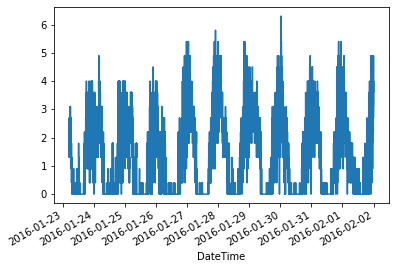

In [10]:
df['Wind Speed']['2016-01-23':'2016-02-01'].plot()

<AxesSubplot:xlabel='DateTime'>

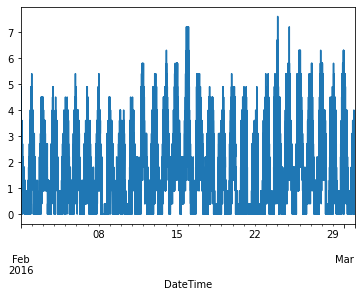

In [11]:
df['Wind Speed']['2016-02-01':'2016-03-01'].plot()

<AxesSubplot:xlabel='DateTime'>

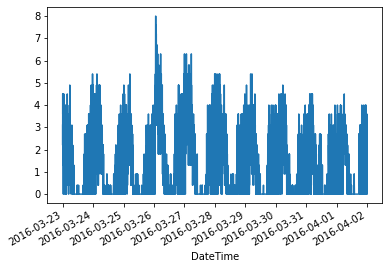

In [12]:
df['Wind Speed']['2016-03-23':'2016-04-01'].plot()

In [13]:
df.drop('Date' , axis = 1 , inplace = True)
df.drop('Time' , axis = 1 , inplace = True)
df.drop('Hi Dir' , axis = 1 , inplace = True)
df.drop('Wind Dir' , axis = 1 , inplace = True)


In [14]:

df.drop('Rain' , axis = 1 , inplace = True)
df.drop('Rain Rate' , axis = 1 , inplace = True)
df.drop('Solar Rad.' , axis = 1 , inplace = True)
df.drop('Solar Energy' , axis = 1 , inplace = True)
df.drop('HI Solar  Rad. ' , axis = 1 , inplace = True)
df.drop('UV Index' , axis = 1 , inplace = True)
df.drop('UV Dose' , axis = 1 , inplace = True)
df.drop('Hi UV ' , axis = 1 , inplace = True)
df.drop('Heat D-D ' , axis = 1 , inplace = True)
df.drop('Wind Tx ' , axis = 1 , inplace = True)
df.drop('Arc. Int.' , axis = 1 , inplace = True)

In [15]:
df.dtypes

Temp Out          float64
Hi Temp           float64
Low Temp          float64
Out Hum             int64
Dew Pt.           float64
Wind Speed        float64
Wind Run          float64
Hi Speed          float64
Wind Chill        float64
Heat Index        float64
THW Index         float64
Bar               float64
Cool D-D          float64
In Temp           float64
In Hum              int64
In Dew            float64
In Heat           float64
In EMC            float64
In Air Density    float64
ET                float64
Wind Samp           int64
ISS Recept        float64
dtype: object

In [16]:
df.head(5)

,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Run,Hi Speed,Wind Chill,Heat Index,...,Cool D-D,In Temp,In Hum,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,ISS Recept
DateTime,,,,,,,,,,,,,,,,,,,,,
2016-01-23 05:01:00,77.9,77.9,77.9,77,70.1,1.8,0.11,2.7,77.9,80.8,...,0.009,88.9,50,67.9,93.5,9.05,1.1316,0.0,24,100.0
2016-01-23 05:02:00,77.9,77.9,77.9,77,70.1,2.2,0.13,2.7,77.9,80.8,...,0.009,88.9,50,67.9,93.5,9.05,1.1317,0.0,23,100.0
2016-01-23 05:03:00,77.9,77.9,77.9,77,70.1,2.2,0.13,2.7,77.9,80.8,...,0.009,88.9,50,67.9,93.5,9.05,1.1316,0.0,24,100.0
2016-01-23 05:04:00,77.8,77.9,77.8,77,70.0,2.2,0.13,3.1,77.8,80.7,...,0.009,88.9,50,67.9,93.5,9.05,1.1317,0.0,23,100.0
2016-01-23 05:05:00,77.8,77.8,77.8,77,70.0,1.8,0.11,2.2,77.8,80.7,...,0.009,88.9,51,68.4,93.8,9.17,1.1312,0.0,23,100.0


In [17]:
df.isna().any()

Temp Out           True
Hi Temp           False
Low Temp          False
Out Hum           False
Dew Pt.            True
Wind Speed        False
Wind Run          False
Hi Speed          False
Wind Chill         True
Heat Index         True
THW Index          True
Bar               False
Cool D-D           True
In Temp           False
In Hum            False
In Dew            False
In Heat           False
In EMC            False
In Air Density    False
ET                False
Wind Samp         False
ISS Recept        False
dtype: bool

In [18]:
df.dropna(axis = 0 , how = 'any' , inplace=True)

In [19]:
df = df.interpolate(method='time')

In [20]:
df.isna().any()

Temp Out          False
Hi Temp           False
Low Temp          False
Out Hum           False
Dew Pt.           False
Wind Speed        False
Wind Run          False
Hi Speed          False
Wind Chill        False
Heat Index        False
THW Index         False
Bar               False
Cool D-D          False
In Temp           False
In Hum            False
In Dew            False
In Heat           False
In EMC            False
In Air Density    False
ET                False
Wind Samp         False
ISS Recept        False
dtype: bool

In [21]:
target_names = ['Wind Speed']


In [22]:
df["Wind Speed"].head(10)

DateTime
2016-01-23 05:01:00    1.8
2016-01-23 05:02:00    2.2
2016-01-23 05:03:00    2.2
2016-01-23 05:04:00    2.2
2016-01-23 05:05:00    1.8
2016-01-23 05:06:00    2.7
2016-01-23 05:07:00    1.3
2016-01-23 05:08:00    1.8
2016-01-23 05:09:00    2.2
2016-01-23 05:10:00    1.8
Name: Wind Speed, dtype: float64

In [23]:
shift_steps = 240

In [24]:
df_targets = df[target_names].shift(-shift_steps)

In [25]:
df[target_names]

,Wind Speed
DateTime,
2016-01-23 05:01:00,1.8
2016-01-23 05:02:00,2.2
2016-01-23 05:03:00,2.2
2016-01-23 05:04:00,2.2
2016-01-23 05:05:00,1.8
...,...
2016-12-19 09:51:00,0.4
2016-12-19 09:52:00,0.9
2016-12-19 09:53:00,0.0


In [26]:
df_targets

,Wind Speed
DateTime,
2016-01-23 05:01:00,0.0
2016-01-23 05:02:00,0.4
2016-01-23 05:03:00,0.0
2016-01-23 05:04:00,0.0
2016-01-23 05:05:00,0.0
...,...
2016-12-19 09:51:00,NaN
2016-12-19 09:52:00,NaN
2016-12-19 09:53:00,NaN


In [27]:
df_targets.tail(10)

,Wind Speed
DateTime,
2016-12-19 09:46:00,NaN
2016-12-19 09:47:00,NaN
2016-12-19 09:48:00,NaN
2016-12-19 09:49:00,NaN
2016-12-19 09:50:00,NaN
2016-12-19 09:51:00,NaN
2016-12-19 09:52:00,NaN
2016-12-19 09:53:00,NaN
2016-12-19 09:54:00,NaN


In [28]:
x_data = df.values[0:-shift_steps]

In [29]:
num_data = len(x_data)
num_data

472872

In [30]:
y_data = df_targets.values[:-shift_steps]

In [31]:
x_train = x_data
x_test = x_data

In [32]:
x_test

array([[ 77.9,  77.9,  77.9, ...,   0. ,  24. , 100. ],
       [ 77.9,  77.9,  77.9, ...,   0. ,  23. , 100. ],
       [ 77.9,  77.9,  77.9, ...,   0. ,  24. , 100. ],
       ...,
       [ 71.1,  71.1,  71.1, ...,   0. ,  24. , 100. ],
       [ 71.1,  71.1,  71.1, ...,   0. ,  23. , 100. ],
       [ 71.1,  71.1,  71.1, ...,   0. ,  23. , 100. ]])

In [33]:
y_train = y_data
y_test = y_data

In [34]:
y_train

array([[0. ],
       [0.4],
       [0. ],
       ...,
       [0. ],
       [0. ],
       [0.4]])

In [35]:
y_test

array([[0. ],
       [0.4],
       [0. ],
       ...,
       [0. ],
       [0. ],
       [0.4]])

In [36]:
num_x_signals = x_data.shape[1]
num_x_signals

22

In [37]:
num_y_signals = y_data.shape[1]
num_y_signals

1

In [38]:
print("Min:", np.min(x_train))
print("Max:", np.max(x_train))

Min: 0.0
Max: 762.6


In [39]:
x_scaler = MinMaxScaler()

In [40]:
x_train_scaled = x_scaler.fit_transform(x_train)

In [41]:
print("Min:", np.min(x_train_scaled))
print("Max:", np.max(x_train_scaled))

Min: 0.0
Max: 1.0000000000000004


In [42]:
x_train

array([[ 77.9,  77.9,  77.9, ...,   0. ,  24. , 100. ],
       [ 77.9,  77.9,  77.9, ...,   0. ,  23. , 100. ],
       [ 77.9,  77.9,  77.9, ...,   0. ,  24. , 100. ],
       ...,
       [ 71.1,  71.1,  71.1, ...,   0. ,  24. , 100. ],
       [ 71.1,  71.1,  71.1, ...,   0. ,  23. , 100. ],
       [ 71.1,  71.1,  71.1, ...,   0. ,  23. , 100. ]])

In [43]:
x_train_scaled

array([[0.33816425, 0.3373494 , 0.33816425, ..., 0.        , 0.37777778,
        1.        ],
       [0.33816425, 0.3373494 , 0.33816425, ..., 0.        , 0.35555556,
        1.        ],
       [0.33816425, 0.3373494 , 0.33816425, ..., 0.        , 0.37777778,
        1.        ],
       ...,
       [0.17391304, 0.17349398, 0.17391304, ..., 0.        , 0.37777778,
        1.        ],
       [0.17391304, 0.17349398, 0.17391304, ..., 0.        , 0.35555556,
        1.        ],
       [0.17391304, 0.17349398, 0.17391304, ..., 0.        , 0.35555556,
        1.        ]])

In [44]:
x_test_scaled = x_scaler.transform(x_test)

In [45]:
x_test_scaled

array([[0.33816425, 0.3373494 , 0.33816425, ..., 0.        , 0.37777778,
        1.        ],
       [0.33816425, 0.3373494 , 0.33816425, ..., 0.        , 0.35555556,
        1.        ],
       [0.33816425, 0.3373494 , 0.33816425, ..., 0.        , 0.37777778,
        1.        ],
       ...,
       [0.17391304, 0.17349398, 0.17391304, ..., 0.        , 0.37777778,
        1.        ],
       [0.17391304, 0.17349398, 0.17391304, ..., 0.        , 0.35555556,
        1.        ],
       [0.17391304, 0.17349398, 0.17391304, ..., 0.        , 0.35555556,
        1.        ]])

In [46]:
y_scaler = MinMaxScaler()
y_train_scaled = y_scaler.fit_transform(y_train)
y_test_scaled = y_scaler.transform(y_test)

In [47]:
print(x_train_scaled.shape)
print(y_train_scaled.shape)

(472872, 22)
(472872, 1)


In [48]:
def batch_generator(batch_size, sequence_length):
    
# This is a generator function for creating random batches of training-data.

    while True:
        x_shape = (batch_size, sequence_length, num_x_signals)
        x_batch = np.zeros(shape=x_shape, dtype=np.float16)
        
        y_shape = (batch_size, sequence_length, num_y_signals)
        y_batch = np.zeros(shape=y_shape, dtype=np.float16)

        for i in range(batch_size):
            idx = np.random.randint(num_data - sequence_length)
            
            x_batch[i] = x_train_scaled[idx:idx+sequence_length]
            y_batch[i] = y_train_scaled[idx:idx+sequence_length]
        
        yield (x_batch, y_batch)

In [49]:
batch_size = 3

In [50]:
sequence_length = 60*4
sequence_length

240

In [51]:
generator = batch_generator(batch_size=batch_size,
                            sequence_length=sequence_length)

In [52]:
x_batch, y_batch = next(generator)

In [53]:
print(x_batch.shape)
print(y_batch.shape)

(3, 240, 22)
(3, 240, 1)


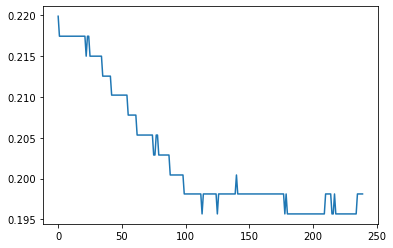

In [54]:
batch = 0   # First sequence in the batch.
signal = 0  # First attribute from the 20 input-signals.
seq = x_batch[batch, :, signal]
plt.plot(seq)

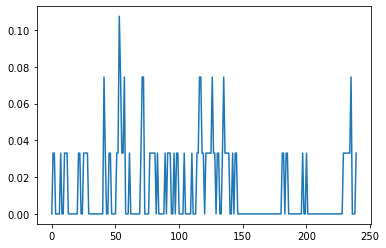

In [55]:
seq = y_batch[batch, :, signal]
plt.plot(seq)

In [56]:
validation_data = (np.expand_dims(x_test_scaled, axis=0),
                   np.expand_dims(y_test_scaled, axis=0))

In [57]:
model = Sequential()

In [58]:
# We take no of hidden units to be 512.
model.add(LSTM(units=512,
              return_sequences=True,
              input_shape=(None, num_x_signals,)))

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [59]:
model.add(Dense(num_y_signals, activation='sigmoid'))

In [60]:
warmup_steps = 50

In [61]:
def loss_mse_warmup(y_true, y_pred):

    '''Here, we calculate the Mean Squared Error between y_true and y_pred,
    but ignore the beginning "warmup" part of the sequences.
    '''
    
    y_true_slice = y_true[:, warmup_steps:, :]
    y_pred_slice = y_pred[:, warmup_steps:, :]

    loss = tf.losses.mean_squared_error(labels=y_true_slice,
                                        predictions=y_pred_slice)
    loss_mean = tf.reduce_mean(loss)

    return loss_mean

In [62]:
optimizer = RMSprop(lr=1e-4)

In [63]:
model.compile(loss=loss_mse_warmup, optimizer=optimizer,metrics=['accuracy'])

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


In [64]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, None, 512)         1095680   
_________________________________________________________________
dense (Dense)                (None, None, 1)           513       
Total params: 1,096,193
Trainable params: 1,096,193
Non-trainable params: 0
_________________________________________________________________


In [65]:
path_checkpoint = 'checkpoint.keras'
callback_checkpoint = ModelCheckpoint(filepath=path_checkpoint,
                                      monitor='val_loss',
                                      verbose=1,
                                      save_weights_only=True,
                                      save_best_only=True)

In [66]:
callback_early_stopping = EarlyStopping(monitor='val_loss',
                                        patience=5, verbose=1)

In [67]:
callback_tensorboard = TensorBoard(log_dir='./2_logs/',
                                   histogram_freq=0,
                                   write_graph=False)

In [68]:
callback_reduce_lr = ReduceLROnPlateau(monitor='val_loss',
                                       factor=0.1,
                                       min_lr=1e-4,
                                       patience=0,
                                       verbose=1)

In [69]:
callbacks = [callback_early_stopping,
             callback_checkpoint,
             callback_tensorboard,
             callback_reduce_lr]

In [70]:
%%time
model.fit_generator(generator=generator,
                    epochs=20,
                    steps_per_epoch=100,
                    validation_data=validation_data,
                    callbacks=callbacks)

Epoch 1/20
  1/100 [..............................] - ETA: 7:03:25 - loss: 0.0113 - acc: 0.4772
Epoch 00001: val_loss improved from inf to 0.01130, saving model to checkpoint.keras
100/100 [==============================] - 365s 4s/step - loss: 0.0160 - acc: 0.5255 - val_loss: 0.0113 - val_acc: 0.4772
Epoch 2/20
  1/100 [..............................] - ETA: 7:17:37 - loss: 0.0104 - acc: 0.4772
Epoch 00002: val_loss improved from 0.01130 to 0.01041, saving model to checkpoint.keras
100/100 [==============================] - 376s 4s/step - loss: 0.0105 - acc: 0.4570 - val_loss: 0.0104 - val_acc: 0.4772
Epoch 3/20
  1/100 [..............................] - ETA: 7:13:26 - loss: 0.0098 - acc: 0.4772
Epoch 00003: val_loss improved from 0.01041 to 0.00976, saving model to checkpoint.keras
100/100 [==============================] - 377s 4s/step - loss: 0.0102 - acc: 0.4877 - val_loss: 0.0098 - val_acc: 0.4772
Epoch 4/20
  1/100 [..............................] - ETA: 7:20:25 - loss: 0.0102 -

In [71]:
try:
    model.load_weights(path_checkpoint)
except Exception as error:
    print("Error trying to load checkpoint.")
    print(error)

In [72]:
result = model.evaluate(x=np.expand_dims(x_test_scaled, axis=0),
                        y=np.expand_dims(y_test_scaled, axis=0))

1/1 [==============================] - 268s 268s/sample - loss: 0.0089 - acc: 0.4772


In [73]:
path = open('/home/avinash/Winter Project/TrichyWeatherDataWindspeed/Formatted/20167.csv')
ff = pd.read_csv(path, sep=',', header=0  , index_col=False , na_values = '---' )

In [74]:
ff.head(1)

,Date,Time,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Dir,Wind Run,...,In Hum,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,Wind Tx,ISS Recept,Arc. Int.
0,01-23-2017,05:01,71.1,71.1,71.1,86,66.7,0.0,NaN,0.0,...,49,65.1,88.9,8.85,1.1412,0.0,24,1,100.0,1


In [75]:
datestr1 = ff[['Date', 'Time']].apply(_date_string, axis=1)
ff['DateTime'] = pd.to_datetime(datestr1, format='%m%d%Y%H%M')

01232017
0501
01232017
0502
01232017
0503
01232017
0504
01232017
0505
01232017
0506
01232017
0507
01232017
0508
01232017
0509
01232017
0510
01232017
0511
01232017
0512
01232017
0513
01232017
0514
01232017
0515
01232017
0516
01232017
0517
01232017
0518
01232017
0519
01232017
0520
01232017
0521
01232017
0522
01232017
0523
01232017
0524
01232017
0525
01232017
0526
01232017
0527
01232017
0528
01232017
0529
01232017
0530
01232017
0531
01232017
0532
01232017
0533
01232017
0534
01232017
0535
01232017
0536
01232017
0537
01232017
0538
01232017
0539
01232017
0540
01232017
0541
01232017
0542
01232017
0543
01232017
0544
01232017
0545
01232017
0546
01232017
0547
01232017
0548
01232017
0549
01232017
0550
01232017
0551
01232017
0552
01232017
0553
01232017
0554
01232017
0555
01232017
0556
01232017
0557
01232017
0558
01232017
0559
01232017
0600
01232017
0601
01232017
0602
01232017
0603
01232017
0604
01232017
0605
01232017
0606
01232017
0607
01232017
0608
01232017
0609
01232017
0610
01232017
0611
012320

01242017
0240
01242017
0241
01242017
0242
01242017
0243
01242017
0244
01242017
0245
01242017
0246
01242017
0247
01242017
0248
01242017
0249
01242017
0250
01242017
0251
01242017
0252
01242017
0253
01242017
0254
01242017
0255
01242017
0256
01242017
0257
01242017
0258
01242017
0259
01242017
0300
01242017
0301
01242017
0302
01242017
0303
01242017
0304
01242017
0305
01242017
0306
01242017
0307
01242017
0308
01242017
0309
01242017
0310
01242017
0311
01242017
0312
01242017
0313
01242017
0314
01242017
0315
01242017
0316
01242017
0317
01242017
0318
01242017
0319
01242017
0320
01242017
0321
01242017
0322
01242017
0323
01242017
0324
01242017
0325
01242017
0326
01242017
0327
01242017
0328
01242017
0329
01242017
0330
01242017
0331
01242017
0332
01242017
0333
01242017
0334
01242017
0335
01242017
0336
01242017
0337
01242017
0338
01242017
0339
01242017
0340
01242017
0341
01242017
0342
01242017
0343
01242017
0344
01242017
0345
01242017
0346
01242017
0347
01242017
0348
01242017
0349
01242017
0350
012420

2321
01242017
2322
01242017
2323
01242017
2324
01242017
2325
01242017
2326
01242017
2327
01242017
2328
01242017
2329
01242017
2330
01242017
2331
01242017
2332
01242017
2333
01242017
2334
01242017
2335
01242017
2336
01242017
2337
01242017
2338
01242017
2339
01242017
2340
01242017
2341
01242017
2342
01242017
2343
01242017
2344
01242017
2345
01242017
2346
01242017
2347
01242017
2348
01242017
2349
01242017
2350
01242017
2351
01242017
2352
01242017
2353
01242017
2354
01242017
2355
01242017
2356
01242017
2357
01242017
2358
01242017
2359
01252017
0000
01252017
0001
01252017
0002
01252017
0003
01252017
0004
01252017
0005
01252017
0006
01252017
0007
01252017
0008
01252017
0009
01252017
0010
01252017
0011
01252017
0012
01252017
0013
01252017
0014
01252017
0015
01252017
0016
01252017
0017
01252017
0018
01252017
0019
01252017
0020
01252017
0021
01252017
0022
01252017
0023
01252017
0024
01252017
0025
01252017
0026
01252017
0027
01252017
0028
01252017
0029
01252017
0030
01252017
0031
01252017
0032
0

2007
01252017
2008
01252017
2009
01252017
2010
01252017
2011
01252017
2012
01252017
2013
01252017
2014
01252017
2015
01252017
2016
01252017
2017
01252017
2018
01252017
2019
01252017
2020
01252017
2021
01252017
2022
01252017
2023
01252017
2024
01252017
2025
01252017
2026
01252017
2027
01252017
2028
01252017
2029
01252017
2030
01252017
2031
01252017
2032
01252017
2033
01252017
2034
01252017
2035
01252017
2036
01252017
2037
01252017
2038
01252017
2039
01252017
2040
01252017
2041
01252017
2042
01252017
2043
01252017
2044
01252017
2045
01252017
2046
01252017
2047
01252017
2048
01252017
2049
01252017
2050
01252017
2051
01252017
2052
01252017
2053
01252017
2054
01252017
2055
01252017
2056
01252017
2057
01252017
2058
01252017
2059
01252017
2100
01252017
2101
01252017
2102
01252017
2103
01252017
2104
01252017
2105
01252017
2106
01252017
2107
01252017
2108
01252017
2109
01252017
2110
01252017
2111
01252017
2112
01252017
2113
01252017
2114
01252017
2115
01252017
2116
01252017
2117
01252017
2118
0

1741
01262017
1742
01262017
1743
01262017
1744
01262017
1745
01262017
1746
01262017
1747
01262017
1748
01262017
1749
01262017
1750
01262017
1751
01262017
1752
01262017
1753
01262017
1754
01262017
1755
01262017
1756
01262017
1757
01262017
1758
01262017
1759
01262017
1800
01262017
1801
01262017
1802
01262017
1803
01262017
1804
01262017
1805
01262017
1806
01262017
1807
01262017
1808
01262017
1809
01262017
1810
01262017
1811
01262017
1812
01262017
1813
01262017
1814
01262017
1815
01262017
1816
01262017
1817
01262017
1818
01262017
1819
01262017
1820
01262017
1821
01262017
1822
01262017
1823
01262017
1824
01262017
1825
01262017
1826
01262017
1827
01262017
1828
01262017
1829
01262017
1830
01262017
1831
01262017
1832
01262017
1833
01262017
1834
01262017
1835
01262017
1836
01262017
1837
01262017
1838
01262017
1839
01262017
1840
01262017
1841
01262017
1842
01262017
1843
01262017
1844
01262017
1845
01262017
1846
01262017
1847
01262017
1848
01262017
1849
01262017
1850
01262017
1851
01262017
1852
0

01272017
1501
01272017
1502
01272017
1503
01272017
1504
01272017
1505
01272017
1506
01272017
1507
01272017
1508
01272017
1509
01272017
1510
01272017
1511
01272017
1512
01272017
1513
01272017
1514
01272017
1515
01272017
1516
01272017
1517
01272017
1518
01272017
1519
01272017
1520
01272017
1521
01272017
1522
01272017
1523
01272017
1524
01272017
1525
01272017
1526
01272017
1527
01272017
1528
01272017
1529
01272017
1530
01272017
1531
01272017
1532
01272017
1533
01272017
1534
01272017
1535
01272017
1536
01272017
1537
01272017
1538
01272017
1539
01272017
1540
01272017
1541
01272017
1542
01272017
1543
01272017
1544
01272017
1545
01272017
1546
01272017
1547
01272017
1548
01272017
1549
01272017
1550
01272017
1551
01272017
1552
01272017
1553
01272017
1554
01272017
1555
01272017
1556
01272017
1557
01272017
1558
01272017
1559
01272017
1600
01272017
1601
01272017
1602
01272017
1603
01272017
1604
01272017
1605
01272017
1606
01272017
1607
01272017
1608
01272017
1609
01272017
1610
01272017
1611
012720

01282017
1443
01282017
1444
01282017
1445
01282017
1446
01282017
1447
01282017
1448
01282017
1449
01282017
1450
01282017
1451
01282017
1452
01282017
1453
01282017
1454
01282017
1455
01282017
1456
01282017
1457
01282017
1458
01282017
1459
01282017
1500
01282017
1501
01282017
1502
01282017
1503
01282017
1504
01282017
1505
01282017
1506
01282017
1507
01282017
1508
01282017
1509
01282017
1510
01282017
1511
01282017
1512
01282017
1513
01282017
1514
01282017
1515
01282017
1516
01282017
1517
01282017
1518
01282017
1519
01282017
1520
01282017
1521
01282017
1522
01282017
1523
01282017
1524
01282017
1525
01282017
1526
01282017
1527
01282017
1528
01282017
1529
01282017
1530
01282017
1531
01282017
1532
01282017
1533
01282017
1534
01282017
1535
01282017
1536
01282017
1537
01282017
1538
01282017
1539
01282017
1540
01282017
1541
01282017
1542
01282017
1543
01282017
1544
01282017
1545
01282017
1546
01282017
1547
01282017
1548
01282017
1549
01282017
1550
01282017
1551
01282017
1552
01282017
1553
012820

0915
01292017
0916
01292017
0917
01292017
0918
01292017
0919
01292017
0920
01292017
0921
01292017
0922
01292017
0923
01292017
0924
01292017
0925
01292017
0926
01292017
0927
01292017
0928
01292017
0929
01292017
0930
01292017
0931
01292017
0932
01292017
0933
01292017
0934
01292017
0935
01292017
0936
01292017
0937
01292017
0938
01292017
0939
01292017
0940
01292017
0941
01292017
0942
01292017
0943
01292017
0944
01292017
0945
01292017
0946
01292017
0947
01292017
0948
01292017
0949
01292017
0950
01292017
0951
01292017
0952
01292017
0953
01292017
0954
01292017
0955
01292017
0956
01292017
0957
01292017
0958
01292017
0959
01292017
1000
01292017
1001
01292017
1002
01292017
1003
01292017
1004
01292017
1005
01292017
1006
01292017
1007
01292017
1008
01292017
1009
01292017
1010
01292017
1011
01292017
1012
01292017
1013
01292017
1014
01292017
1015
01292017
1016
01292017
1017
01292017
1018
01292017
1019
01292017
1020
01292017
1021
01292017
1022
01292017
1023
01292017
1024
01292017
1025
01292017
1026
0

01302017
0712
01302017
0713
01302017
0714
01302017
0715
01302017
0716
01302017
0717
01302017
0718
01302017
0719
01302017
0720
01302017
0721
01302017
0722
01302017
0723
01302017
0724
01302017
0725
01302017
0726
01302017
0727
01302017
0728
01302017
0729
01302017
0730
01302017
0731
01302017
0732
01302017
0733
01302017
0734
01302017
0735
01302017
0736
01302017
0737
01302017
0738
01302017
0739
01302017
0740
01302017
0741
01302017
0742
01302017
0743
01302017
0744
01302017
0745
01302017
0746
01302017
0747
01302017
0748
01302017
0749
01302017
0750
01302017
0751
01302017
0752
01302017
0753
01302017
0754
01302017
0755
01302017
0756
01302017
0757
01302017
0758
01302017
0759
01302017
0800
01302017
0801
01302017
0802
01302017
0803
01302017
0804
01302017
0805
01302017
0806
01302017
0807
01302017
0808
01302017
0809
01302017
0810
01302017
0811
01302017
0812
01302017
0813
01302017
0814
01302017
0815
01302017
0816
01302017
0817
01302017
0818
01302017
0819
01302017
0820
01302017
0821
01302017
0822
013020

01312017
0615
01312017
0616
01312017
0617
01312017
0618
01312017
0619
01312017
0620
01312017
0621
01312017
0622
01312017
0623
01312017
0624
01312017
0625
01312017
0626
01312017
0627
01312017
0628
01312017
0629
01312017
0630
01312017
0631
01312017
0632
01312017
0633
01312017
0634
01312017
0635
01312017
0636
01312017
0637
01312017
0638
01312017
0639
01312017
0640
01312017
0641
01312017
0642
01312017
0643
01312017
0644
01312017
0645
01312017
0646
01312017
0647
01312017
0648
01312017
0649
01312017
0650
01312017
0651
01312017
0652
01312017
0653
01312017
0654
01312017
0655
01312017
0656
01312017
0657
01312017
0658
01312017
0659
01312017
0700
01312017
0701
01312017
0702
01312017
0703
01312017
0704
01312017
0705
01312017
0706
01312017
0707
01312017
0708
01312017
0709
01312017
0710
01312017
0711
01312017
0712
01312017
0713
01312017
0714
01312017
0715
01312017
0716
01312017
0717
01312017
0718
01312017
0719
01312017
0720
01312017
0721
01312017
0722
01312017
0723
01312017
0724
01312017
0725
013120

0153
02012017
0154
02012017
0155
02012017
0156
02012017
0157
02012017
0158
02012017
0159
02012017
0200
02012017
0201
02012017
0202
02012017
0203
02012017
0204
02012017
0205
02012017
0206
02012017
0207
02012017
0208
02012017
0209
02012017
0210
02012017
0211
02012017
0212
02012017
0213
02012017
0214
02012017
0215
02012017
0216
02012017
0217
02012017
0218
02012017
0219
02012017
0220
02012017
0221
02012017
0222
02012017
0223
02012017
0224
02012017
0225
02012017
0226
02012017
0227
02012017
0228
02012017
0229
02012017
0230
02012017
0231
02012017
0232
02012017
0233
02012017
0234
02012017
0235
02012017
0236
02012017
0237
02012017
0238
02012017
0239
02012017
0240
02012017
0241
02012017
0242
02012017
0243
02012017
0244
02012017
0245
02012017
0246
02012017
0247
02012017
0248
02012017
0249
02012017
0250
02012017
0251
02012017
0252
02012017
0253
02012017
0254
02012017
0255
02012017
0256
02012017
0257
02012017
0258
02012017
0259
02012017
0300
02012017
0301
02012017
0302
02012017
0303
02012017
0304
0

2308
02012017
2309
02012017
2310
02012017
2311
02012017
2312
02012017
2313
02012017
2314
02012017
2315
02012017
2316
02012017
2317
02012017
2318
02012017
2319
02012017
2320
02012017
2321
02012017
2322
02012017
2323
02012017
2324
02012017
2325
02012017
2326
02012017
2327
02012017
2328
02012017
2329
02012017
2330
02012017
2331
02012017
2332
02012017
2333
02012017
2334
02012017
2335
02012017
2336
02012017
2337
02012017
2338
02012017
2339
02012017
2340
02012017
2341
02012017
2342
02012017
2343
02012017
2344
02012017
2345
02012017
2346
02012017
2347
02012017
2348
02012017
2349
02012017
2350
02012017
2351
02012017
2352
02012017
2353
02012017
2354
02012017
2355
02012017
2356
02012017
2357
02012017
2358
02012017
2359
02022017
0000
02022017
0001
02022017
0002
02022017
0003
02022017
0004
02022017
0005
02022017
0006
02022017
0007
02022017
0008
02022017
0009
02022017
0010
02022017
0011
02022017
0012
02022017
0013
02022017
0014
02022017
0015
02022017
0016
02022017
0017
02022017
0018
02022017
0019
0

02032017
0418
02032017
0419
02032017
0420
02032017
0421
02032017
0422
02032017
0423
02032017
0424
02032017
0425
02032017
0426
02032017
0427
02032017
0428
02032017
0429
02032017
0430
02032017
0431
02032017
0432
02032017
0433
02032017
0434
02032017
0435
02032017
0436
02032017
0437
02032017
0438
02032017
0439
02032017
0440
02032017
0441
02032017
0442
02032017
0443
02032017
0444
02032017
0445
02032017
0446
02032017
0447
02032017
0448
02032017
0449
02032017
0450
02032017
0451
02032017
0452
02032017
0453
02032017
0454
02032017
0455
02032017
0456
02032017
0457
02032017
0458
02032017
0459
02032017
0500
02032017
0501
02032017
0502
02032017
0503
02032017
0504
02032017
0505
02032017
0506
02032017
0507
02032017
0508
02032017
0509
02032017
0510
02032017
0511
02032017
0512
02032017
0513
02032017
0514
02032017
0515
02032017
0516
02032017
0517
02032017
0518
02032017
0519
02032017
0520
02032017
0521
02032017
0522
02032017
0523
02032017
0524
02032017
0525
02032017
0526
02032017
0527
02032017
0528
020320

02042017
0040
02042017
0041
02042017
0042
02042017
0043
02042017
0044
02042017
0045
02042017
0046
02042017
0047
02042017
0048
02042017
0049
02042017
0050
02042017
0051
02042017
0052
02042017
0053
02042017
0054
02042017
0055
02042017
0056
02042017
0057
02042017
0058
02042017
0059
02042017
0100
02042017
0101
02042017
0102
02042017
0103
02042017
0104
02042017
0105
02042017
0106
02042017
0107
02042017
0108
02042017
0109
02042017
0110
02042017
0111
02042017
0112
02042017
0113
02042017
0114
02042017
0115
02042017
0116
02042017
0117
02042017
0118
02042017
0119
02042017
0120
02042017
0121
02042017
0122
02042017
0123
02042017
0124
02042017
0125
02042017
0126
02042017
0127
02042017
0128
02042017
0129
02042017
0130
02042017
0131
02042017
0132
02042017
0133
02042017
0134
02042017
0135
02042017
0136
02042017
0137
02042017
0138
02042017
0139
02042017
0140
02042017
0141
02042017
0142
02042017
0143
02042017
0144
02042017
0145
02042017
0146
02042017
0147
02042017
0148
02042017
0149
02042017
0150
020420

02042017
1935
02042017
1936
02042017
1937
02042017
1938
02042017
1939
02042017
1940
02042017
1941
02042017
1942
02042017
1943
02042017
1944
02042017
1945
02042017
1946
02042017
1947
02042017
1948
02042017
1949
02042017
1950
02042017
1951
02042017
1952
02042017
1953
02042017
1954
02042017
1955
02042017
1956
02042017
1957
02042017
1958
02042017
1959
02042017
2000
02042017
2001
02042017
2002
02042017
2003
02042017
2004
02042017
2005
02042017
2006
02042017
2007
02042017
2008
02042017
2009
02042017
2010
02042017
2011
02042017
2012
02042017
2013
02042017
2014
02042017
2015
02042017
2016
02042017
2017
02042017
2018
02042017
2019
02042017
2020
02042017
2021
02042017
2022
02042017
2023
02042017
2024
02042017
2025
02042017
2026
02042017
2027
02042017
2028
02042017
2029
02042017
2030
02042017
2031
02042017
2032
02042017
2033
02042017
2034
02042017
2035
02042017
2036
02042017
2037
02042017
2038
02042017
2039
02042017
2040
02042017
2041
02042017
2042
02042017
2043
02042017
2044
02042017
2045
020420

02052017
1309
02052017
1310
02052017
1311
02052017
1312
02052017
1313
02052017
1314
02052017
1315
02052017
1316
02052017
1317
02052017
1318
02052017
1319
02052017
1320
02052017
1321
02052017
1322
02052017
1323
02052017
1324
02052017
1325
02052017
1326
02052017
1327
02052017
1328
02052017
1329
02052017
1330
02052017
1331
02052017
1332
02052017
1333
02052017
1334
02052017
1335
02052017
1336
02052017
1337
02052017
1338
02052017
1339
02052017
1340
02052017
1341
02052017
1342
02052017
1343
02052017
1344
02052017
1345
02052017
1346
02052017
1347
02052017
1348
02052017
1349
02052017
1350
02052017
1351
02052017
1352
02052017
1353
02052017
1354
02052017
1355
02052017
1356
02052017
1357
02052017
1358
02052017
1359
02052017
1400
02052017
1401
02052017
1402
02052017
1403
02052017
1404
02052017
1405
02052017
1406
02052017
1407
02052017
1408
02052017
1409
02052017
1410
02052017
1411
02052017
1412
02052017
1413
02052017
1414
02052017
1415
02052017
1416
02052017
1417
02052017
1418
02052017
1419
020520

02062017
0623
02062017
0624
02062017
0625
02062017
0626
02062017
0627
02062017
0628
02062017
0629
02062017
0630
02062017
0631
02062017
0632
02062017
0633
02062017
0634
02062017
0635
02062017
0636
02062017
0637
02062017
0638
02062017
0639
02062017
0640
02062017
0641
02062017
0642
02062017
0643
02062017
0644
02062017
0645
02062017
0646
02062017
0647
02062017
0648
02062017
0649
02062017
0650
02062017
0651
02062017
0652
02062017
0653
02062017
0654
02062017
0655
02062017
0656
02062017
0657
02062017
0658
02062017
0659
02062017
0700
02062017
0701
02062017
0702
02062017
0703
02062017
0704
02062017
0705
02062017
0706
02062017
0707
02062017
0708
02062017
0709
02062017
0710
02062017
0711
02062017
0712
02062017
0713
02062017
0714
02062017
0715
02062017
0716
02062017
0717
02062017
0718
02062017
0719
02062017
0720
02062017
0721
02062017
0722
02062017
0723
02062017
0724
02062017
0725
02062017
0726
02062017
0727
02062017
0728
02062017
0729
02062017
0730
02062017
0731
02062017
0732
02062017
0733
020620

02072017
0201
02072017
0202
02072017
0203
02072017
0204
02072017
0205
02072017
0206
02072017
0207
02072017
0208
02072017
0209
02072017
0210
02072017
0211
02072017
0212
02072017
0213
02072017
0214
02072017
0215
02072017
0216
02072017
0217
02072017
0218
02072017
0219
02072017
0220
02072017
0221
02072017
0222
02072017
0223
02072017
0224
02072017
0225
02072017
0226
02072017
0227
02072017
0228
02072017
0229
02072017
0230
02072017
0231
02072017
0232
02072017
0233
02072017
0234
02072017
0235
02072017
0236
02072017
0237
02072017
0238
02072017
0239
02072017
0240
02072017
0241
02072017
0242
02072017
0243
02072017
0244
02072017
0245
02072017
0246
02072017
0247
02072017
0248
02072017
0249
02072017
0250
02072017
0251
02072017
0252
02072017
0253
02072017
0254
02072017
0255
02072017
0256
02072017
0257
02072017
0258
02072017
0259
02072017
0300
02072017
0301
02072017
0302
02072017
0303
02072017
0304
02072017
0305
02072017
0306
02072017
0307
02072017
0308
02072017
0309
02072017
0310
02072017
0311
020720

02082017
0146
02082017
0147
02082017
0148
02082017
0149
02082017
0150
02082017
0151
02082017
0152
02082017
0153
02082017
0154
02082017
0155
02082017
0156
02082017
0157
02082017
0158
02082017
0159
02082017
0200
02082017
0201
02082017
0202
02082017
0203
02082017
0204
02082017
0205
02082017
0206
02082017
0207
02082017
0208
02082017
0209
02082017
0210
02082017
0211
02082017
0212
02082017
0213
02082017
0214
02082017
0215
02082017
0216
02082017
0217
02082017
0218
02082017
0219
02082017
0220
02082017
0221
02082017
0222
02082017
0223
02082017
0224
02082017
0225
02082017
0226
02082017
0227
02082017
0228
02082017
0229
02082017
0230
02082017
0231
02082017
0232
02082017
0233
02082017
0234
02082017
0235
02082017
0236
02082017
0237
02082017
0238
02082017
0239
02082017
0240
02082017
0241
02082017
0242
02082017
0243
02082017
0244
02082017
0245
02082017
0246
02082017
0247
02082017
0248
02082017
0249
02082017
0250
02082017
0251
02082017
0252
02082017
0253
02082017
0254
02082017
0255
02082017
0256
020820

2347
02082017
2348
02082017
2349
02082017
2350
02082017
2351
02082017
2352
02082017
2353
02082017
2354
02082017
2355
02082017
2356
02082017
2357
02082017
2358
02082017
2359
02092017
0000
02092017
0001
02092017
0002
02092017
0003
02092017
0004
02092017
0005
02092017
0006
02092017
0007
02092017
0008
02092017
0009
02092017
0010
02092017
0011
02092017
0012
02092017
0013
02092017
0014
02092017
0015
02092017
0016
02092017
0017
02092017
0018
02092017
0019
02092017
0020
02092017
0021
02092017
0022
02092017
0023
02092017
0024
02092017
0025
02092017
0026
02092017
0027
02092017
0028
02092017
0029
02092017
0030
02092017
0031
02092017
0032
02092017
0033
02092017
0034
02092017
0035
02092017
0036
02092017
0037
02092017
0038
02092017
0039
02092017
0040
02092017
0041
02092017
0042
02092017
0043
02092017
0044
02092017
0045
02092017
0046
02092017
0047
02092017
0048
02092017
0049
02092017
0050
02092017
0051
02092017
0052
02092017
0053
02092017
0054
02092017
0055
02092017
0056
02092017
0057
02092017
0058
0

02092017
2107
02092017
2108
02092017
2109
02092017
2110
02092017
2111
02092017
2112
02092017
2113
02092017
2114
02092017
2115
02092017
2116
02092017
2117
02092017
2118
02092017
2119
02092017
2120
02092017
2121
02092017
2122
02092017
2123
02092017
2124
02092017
2125
02092017
2126
02092017
2127
02092017
2128
02092017
2129
02092017
2130
02092017
2131
02092017
2132
02092017
2133
02092017
2134
02092017
2135
02092017
2136
02092017
2137
02092017
2138
02092017
2139
02092017
2140
02092017
2141
02092017
2142
02092017
2143
02092017
2144
02092017
2145
02092017
2146
02092017
2147
02092017
2148
02092017
2149
02092017
2150
02092017
2151
02092017
2152
02092017
2153
02092017
2154
02092017
2155
02092017
2156
02092017
2157
02092017
2158
02092017
2159
02092017
2200
02092017
2201
02092017
2202
02092017
2203
02092017
2204
02092017
2205
02092017
2206
02092017
2207
02092017
2208
02092017
2209
02092017
2210
02092017
2211
02092017
2212
02092017
2213
02092017
2214
02092017
2215
02092017
2216
02092017
2217
020920

02102017
1944
02102017
1945
02102017
1946
02102017
1947
02102017
1948
02102017
1949
02102017
1950
02102017
1951
02102017
1952
02102017
1953
02102017
1954
02102017
1955
02102017
1956
02102017
1957
02102017
1958
02102017
1959
02102017
2000
02102017
2001
02102017
2002
02102017
2003
02102017
2004
02102017
2005
02102017
2006
02102017
2007
02102017
2008
02102017
2009
02102017
2010
02102017
2011
02102017
2012
02102017
2013
02102017
2014
02102017
2015
02102017
2016
02102017
2017
02102017
2018
02102017
2019
02102017
2020
02102017
2021
02102017
2022
02102017
2023
02102017
2024
02102017
2025
02102017
2026
02102017
2027
02102017
2028
02102017
2029
02102017
2030
02102017
2031
02102017
2032
02102017
2033
02102017
2034
02102017
2035
02102017
2036
02102017
2037
02102017
2038
02102017
2039
02102017
2040
02102017
2041
02102017
2042
02102017
2043
02102017
2044
02102017
2045
02102017
2046
02102017
2047
02102017
2048
02102017
2049
02102017
2050
02102017
2051
02102017
2052
02102017
2053
02102017
2054
021020

2017
02112017
2018
02112017
2019
02112017
2020
02112017
2021
02112017
2022
02112017
2023
02112017
2024
02112017
2025
02112017
2026
02112017
2027
02112017
2028
02112017
2029
02112017
2030
02112017
2031
02112017
2032
02112017
2033
02112017
2034
02112017
2035
02112017
2036
02112017
2037
02112017
2038
02112017
2039
02112017
2040
02112017
2041
02112017
2042
02112017
2043
02112017
2044
02112017
2045
02112017
2046
02112017
2047
02112017
2048
02112017
2049
02112017
2050
02112017
2051
02112017
2052
02112017
2053
02112017
2054
02112017
2055
02112017
2056
02112017
2057
02112017
2058
02112017
2059
02112017
2100
02112017
2101
02112017
2102
02112017
2103
02112017
2104
02112017
2105
02112017
2106
02112017
2107
02112017
2108
02112017
2109
02112017
2110
02112017
2111
02112017
2112
02112017
2113
02112017
2114
02112017
2115
02112017
2116
02112017
2117
02112017
2118
02112017
2119
02112017
2120
02112017
2121
02112017
2122
02112017
2123
02112017
2124
02112017
2125
02112017
2126
02112017
2127
02112017
2128
0

02122017
2153
02122017
2154
02122017
2155
02122017
2156
02122017
2157
02122017
2158
02122017
2159
02122017
2200
02122017
2201
02122017
2202
02122017
2203
02122017
2204
02122017
2205
02122017
2206
02122017
2207
02122017
2208
02122017
2209
02122017
2210
02122017
2211
02122017
2212
02122017
2213
02122017
2214
02122017
2215
02122017
2216
02122017
2217
02122017
2218
02122017
2219
02122017
2220
02122017
2221
02122017
2222
02122017
2223
02122017
2224
02122017
2225
02122017
2226
02122017
2227
02122017
2228
02122017
2229
02122017
2230
02122017
2231
02122017
2232
02122017
2233
02122017
2234
02122017
2235
02122017
2236
02122017
2237
02122017
2238
02122017
2239
02122017
2240
02122017
2241
02122017
2242
02122017
2243
02122017
2244
02122017
2245
02122017
2246
02122017
2247
02122017
2248
02122017
2249
02122017
2250
02122017
2251
02122017
2252
02122017
2253
02122017
2254
02122017
2255
02122017
2256
02122017
2257
02122017
2258
02122017
2259
02122017
2300
02122017
2301
02122017
2302
02122017
2303
021220

2018
02132017
2019
02132017
2020
02132017
2021
02132017
2022
02132017
2023
02132017
2024
02132017
2025
02132017
2026
02132017
2027
02132017
2028
02132017
2029
02132017
2030
02132017
2031
02132017
2032
02132017
2033
02132017
2034
02132017
2035
02132017
2036
02132017
2037
02132017
2038
02132017
2039
02132017
2040
02132017
2041
02132017
2042
02132017
2043
02132017
2044
02132017
2045
02132017
2046
02132017
2047
02132017
2048
02132017
2049
02132017
2050
02132017
2051
02132017
2052
02132017
2053
02132017
2054
02132017
2055
02132017
2056
02132017
2057
02132017
2058
02132017
2059
02132017
2100
02132017
2101
02132017
2102
02132017
2103
02132017
2104
02132017
2105
02132017
2106
02132017
2107
02132017
2108
02132017
2109
02132017
2110
02132017
2111
02132017
2112
02132017
2113
02132017
2114
02132017
2115
02132017
2116
02132017
2117
02132017
2118
02132017
2119
02132017
2120
02132017
2121
02132017
2122
02132017
2123
02132017
2124
02132017
2125
02132017
2126
02132017
2127
02132017
2128
02132017
2129
0

2313
02142017
2314
02142017
2315
02142017
2316
02142017
2317
02142017
2318
02142017
2319
02142017
2320
02142017
2321
02142017
2322
02142017
2323
02142017
2324
02142017
2325
02142017
2326
02142017
2327
02142017
2328
02142017
2329
02142017
2330
02142017
2331
02142017
2332
02142017
2333
02142017
2334
02142017
2335
02142017
2336
02142017
2337
02142017
2338
02142017
2339
02142017
2340
02142017
2341
02142017
2342
02142017
2343
02142017
2344
02142017
2345
02142017
2346
02142017
2347
02142017
2348
02142017
2349
02142017
2350
02142017
2351
02142017
2352
02142017
2353
02142017
2354
02142017
2355
02142017
2356
02142017
2357
02142017
2358
02142017
2359
02152017
0000
02152017
0001
02152017
0002
02152017
0003
02152017
0004
02152017
0005
02152017
0006
02152017
0007
02152017
0008
02152017
0009
02152017
0010
02152017
0011
02152017
0012
02152017
0013
02152017
0014
02152017
0015
02152017
0016
02152017
0017
02152017
0018
02152017
0019
02152017
0020
02152017
0021
02152017
0022
02152017
0023
02152017
0024
0

02152017
2230
02152017
2231
02152017
2232
02152017
2233
02152017
2234
02152017
2235
02152017
2236
02152017
2237
02152017
2238
02152017
2239
02152017
2240
02152017
2241
02152017
2242
02152017
2243
02152017
2244
02152017
2245
02152017
2246
02152017
2247
02152017
2248
02152017
2249
02152017
2250
02152017
2251
02152017
2252
02152017
2253
02152017
2254
02152017
2255
02152017
2256
02152017
2257
02152017
2258
02152017
2259
02152017
2300
02152017
2301
02152017
2302
02152017
2303
02152017
2304
02152017
2305
02152017
2306
02152017
2307
02152017
2308
02152017
2309
02152017
2310
02152017
2311
02152017
2312
02152017
2313
02152017
2314
02152017
2315
02152017
2316
02152017
2317
02152017
2318
02152017
2319
02152017
2320
02152017
2321
02152017
2322
02152017
2323
02152017
2324
02152017
2325
02152017
2326
02152017
2327
02152017
2328
02152017
2329
02152017
2330
02152017
2331
02152017
2332
02152017
2333
02152017
2334
02152017
2335
02152017
2336
02152017
2337
02152017
2338
02152017
2339
02152017
2340
021520

2305
02162017
2306
02162017
2307
02162017
2308
02162017
2309
02162017
2310
02162017
2311
02162017
2312
02162017
2313
02162017
2314
02162017
2315
02162017
2316
02162017
2317
02162017
2318
02162017
2319
02162017
2320
02162017
2321
02162017
2322
02162017
2323
02162017
2324
02162017
2325
02162017
2326
02162017
2327
02162017
2328
02162017
2329
02162017
2330
02162017
2331
02162017
2332
02162017
2333
02162017
2334
02162017
2335
02162017
2336
02162017
2337
02162017
2338
02162017
2339
02162017
2340
02162017
2341
02162017
2342
02162017
2343
02162017
2344
02162017
2345
02162017
2346
02162017
2347
02162017
2348
02162017
2349
02162017
2350
02162017
2351
02162017
2352
02162017
2353
02162017
2354
02162017
2355
02162017
2356
02162017
2357
02162017
2358
02162017
2359
02172017
0000
02172017
0001
02172017
0002
02172017
0003
02172017
0004
02172017
0005
02172017
0006
02172017
0007
02172017
0008
02172017
0009
02172017
0010
02172017
0011
02172017
0012
02172017
0013
02172017
0014
02172017
0015
02172017
0016
0

02172017
2250
02172017
2251
02172017
2252
02172017
2253
02172017
2254
02172017
2255
02172017
2256
02172017
2257
02172017
2258
02172017
2259
02172017
2300
02172017
2301
02172017
2302
02172017
2303
02172017
2304
02172017
2305
02172017
2306
02172017
2307
02172017
2308
02172017
2309
02172017
2310
02172017
2311
02172017
2312
02172017
2313
02172017
2314
02172017
2315
02172017
2316
02172017
2317
02172017
2318
02172017
2319
02172017
2320
02172017
2321
02172017
2322
02172017
2323
02172017
2324
02172017
2325
02172017
2326
02172017
2327
02172017
2328
02172017
2329
02172017
2330
02172017
2331
02172017
2332
02172017
2333
02172017
2334
02172017
2335
02172017
2336
02172017
2337
02172017
2338
02172017
2339
02172017
2340
02172017
2341
02172017
2342
02172017
2343
02172017
2344
02172017
2345
02172017
2346
02172017
2347
02172017
2348
02172017
2349
02172017
2350
02172017
2351
02172017
2352
02172017
2353
02172017
2354
02172017
2355
02172017
2356
02172017
2357
02172017
2358
02172017
2359
02182017
0000
021820

2352
02182017
2353
02182017
2354
02182017
2355
02182017
2356
02182017
2357
02182017
2358
02182017
2359
02192017
0000
02192017
0001
02192017
0002
02192017
0003
02192017
0004
02192017
0005
02192017
0006
02192017
0007
02192017
0008
02192017
0009
02192017
0010
02192017
0011
02192017
0012
02192017
0013
02192017
0014
02192017
0015
02192017
0016
02192017
0017
02192017
0018
02192017
0019
02192017
0020
02192017
0021
02192017
0022
02192017
0023
02192017
0024
02192017
0025
02192017
0026
02192017
0027
02192017
0028
02192017
0029
02192017
0030
02192017
0031
02192017
0032
02192017
0033
02192017
0034
02192017
0035
02192017
0036
02192017
0037
02192017
0038
02192017
0039
02192017
0040
02192017
0041
02192017
0042
02192017
0043
02192017
0044
02192017
0045
02192017
0046
02192017
0047
02192017
0048
02192017
0049
02192017
0050
02192017
0051
02192017
0052
02192017
0053
02192017
0054
02192017
0055
02192017
0056
02192017
0057
02192017
0058
02192017
0059
02192017
0100
02192017
0101
02192017
0102
02192017
0103
0

02192017
2236
02192017
2237
02192017
2238
02192017
2239
02192017
2240
02192017
2241
02192017
2242
02192017
2243
02192017
2244
02192017
2245
02192017
2246
02192017
2247
02192017
2248
02192017
2249
02192017
2250
02192017
2251
02192017
2252
02192017
2253
02192017
2254
02192017
2255
02192017
2256
02192017
2257
02192017
2258
02192017
2259
02192017
2300
02192017
2301
02192017
2302
02192017
2303
02192017
2304
02192017
2305
02192017
2306
02192017
2307
02192017
2308
02192017
2309
02192017
2310
02192017
2311
02192017
2312
02192017
2313
02192017
2314
02192017
2315
02192017
2316
02192017
2317
02192017
2318
02192017
2319
02192017
2320
02192017
2321
02192017
2322
02192017
2323
02192017
2324
02192017
2325
02192017
2326
02192017
2327
02192017
2328
02192017
2329
02192017
2330
02192017
2331
02192017
2332
02192017
2333
02192017
2334
02192017
2335
02192017
2336
02192017
2337
02192017
2338
02192017
2339
02192017
2340
02192017
2341
02192017
2342
02192017
2343
02192017
2344
02192017
2345
02192017
2346
021920

02202017
2049
02202017
2050
02202017
2051
02202017
2052
02202017
2053
02202017
2054
02202017
2055
02202017
2056
02202017
2057
02202017
2058
02202017
2059
02202017
2100
02202017
2101
02202017
2102
02202017
2103
02202017
2104
02202017
2105
02202017
2106
02202017
2107
02202017
2108
02202017
2109
02202017
2110
02202017
2111
02202017
2112
02202017
2113
02202017
2114
02202017
2115
02202017
2116
02202017
2117
02202017
2118
02202017
2119
02202017
2120
02202017
2121
02202017
2122
02202017
2123
02202017
2124
02202017
2125
02202017
2126
02202017
2127
02202017
2128
02202017
2129
02202017
2130
02202017
2131
02202017
2132
02202017
2133
02202017
2134
02202017
2135
02202017
2136
02202017
2137
02202017
2138
02202017
2139
02202017
2140
02202017
2141
02202017
2142
02202017
2143
02202017
2144
02202017
2145
02202017
2146
02202017
2147
02202017
2148
02202017
2149
02202017
2150
02202017
2151
02202017
2152
02202017
2153
02202017
2154
02202017
2155
02202017
2156
02202017
2157
02202017
2158
02202017
2159
022020

1129
02212017
1130
02212017
1131
02212017
1132
02212017
1133
02212017
1134
02212017
1135
02212017
1136
02212017
1137
02212017
1138
02212017
1139
02212017
1140
02212017
1141
02212017
1142
02212017
1143
02212017
1144
02212017
1145
02212017
1146
02212017
1147
02212017
1148
02212017
1149
02212017
1150
02212017
1151
02212017
1152
02212017
1153
02212017
1154
02212017
1155
02212017
1156
02212017
1157
02212017
1158
02212017
1159
02212017
1200
02212017
1201
02212017
1202
02212017
1203
02212017
1204
02212017
1205
02212017
1206
02212017
1207
02212017
1208
02212017
1209
02212017
1210
02212017
1211
02212017
1212
02212017
1213
02212017
1214
02212017
1215
02212017
1216
02212017
1217
02212017
1218
02212017
1219
02212017
1220
02212017
1221
02212017
1222
02212017
1223
02212017
1224
02212017
1225
02212017
1226
02212017
1227
02212017
1228
02212017
1229
02212017
1230
02212017
1231
02212017
1232
02212017
1233
02212017
1234
02212017
1235
02212017
1236
02212017
1237
02212017
1238
02212017
1239
02212017
1240
0

0708
02222017
0709
02222017
0710
02222017
0711
02222017
0712
02222017
0713
02222017
0714
02222017
0715
02222017
0716
02222017
0717
02222017
0718
02222017
0719
02222017
0720
02222017
0721
02222017
0722
02222017
0723
02222017
0724
02222017
0725
02222017
0726
02222017
0727
02222017
0728
02222017
0729
02222017
0730
02222017
0731
02222017
0732
02222017
0733
02222017
0734
02222017
0735
02222017
0736
02222017
0737
02222017
0738
02222017
0739
02222017
0740
02222017
0741
02222017
0742
02222017
0743
02222017
0744
02222017
0745
02222017
0746
02222017
0747
02222017
0748
02222017
0749
02222017
0750
02222017
0751
02222017
0752
02222017
0753
02222017
0754
02222017
0755
02222017
0756
02222017
0757
02222017
0758
02222017
0759
02222017
0800
02222017
0801
02222017
0802
02222017
0803
02222017
0804
02222017
0805
02222017
0806
02222017
0807
02222017
0808
02222017
0809
02222017
0810
02222017
0811
02222017
0812
02222017
0813
02222017
0814
02222017
0815
02222017
0816
02222017
0817
02222017
0818
02222017
0819
0

1218
02232017
1219
02232017
1220
02232017
1221
02232017
1222
02232017
1223
02232017
1224
02232017
1225
02232017
1226
02232017
1227
02232017
1228
02232017
1229
02232017
1230
02232017
1231
02232017
1232
02232017
1233
02232017
1234
02232017
1235
02232017
1236
02232017
1237
02232017
1238
02232017
1239
02232017
1240
02232017
1241
02232017
1242
02232017
1243
02232017
1244
02232017
1245
02232017
1246
02232017
1247
02232017
1248
02232017
1249
02232017
1250
02232017
1251
02232017
1252
02232017
1253
02232017
1254
02232017
1255
02232017
1256
02232017
1257
02232017
1258
02232017
1259
02232017
1300
02232017
1301
02232017
1302
02232017
1303
02232017
1304
02232017
1305
02232017
1306
02232017
1307
02232017
1308
02232017
1309
02232017
1310
02232017
1311
02232017
1312
02232017
1313
02232017
1314
02232017
1315
02232017
1316
02232017
1317
02232017
1318
02232017
1319
02232017
1320
02232017
1321
02232017
1322
02232017
1323
02232017
1324
02232017
1325
02232017
1326
02232017
1327
02232017
1328
02232017
1329
0

02242017
1130
02242017
1131
02242017
1132
02242017
1133
02242017
1134
02242017
1135
02242017
1136
02242017
1137
02242017
1138
02242017
1139
02242017
1140
02242017
1141
02242017
1142
02242017
1143
02242017
1144
02242017
1145
02242017
1146
02242017
1147
02242017
1148
02242017
1149
02242017
1150
02242017
1151
02242017
1152
02242017
1153
02242017
1154
02242017
1155
02242017
1156
02242017
1157
02242017
1158
02242017
1159
02242017
1200
02242017
1201
02242017
1202
02242017
1203
02242017
1204
02242017
1205
02242017
1206
02242017
1207
02242017
1208
02242017
1209
02242017
1210
02242017
1211
02242017
1212
02242017
1213
02242017
1214
02242017
1215
02242017
1216
02242017
1217
02242017
1218
02242017
1219
02242017
1220
02242017
1221
02242017
1222
02242017
1223
02242017
1224
02242017
1225
02242017
1226
02242017
1227
02242017
1228
02242017
1229
02242017
1230
02242017
1231
02242017
1232
02242017
1233
02242017
1234
02242017
1235
02242017
1236
02242017
1237
02242017
1238
02242017
1239
02242017
1240
022420

1201
02252017
1202
02252017
1203
02252017
1204
02252017
1205
02252017
1206
02252017
1207
02252017
1208
02252017
1209
02252017
1210
02252017
1211
02252017
1212
02252017
1213
02252017
1214
02252017
1215
02252017
1216
02252017
1217
02252017
1218
02252017
1219
02252017
1220
02252017
1221
02252017
1222
02252017
1223
02252017
1224
02252017
1225
02252017
1226
02252017
1227
02252017
1228
02252017
1229
02252017
1230
02252017
1231
02252017
1232
02252017
1233
02252017
1234
02252017
1235
02252017
1236
02252017
1237
02252017
1238
02252017
1239
02252017
1240
02252017
1241
02252017
1242
02252017
1243
02252017
1244
02252017
1245
02252017
1246
02252017
1247
02252017
1248
02252017
1249
02252017
1250
02252017
1251
02252017
1252
02252017
1253
02252017
1254
02252017
1255
02252017
1256
02252017
1257
02252017
1258
02252017
1259
02252017
1300
02252017
1304
02252017
1305
02252017
1306
02252017
1307
02252017
1308
02252017
1309
02252017
1310
02252017
1311
02252017
1312
02252017
1313
02252017
1314
02252017
1315
0

1520
02262017
1521
02262017
1522
02262017
1523
02262017
1524
02262017
1525
02262017
1526
02262017
1527
02262017
1528
02262017
1529
02262017
1530
02262017
1531
02262017
1532
02262017
1533
02262017
1534
02262017
1535
02262017
1536
02262017
1537
02262017
1538
02262017
1539
02262017
1540
02262017
1541
02262017
1542
02262017
1543
02262017
1544
02262017
1545
02262017
1546
02262017
1547
02262017
1548
02262017
1549
02262017
1550
02262017
1551
02262017
1552
02262017
1553
02262017
1554
02262017
1555
02262017
1556
02262017
1557
02262017
1558
02262017
1559
02262017
1600
02262017
1601
02262017
1602
02262017
1603
02262017
1604
02262017
1605
02262017
1606
02262017
1607
02262017
1608
02262017
1609
02262017
1610
02262017
1611
02262017
1612
02262017
1613
02262017
1614
02262017
1615
02262017
1616
02262017
1617
02262017
1618
02262017
1619
02262017
1620
02262017
1621
02262017
1622
02262017
1623
02262017
1624
02262017
1625
02262017
1626
02262017
1627
02262017
1628
02262017
1629
02262017
1630
02262017
1631
0

02272017
1516
02272017
1517
02272017
1518
02272017
1519
02272017
1520
02272017
1521
02272017
1522
02272017
1523
02272017
1524
02272017
1525
02272017
1526
02272017
1527
02272017
1528
02272017
1529
02272017
1530
02272017
1531
02272017
1532
02272017
1533
02272017
1534
02272017
1535
02272017
1536
02272017
1537
02272017
1538
02272017
1539
02272017
1540
02272017
1541
02272017
1542
02272017
1543
02272017
1544
02272017
1545
02272017
1546
02272017
1547
02272017
1548
02272017
1549
02272017
1550
02272017
1551
02272017
1552
02272017
1553
02272017
1554
02272017
1555
02272017
1556
02272017
1557
02272017
1558
02272017
1559
02272017
1600
02272017
1601
02272017
1602
02272017
1603
02272017
1604
02272017
1605
02272017
1606
02272017
1607
02272017
1608
02272017
1609
02272017
1610
02272017
1611
02272017
1612
02272017
1613
02272017
1614
02272017
1615
02272017
1616
02272017
1617
02272017
1618
02272017
1619
02272017
1620
02272017
1621
02272017
1622
02272017
1623
02272017
1624
02272017
1625
02272017
1626
022720

02282017
1635
02282017
1636
02282017
1637
02282017
1638
02282017
1639
02282017
1640
02282017
1641
02282017
1642
02282017
1643
02282017
1644
02282017
1645
02282017
1646
02282017
1647
02282017
1648
02282017
1649
02282017
1650
02282017
1651
02282017
1652
02282017
1653
02282017
1654
02282017
1655
02282017
1656
02282017
1657
02282017
1658
02282017
1659
02282017
1700
02282017
1701
02282017
1702
02282017
1703
02282017
1704
02282017
1705
02282017
1706
02282017
1707
02282017
1708
02282017
1709
02282017
1710
02282017
1711
02282017
1712
02282017
1713
02282017
1714
02282017
1715
02282017
1716
02282017
1717
02282017
1718
02282017
1719
02282017
1720
02282017
1721
02282017
1722
02282017
1723
02282017
1724
02282017
1725
02282017
1726
02282017
1727
02282017
1728
02282017
1729
02282017
1730
02282017
1731
02282017
1732
02282017
1733
02282017
1734
02282017
1735
02282017
1736
02282017
1737
02282017
1738
02282017
1739
02282017
1740
02282017
1741
02282017
1742
02282017
1743
02282017
1744
02282017
1745
022820

1206
03012017
1207
03012017
1208
03012017
1209
03012017
1210
03012017
1211
03012017
1212
03012017
1213
03012017
1214
03012017
1215
03012017
1216
03012017
1217
03012017
1218
03012017
1219
03012017
1220
03012017
1221
03012017
1222
03012017
1223
03012017
1224
03012017
1225
03012017
1226
03012017
1227
03012017
1228
03012017
1229
03012017
1230
03012017
1231
03012017
1232
03012017
1233
03012017
1234
03012017
1235
03012017
1236
03012017
1237
03012017
1238
03012017
1239
03012017
1240
03012017
1241
03012017
1242
03012017
1243
03012017
1244
03012017
1245
03012017
1246
03012017
1247
03012017
1248
03012017
1249
03012017
1250
03012017
1251
03012017
1252
03012017
1253
03012017
1254
03012017
1255
03012017
1256
03012017
1257
03012017
1258
03012017
1259
03012017
1300
03012017
1301
03012017
1302
03012017
1303
03012017
1304
03012017
1305
03012017
1306
03012017
1307
03012017
1308
03012017
1309
03012017
1310
03012017
1311
03012017
1312
03012017
1313
03012017
1314
03012017
1315
03012017
1316
03012017
1317
0

03022017
1238
03022017
1239
03022017
1240
03022017
1241
03022017
1242
03022017
1243
03022017
1244
03022017
1245
03022017
1246
03022017
1247
03022017
1248
03022017
1249
03022017
1250
03022017
1251
03022017
1252
03022017
1253
03022017
1254
03022017
1255
03022017
1256
03022017
1257
03022017
1258
03022017
1259
03022017
1300
03022017
1301
03022017
1302
03022017
1303
03022017
1304
03022017
1305
03022017
1306
03022017
1307
03022017
1308
03022017
1309
03022017
1310
03022017
1311
03022017
1312
03022017
1313
03022017
1314
03022017
1315
03022017
1316
03022017
1317
03022017
1318
03022017
1319
03022017
1320
03022017
1321
03022017
1322
03022017
1323
03022017
1324
03022017
1325
03022017
1326
03022017
1327
03022017
1328
03022017
1329
03022017
1330
03022017
1331
03022017
1332
03022017
1333
03022017
1334
03022017
1335
03022017
1336
03022017
1337
03022017
1338
03022017
1339
03022017
1340
03022017
1341
03022017
1342
03022017
1343
03022017
1344
03022017
1345
03022017
1346
03022017
1347
03022017
1348
030220

03032017
1002
03032017
1003
03032017
1004
03032017
1005
03032017
1006
03032017
1007
03032017
1008
03032017
1009
03032017
1010
03032017
1011
03032017
1012
03032017
1013
03032017
1014
03032017
1015
03032017
1016
03032017
1017
03032017
1018
03032017
1019
03032017
1020
03032017
1021
03032017
1022
03032017
1023
03032017
1024
03032017
1025
03032017
1026
03032017
1027
03032017
1028
03032017
1029
03032017
1030
03032017
1031
03032017
1032
03032017
1033
03032017
1034
03032017
1035
03032017
1036
03032017
1037
03032017
1038
03032017
1039
03032017
1040
03032017
1041
03032017
1042
03032017
1043
03032017
1044
03032017
1045
03032017
1046
03032017
1047
03032017
1048
03032017
1049
03032017
1050
03032017
1051
03032017
1052
03032017
1053
03032017
1054
03032017
1055
03032017
1056
03032017
1057
03032017
1058
03032017
1059
03032017
1100
03032017
1101
03032017
1102
03032017
1103
03032017
1104
03032017
1105
03032017
1106
03032017
1107
03032017
1108
03032017
1109
03032017
1110
03032017
1111
03032017
1112
030320

1341
03042017
1342
03042017
1343
03042017
1344
03042017
1345
03042017
1346
03042017
1347
03042017
1348
03042017
1349
03042017
1350
03042017
1351
03042017
1352
03042017
1353
03042017
1354
03042017
1355
03042017
1356
03042017
1357
03042017
1358
03042017
1359
03042017
1400
03042017
1401
03042017
1402
03042017
1403
03042017
1404
03042017
1405
03042017
1406
03042017
1407
03042017
1408
03042017
1409
03042017
1410
03042017
1411
03042017
1412
03042017
1413
03042017
1414
03042017
1415
03042017
1416
03042017
1417
03042017
1418
03042017
1419
03042017
1420
03042017
1421
03042017
1422
03042017
1423
03042017
1424
03042017
1425
03042017
1426
03042017
1427
03042017
1428
03042017
1429
03042017
1430
03042017
1431
03042017
1432
03042017
1433
03042017
1434
03042017
1435
03042017
1436
03042017
1437
03042017
1438
03042017
1439
03042017
1440
03042017
1441
03042017
1442
03042017
1443
03042017
1444
03042017
1445
03042017
1446
03042017
1447
03042017
1448
03042017
1449
03042017
1450
03042017
1451
03042017
1452
0

1210
03052017
1211
03052017
1212
03052017
1213
03052017
1214
03052017
1215
03052017
1216
03052017
1217
03052017
1218
03052017
1219
03052017
1220
03052017
1221
03052017
1222
03052017
1223
03052017
1224
03052017
1225
03052017
1226
03052017
1227
03052017
1228
03052017
1229
03052017
1230
03052017
1231
03052017
1232
03052017
1233
03052017
1234
03052017
1235
03052017
1236
03052017
1237
03052017
1238
03052017
1239
03052017
1240
03052017
1241
03052017
1242
03052017
1243
03052017
1244
03052017
1245
03052017
1246
03052017
1247
03052017
1248
03052017
1249
03052017
1250
03052017
1251
03052017
1252
03052017
1253
03052017
1254
03052017
1255
03052017
1256
03052017
1257
03052017
1258
03052017
1259
03052017
1300
03052017
1301
03052017
1302
03052017
1303
03052017
1304
03052017
1305
03052017
1306
03052017
1307
03052017
1308
03052017
1309
03052017
1310
03052017
1311
03052017
1312
03052017
1313
03052017
1314
03052017
1315
03052017
1316
03052017
1317
03052017
1318
03052017
1319
03052017
1320
03052017
1321
0

1141
03062017
1142
03062017
1143
03062017
1144
03062017
1145
03062017
1146
03062017
1147
03062017
1148
03062017
1149
03062017
1150
03062017
1151
03062017
1152
03062017
1153
03062017
1154
03062017
1155
03062017
1156
03062017
1157
03062017
1158
03062017
1159
03062017
1200
03062017
1201
03062017
1202
03062017
1203
03062017
1204
03062017
1205
03062017
1206
03062017
1207
03062017
1208
03062017
1209
03062017
1210
03062017
1211
03062017
1212
03062017
1213
03062017
1214
03062017
1215
03062017
1216
03062017
1217
03062017
1218
03062017
1219
03062017
1220
03062017
1221
03062017
1222
03062017
1223
03062017
1224
03062017
1225
03062017
1226
03062017
1227
03062017
1228
03062017
1229
03062017
1230
03062017
1231
03062017
1232
03062017
1233
03062017
1234
03062017
1235
03062017
1236
03062017
1237
03062017
1238
03062017
1239
03062017
1240
03062017
1241
03062017
1242
03062017
1243
03062017
1244
03062017
1245
03062017
1246
03062017
1247
03062017
1248
03062017
1249
03062017
1250
03062017
1251
03062017
1252
0

03072017
1109
03072017
1110
03072017
1111
03072017
1112
03072017
1113
03072017
1114
03072017
1115
03072017
1116
03072017
1117
03072017
1118
03072017
1119
03072017
1120
03072017
1121
03072017
1122
03072017
1123
03072017
1124
03072017
1125
03072017
1126
03072017
1127
03072017
1128
03072017
1129
03072017
1130
03072017
1131
03072017
1132
03072017
1133
03072017
1134
03072017
1135
03072017
1136
03072017
1137
03072017
1138
03072017
1139
03072017
1140
03072017
1141
03072017
1142
03072017
1143
03072017
1144
03072017
1145
03072017
1146
03072017
1147
03072017
1148
03072017
1149
03072017
1150
03072017
1151
03072017
1152
03072017
1153
03072017
1154
03072017
1155
03072017
1156
03072017
1157
03072017
1158
03072017
1159
03072017
1200
03072017
1201
03072017
1202
03072017
1203
03072017
1204
03072017
1205
03072017
1206
03072017
1207
03072017
1208
03072017
1209
03072017
1210
03072017
1211
03072017
1212
03072017
1213
03072017
1214
03072017
1215
03072017
1216
03072017
1217
03072017
1218
03072017
1219
030720

0837
03082017
0838
03082017
0839
03082017
0840
03082017
0841
03082017
0842
03082017
0843
03082017
0844
03082017
0845
03082017
0846
03082017
0847
03082017
0848
03082017
0849
03082017
0850
03082017
0851
03082017
0852
03082017
0853
03082017
0854
03082017
0855
03082017
0856
03082017
0857
03082017
0858
03082017
0859
03082017
0900
03082017
0901
03082017
0902
03082017
0903
03082017
0904
03082017
0905
03082017
0906
03082017
0907
03082017
0908
03082017
0909
03082017
0910
03082017
0911
03082017
0912
03082017
0913
03082017
0914
03082017
0915
03082017
0916
03082017
0917
03082017
0918
03082017
0919
03082017
0920
03082017
0921
03082017
0922
03082017
0923
03082017
0924
03082017
0925
03082017
0926
03082017
0927
03082017
0928
03082017
0929
03082017
0930
03082017
0931
03082017
0932
03082017
0933
03082017
0934
03082017
0935
03082017
0936
03082017
0937
03082017
0938
03082017
0939
03082017
0940
03082017
0941
03082017
0942
03082017
0943
03082017
0944
03082017
0945
03082017
0946
03082017
0947
03082017
0948
0

03092017
0424
03092017
0425
03092017
0426
03092017
0427
03092017
0428
03092017
0429
03092017
0430
03092017
0431
03092017
0432
03092017
0433
03092017
0434
03092017
0435
03092017
0436
03092017
0437
03092017
0438
03092017
0439
03092017
0440
03092017
0441
03092017
0442
03092017
0443
03092017
0444
03092017
0445
03092017
0446
03092017
0447
03092017
0448
03092017
0449
03092017
0450
03092017
0451
03092017
0452
03092017
0453
03092017
0454
03092017
0455
03092017
0456
03092017
0457
03092017
0458
03092017
0459
03092017
0500
03092017
0501
03092017
0502
03092017
0503
03092017
0504
03092017
0505
03092017
0506
03092017
0507
03092017
0508
03092017
0509
03092017
0510
03092017
0511
03092017
0512
03092017
0513
03092017
0514
03092017
0515
03092017
0516
03092017
0517
03092017
0518
03092017
0519
03092017
0520
03092017
0521
03092017
0522
03092017
0523
03092017
0524
03092017
0525
03092017
0526
03092017
0527
03092017
0528
03092017
0529
03092017
0530
03092017
0531
03092017
0532
03092017
0533
03092017
0534
030920

03102017
0106
03102017
0107
03102017
0108
03102017
0109
03102017
0110
03102017
0111
03102017
0112
03102017
0113
03102017
0114
03102017
0115
03102017
0116
03102017
0117
03102017
0118
03102017
0119
03102017
0120
03102017
0121
03102017
0122
03102017
0123
03102017
0124
03102017
0125
03102017
0126
03102017
0127
03102017
0128
03102017
0129
03102017
0130
03102017
0131
03102017
0132
03102017
0133
03102017
0134
03102017
0135
03102017
0136
03102017
0137
03102017
0138
03102017
0139
03102017
0140
03102017
0141
03102017
0142
03102017
0143
03102017
0144
03102017
0145
03102017
0146
03102017
0147
03102017
0148
03102017
0149
03102017
0150
03102017
0151
03102017
0152
03102017
0153
03102017
0154
03102017
0155
03102017
0156
03102017
0157
03102017
0158
03102017
0159
03102017
0200
03102017
0201
03102017
0202
03102017
0203
03102017
0204
03102017
0205
03102017
0206
03102017
0207
03102017
0208
03102017
0209
03102017
0210
03102017
0211
03102017
0212
03102017
0213
03102017
0214
03102017
0215
03102017
0216
031020

03102017
1853
03102017
1854
03102017
1855
03102017
1856
03102017
1857
03102017
1858
03102017
1859
03102017
1900
03102017
1901
03102017
1902
03102017
1903
03102017
1904
03102017
1905
03102017
1906
03102017
1907
03102017
1908
03102017
1909
03102017
1910
03102017
1911
03102017
1912
03102017
1913
03102017
1914
03102017
1915
03102017
1916
03102017
1917
03102017
1918
03102017
1919
03102017
1920
03102017
1921
03102017
1922
03102017
1923
03102017
1924
03102017
1925
03102017
1926
03102017
1927
03102017
1928
03102017
1929
03102017
1930
03102017
1931
03102017
1932
03102017
1933
03102017
1934
03102017
1935
03102017
1936
03102017
1937
03102017
1938
03102017
1939
03102017
1940
03102017
1941
03102017
1942
03102017
1943
03102017
1944
03102017
1945
03102017
1946
03102017
1947
03102017
1948
03102017
1949
03102017
1950
03102017
1951
03102017
1952
03102017
1953
03102017
1954
03102017
1955
03102017
1956
03102017
1957
03102017
1958
03102017
1959
03102017
2000
03102017
2001
03102017
2002
03102017
2003
031020

1737
03112017
1738
03112017
1739
03112017
1740
03112017
1741
03112017
1742
03112017
1743
03112017
1744
03112017
1745
03112017
1746
03112017
1747
03112017
1748
03112017
1749
03112017
1750
03112017
1751
03112017
1752
03112017
1753
03112017
1754
03112017
1755
03112017
1756
03112017
1757
03112017
1758
03112017
1759
03112017
1800
03112017
1801
03112017
1802
03112017
1803
03112017
1804
03112017
1805
03112017
1806
03112017
1807
03112017
1808
03112017
1809
03112017
1810
03112017
1811
03112017
1812
03112017
1813
03112017
1814
03112017
1815
03112017
1816
03112017
1817
03112017
1818
03112017
1819
03112017
1820
03112017
1821
03112017
1822
03112017
1823
03112017
1824
03112017
1825
03112017
1826
03112017
1827
03112017
1828
03112017
1829
03112017
1830
03112017
1831
03112017
1832
03112017
1833
03112017
1834
03112017
1835
03112017
1836
03112017
1837
03112017
1838
03112017
1839
03112017
1840
03112017
1844
03112017
1845
03112017
1846
03112017
1847
03112017
1848
03112017
1849
03112017
1850
03112017
1851
0

1433
03122017
1434
03122017
1435
03122017
1436
03122017
1437
03122017
1438
03122017
1439
03122017
1440
03122017
1441
03122017
1442
03122017
1443
03122017
1444
03122017
1445
03122017
1446
03122017
1447
03122017
1448
03122017
1449
03122017
1450
03122017
1451
03122017
1452
03122017
1453
03122017
1454
03122017
1455
03122017
1456
03122017
1457
03122017
1458
03122017
1459
03122017
1500
03122017
1501
03122017
1502
03122017
1503
03122017
1504
03122017
1505
03122017
1506
03122017
1507
03122017
1508
03122017
1509
03122017
1510
03122017
1511
03122017
1512
03122017
1513
03122017
1514
03122017
1515
03122017
1516
03122017
1517
03122017
1518
03122017
1519
03122017
1520
03122017
1521
03122017
1522
03122017
1523
03122017
1524
03122017
1525
03122017
1526
03122017
1527
03122017
1528
03122017
1529
03122017
1530
03122017
1531
03122017
1532
03122017
1533
03122017
1534
03122017
1535
03122017
1536
03122017
1537
03122017
1538
03122017
1539
03122017
1540
03122017
1541
03122017
1542
03122017
1543
03122017
1544
0

03182017
2241
03182017
2242
03182017
2243
03182017
2244
03182017
2245
03182017
2246
03182017
2247
03182017
2248
03182017
2249
03182017
2250
03182017
2251
03182017
2252
03182017
2253
03182017
2254
03182017
2255
03182017
2256
03182017
2257
03182017
2258
03182017
2259
03182017
2300
03182017
2301
03182017
2302
03182017
2303
03182017
2304
03182017
2305
03182017
2306
03182017
2307
03182017
2308
03182017
2309
03182017
2310
03182017
2311
03182017
2312
03182017
2313
03182017
2314
03182017
2315
03182017
2316
03182017
2317
03182017
2318
03182017
2319
03182017
2320
03182017
2321
03182017
2322
03182017
2323
03182017
2324
03182017
2325
03182017
2326
03182017
2327
03182017
2328
03182017
2329
03182017
2330
03182017
2331
03182017
2332
03182017
2333
03182017
2334
03182017
2335
03182017
2336
03182017
2337
03182017
2338
03182017
2339
03182017
2340
03182017
2341
03182017
2342
03182017
2343
03182017
2344
03182017
2345
03182017
2346
03182017
2347
03182017
2348
03182017
2349
03182017
2350
03182017
2351
031820

03192017
1801
03192017
1802
03192017
1803
03192017
1804
03192017
1805
03192017
1806
03192017
1807
03192017
1808
03192017
1809
03192017
1810
03192017
1811
03192017
1812
03192017
1813
03192017
1814
03192017
1815
03192017
1816
03192017
1817
03192017
1818
03192017
1819
03192017
1820
03192017
1821
03192017
1822
03192017
1823
03192017
1824
03192017
1825
03192017
1826
03192017
1827
03192017
1828
03192017
1829
03192017
1830
03192017
1831
03192017
1832
03192017
1833
03192017
1834
03192017
1835
03192017
1836
03192017
1837
03192017
1838
03192017
1839
03192017
1840
03192017
1841
03192017
1842
03192017
1843
03192017
1844
03192017
1845
03192017
1846
03192017
1847
03192017
1848
03192017
1849
03192017
1850
03192017
1851
03192017
1852
03192017
1853
03192017
1854
03192017
1855
03192017
1856
03192017
1857
03192017
1858
03192017
1859
03192017
1900
03192017
1901
03192017
1902
03192017
1903
03192017
1904
03192017
1905
03192017
1906
03192017
1907
03192017
1908
03192017
1909
03192017
1910
03192017
1911
031920

1622
03202017
1623
03202017
1624
03202017
1625
03202017
1626
03202017
1627
03202017
1628
03202017
1629
03202017
1630
03202017
1631
03202017
1632
03202017
1633
03202017
1634
03202017
1635
03202017
1636
03202017
1637
03202017
1638
03202017
1639
03202017
1640
03202017
1641
03202017
1642
03202017
1643
03202017
1644
03202017
1645
03202017
1646
03202017
1647
03202017
1648
03202017
1649
03202017
1650
03202017
1651
03202017
1652
03202017
1653
03202017
1654
03202017
1655
03202017
1656
03202017
1657
03202017
1658
03202017
1659
03202017
1700
03202017
1701
03202017
1702
03202017
1703
03202017
1704
03202017
1705
03202017
1706
03202017
1707
03202017
1708
03202017
1709
03202017
1710
03202017
1711
03202017
1712
03202017
1713
03202017
1714
03202017
1715
03202017
1716
03202017
1717
03202017
1718
03202017
1719
03202017
1720
03202017
1721
03202017
1722
03202017
1723
03202017
1724
03202017
1725
03202017
1726
03202017
1727
03202017
1728
03202017
1729
03202017
1730
03202017
1731
03202017
1732
03202017
1733
0

03212017
0939
03212017
0940
03212017
0941
03212017
0942
03212017
0943
03212017
0944
03212017
0945
03212017
0946
03212017
0947
03212017
0948
03212017
0949
03212017
0950
03212017
0951
03212017
0952
03212017
0953
03212017
0954
03212017
0955
03212017
0956
03212017
0957
03212017
0958
03212017
0959
03212017
1000
03212017
1001
03212017
1002
03212017
1003
03212017
1004
03212017
1005
03212017
1006
03212017
1007
03212017
1008
03212017
1009
03212017
1010
03212017
1011
03212017
1012
03212017
1013
03212017
1014
03212017
1015
03212017
1016
03212017
1017
03212017
1018
03212017
1019
03212017
1020
03212017
1021
03212017
1022
03212017
1023
03212017
1024
03212017
1025
03212017
1026
03212017
1027
03212017
1028
03212017
1029
03212017
1030
03212017
1031
03212017
1032
03212017
1033
03212017
1034
03212017
1035
03212017
1036
03212017
1037
03212017
1038
03212017
1039
03212017
1040
03212017
1041
03212017
1042
03212017
1043
03212017
1044
03212017
1045
03212017
1046
03212017
1047
03212017
1048
03212017
1049
032120

03222017
0941
03222017
0942
03222017
0943
03222017
0944
03222017
0945
03222017
0946
03222017
0947
03222017
0948
03222017
0949
03222017
0950
03222017
0951
03222017
0952
03222017
0953
03222017
0954
03222017
0955
03222017
0956
03222017
0957
03222017
0958
03222017
0959
03222017
1000
03222017
1001
03222017
1002
03222017
1003
03222017
1004
03222017
1005
03222017
1006
03222017
1007
03222017
1008
03222017
1009
03222017
1010
03222017
1011
03222017
1012
03222017
1013
03222017
1014
03222017
1015
03222017
1016
03222017
1017
03222017
1018
03222017
1019
03222017
1020
03222017
1021
03222017
1022
03222017
1023
03222017
1024
03222017
1025
03222017
1026
03222017
1027
03222017
1028
03222017
1029
03222017
1033
03222017
1034
03222017
1035
03222017
1036
03222017
1037
03222017
1038
03222017
1039
03222017
1040
03222017
1041
03222017
1042
03222017
1043
03222017
1044
03222017
1045
03222017
1046
03222017
1047
03222017
1048
03222017
1049
03222017
1050
03222017
1051
03222017
1052
03222017
1053
03222017
1054
032220

0939
03232017
0940
03232017
0941
03232017
0942
03232017
0943
03232017
0944
03232017
0945
03232017
0946
03232017
0947
03232017
0948
03232017
0949
03232017
0950
03232017
0951
03232017
0952
03232017
0953
03232017
0954
03232017
0955
03232017
0956
03232017
0957
03232017
0958
03232017
0959
03232017
1000
03232017
1001
03232017
1002
03232017
1003
03232017
1004
03232017
1005
03232017
1006
03232017
1007
03232017
1008
03232017
1009
03232017
1010
03232017
1011
03232017
1012
03232017
1013
03232017
1014
03232017
1015
03232017
1016
03232017
1017
03232017
1018
03232017
1019
03232017
1020
03232017
1021
03232017
1022
03232017
1023
03232017
1024
03232017
1025
03232017
1026
03232017
1027
03232017
1028
03232017
1029
03232017
1030
03232017
1031
03232017
1032
03232017
1033
03232017
1034
03232017
1035
03232017
1036
03232017
1037
03232017
1038
03232017
1039
03232017
1040
03232017
1041
03232017
1042
03232017
1043
03232017
1044
03232017
1045
03232017
1046
03232017
1047
03232017
1048
03232017
1049
03232017
1050
0

0652
03242017
0653
03242017
0654
03242017
0655
03242017
0656
03242017
0657
03242017
0658
03242017
0659
03242017
0700
03242017
0701
03242017
0702
03242017
0703
03242017
0704
03242017
0705
03242017
0706
03242017
0707
03242017
0708
03242017
0709
03242017
0710
03242017
0711
03242017
0712
03242017
0713
03242017
0714
03242017
0715
03242017
0716
03242017
0717
03242017
0718
03242017
0719
03242017
0720
03242017
0721
03242017
0722
03242017
0723
03242017
0724
03242017
0725
03242017
0726
03242017
0727
03242017
0728
03242017
0729
03242017
0730
03242017
0731
03242017
0732
03242017
0733
03242017
0734
03242017
0735
03242017
0736
03242017
0737
03242017
0738
03242017
0739
03242017
0740
03242017
0741
03242017
0742
03242017
0743
03242017
0744
03242017
0745
03242017
0746
03242017
0747
03242017
0748
03242017
0749
03242017
0750
03242017
0751
03242017
0752
03242017
0753
03242017
0754
03242017
0755
03242017
0756
03242017
0757
03242017
0758
03242017
0759
03242017
0800
03242017
0801
03242017
0802
03242017
0803
0

0626
03252017
0627
03252017
0628
03252017
0629
03252017
0630
03252017
0631
03252017
0632
03252017
0633
03252017
0634
03252017
0635
03252017
0636
03252017
0637
03252017
0638
03252017
0639
03252017
0640
03252017
0641
03252017
0642
03252017
0643
03252017
0644
03252017
0645
03252017
0646
03252017
0647
03252017
0648
03252017
0649
03252017
0650
03252017
0651
03252017
0652
03252017
0653
03252017
0654
03252017
0655
03252017
0656
03252017
0657
03252017
0658
03252017
0659
03252017
0700
03252017
0701
03252017
0702
03252017
0703
03252017
0704
03252017
0705
03252017
0706
03252017
0707
03252017
0708
03252017
0709
03252017
0710
03252017
0711
03252017
0712
03252017
0713
03252017
0714
03252017
0715
03252017
0716
03252017
0717
03252017
0718
03252017
0719
03252017
0720
03252017
0721
03252017
0722
03252017
0723
03252017
0724
03252017
0725
03252017
0726
03252017
0727
03252017
0728
03252017
0729
03252017
0730
03252017
0731
03252017
0732
03252017
0733
03252017
0734
03252017
0735
03252017
0736
03252017
0737
0

03262017
0340
03262017
0341
03262017
0342
03262017
0343
03262017
0344
03262017
0345
03262017
0346
03262017
0347
03262017
0348
03262017
0349
03262017
0350
03262017
0351
03262017
0352
03262017
0353
03262017
0354
03262017
0355
03262017
0356
03262017
0357
03262017
0358
03262017
0359
03262017
0400
03262017
0401
03262017
0402
03262017
0403
03262017
0404
03262017
0405
03262017
0406
03262017
0407
03262017
0408
03262017
0409
03262017
0410
03262017
0411
03262017
0412
03262017
0413
03262017
0414
03262017
0415
03262017
0416
03262017
0417
03262017
0418
03262017
0419
03262017
0420
03262017
0421
03262017
0422
03262017
0423
03262017
0424
03262017
0425
03262017
0426
03262017
0427
03262017
0428
03262017
0429
03262017
0430
03262017
0431
03262017
0432
03262017
0433
03262017
0434
03262017
0435
03262017
0436
03262017
0437
03262017
0438
03262017
0439
03262017
0440
03262017
0441
03262017
0442
03262017
0443
03262017
0444
03262017
0445
03262017
0446
03262017
0447
03262017
0448
03262017
0449
03262017
0450
032620

0626
03272017
0627
03272017
0628
03272017
0629
03272017
0630
03272017
0631
03272017
0632
03272017
0633
03272017
0634
03272017
0635
03272017
0636
03272017
0637
03272017
0638
03272017
0639
03272017
0640
03272017
0641
03272017
0642
03272017
0643
03272017
0644
03272017
0645
03272017
0646
03272017
0647
03272017
0648
03272017
0649
03272017
0650
03272017
0651
03272017
0652
03272017
0653
03272017
0654
03272017
0655
03272017
0656
03272017
0657
03272017
0658
03272017
0659
03272017
0700
03272017
0701
03272017
0702
03272017
0703
03272017
0704
03272017
0705
03272017
0706
03272017
0707
03272017
0708
03272017
0709
03272017
0710
03272017
0711
03272017
0712
03272017
0713
03272017
0714
03272017
0715
03272017
0716
03272017
0717
03272017
0718
03272017
0719
03272017
0720
03272017
0721
03272017
0722
03272017
0723
03272017
0724
03272017
0725
03272017
0726
03272017
0727
03272017
0728
03272017
0729
03272017
0730
03272017
0731
03272017
0732
03272017
0733
03272017
0734
03272017
0735
03272017
0736
03272017
0737
0

0400
03282017
0401
03282017
0402
03282017
0403
03282017
0404
03282017
0405
03282017
0406
03282017
0407
03282017
0408
03282017
0409
03282017
0410
03282017
0411
03282017
0412
03282017
0413
03282017
0414
03282017
0415
03282017
0416
03282017
0417
03282017
0418
03282017
0419
03282017
0420
03282017
0421
03282017
0422
03282017
0423
03282017
0424
03282017
0425
03282017
0426
03282017
0427
03282017
0428
03282017
0429
03282017
0430
03282017
0431
03282017
0432
03282017
0433
03282017
0434
03282017
0435
03282017
0436
03282017
0437
03282017
0438
03282017
0439
03282017
0440
03282017
0441
03282017
0442
03282017
0443
03282017
0444
03282017
0445
03282017
0446
03282017
0447
03282017
0448
03282017
0449
03282017
0450
03282017
0451
03282017
0452
03282017
0453
03282017
0454
03282017
0455
03282017
0456
03282017
0457
03282017
0458
03282017
0459
03282017
0500
03282017
0501
03282017
0502
03282017
0503
03282017
0504
03282017
0505
03282017
0506
03282017
0507
03282017
0508
03282017
0509
03282017
0510
03282017
0511
0

1851
03282017
1852
03282017
1853
03282017
1854
03282017
1855
03282017
1856
03282017
1857
03282017
1858
03282017
1859
03282017
1900
03282017
1901
03282017
1902
03282017
1903
03282017
1904
03282017
1905
03282017
1906
03282017
1907
03282017
1908
03282017
1909
03282017
1910
03282017
1911
03282017
1912
03282017
1913
03282017
1914
03282017
1915
03282017
1916
03282017
1917
03282017
1918
03282017
1919
03282017
1920
03282017
1921
03282017
1922
03282017
1923
03282017
1924
03282017
1925
03282017
1926
03282017
1927
03282017
1928
03282017
1929
03282017
1930
03282017
1931
03282017
1932
03282017
1933
03282017
1934
03282017
1935
03282017
1936
03282017
1937
03282017
1938
03282017
1939
03282017
1940
03282017
1941
03282017
1942
03282017
1943
03282017
1944
03282017
1945
03282017
1946
03282017
1947
03282017
1948
03282017
1949
03282017
1950
03282017
1951
03282017
1952
03282017
1953
03282017
1954
03282017
1955
03282017
1956
03282017
1957
03282017
1958
03282017
1959
03282017
2000
03282017
2001
03282017
2002
0

1806
03292017
1807
03292017
1808
03292017
1809
03292017
1810
03292017
1811
03292017
1812
03292017
1813
03292017
1814
03292017
1815
03292017
1816
03292017
1817
03292017
1818
03292017
1819
03292017
1820
03292017
1821
03292017
1822
03292017
1823
03292017
1824
03292017
1825
03292017
1826
03292017
1827
03292017
1828
03292017
1829
03292017
1830
03292017
1831
03292017
1832
03292017
1833
03292017
1834
03292017
1835
03292017
1836
03292017
1837
03292017
1838
03292017
1839
03292017
1840
03292017
1841
03292017
1842
03292017
1843
03292017
1844
03292017
1845
03292017
1846
03292017
1847
03292017
1848
03292017
1849
03292017
1850
03292017
1851
03292017
1852
03292017
1853
03292017
1854
03292017
1855
03292017
1856
03292017
1857
03292017
1858
03292017
1859
03292017
1900
03292017
1901
03292017
1902
03292017
1903
03292017
1904
03292017
1905
03292017
1906
03292017
1907
03292017
1908
03292017
1909
03292017
1910
03292017
1911
03292017
1912
03292017
1913
03292017
1914
03292017
1915
03292017
1916
03292017
1917
0

03302017
1426
03302017
1427
03302017
1428
03302017
1429
03302017
1430
03302017
1431
03302017
1432
03302017
1433
03302017
1434
03302017
1435
03302017
1436
03302017
1437
03302017
1438
03302017
1439
03302017
1440
03302017
1441
03302017
1442
03302017
1443
03302017
1444
03302017
1445
03302017
1446
03302017
1447
03302017
1448
03302017
1449
03302017
1450
03302017
1451
03302017
1452
03302017
1453
03302017
1454
03302017
1455
03302017
1456
03302017
1457
03302017
1458
03302017
1459
03302017
1500
03302017
1501
03302017
1502
03302017
1503
03302017
1504
03302017
1505
03302017
1506
03302017
1507
03302017
1508
03302017
1509
03302017
1510
03302017
1511
03302017
1512
03302017
1513
03302017
1514
03302017
1515
03302017
1516
03302017
1517
03302017
1518
03302017
1519
03302017
1520
03302017
1521
03302017
1522
03302017
1523
03302017
1524
03302017
1525
03302017
1526
03302017
1527
03302017
1528
03302017
1529
03302017
1530
03302017
1531
03302017
1532
03302017
1533
03302017
1534
03302017
1535
03302017
1536
033020

1219
03312017
1220
03312017
1221
03312017
1222
03312017
1223
03312017
1224
03312017
1225
03312017
1226
03312017
1227
03312017
1228
03312017
1229
03312017
1230
03312017
1231
03312017
1232
03312017
1233
03312017
1234
03312017
1235
03312017
1236
03312017
1237
03312017
1238
03312017
1239
03312017
1240
03312017
1241
03312017
1242
03312017
1243
03312017
1244
03312017
1245
03312017
1246
03312017
1247
03312017
1248
03312017
1249
03312017
1250
03312017
1251
03312017
1252
03312017
1253
03312017
1254
03312017
1255
03312017
1256
03312017
1257
03312017
1258
03312017
1259
03312017
1300
03312017
1301
03312017
1302
03312017
1303
03312017
1304
03312017
1305
03312017
1306
03312017
1307
03312017
1308
03312017
1309
03312017
1310
03312017
1311
03312017
1312
03312017
1313
03312017
1314
03312017
1315
03312017
1316
03312017
1317
03312017
1318
03312017
1319
03312017
1320
03312017
1321
03312017
1322
03312017
1323
03312017
1324
03312017
1325
03312017
1326
03312017
1327
03312017
1328
03312017
1329
03312017
1330
0

In [76]:
ff.head(1)

,Date,Time,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Dir,Wind Run,...,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,Wind Tx,ISS Recept,Arc. Int.,DateTime
0,01-23-2017,05:01,71.1,71.1,71.1,86,66.7,0.0,NaN,0.0,...,65.1,88.9,8.85,1.1412,0.0,24,1,100.0,1,2017-01-23 05:01:00


In [77]:
ff = ff.set_index('DateTime')

<AxesSubplot:xlabel='DateTime'>

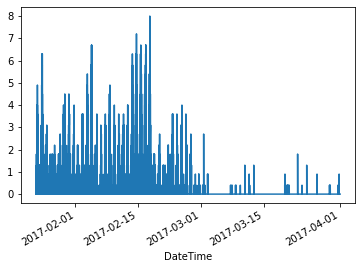

In [78]:
ff['Wind Speed'].plot()

In [79]:

ff.drop('Date' , axis = 1 , inplace = True)
ff.drop('Time' , axis = 1 , inplace = True)

In [80]:
ff.drop('Hi Dir' , axis = 1 , inplace = True)
ff.drop('Wind Dir' , axis = 1 , inplace = True)
ff.drop('Rain' , axis = 1 , inplace = True)
ff.drop('Rain Rate' , axis = 1 , inplace = True)
ff.drop('Solar Rad.' , axis = 1 , inplace = True)
ff.drop('Solar Energy' , axis = 1 , inplace = True)
ff.drop('HI Solar  Rad. ' , axis = 1 , inplace = True)
ff.drop('UV Index' , axis = 1 , inplace = True)
ff.drop('UV Dose' , axis = 1 , inplace = True)
ff.drop('Hi UV ' , axis = 1 , inplace = True)
ff.drop('Heat D-D ' , axis = 1 , inplace = True)
ff.drop('Wind Tx ' , axis = 1 , inplace = True)
ff.drop('Arc. Int.' , axis = 1 , inplace = True)
ff.drop('THSW Index' , axis=1 , inplace=True)

In [81]:
ff.dtypes

Temp Out          float64
Hi Temp           float64
Low Temp          float64
Out Hum             int64
Dew Pt.           float64
Wind Speed        float64
Wind Run          float64
Hi Speed          float64
Wind Chill        float64
Heat Index        float64
THW Index         float64
Bar               float64
Cool D-D          float64
In Temp           float64
In Hum              int64
In Dew            float64
In Heat           float64
In EMC            float64
In Air Density    float64
ET                float64
Wind Samp           int64
ISS Recept        float64
dtype: object

In [82]:
ff.isna().any()

Temp Out           True
Hi Temp            True
Low Temp           True
Out Hum           False
Dew Pt.            True
Wind Speed        False
Wind Run          False
Hi Speed          False
Wind Chill         True
Heat Index         True
THW Index          True
Bar               False
Cool D-D           True
In Temp           False
In Hum            False
In Dew            False
In Heat           False
In EMC            False
In Air Density    False
ET                False
Wind Samp         False
ISS Recept        False
dtype: bool

In [83]:
ff_res=ff.interpolate(method='time')

In [84]:
ff_res.head(1)

,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Run,Hi Speed,Wind Chill,Heat Index,...,Cool D-D,In Temp,In Hum,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,ISS Recept
DateTime,,,,,,,,,,,,,,,,,,,,,
2017-01-23 05:01:00,71.1,71.1,71.1,86,66.7,0.0,0.0,0.0,71.1,73.0,...,0.004,86.5,49,65.1,88.9,8.85,1.1412,0.0,24,100.0


In [85]:
ff_res.isna().any()

Temp Out          False
Hi Temp           False
Low Temp          False
Out Hum           False
Dew Pt.           False
Wind Speed        False
Wind Run          False
Hi Speed          False
Wind Chill        False
Heat Index        False
THW Index         False
Bar               False
Cool D-D          False
In Temp           False
In Hum            False
In Dew            False
In Heat           False
In EMC            False
In Air Density    False
ET                False
Wind Samp         False
ISS Recept        False
dtype: bool

<AxesSubplot:xlabel='DateTime'>

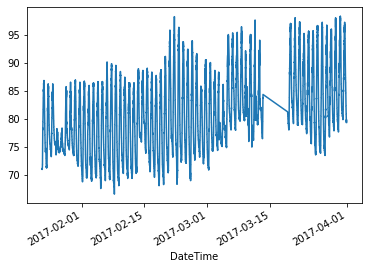

In [86]:
ff_res['Temp Out'].plot()

<AxesSubplot:xlabel='DateTime'>

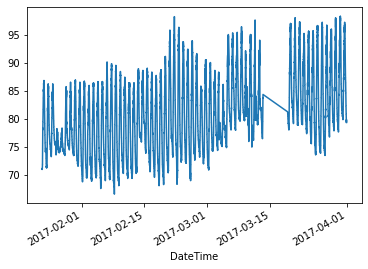

In [87]:
ff['Temp Out'].plot()

In [88]:
ff.head(1)

,Temp Out,Hi Temp,Low Temp,Out Hum,Dew Pt.,Wind Speed,Wind Run,Hi Speed,Wind Chill,Heat Index,...,Cool D-D,In Temp,In Hum,In Dew,In Heat,In EMC,In Air Density,ET,Wind Samp,ISS Recept
DateTime,,,,,,,,,,,,,,,,,,,,,
2017-01-23 05:01:00,71.1,71.1,71.1,86,66.7,0.0,0.0,0.0,71.1,73.0,...,0.004,86.5,49,65.1,88.9,8.85,1.1412,0.0,24,100.0


In [89]:
ff_res_targets = ff_res[target_names].shift(-shift_steps)

In [90]:
b_test = ff_res_targets[0:-shift_steps].values

In [91]:
a_test = ff_res.values

In [92]:
print("Min:", np.min(a_test))
print("Max:", np.max(a_test))

Min: 0.0
Max: 763.6


In [93]:
ff.dropna(axis = 0 , how = 'any' , inplace=True)

In [94]:
ff.isna().any()

Temp Out          False
Hi Temp           False
Low Temp          False
Out Hum           False
Dew Pt.           False
Wind Speed        False
Wind Run          False
Hi Speed          False
Wind Chill        False
Heat Index        False
THW Index         False
Bar               False
Cool D-D          False
In Temp           False
In Hum            False
In Dew            False
In Heat           False
In EMC            False
In Air Density    False
ET                False
Wind Samp         False
ISS Recept        False
dtype: bool

In [95]:
a_scaler = MinMaxScaler()

In [96]:
b_scaler = MinMaxScaler()

In [97]:
b_test_scaled = b_scaler.fit_transform(b_test)

In [98]:
a_test_scaled = a_scaler.fit_transform(a_test)

In [99]:
def plot_comparison(start_idx, length=100, train=True):
    
    if train:
        # Use training-data.
        x = x_train_scaled
        y_true = y_train
    else:
        # Use test-data.
        x = a_test_scaled
        y_true = b_test
    
    # End-index for the sequences.
    end_idx = start_idx + length
    
    # Select the sequences from the given start-index and
    # of the given length.
    x = x[start_idx:end_idx]
    y_true = y_true[start_idx:end_idx]
    
    # Input-signals for the model.
    x = np.expand_dims(x, axis=0)

    # Use the model to predict the output-signals.
    y_pred = model.predict(x)
    
    ''' The output of the model is between 0 and 1.
     Do an inverse map to get it back to the scale
     of the original data-set.'''
    y_pred_rescaled = y_scaler.inverse_transform(y_pred[0])
    
    for signal in range(len(target_names)):
        # Get the output-signal predicted by the model.
        signal_pred = y_pred_rescaled[:, signal]
    
        # Get the true output-signal from the data-set.
        signal_true = y_true[:, signal]

        # Make the plotting-canvas bigger.
        plt.figure(figsize=(15,5))
        
        # Plot and compare the two signals.
        plt.plot(signal_true, label='true')
        plt.plot(signal_pred, label='pred')
        
        # Plot grey box for warmup-period.
        p = plt.axvspan(0, warmup_steps, facecolor='black', alpha=0.15)
        
        plt.ylabel(target_names[signal])
        plt.legend()
        plt.show()

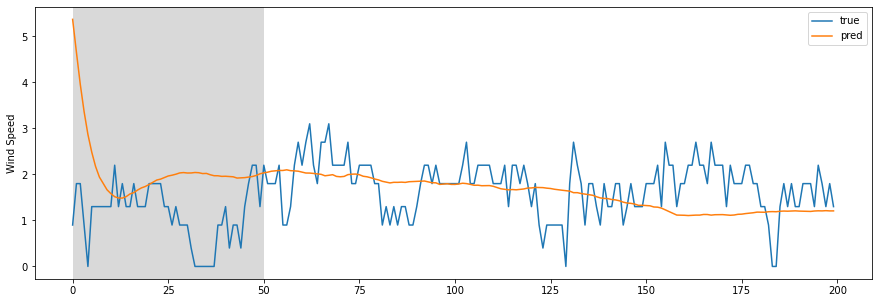

In [100]:
plot_comparison(start_idx=4000, length=200, train=True)

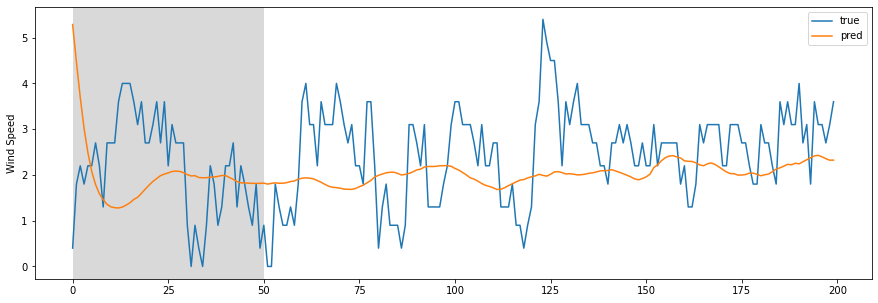

In [101]:
plot_comparison(start_idx=80000, length=200, train=True)


<AxesSubplot:xlabel='DateTime'>

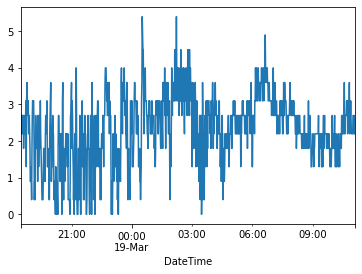

In [102]:
df['Wind Speed'][80000:80000+1000].plot()

<AxesSubplot:xlabel='DateTime'>

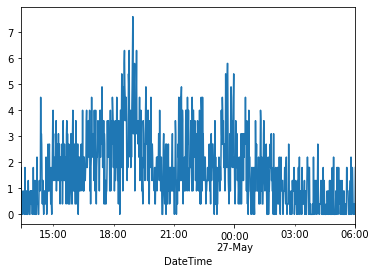

In [103]:
df['Wind Speed'][98994+80000 : 98994 + 80000 + 1000].plot()

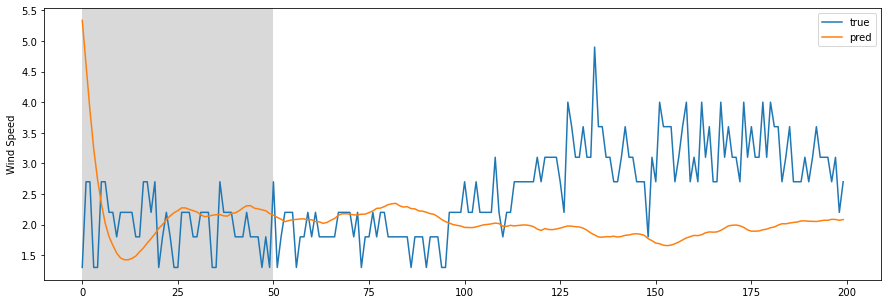

In [106]:
plot_comparison(start_idx=1000, length=200, train=True)

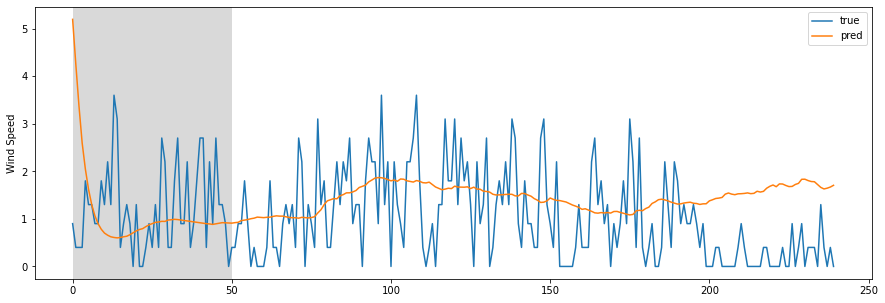

In [115]:
plot_comparison(start_idx=14700, length=240, train=False)